In [1]:
import os
import matplotlib.pyplot as plt

# Load standard libs
import sys
from neuroencoders.utils.backend import pd

import numpy as np

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
nameExp = "STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer"
jsonPath = None
windowSizeMS = [108]
mode = "ann"
target = "pos"
phase = "pre"
nEpochs = 200
mouse = "905"
manipe = "PAG"

from neuroencoders.utils.MOBS_Functions import path_for_experiments_df


Dir = path_for_experiments_df("Sub", nameExp)

In [4]:
mice_nb = [
    "M1199_PAG",
    "M994_PAG",
    "M1182_PAG",
    "M1239_PAG",
    "M1162_PAG",
    "M905_PAG",
    "M1239_MFB",
    "M1162_MFB",
    "M1117_MFB",
    "M1168_MFB",
    "M1199_MFB1",
    "M1199_MFB2",
    "M1230_Known",
    "M1230_Novel",
    "M1199_reversal",
]
mice_names = [ m.split("_")[0].split("M")[1] for m in mice_nb]
mice_manipes = [ m.split("_")[1] for m in mice_nb]
# if mouse manipe is a string (eg mfb or pag) followed by a number, keep only the manipe name and add the number to exp_indices (else add 0 to exp_indices)
exp_indices = []
for m in mice_manipes:
    if m[-1].isdigit():
        exp_indices.append(int(m[-1]))
        mice_manipes[mice_manipes.index(m)] = m[:-1]
    else:
        exp_indices.append(0)

# load results (different strides)

In [5]:
from neuroencoders.utils.MOBS_Functions import Results_Loader, Mouse_Results

In [6]:
try:
    # warning: heavy loader with bayes results
    loader_all = Results_Loader.from_pickle(
        "/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/consensus_noBayesjzjz.pickle"
    )
except:
    loader_all = Results_Loader(
        dir=Dir,
        mice_nb=mice_names,
        mice_manipes=mice_manipes,
        exp_indices = exp_indices,
        target="PosAndHeadDirectionAndThigmo",
        timeWindows=windowSizeMS,
        phases=["pre", "cond", "post"],
        template="pre",
        verbose=False,
        which="ann",
        load_trainers_at_init = False,
        load_at_init = True,
        load_ann=False,
        load_bayes=False,
        load_bayesMatrices=False,
        load_pickle=True,
        deviceName="cpu",
        extract_spikes_count=False,
    )


Results_Loader object loaded from /home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/consensus_noBayesjzjz.pickle


In [27]:
loader_all.save("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/consensus_noBayesjzjz.pickle")

In [7]:
# check if nameExp contains "LSTM" or "Transformer" to set the ann_mode row by row
loader_all.results_df["ann_mode"] = "Transformer"
loader_all.results_df.loc[
    loader_all.results_df["nameExp"].str.contains("LSTM"), "ann_mode"
] = "LSTM"

In [8]:
loader_all.results_df.sort_values(by=["ann_mode", "mouse_name", "phase"], inplace=True)

In [9]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linearPred', 'featurePred',
       'featureTrue', 'linearTrue', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'error', 'mean_error', 'lin_error',
       'mean_lin_error', 'predLossThreshold', 'mean_error_selected',
       'asymmetry_index_on_selected_predicted', 'lin_error_selected',
       'mean_lin_error_selected', 'asymmetry_index_on_predicted',
       'true_binary_direction', 'predicted_binary_direction',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asym

In [18]:
loader_all.apply_analysis()

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,mean_lin_error_selected,asymmetry_index_on_predicted,true_binary_direction,predicted_binary_direction,training_asymmetry_index,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized
0,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1117,MFB,cond,108,2.063718,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.5230964086687275, 0.9635114430407559, 2.54...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5103733225940958, 0.5103733225940958, 0.510...",...,0.326052,0.293612,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, ...",0.448039,4.606110,0.655327,0.755109,0.063744,0.073450
1,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1117,MFB,post,108,5.729279,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.5400851003553531, 0.9546482240980327, -0.0...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.5227936589315799, 0.5227936589315799, 0.522...",...,0.473626,0.429024,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, ...",0.448039,12.787446,0.957558,1.956389,0.033550,0.068547
2,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1117,MFB,pre,108,0.448039,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.08928227284151798, 0.031808919994720394, -...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.009595959792018636, 0.009595959792018636, 0...",...,0.282627,0.438494,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, ...",0.448039,1.000000,0.978696,1.460118,0.438494,0.654190
3,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1117,MFB,training,108,0.448039,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.3965471685398473, 0.929816128045927, -2.62...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.4320720024770645, 0.4320720024770645, 0.432...",...,0.055647,0.446135,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 0, 0, 0, 1, 1, 1, 0, 0, 0, 1, 1, 1, ...",0.448039,1.000000,0.995749,2.074901,0.446135,0.929638
5,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,MFB,cond,108,3.366857,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.26783386807114895, 0.8389348243362977, 0.6...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.3608926695896948, 0.3608926695896948, 0.360...",...,0.318585,0.715427,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...",1.016456,3.312349,0.703845,0.695448,0.215988,0.213411
7,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,MFB,post,108,1.968388,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.7212913605450971, 0.9662127603661191, 0.29...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.636065675722214, 0.636065675722214, 0.63606...",...,0.405740,0.514263,"[0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, ...","[1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, ...",1.016456,1.936521,0.505937,1.106268,0.265560,0.580667
9,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,MFB,pre,108,1.016456,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.59992405957313, 0.9183668269075238, 1.2224...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,0.234896,0.785753,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, ...","[1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, ...",1.016456,1.000000,0.773033,1.163956,0.785753,1.183110
11,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,MFB,training,108,1.016456,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.8622632105210867, 0.028524433536982814, 2....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863638134089385, 0.9

In [19]:
loader_all.results_df.query("mouse_name == 'M1199PAG' & winMS == 108 & phase == 'pre'")["results"].iloc[0].load_trainers("ann")

I0000 00:00:1779043643.370833 4113855 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 10182 MB memory:  -> device: 0, name: NVIDIA RTX 2000 Ada Generation, pci bus id: 0000:ac:00.0, compute capability: 8.9


Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0113


In [23]:
ann = loader_all.results_df.query("mouse_name == 'M1199PAG' & winMS == 108 & phase == 'pre'")["results"].iloc[0].ann

In [24]:
res = loader_all.results_df.query("mouse_name == 'M1199PAG' & winMS == 108 & phase == 'pre'")["results"].iloc[0]

In [5]:
import neuroencoders.utils.MOBS_Functions as mf
nameExp = "STRIDE_4_consensus_v1_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_Transformer"
Dir = mf.path_for_experiments_df("Sub", nameExp)
windowSizeMS = [252]
mode = "ann"
which = "both"
target = "PosAndHeadDirectionAndThigmo"
phase = "pre"
nEpochs = 200 
mouse = "1199"
manipe = "PAG"
deviceName = "GPU"
res = Mouse_Results(Dir = Dir, mouse_name=mouse, manipe=manipe, target=target, 
                        nameExp=nameExp, nEpochs=nEpochs, phase=phase, 
                        deviceName=deviceName, windows=windowSizeMS,
                        isTransformer = "LSTM" not in nameExp, denseweight= False, 
                        transform_w_log = False,
                        which = which,
                        isPredLoss = False,
                        GaussianHeatmap = True, load_trainers_at_init = True, load_bayes = True,
                        load_bayesMatrices = True
                    )

Path for 1199 found: /media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1199_PAG
Windows found for 1199: ['252']
/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1199_PAG/STRIDE_4_consensus_v1_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_Transformer/results


/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/tables/attributeset.py:295: DataTypeWarning: Unsupported type for attribute 'MATLAB_fields' in node 'behavior'. Offending HDF5 class: 9
  value = self._g_getattr(self._v_node, name)
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/utils/global_classes.py:457: UserWarning: old_positions already exist,meaning you already ran the true target ! beware.
  warn(


found data_helper, using its custom lines
Linearization points have been created before


/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


None
Using dropoutLSTM = 0.15
None
Using dropoutLSTM = 0.15
Memory growth set for device: PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


I0000 00:00:1769788268.248996 3413022 gpu_device.cc:2022] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 12217 MB memory:  -> device: 0, name: NVIDIA RTX 2000 Ada Generation, pci bus id: 0000:ac:00.0, compute capability: 8.9


maze_points shape: (100, 2)
ts_proj shape: (100,)
Setting up GaussianHeatmapLayer...
iter 0: gamma=1.000, max=5.0000, avg_local=0.0037
dim_factor: 3
project transformer: True
Output dimension: 4
Using Group Attention Fusion for feature fusion
Using Transformer architecture !


/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/keras/src/layers/layer.py:970: UserWarning: Layer 'lambda' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/keras/src/layers/layer.py:970: UserWarning: Layer 'lambda_1' (of type Lambda) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/keras/src/layers/layer.py:970: UserWarning: Layer 'positional_encoding' (of type PositionalEncoding) was passed an input with a mask attached to it. However, this layer does not support masking and will 

Using multi-column loss
Using contrastive loss
output shape: (128, 2027)
truePos shape: (None, 4)
Reading saved cluster csv file


100%|██████████| 4/4 [00:10<00:00,  2.66s/it]
2026-01-30 16:51:21,279 - INFO - Training data saved with (10173, 2) valid positions.
2026-01-30 16:51:21,279 - INFO - Initializing spike matrices for 4 tetrodes...


finished reading


2026-01-30 16:51:25,119 - INFO - Loaded existing Bayesian matrices.
2026-01-30 16:51:25,120 - INFO - Using pre-existing linear ordering of neurons found in pickle file.


======================M1199=======================
Mouse_Results for 1199 (PAG)
Experiment: STRIDE_4_consensus_v1_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_Transformer
Target: PosAndHeadDirectionAndThigmo
Phase: pre
Path: /media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1199_PAG
Windows: 252


In [6]:
res.bayes._load_linear_spike_sorting()

2026-01-30 16:51:25,526 - INFO - Loading linear spike sorting data...
  0%|          | 0/4 [00:00<?, ?it/s]

Importing sorted spikes from Neuroscope files from electrodes group #0


 25%|██▌       | 1/4 [00:00<00:02,  1.09it/s]

Importing sorted spikes from Neuroscope files from electrodes group #1


 50%|█████     | 2/4 [00:01<00:01,  1.25it/s]

Importing sorted spikes from Neuroscope files from electrodes group #2


 75%|███████▌  | 3/4 [00:02<00:00,  1.11it/s]

Importing sorted spikes from Neuroscope files from electrodes group #3


100%|██████████| 4/4 [00:03<00:00,  1.24it/s]


In [7]:
res.bayes._load_shankwise_spike_sorting()

2026-01-30 16:51:29,075 - INFO - Loading linear spike sorting data...
  0%|          | 0/4 [00:00<?, ?it/s]

Importing sorted spikes from Neuroscope files from electrodes group #0


 25%|██▌       | 1/4 [00:00<00:02,  1.13it/s]

Importing sorted spikes from Neuroscope files from electrodes group #1


 50%|█████     | 2/4 [00:01<00:01,  1.25it/s]

Importing sorted spikes from Neuroscope files from electrodes group #2


 75%|███████▌  | 3/4 [00:02<00:00,  1.09it/s]

Importing sorted spikes from Neuroscope files from electrodes group #3


100%|██████████| 4/4 [00:03<00:00,  1.23it/s]

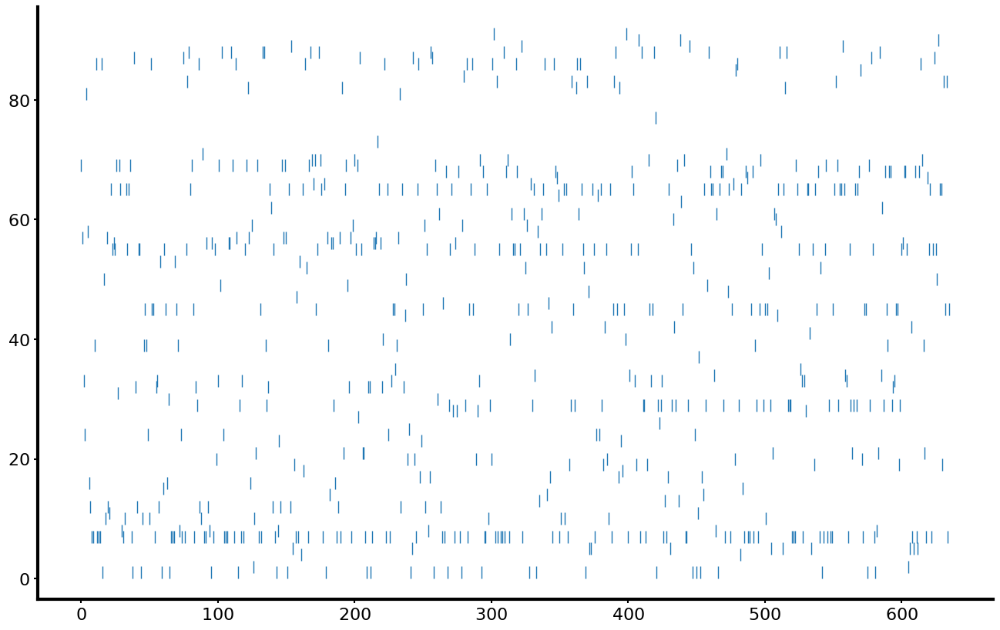

In [8]:
plt.plot(res.bayes.linear_spike_labels[::10000], "|")

In [9]:
res.data_helper.get_true_target(252, res.l_function, in_place = True, speedMask = True)

/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/utils/global_classes.py:457: UserWarning: old_positions already exist,meaning you already ran the true target ! beware.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/shapely/measurement.py:81: RuntimeWarning: invalid value encountered in distance
  return lib.distance(a, b, **kwargs)


array([[        nan,         nan,         nan,         inf],
       [        nan,         nan,         nan,         inf],
       [        nan,         nan,         nan,         inf],
       ...,
       [ 0.0659093 ,  0.03376651, -0.64352163,  0.03376651],
       [ 0.0664273 ,  0.03169172, -0.64352163,  0.03169172],
       [ 0.06422408,  0.0342733 , -0.64352163,  0.0342733 ]])

In [10]:
ann = res.ann

In [7]:
T = ann.test(
    res.data_helper.fullBehavior,
    fit_temperature=True,
    useTrain=True,
    useTest=False,
    windowSizeMS=252,
    useSpeedFilter=True,
    isPredLoss=False,
    strideFactor=4,
)

NameError: name 'ann' is not defined

In [206]:
ann.test(
    res.data_helper.fullBehavior,
    windowSizeMS = 252,
    useTrain = True,
    useTest = False,
    phase = "training_shuffled",
    T_scaling = T,
    strideFactor = 4,
    extract_spikes_counts = True,
    random_spiking = True,
    l_function = res.l_function
)

Loading the weights of the trained network


/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:797: UserWarning: Skipping variable loading for optimizer 'adamw', because it has 2 variables whereas the saved optimizer has 268 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


Adding train epochs for testing
No data augmentation for test dataset
Shuffling spike indices within each group for null hypothesis/control.
finalizing the test dataset pipeline... Will move data to /device:GPU:0
Starting synchronized inference loop...


Inferring: 0it [00:00, ?it/s]/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/keras/src/layers/layer.py:970: UserWarning: Layer 'positional_encoding' (of type PositionalEncoding) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(
Inferring: 115it [00:32,  3.55it/s]


Concatenating results...
Looking up speed mask from original array...
Decoding Gaussian Heatmaps...


{'featurePred': array([[0.5888889 , 0.87777776, 2.6576805 , 0.08420813],
        [0.14444444, 0.76666665, 2.9203513 , 0.09706351],
        [0.56666666, 0.87777776, 3.091136  , 0.08674563],
        ...,
        [0.7888889 , 0.87777776, 4.1996336 , 0.08462169],
        [0.8111111 , 0.87777776, 4.0788794 , 0.08536368],
        [0.87777776, 0.9444444 , 5.1851597 , 0.07735267]], dtype=float32),
 'featureTrue': array([[ 0.23809911,  0.80494373, -2.89224859,  0.11309179],
        [ 0.22347367,  0.80074616, -3.03055958,  0.12442089],
        [ 0.2061004 ,  0.80167165, -3.08963395,  0.14085632],
        ...,
        [ 0.92630059,  0.89334505, -0.90883805,  0.07369941],
        [ 0.92633386,  0.89238436, -0.46788355,  0.07366614],
        [ 0.92633386,  0.89238436, -0.46788355,  0.07366614]]),
 'times': array([10803.013, 10803.057, 10803.128, ..., 12771.719, 12771.786,
        12771.845], dtype=float32),
 'times_behavior': array([10803.116, 10803.186, 10803.256, ..., 12771.884, 12771.953,
      

In [11]:
import dill as pickle
import ast
# with open("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M1199_PAG/last_bayes/results/252/decoding_results_pre_shuffled.pkl", "rb") as f:
#     shuffled_dec = pickle.load(f)

with open("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M1199_PAG/last_bayes/results/252/decoding_results_pre.pkl", "rb") as f:
    true_dec = pickle.load(f)   

with open("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M1199_PAG/last_bayes/results/252/decoding_results_training.pkl", "rb") as f:
    true_train = pickle.load(f)   

# with open("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M1199_PAG/last_bayes/results/252/decoding_results_training_shuffled.pkl", "rb") as f:
#     shuffled_train = pickle.load(f)   
    
# with open("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M1199_PAG/STRIDE_4_consensus_v1_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_Transformer/results/252/spikes_count_training.csv") as f:
#     spikes_count_training = pd.read_csv(f)
    
# with open("/home/mickey/Documents/Theotime/DimaERC2/neuroencoders_1021/_work/M1199_PAG/STRIDE_4_consensus_v1_factor3_dim64_3Transformers_lr001_nHeads4_dropout015_cLambda07_Transformer/results/252/spikes_count_pre.csv") as f:
#     spikes_count_dec = pd.read_csv(f)
    
# spikes_count_dec["indexInDat"] = spikes_count_dec["indexInDat"].apply(ast.literal_eval)
# spikes_count_training["indexInDat"] = spikes_count_training["indexInDat"].apply(ast.literal_eval)

In [12]:
%matplotlib qt

In [43]:
res.show_movie(phase = "pre")

Speed mask applied: False.
[]


/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/importData/epochs_management.py:367: UserWarning: Tolerance is set to True, will compare against apparent sampling rate.
  warn(
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/importData/gui_elements.py:725: UserWarning: Predicted positions do not contain head direction or speed. Computing them from positions.
  warn(


Setting up multipanel plot (trajectory + linear position movie)...
Using speed for color coding!


In [19]:
from neuroencoders.resultAnalysis.print_results import overview_fig
to_plot = true_train
overview_fig(
    pos = to_plot["featureTrue"],
    inferring = to_plot["featurePred"],
    selection = np.ones_like(to_plot["speedMask"]),
    dimOutput = 2,
    show = True,
    save = False,
    speedMask = to_plot["speedMask"],
    training_data = ann.training_data,
    target = ann.target,
    timeStepsPred = to_plot["times"],
    close = False
)

/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/print_results.py:585: UserWarning: posIndex not provided, using range(pos.shape[0]) as posIndex.
  warnings.warn("posIndex not provided, using range(pos.shape[0]) as posIndex.")


In [13]:
from neuroencoders.utils.backend import pd 
dataset = pd.read_parquet("/home/mickey/download/M1199_PAG_data_stride4_win252_test.parquet")

In [25]:
ann.featDesc

{'pos_index': FixedLenFeature(shape=[], dtype=tf.int64, default_value=None),
 'pos': FixedLenFeature(shape=[2], dtype=tf.float32, default_value=None),
 'length': FixedLenFeature(shape=[], dtype=tf.int64, default_value=None),
 'groups': VarLenFeature(dtype=tf.int64),
 'time': FixedLenFeature(shape=[], dtype=tf.float32, default_value=None),
 'time_behavior': FixedLenFeature(shape=[], dtype=tf.float32, default_value=None),
 'indexInDat': VarLenFeature(dtype=tf.int64),
 'group0': VarLenFeature(dtype=tf.float32),
 'group1': VarLenFeature(dtype=tf.float32),
 'group2': VarLenFeature(dtype=tf.float32),
 'group3': VarLenFeature(dtype=tf.float32)}

In [14]:
res.bayes.clusterData

{'Spike_labels': [array([[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 1., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]]),
  array([[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 1., ..., 0., 0., 0.],
         ...,
         [1., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]]),
  array([[0., 0., 0., ..., 0., 0., 1.],
         [1., 0., 0., ..., 0., 0., 0.],
         [1., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 1., 0.]]),
  array([[1., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
  

In [15]:
sorted_indices_list = res.bayes.spike_index
sorted_labels_list = res.bayes.spike_labels
# Create a lookup: spike_lookup[shank][indexInDat] = label
spike_lookup = {}
for shank_id in range(len(sorted_indices_list)):
    indices = sorted_indices_list[shank_id]
    labels = sorted_labels_list[shank_id]
    spike_lookup[shank_id] = dict(zip(indices, labels))

In [16]:
import numpy as np
from bisect import bisect_left

def get_nearest_unit(target_idx, shank_idx, sorting_indices, sorting_labels, tol=16):
    """Binary search for the nearest sorted unit within tolerance."""
    # Get the arrays for the specific shank
    indices = sorting_indices[shank_idx]
    labels = sorting_labels[shank_idx]
    
    if len(indices) == 0: return "Unsorted"
    
    pos = bisect_left(indices, target_idx)
    best_dist = float('inf')
    best_label = "Unsorted"
    
    # Check current and previous position for the closest match
    for i in [pos - 1, pos]:
        if 0 <= i < len(indices):
            dist = abs(indices[i] - target_idx)
            if dist <= tol and dist < best_dist:
                best_dist = dist
                best_label = labels[i]
    return best_label

# Mapping function for your DataFrame
def analyze_timepoint(row):
    spiking_groups = row['groups'] # These are 0, 1, 2, or 3
    spike_indices = row['indexInDat']
    
    matched_units = []
    for g, idx in zip(spiking_groups, spike_indices):
        # We use 'g' as the shank index because they map 1:1 here
        unit = get_nearest_unit(idx, g, sorted_indices_list, sorted_labels_list)
        matched_units.append(unit)
        
    # Calculate Concordance
    sorted_count = sum(1 for u in matched_units if u != "Unsorted")
    concordance = sorted_count / len(matched_units) if matched_units else 0
    
    return matched_units, concordance

# Apply to your df
df = dataset.copy()
df[['matched_units', 'concordance']] = df.apply(analyze_timepoint, axis=1, result_type='expand')

In [17]:
%matplotlib inline

<Axes: >

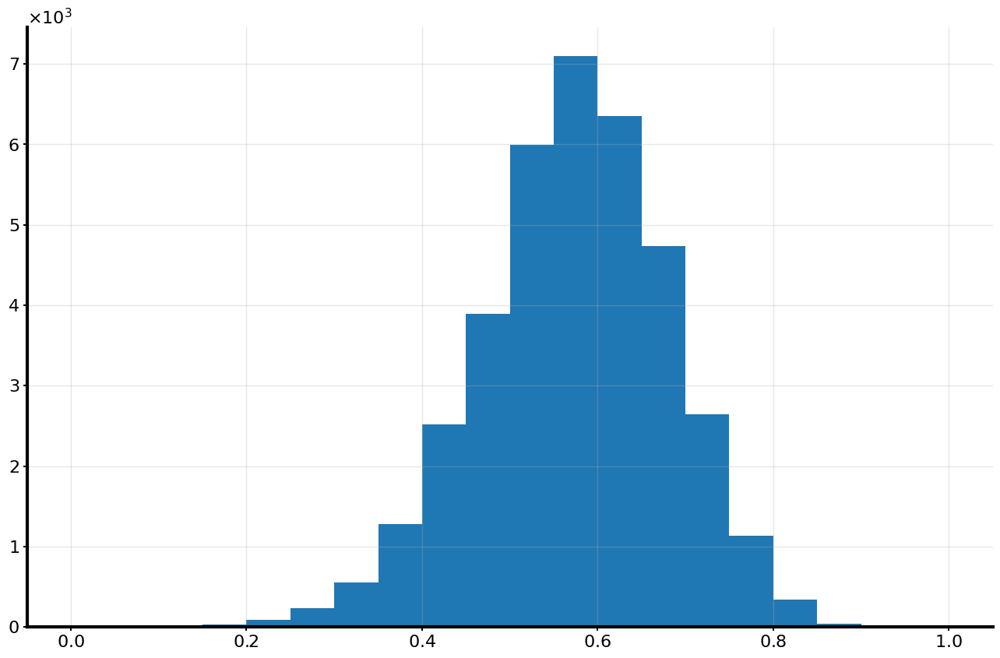

In [18]:
df["concordance"].hist(bins=20)

In [19]:
from neuroencoders.utils.backend import pd
import numpy as np

# Convert true_train to a DataFrame
# Note: Since featurePred/True are (N, 4), they will be stored as objects (arrays) in the cells
df_results_train = pd.DataFrame({
    'pos_index_key': true_train['posIndex'].flatten().astype(int), # Ensure it's 1D for matching
    'featurePred': list(true_train['featurePred']),    # Wrap in list to keep (1,4) per row
    'featureTrue': list(true_train['featureTrue']),
    'linearPred': true_train['linearPred'],
    'linearTrue': true_train['linearTrue']
})
df_results_dec = pd.DataFrame({
    'pos_index_key': true_dec['posIndex'].flatten().astype(int), # Ensure it's 1D for matching
    'featurePred': list(true_dec['featurePred']),    # Wrap in list to keep (1,4) per row
    'featureTrue': list(true_dec['featureTrue']),
    'linearPred': true_dec['linearPred'],
    'linearTrue': true_dec['linearTrue']
})

df_results = pd.concat([df_results_train, df_results_dec], ignore_index=True)


# Unwrap your df's pos_index [val] -> val
df['pos_index_scalar'] = df['pos_index'].apply(lambda x: x[0] if isinstance(x, list) else x).astype(int)

# Perform the Left Merge
# Missing values in true_train will result in NaN/None in the Pred/True columns
merged_df = pd.merge(
    df, 
    df_results, 
    left_on='pos_index_scalar', 
    right_on='pos_index_key', 
    how='left'
).drop(columns=['pos_index_key'])

# Remove any subsequent useless column (featurePred_x and featurePred_y) that might arise from merge
cols_to_drop = [c for c in merged_df.columns if c.endswith('_y')]
cols_to_rename = [c for c in merged_df.columns if c.endswith('_x')]

merged_df = merged_df.drop(columns=cols_to_drop).rename(columns={c: c[:-2] for c in cols_to_rename})

In [20]:
merged_df

,group0,group1,group2,group3,groups,indexInDat,length,pos,pos_index,time,...,indices1,indices2,indices3,matched_units,concordance,pos_index_scalar,featurePred,featureTrue,linearPred,linearTrue
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 2, 3, ...","[0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, ...","[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...","[7, Unsorted, 7, Unsorted, Unsorted, Unsorted,...",0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686
1,"[0.784368, -1.7689252, -0.44398087, -0.8920738...","[-1.6977104, 2.9279904, -1.1033406, 3.0421946,...","[-2.0365474, -7.452189, -7.893022, -8.325975, ...","[-11.299735, -10.123135, -11.502652, -9.848628...","[1, 1, 2, 0, 0, 2, 2, 1, 0, 1, 2, 1, 0, 2, 3, ...","[216058792, 216058850, 216058859, 216058864, 2...",[174],"[0.22347367133862373, 0.800746161144787, -3.03...",[156623],[10803.057],...,"[1, 2, 0, 0, 0, 0, 0, 3, 0, 4, 0, 5, 0, 0, 0, ...","[0, 0, 1, 0, 0, 2, 3, 0, 0, 0, 4, 0, 0, 5, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[26, Unsorted, Unsorted, 13, Unsorted, Unsorte...",0.603448,156623,"[0.122222215, 0.85555553, 2.8247092, 0.08943923]","[0.22347367133862373, 0.800746161144787, -3.03...",0.287878,0.268686
2,"[-10.02022, -6.086954, -6.860069, -5.537356, -...","[0.9501192, -1.5824171, 0.14138214, 0.8491379,...","[-1.2598114, -2.3454332, -0.27600998, -2.98506...","[0.71822935, 1.2518461, 1.1214969, -1.0866543,...","[0, 3, 0, 2, 3, 1, 3, 2, 0, 2, 3, 3, 1, 0, 3, ...","[216060113, 216060113, 216060202, 216060229, 2...",[151],"[0.2061004002545895, 0.8016716472082892, -3.08...",[156624],[10803.128],...,"[0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 2, 0, 0, ...","[0, 0, 0, 1, 0, 0, 0, 2, 0, 3, 0, 0, 0, 0, 0, ...","[0, 1, 0, 0, 2, 0, 3, 0, 0, 0, 4, 5, 0, 0, 6, ...","[Unsorted, 88, 7, 55, 88, 32, 77, 57, 7, Unsor...",0.642384,156624,"[0.122222215, 0.85555553, 2.9870934, 0.08745342]","[0.2061004002545895, 0.8016716472082892, -3.08...",0.287878,0.268686
3,"[1.9467939, -0.5754428, 7.013426, 3.2031195, 0...","[8.439164, 8.20685, 9.405653, 9.871229, 3.5198...","[4.5088677, -0.903873, -4.1939816, -5.8106303,...","[-2.1668322, 0.15016645, -4.6185946, -1.856178...","[2, 1, 0, 2, 2, 2, 0, 1, 2, 1, 2, 0, 1, 3, 1, ...","[216061375, 216061440, 216061449, 216061460, 2...",[146],"[0.18725677468503407, 0.8041594979880731, -3.0...",[156625],[10803.183],...,"[0, 1, 0, 0, 0, 0, 0, 2, 0, 3, 0, 0, 4, 0, 5, ...","[1, 0, 0, 2, 3, 4, 0, 0, 5, 0, 6, 0, 0, 0, 0, ...","[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[59, 29, 7, 55, 61, 65, 7, Unsorted, 47, Unsor...",0.630137,156625,"[0.16666666, 0.76666665, 2.9389725, 0.08806967]","[0.18725677468503407, 0.8041594979880731, -3.0...",0.259091,0.268686
4,"[3.7596176, 5.5735974, 0.92455995, -4.5712585,...","[-4.0100446, 0.24802871, -2.173374, -4.3806744...","[-16.650856, -12.55951, -6.3845363, -8.571615,...","[-20.028437, -17.942951, -11.625694, -6.878829...","[3, 2, 0, 3, 2, 0, 3, 3, 2, 1, 2, 1, 2, 2, 0, ...","[216062645, 216062661, 216062664, 216062684, 2...",[155],"[0.17120980423031826, 0.8085996553933661, -3.0...",[156626],[10803.272],...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0, 0, 0, ...","[0, 1, 0, 0, 2, 0, 0, 0, 3, 0, 4, 0, 5, 6, 0, ...","[1, 0, 0, 2, 0, 0, 3, 4, 0, 0, 0, 0, 0, 0, 0, ...","[Unsorted, 65, 7, 84, 56, Unsorted, Unsorted, ...",0.554839,156626,"[0.099999994, 0.87777776, 3.455739, 0.085385084]","[0.17120980423031826, 0.8085996553933661, -3.0...",0.297474,0.278282
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48565,"[-7

In [21]:
def calculate_error(row):
    if ((row['featurePred'] is None) or (np.isnan(row['featurePred']).any()) or (row['featurePred'] is not None and pd.isna(row['featurePred']).any())):
        return None
    return np.linalg.norm(np.array(row['featurePred']) - np.array(row['featureTrue']))

merged_df['decode_error'] = merged_df.apply(calculate_error, axis=1)

In [22]:
def calculate_lin_error(row):
    if ((row['linearPred'] is None) or (np.isnan(row['linearPred'])) or (row['linearPred'] is not None and pd.isna(row['linearPred']))):
        return None
    return np.linalg.norm(np.array(row['linearPred']) - np.array(row['linearTrue']))
merged_df['linear_error'] = merged_df.apply(calculate_lin_error, axis=1)

In [23]:
merged_df

,group0,group1,group2,group3,groups,indexInDat,length,pos,pos_index,time,...,indices3,matched_units,concordance,pos_index_scalar,featurePred,featureTrue,linearPred,linearTrue,decode_error,linear_error
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...","[7, Unsorted, 7, Unsorted, Unsorted, Unsorted,...",0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686,5.567438,0.028788
1,"[0.784368, -1.7689252, -0.44398087, -0.8920738...","[-1.6977104, 2.9279904, -1.1033406, 3.0421946,...","[-2.0365474, -7.452189, -7.893022, -8.325975, ...","[-11.299735, -10.123135, -11.502652, -9.848628...","[1, 1, 2, 0, 0, 2, 2, 1, 0, 1, 2, 1, 0, 2, 3, ...","[216058792, 216058850, 216058859, 216058864, 2...",[174],"[0.22347367133862373, 0.800746161144787, -3.03...",[156623],[10803.057],...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, ...","[26, Unsorted, Unsorted, 13, Unsorted, Unsorte...",0.603448,156623,"[0.122222215, 0.85555553, 2.8247092, 0.08943923]","[0.22347367133862373, 0.800746161144787, -3.03...",0.287878,0.268686,5.856505,0.019191
2,"[-10.02022, -6.086954, -6.860069, -5.537356, -...","[0.9501192, -1.5824171, 0.14138214, 0.8491379,...","[-1.2598114, -2.3454332, -0.27600998, -2.98506...","[0.71822935, 1.2518461, 1.1214969, -1.0866543,...","[0, 3, 0, 2, 3, 1, 3, 2, 0, 2, 3, 3, 1, 0, 3, ...","[216060113, 216060113, 216060202, 216060229, 2...",[151],"[0.2061004002545895, 0.8016716472082892, -3.08...",[156624],[10803.128],...,"[0, 1, 0, 0, 2, 0, 3, 0, 0, 0, 4, 5, 0, 0, 6, ...","[Unsorted, 88, 7, 55, 88, 32, 77, 57, 7, Unsor...",0.642384,156624,"[0.122222215, 0.85555553, 2.9870934, 0.08745342]","[0.2061004002545895, 0.8016716472082892, -3.08...",0.287878,0.268686,6.077780,0.019191
3,"[1.9467939, -0.5754428, 7.013426, 3.2031195, 0...","[8.439164, 8.20685, 9.405653, 9.871229, 3.5198...","[4.5088677, -0.903873, -4.1939816, -5.8106303,...","[-2.1668322, 0.15016645, -4.6185946, -1.856178...","[2, 1, 0, 2, 2, 2, 0, 1, 2, 1, 2, 0, 1, 3, 1, ...","[216061375, 216061440, 216061449, 216061460, 2...",[146],"[0.18725677468503407, 0.8041594979880731, -3.0...",[156625],[10803.183],...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, ...","[59, 29, 7, 55, 61, 65, 7, Unsorted, 47, Unsor...",0.630137,156625,"[0.16666666, 0.76666665, 2.9389725, 0.08806967]","[0.18725677468503407, 0.8041594979880731, -3.0...",0.259091,0.268686,6.027222,0.009596
4,"[3.7596176, 5.5735974, 0.92455995, -4.5712585,...","[-4.0100446, 0.24802871, -2.173374, -4.3806744...","[-16.650856, -12.55951, -6.3845363, -8.571615,...","[-20.028437, -17.942951, -11.625694, -6.878829...","[3, 2, 0, 3, 2, 0, 3, 3, 2, 1, 2, 1, 2, 2, 0, ...","[216062645, 216062661, 216062664, 216062684, 2...",[155],"[0.17120980423031826, 0.8085996553933661, -3.0...",[156626],[10803.272],...,"[1, 0, 0, 2, 0, 0, 3, 4, 0, 0, 0, 0, 0, 0, 0, ...","[Unsorted, 65, 7, 84, 56, Unsorted, Unsorted, ...",0.554839,156626,"[0.099999994, 0.87777776, 3.455739, 0.085385084]","[0.17120980423031826, 0.8085996553933661, -3.0...",0.297474,0.278282,6.499656,0.019193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48565,"[-7.8468366, -3.3413508, -3.0314534, -3.780499...","[-2.2834313, 2.7835107, 4.6610985, 4.1377306, ...","[2.7304745, 0.8491081, 0.53254557, 1.9980954, ...","[3.7052975, 5.182708, 10.917179, 8.98189, 1.31...","[0, 1, 2, 2, 0, 2, 0, 2, 2, 3, 3, 1, 0, 2, 3, ...","[265525292, 265525358, 265525373, 265525401, 2...",[97],"[0.35197907015416835, 0.8499387768323985, 0.18...",[192099],[13276.375],...,"[0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 

In [24]:
# Explode the matched units so each spike has its own row with the associated error
exploded = merged_df.explode('matched_units')

# Filter out rows where the unit is "Unsorted" or "Unknown"
sorted_units_only = exploded[~exploded['matched_units'].isin(["Unsorted", "Unknown_Group"])]

# Group by Neuron and calculate stats
neuron_influence = sorted_units_only.groupby('matched_units').agg(
    avg_error=('decode_error', 'mean'),
    spike_count=('decode_error', 'count'),
    min_error=('decode_error', 'min')
)

# A 'High Influence' neuron is one with high spike_count and LOW avg_error
neuron_influence['score'] = neuron_influence['spike_count'] / (neuron_influence['avg_error'] + 1e-6)
important_neurons = neuron_influence.sort_values(by='score', ascending=False)

# Group by Neuron and calculate stats
linear_neuron_influence = sorted_units_only.groupby('matched_units').agg(
    avg_error=('linear_error', 'mean'),
    spike_count=('linear_error', 'count'),
    min_error=('linear_error', 'min')
)

# A 'High Influence' neuron is one with high spike_count and LOW avg_error
linear_neuron_influence['linear_score'] = linear_neuron_influence['spike_count'] / (linear_neuron_influence['avg_error'] + 1e-6)
linear_important_neurons = linear_neuron_influence.sort_values(by='linear_score', ascending=False)

In [51]:
linear_important_neurons

,avg_error,spike_count,min_error,linear_score
matched_units,,,,
7,0.109296,494234,0.000000,4.521927e+06
55,0.109358,309861,0.000000,2.833433e+06
45,0.106275,212019,0.000000,1.994992e+06
65,0.123268,161063,0.000000,1.306595e+06
29,0.116160,136456,0.000000,1.174719e+06
...,...,...,...,...
43,0.129046,388,0.000000,3.006655e+03
75,0.121062,355,0.000000,2.932366e+03
77,0.093447,268,0.000000,2.867892e+03


In [25]:
important_neurons

,avg_error,spike_count,min_error,score
matched_units,,,,
7,3.704900,494234,0.018999,133400.043594
55,3.743671,309861,0.020635,82769.273698
45,3.928028,212019,0.018999,53975.923921
65,3.524229,161063,0.018999,45701.607918
29,3.707524,136456,0.018999,36805.142093
...,...,...,...,...
43,2.470983,388,0.020635,157.022470
78,3.518123,390,0.077513,110.854528
75,3.769512,355,0.133394,94.176632


In [27]:
exploded

,group0,group1,group2,group3,groups,indexInDat,length,pos,pos_index,time,...,indices3,matched_units,concordance,pos_index_scalar,featurePred,featureTrue,linearPred,linearTrue,decode_error,linear_error
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...",7,0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686,5.567438,0.028788
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...",Unsorted,0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686,5.567438,0.028788
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...",7,0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686,5.567438,0.028788
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...",Unsorted,0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686,5.567438,0.028788
0,"[-2.5076778, -6.0870895, -4.806838, -6.1315207...","[-9.841121, -9.995178, -7.8136635, -4.9847293,...","[5.7833853, 9.249854, 10.872404, 9.778326, 9.9...","[-2.297683, -4.6821604, -2.255348, -5.746957, ...","[0, 3, 0, 3, 1, 3, 3, 0, 2, 0, 3, 0, 3, 1, 1, ...","[216057518, 216057621, 216057656, 216057699, 2...",[153],"[0.2380991101561953, 0.8049437338425552, -2.89...",[156622],[10803.013],...,"[0, 1, 0, 2, 0, 3, 4, 0, 0, 0, 5, 0, 6, 0, 0, ...",Unsorted,0.620915,156622,"[0.122222215, 0.87777776, 2.6734543, 0.08899914]","[0.2380991101561953, 0.8049437338425552, -2.89...",0.297474,0.268686,5.567438,0.028788
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48569,"[4.246921, 5.401758, 5.067441, -3.5595415, -4....","[4.7346177, 3.2529676, 3.2944932, 4.5485024, 5...","[1.6541377, -1.8643007, -1.0617824, -2.168024,...","[5.294457, 1.2068422, 0.43475693, -2.38634, -7...","[3, 2, 2, 0, 2, 3, 2, 3, 3, 3, 3, 1, 1, 2, 1, ...","[265530567, 265530655, 265530685, 265530700, 2...",[57],"[0.35197907015416835, 0.8499387768323985, 0.18...",[192099],[13276.636],...,"[1, 0, 0, 0, 0, 2, 0, 3, 4, 5, 6, 0, 0, 0, 0, ...",Unsorted,0.701754,192099,"[0.4111111, 0.9444444, 5.9089375, 0.06505862]","[0.35197907015416835, 0.8499387768323985, 0.18...",0.441601,0.412711,5.723165,0.028890
48569,"[4.246921, 5.401758, 5.067441, -3.559541

In [28]:
from neuroencoders.importData.epochs_management import inEpochsMask
# dist_p1_p2 = np.sqrt(np.sum((shuffled_dec["featurePred"][:,:2] - true_dec["featurePred"][:,:2])**2, axis = 1))
window_size = 50
try:
    time_min, time_max = df_results["time_behavior"].min(), df_results["time_behavior"].max()
except:
    time_min, time_max = true_dec["times"].min(), true_dec["times"].max()

epochMask = inEpochsMask(res.bayes.spikeMatTimes, [time_min, time_max]).flatten()
try:
    true_error = np.abs(df_results["linearPred"] - df_results["linearTrue"])
except:
    true_error = np.abs(true_dec["linearPred"] - true_dec["linearTrue"])
# shuffled_error = np.abs(shuffled_dec["linearPred"] - shuffled_dec["linearTrue"])

In [29]:
import pykeops
spike_times = res.bayes.spikeMatTimes[epochMask].flatten()
spike_matrix = res.bayes.spikeMatLabels[epochMask]
try:
    pos_times = df_results["time_behavior"].values.flatten()
except:
    pos_times = true_dec["times_behavior"].flatten()
    
try:
    speedMask = df_results["speedMask"].values.flatten().astype(bool)
except:
    speedMask = true_dec["speedMask"].flatten().astype(bool)
spike_timesJv = pykeops.numpy.LazyTensor(spike_times[:,None], axis = 0)
pos_timesJv = pykeops.numpy.Vj(pos_times.astype("float64")[:,None])
matching_pos_indices = (pos_timesJv - spike_timesJv).abs().argmin_reduction(axis = 1)

In [55]:
linear_important_neurons.index

Index([ 7, 55, 45, 65, 29, 68, 86, 61,  1, 70, 56, 91,  5, 69, 32, 59, 33, 12,
       57, 87, 21, 81, 85, 28, 35, 19, 66, 42, 13, 89, 88, 83, 39,  8, 17, 30,
       24, 84, 26, 34, 60, 47, 20, 50, 10, 40, 36, 64, 25, 58, 54,  9, 46, 90,
       37, 16, 62, 22,  4, 48, 15, 79,  2,  3, 23, 67, 71, 52, 51, 44, 73,  6,
       82, 80, 18, 49, 11, 27, 53, 41, 63, 74, 72, 31, 14, 38, 43, 75, 77, 78,
       76],
      dtype='int64', name='matched_units')

Neuron 7


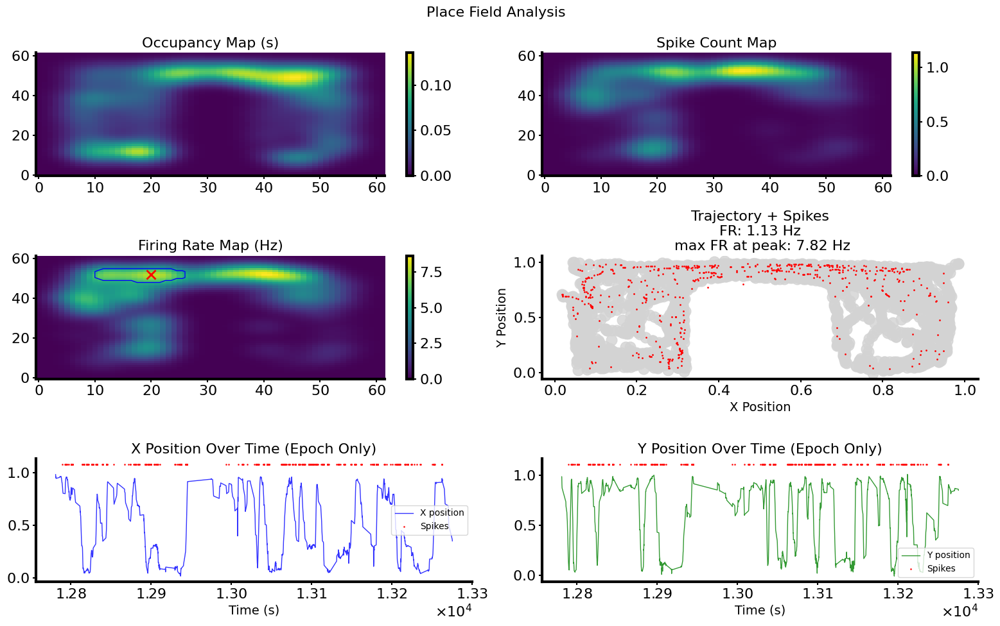


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 1.13 Hz
Spatial Information: -1.366 bits/spike
Sparsity: 2.255
Specificity: 0.000
Peak Firing Rate: 7.82 Hz
Neuron 55


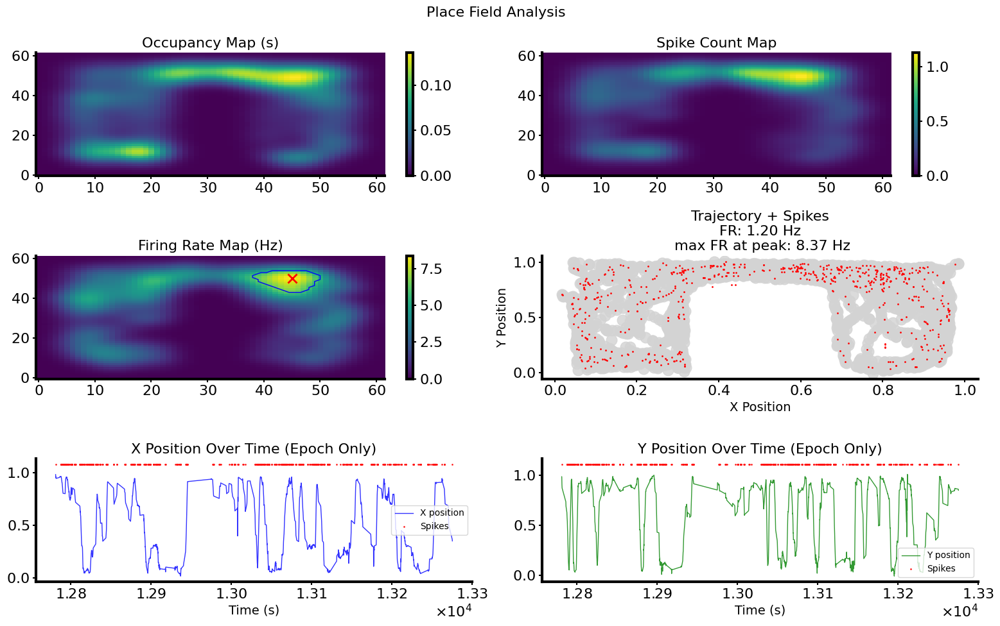


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 1.20 Hz
Spatial Information: -2.070 bits/spike
Sparsity: 2.717
Specificity: 0.000
Peak Firing Rate: 8.37 Hz
Neuron 45


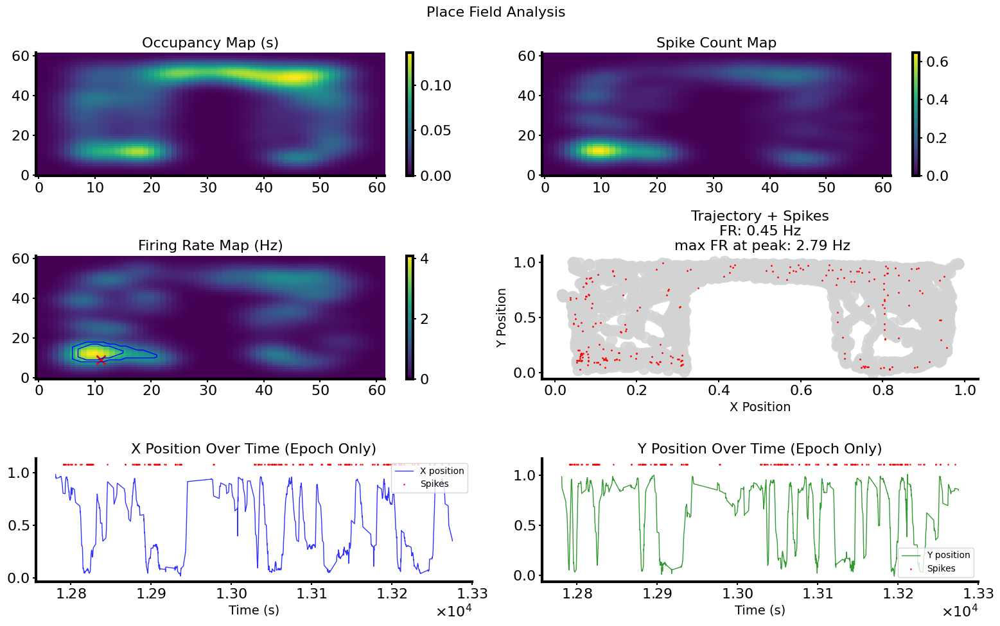


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 0.45 Hz
Spatial Information: -0.795 bits/spike
Sparsity: 3.293
Specificity: 0.000
Peak Firing Rate: 2.79 Hz
Neuron 65


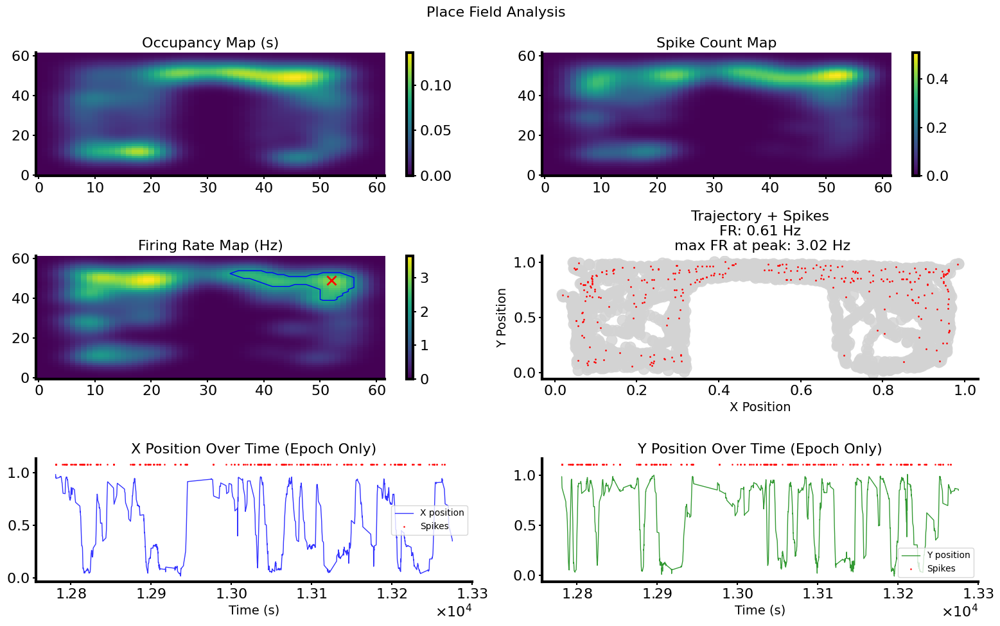


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 0.61 Hz
Spatial Information: -1.138 bits/spike
Sparsity: 3.596
Specificity: 0.000
Peak Firing Rate: 3.02 Hz
Neuron 29


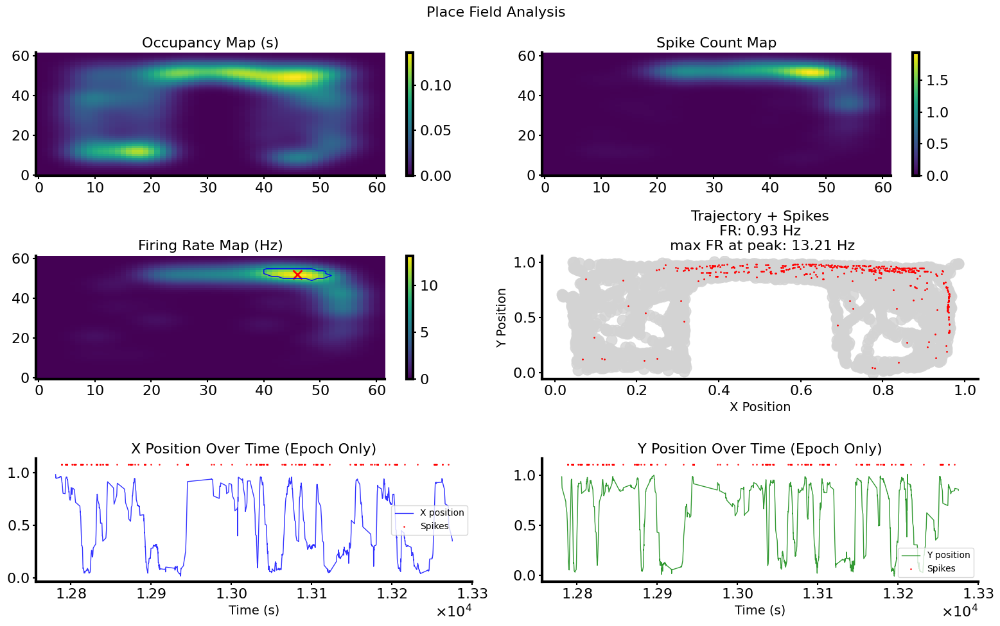


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 0.93 Hz
Spatial Information: 0.366 bits/spike
Sparsity: 1.391
Specificity: 0.000
Peak Firing Rate: 13.21 Hz
Neuron 68


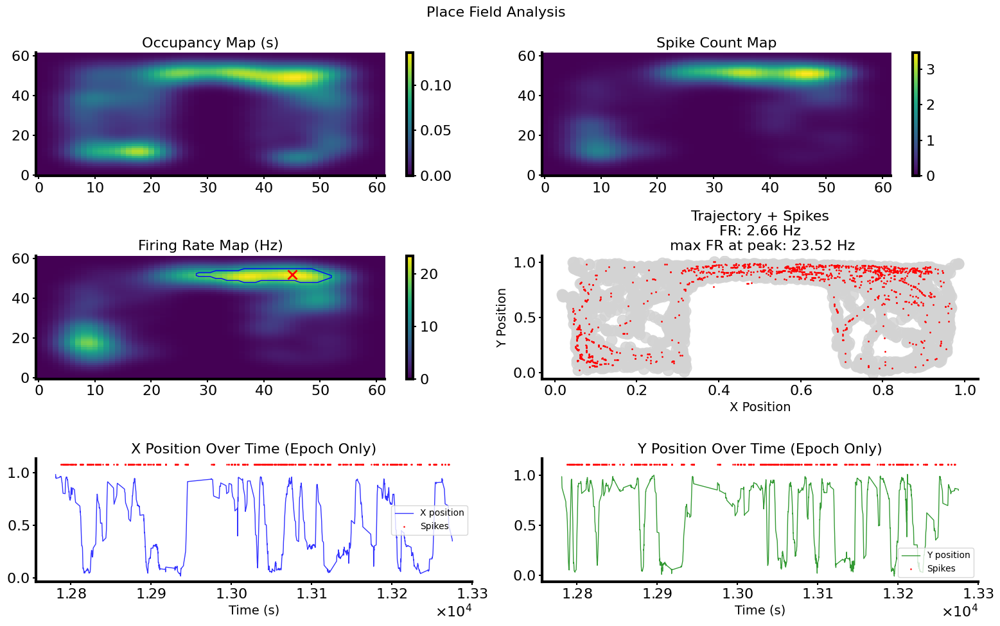


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 2.66 Hz
Spatial Information: -1.813 bits/spike
Sparsity: 1.758
Specificity: 0.000
Peak Firing Rate: 23.52 Hz
Neuron 86


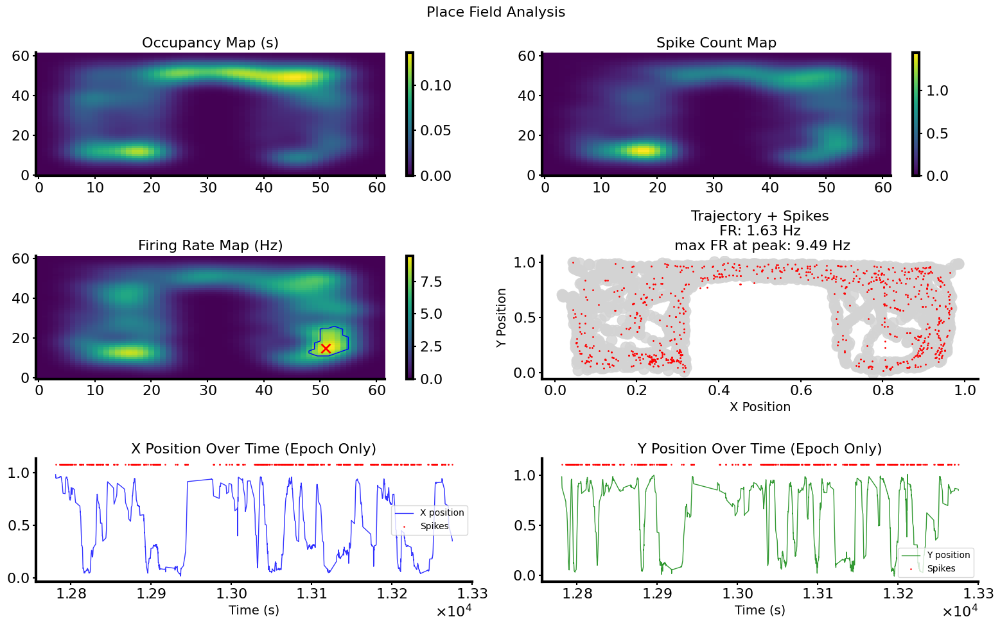


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 1.63 Hz
Spatial Information: -3.405 bits/spike
Sparsity: 3.657
Specificity: 0.000
Peak Firing Rate: 9.49 Hz
Neuron 61


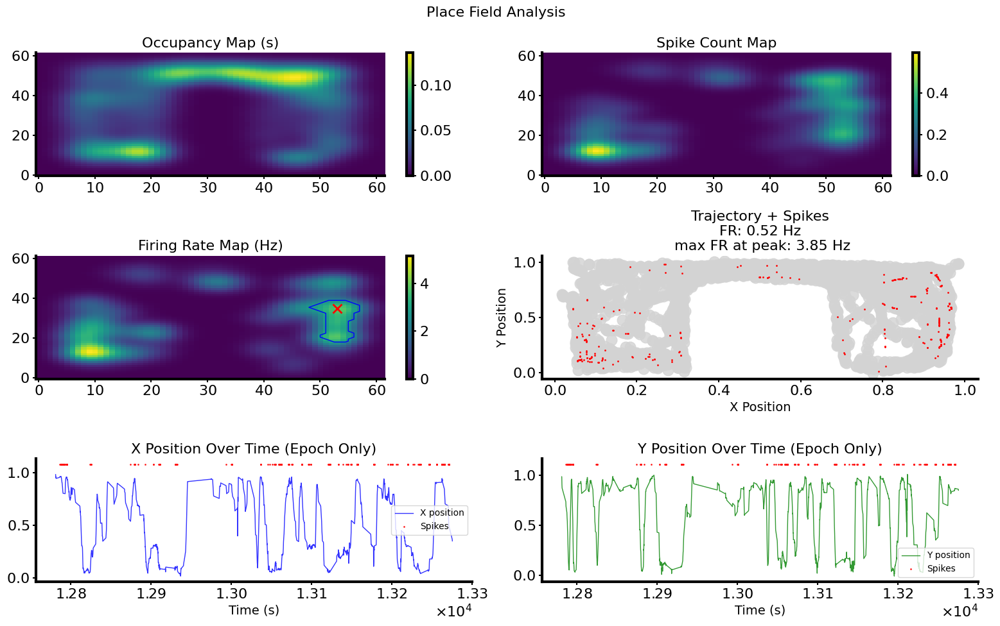


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 0.52 Hz
Spatial Information: -0.684 bits/spike
Sparsity: 2.977
Specificity: 0.000
Peak Firing Rate: 3.85 Hz
Neuron 1


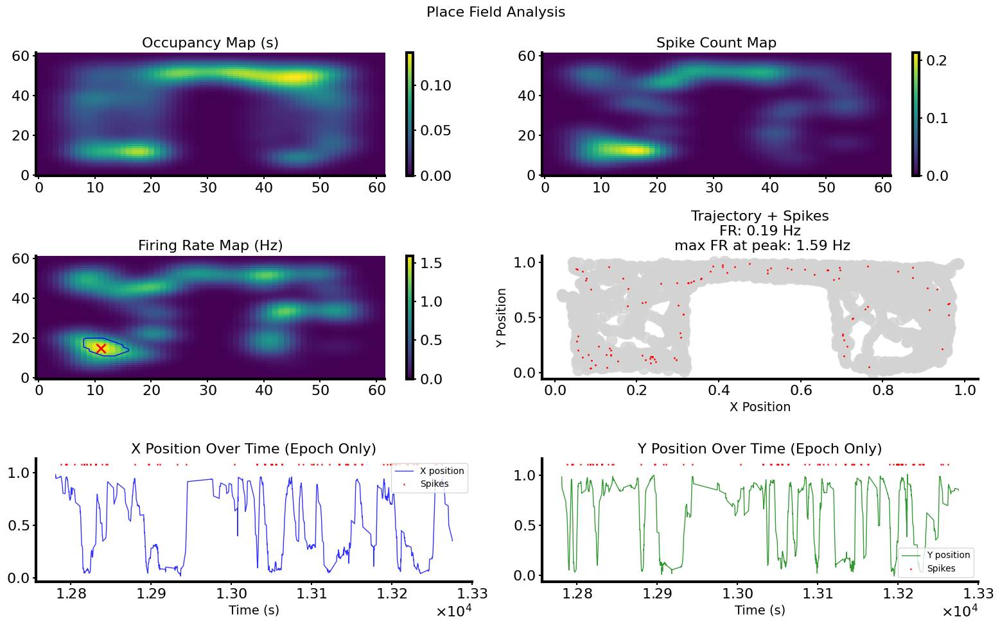


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 0.19 Hz
Spatial Information: -0.291 bits/spike
Sparsity: 2.808
Specificity: 0.000
Peak Firing Rate: 1.59 Hz
Neuron 70


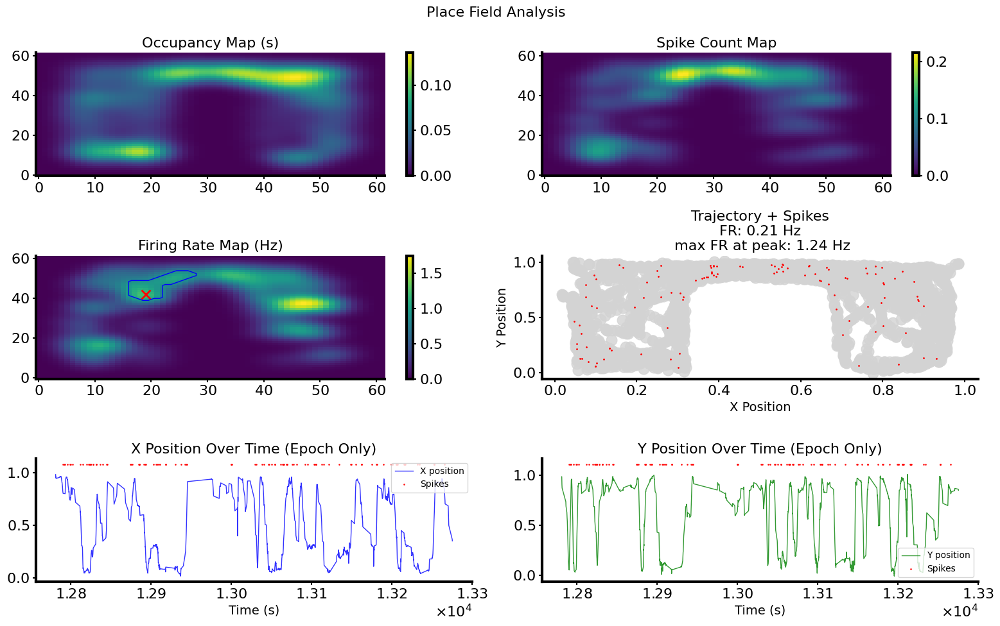


=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 494.4s)
Firing Rate: 0.21 Hz
Spatial Information: -0.341 bits/spike
Sparsity: 2.820
Specificity: 0.000
Peak Firing Rate: 1.24 Hz


In [56]:
import pynapple as nap 
from neuroencoders.utils.PlaceField_dB import PlaceField_DB
for spike_idx in linear_important_neurons.index[:10]:

    print(f"Neuron {spike_idx}")

    spike_time = nap.Ts(spike_times[speedMask[matching_pos_indices].flatten()][spike_matrix[speedMask[matching_pos_indices].flatten(),spike_idx] == 1].flatten())
    try:
        pos_x = nap.Tsd(d=df_results["featureTrue"].values[speedMask,0], t=pos_times[speedMask].flatten())
        pos_y = nap.Tsd(d=df_results["featureTrue"].values[speedMask,1], t=pos_times[speedMask].flatten())
    except:
        pos_x = nap.Tsd(d=true_dec["featureTrue"][speedMask,0], t=pos_times[speedMask].flatten())
        pos_y = nap.Tsd(d=true_dec["featureTrue"][speedMask,1], t=pos_times[speedMask].flatten())

    results = PlaceField_DB(spike_time, pos_x, pos_y)

In [90]:
df_results.shape

(36864, 5)

In [89]:
speedMask.shape

(48570,)

In [58]:
import numpy as np
from neuroencoders.utils.backend import pd
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Aggregate Sorted Spikes (High -> Coarse) ---
n_pos_bins = len(pos_times)
n_neurons = spike_matrix.shape[1]

# Use bincount to sum spikes belonging to each posIndex
pos_spike_counts = np.zeros((n_pos_bins, n_neurons))
for i in range(n_neurons):
    pos_spike_counts[:, i] = np.bincount(
        matching_pos_indices.flatten(), 
        weights=spike_matrix[:, i].astype(float), 
        minlength=n_pos_bins
    )

# --- 2. Aggregate Raw Detected Spikes ---
# Filtering -1 (padding) from the variable-length lists in the DataFrame
def get_valid_raw_count(index_list):
    if isinstance(index_list, (list, np.ndarray)):
        # Convert to numpy and count elements that aren't -1
        return np.sum(np.array(index_list) != -1)
    return 0

# Ensure the DF is sorted by posIndex to match the timebase
raw_counts_series = spikes_count_training.groupby("posIndex")["indexInDat"].apply(get_valid_raw_count)
raw_counts_per_bin = np.zeros(n_pos_bins)
raw_counts_per_bin[raw_counts_series.index] = raw_counts_series.values

# --- 3. Construct Final Design Matrix X ---
X = pd.DataFrame(pos_spike_counts, columns=[f"Unit_{i}" for i in range(n_neurons)])

# Technical Features
X['Raw_Detected_Count'] = raw_counts_per_bin
X['Sorted_Total'] = pos_spike_counts.sum(axis=1)
X['Sorting_Efficiency'] = X['Sorted_Total'] / (X['Raw_Detected_Count'] + 1e-6)
X['Population_Synchrony'] = (pos_spike_counts > 0).sum(axis=1)

# Behavior Features (from true_dec)
vx = np.gradient(true_dec["featurePred"][:, 0])
vy = np.gradient(true_dec["featurePred"][:, 1])
X['Speed'] = np.sqrt(vx**2 + vy**2)

IndexError: index 156622 is out of bounds for axis 0 with size 7424

In [35]:
global_fr = np.convolve(spike_matrix.sum(axis=1), np.ones(window_size)/window_size, mode='same')
neuron_frs = np.zeros_like(spike_matrix, dtype=float)
n_neurons = spike_matrix.shape[1]
for i in range(n_neurons):
    neuron_frs[:, i] = np.convolve(spike_matrix[:, i].astype(float), np.ones(window_size)/window_size, mode='same')

In [36]:
import numpy as np
from neuroencoders.utils.backend import pd
from scipy.stats import pearsonr

# --- YOUR EXISTING SETUP ---
# (Assumes matching_pos_indices, spike_matrix, true_dec, and dist_p1_p2 are defined)

n_pos_bins = len(true_dec["times"])
n_neurons = spike_matrix.shape[1]

# 1. Map Spikes to Position Bins
# matching_pos_indices[i] tells us which index in true_dec["times"] spike i belongs to.

# We create an empty matrix for spikes aggregated to the position timebase
pos_spike_counts = np.zeros((n_pos_bins, n_neurons))

for i in range(n_neurons):
    # Sum the number of spikes for neuron i that fall into each position bin
    pos_spike_counts[:, i] = np.bincount(
        matching_pos_indices.flatten(), 
        weights=spike_matrix[:, i].astype(float), 
        minlength=n_pos_bins
    )

# 2. Calculate Mean FR and Mean Activity per Position Bin
# FR = count / dt (assuming position sampling rate is constant)
dt = np.mean(np.diff(true_dec["times"]))
pos_neuron_frs = pos_spike_counts / dt  # Firing rate per neuron per bin
pos_global_fr = pos_neuron_frs.sum(axis=1)  # Population firing rate

# Activity (did ANY neuron fire in this bin?)
pos_mean_activity = (pos_spike_counts.sum(axis=1) > 0).astype(float)

# --- 2. ANALYSIS: LINKING TO PREDICTION DIVERGENCE ---

# Calculate correlation between disagreement (dist_p1_p2) and Global FR
# We use the position-timebase because dist_p1_p2 is already at that resolution
# add speed mask for ground truth
speedMask = true_dec["speedMask"]
corr_global, _ = pearsonr(dist_p1_p2[speedMask], pos_global_fr[speedMask])
corr_true, _ = pearsonr(true_error[speedMask], pos_global_fr[speedMask])
corr_shuffled, _ = pearsonr(shuffled_error[speedMask], pos_global_fr[speedMask])

# Calculate per-neuron correlation with disagreement
neuron_impact = []
for i in range(n_neurons):
    c, _ = pearsonr(dist_p1_p2, pos_neuron_frs[:, i])
    neuron_impact.append(c)

neuron_impact = np.array(neuron_impact)

print(f"Global FR vs. Prediction Divergence Correlation: {corr_global:.3f}")
print(f"Global FR vs. Prediction Divergence Correlation: {corr_true:.3f}")
print(f"Global FR vs. Prediction Divergence Correlation: {corr_shuffled:.3f}")

Global FR vs. Prediction Divergence Correlation: -0.019
Global FR vs. Prediction Divergence Correlation: 0.055
Global FR vs. Prediction Divergence Correlation: -0.005


In [37]:
import matplotlib.pyplot as plt

# Get indices where the two predictions diverge significantly (top 10% of distances)
threshold = np.percentile(dist_p1_p2[speedMask], 90)
high_divergence_idx = dist_p1_p2[speedMask] > threshold

# Average FR per neuron during high vs low divergence
fr_high_div = pos_neuron_frs[speedMask][high_divergence_idx].mean(axis=0)
fr_low_div = pos_neuron_frs[speedMask][~high_divergence_idx].mean(axis=0)

plt.figure(figsize=(10, 4))
plt.bar(np.arange(n_neurons) - 0.2, fr_high_div, width=0.4, label='High Divergence')
plt.bar(np.arange(n_neurons) + 0.2, fr_low_div, width=0.4, label='Normal Agreement')
plt.xlabel("Neuron Index")
plt.ylabel("Mean FR (Hz)")
plt.title("Neuron Activity Profile: Agreement vs. Disagreement")
plt.legend()
plt.show()

In [219]:
import matplotlib.pyplot as plt

# Get indices where the two predictions diverge significantly (top 10% of distances)
threshold = np.percentile(true_error[speedMask], 90)
high_divergence_idx = true_error[speedMask] > threshold

# Average FR per neuron during high vs low divergence
fr_high_div = pos_neuron_frs[speedMask][high_divergence_idx].mean(axis=0)
fr_low_div = pos_neuron_frs[speedMask][~high_divergence_idx].mean(axis=0)
diff = fr_high_div - fr_low_div
mask = np.abs(diff) > 4
print(np.where(mask))

plt.figure(figsize=(10, 4))
plt.bar(np.arange(n_neurons) - 0.2, fr_high_div, width=0.4, label='High Divergence')
plt.bar(np.arange(n_neurons) + 0.2, fr_low_div, width=0.4, label='Normal Agreement')
plt.xlabel("Neuron Index")
plt.ylabel("Mean FR (Hz)")
plt.title("Neuron Activity Profile: Agreement vs. Disagreement")
plt.legend()
plt.show()

(array([44]),)


In [220]:
import matplotlib.pyplot as plt

# Get indices where the two predictions diverge significantly (top 10% of distances)
threshold = np.percentile(shuffled_error[speedMask], 90)
high_divergence_idx = shuffled_error[speedMask] > threshold

# Average FR per neuron during high vs low divergence
fr_high_div = pos_neuron_frs[speedMask][high_divergence_idx].mean(axis=0)
fr_low_div = pos_neuron_frs[speedMask][~high_divergence_idx].mean(axis=0)

plt.figure(figsize=(10, 4))
plt.bar(np.arange(n_neurons) - 0.2, fr_high_div, width=0.4, label='High Divergence')
plt.bar(np.arange(n_neurons) + 0.2, fr_low_div, width=0.4, label='Normal Agreement')
plt.xlabel("Neuron Index")
plt.ylabel("Mean FR (Hz)")
plt.title("Neuron Activity Profile: Agreement vs. Disagreement")
plt.legend()
plt.show()

In [223]:
fig, axs = plt.subplots(2,1)
axs[0].plot(pos_times[~speedMask], true_error[~speedMask], c = "blue")
axs[0].plot(pos_times[speedMask], true_error[speedMask], c = "grey")
axs[0].scatter(pos_times[speedMask], true_error[speedMask], s=10, c="r", zorder=2)
axs[1].plot(pos_global_fr)

In [224]:
from neuroencoders.utils.PlaceField_dB import PlaceField_DB
import pynapple as nap

In [225]:
speedMask[matching_pos_indices].flatten()

array([False, False, False, ..., False, False, False])

In [226]:
spike_idx = 44
print(f"Neuron {spike_idx}")

spike_time = nap.Ts(spike_times[speedMask[matching_pos_indices].flatten()][spike_matrix[speedMask[matching_pos_indices].flatten(),spike_idx] == 1].flatten())
pos_x = nap.Tsd(d=true_dec["featureTrue"][speedMask,0], t=pos_times[speedMask].flatten())
pos_y = nap.Tsd(d=true_dec["featureTrue"][speedMask,1], t=pos_times[speedMask].flatten())
results = PlaceField_DB(spike_time, pos_x, pos_y)

spike_time = nap.Ts(spike_times[speedMask[matching_pos_indices].flatten()][spike_matrix[speedMask[matching_pos_indices].flatten(),spike_idx] == 1].flatten())
pos_x = nap.Tsd(d=true_dec["featurePred"][speedMask,0], t=pos_times[speedMask].flatten())
pos_y = nap.Tsd(d=true_dec["featurePred"][speedMask,1], t=pos_times[speedMask].flatten())
results = PlaceField_DB(spike_time, pos_x, pos_y)


spike_time = nap.Ts(spike_times[speedMask[matching_pos_indices].flatten()][spike_matrix[speedMask[matching_pos_indices].flatten(),spike_idx] == 1].flatten())
pos_x = nap.Tsd(d=shuffled_dec["featurePred"][speedMask,0], t=pos_times[speedMask].flatten())
pos_y = nap.Tsd(d=shuffled_dec["featurePred"][speedMask,1], t=pos_times[speedMask].flatten())
results = PlaceField_DB(spike_time, pos_x, pos_y)


Neuron 44

=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 1937.3s)
Firing Rate: 6.99 Hz
Spatial Information: -7.667 bits/spike
Sparsity: 1.544
Specificity: 0.000
Peak Firing Rate: 39.85 Hz

=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 1937.3s)
Firing Rate: 6.99 Hz
Spatial Information: -17.329 bits/spike
Sparsity: 7.981
Specificity: 0.000
Peak Firing Rate: 28.24 Hz

=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 1937.3s)
Firing Rate: 6.99 Hz
Spatial Information: -12.688 bits/spike
Sparsity: 2.527
Specificity: 0.000
Peak Firing Rate: 46.98 Hz


In [227]:
res.DataHelper.fullBehavior["Positions"][true_dec["posIndex"][true_dec["speedMask"]]]

array([[ 0.22347367,  0.80074616, -3.03055958,  0.12442089],
       [ 0.2061004 ,  0.80167165, -3.08963395,  0.14085632],
       [ 0.18725677,  0.8041595 , -3.08767525,  0.15940151],
       ...,
       [ 0.85744991,  0.95075614, -0.11659565,  0.04924386],
       [ 0.86454015,  0.95594933, -0.12481753,  0.04405067],
       [ 0.87568468,  0.95722338, -0.0370948 ,  0.04277662]])

In [228]:
%matplotlib qt

In [229]:
from sklearn.ensemble import RandomForestRegressor
from neuroencoders.utils.backend import pd
import matplotlib.pyplot as plt
import seaborn as sns

# --- 1. Construct the Feature Matrix X ---
# We use the position-binned data we created earlier
X_data = pd.DataFrame(pos_neuron_frs[speedMask], columns=[f"Unit_{i}" for i in range(n_neurons)])

# Add behavioral and global metrics
X_data['Global_FR'] = pos_global_fr[speedMask]
X_data['Speed'] = res.DataHelper.fullBehavior["Speed"][true_dec["posIndex"][true_dec["speedMask"]]]
X_data['Activity_Density'] = (pos_spike_counts[speedMask] > 0).sum(axis=1)

# --- 2. Train Models for both Error A and Error B ---
targets = {
    "True_Error": true_error[speedMask],
    "Shuffled_Error": shuffled_error[speedMask]
}

importance_df = pd.DataFrame({'Feature': X_data.columns})

for name, target in targets.items():
    rf = RandomForestRegressor(n_estimators=100, max_depth=10, random_state=42)
    rf.fit(X_data, target)
    importance_df[name] = rf.feature_importances_

# --- 3. Visualization ---
# Melting the dataframe for side-by-side comparison
plot_df = importance_df.melt(id_vars='Feature', var_name='Model', value_name='Importance')
plot_df = plot_df.sort_values(by=['Importance'], ascending=False)

plt.figure(figsize=(12, 8))
sns.barplot(data=plot_df, y='Feature', x='Importance', hue='Model')
plt.title("Predictors of Error: True Model vs. Shuffled Model")
plt.xlabel("Importance Score (Contribution to Error)")
plt.tight_layout()
plt.show()

In [233]:
plot_df.query("Model == 'True_Error'").sort_values(by = 'Importance', ascending = False)

,Feature,Model,Importance
92,Speed,True_Error,0.160264
93,Activity_Density,True_Error,0.067520
91,Global_FR,True_Error,0.065545
87,Unit_87,True_Error,0.029453
24,Unit_24,True_Error,0.028866
...,...,...,...
74,Unit_74,True_Error,0.000033
76,Unit_76,True_Error,0.000021
62,Unit_62,True_Error,0.000015
42,Unit_42,True_Error,0.000003


In [236]:
from sklearn.inspection import PartialDependenceDisplay

# Choose the top 3 neuron predictors from your importance list
top_neurons = importance_df.sort_values(by='True_Error', ascending=False)['Feature'].iloc[:5].tolist()

fig, ax = plt.subplots(figsize=(12, 4))
PartialDependenceDisplay.from_estimator(rf, X_data, top_neurons, ax=ax)
plt.suptitle("How firing rates of specific units actually change the True Error")
plt.show()

/home/mickey/Documents/Theotime/neuroEncoders/.venv/lib/python3.10/site-packages/sklearn/inspection/_partial_dependence.py:717: FutureWarning: The column 93 contains integer data. Partial dependence plots are not supported for integer data: this can lead to implicit rounding with NumPy arrays or even errors with newer pandas versions. Please convert numerical featuresto floating point dtypes ahead of time to avoid problems. This will raise ValueError in scikit-learn 1.9.
  warnings.warn(


In [325]:
spike_idx = 24
spike_mask = spike_matrix[speedMask[matching_pos_indices].flatten(),spike_idx] == 1

In [326]:
stim = nap.Ts(t = spike_times[speedMask[matching_pos_indices].flatten()][spike_mask])

In [327]:
spike_times[speedMask[matching_pos_indices].flatten()].shape

(253536,)

In [331]:
ts_group = dict()
for i in range(spike_matrix[speedMask[matching_pos_indices].flatten()].shape[1]):
    ts_mask = (spike_matrix[speedMask[matching_pos_indices].flatten(), i] == 1)
    ts = nap.Ts(t = np.sort(spike_times[speedMask[matching_pos_indices].flatten()][ts_mask]), time_units = "s")
    ts_group[i] = ts
tgroup_spike = nap.TsGroup(ts_group)

In [332]:
stim

Time (s)
10804.15705
10805.62315
10811.85945
10831.0181
10838.6055
10852.00625
10888.3838
...
12731.62165
12731.734
12732.16985
12732.2261
12734.9128
12737.2036
12738.21295
shape: 1525

In [337]:
peth = nap.compute_perievent(tgroup_spike.to_tsd(), stim, minmax = (-1.2,0.2))

In [353]:
peth

Index    rate       ref_times
-------  ---------  -----------
0        323.57143  10804.16
1        277.85714  10805.62
2        192.14286  10811.86
3        269.28571  10831.02
4        172.85714  10838.61
5        185.71429  10852.01
6        123.57143  10888.38
...      ...        ...
1518     226.42857  12731.62
1519     268.57143  12731.73
1520     310.0      12732.17
1521     306.42857  12732.23
1522     220.71429  12734.91
1523     262.14286  12737.2
1524     284.28571  12738.21

In [348]:
peth.count(0.2)

Time (s)    0         1         2         3         4         ...
----------  --------  --------  --------  --------  --------  -----
-1.1        54        76        74        60        0         ...
-0.9        68        64        0         53        11        ...
-0.7        69        44        0         48        50        ...
-0.5        46        51        0         47        61        ...
-0.3        84        48        44        50        41        ...
-0.1        80        55        77        71        40        ...
0.1         52        51        74        48        39        ...
Metadata
ref_times   10804.16  10805.62  10811.86  10831.02  10838.61  ...
dtype: int64, shape: (7, 1525)

In [239]:
spike_idx = 24
print(f"Neuron {spike_idx}")

spike_time = nap.Ts(spike_times[speedMask[matching_pos_indices].flatten()][spike_matrix[speedMask[matching_pos_indices].flatten(),spike_idx] == 1].flatten())
pos_x = nap.Tsd(d=true_dec["featurePred"][speedMask,0], t=pos_times[speedMask].flatten())
pos_y = nap.Tsd(d=true_dec["featurePred"][speedMask,1], t=pos_times[speedMask].flatten())
results = PlaceField_DB(spike_time, pos_x, pos_y)

Neuron 24

=== Place Field Statistics ===
Analysis on FULL SESSION (duration: 1937.3s)
Firing Rate: 0.79 Hz
Spatial Information: -1.125 bits/spike
Sparsity: 3.345
Specificity: 0.000
Peak Firing Rate: 5.67 Hz


In [ ]:
from pathlib import Path

loader_all.save(
    path=os.path.join(
        Path.home(),
        "Documents",
        "Theotime",
        "DimaERC2",
        "neuroencoders_1021",
        "_work",
        "STRIDE1_2_and_4_NOPREDLOSS_results_all.pickle",
    )
)

# start analysis

In [21]:
loader_all.results_df["stride"] = loader_all.results_df["nameExp"].apply(
    lambda x: ("4" if "STRIDE_4" in x else "2") if "STRIDE" in x else "1"
)

In [20]:
main_dir = os.path.realpath(
    "/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/Pres180526"
)
os.makedirs(main_dir, exist_ok=True)

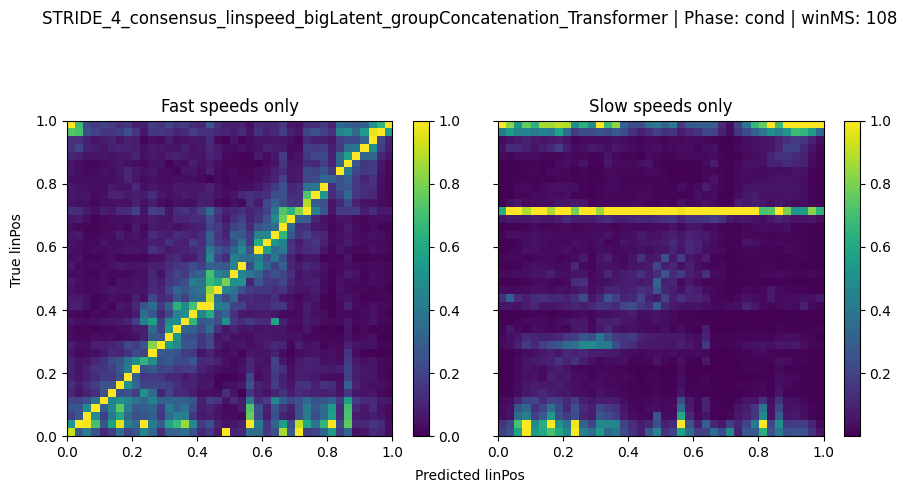

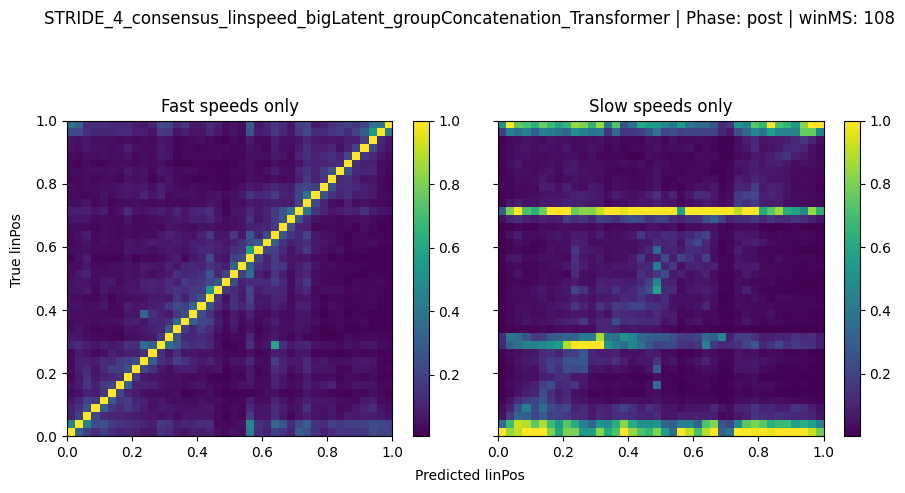

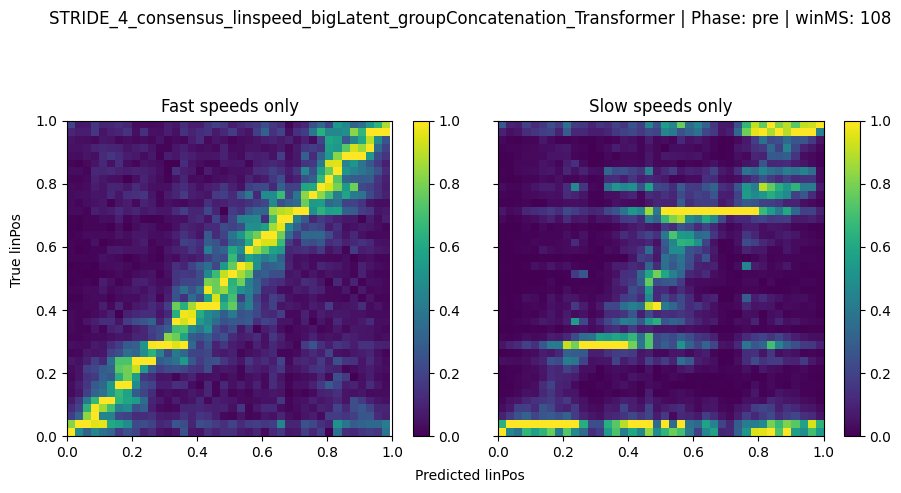

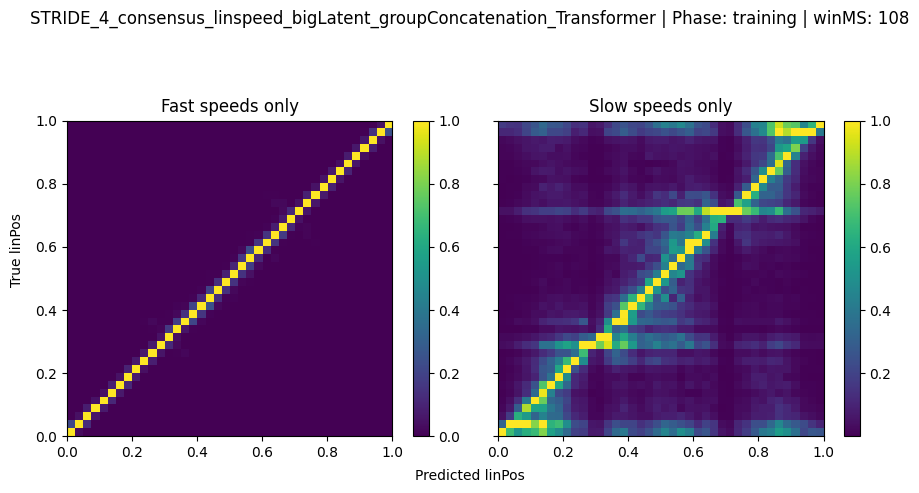

In [77]:
loader_all.mean_error_matrix_linerrors_by_speed(folder=main_dir, show = True)

## save dataframe as mat struct

In [28]:
from scipy.io import savemat

# Save the DataFrame as a .mat file

mdict = dict()
df = loader_all.results_df.copy()
for col in df.drop(columns=["results"]).columns:
    mdict[col] = df[col].to_numpy()

# Save the dictionary as a .mat file
savemat(os.path.join(main_dir, "..", "resultsNN_withColumns.mat"), mdict)

## analysis

In [10]:
import seaborn as sns

In [11]:
loader_all.results_df["results"][0].load_trainers(which="ann")

I0000 00:00:1779049955.681382  244085 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 9905 MB memory:  -> device: 0, name: NVIDIA RTX 2000 Ada Generation, pci bus id: 0000:ac:00.0, compute capability: 8.9


Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0097


In [58]:
loader_all.results_df.iloc[0].results.ann.gaussian_layer_loss_config["l_function_layer_params"].keys()

dict_keys(['maze_points', 'ts_proj'])

In [61]:
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="entropy", show=False, folder=main_dir
)
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="maxp", show=False, folder=main_dir
)
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="entropy", show=False, folder=main_dir, z_var_cmap="mouse"
)
loader_all.pooled_correlation_entropy_maxp_vs_KL(
    against="maxp", show=False, folder=main_dir, z_var_cmap="mouse"
)

iter 0: gamma=1.000, max=5.0000, avg_local=0.0097

Processing suffix: _pre (tag: pre)


IndexError: boolean index did not match indexed array along axis 0; size of axis is 1 but size of corresponding boolean axis is 11392

In [62]:
loader_all.results_df.query("nameExp == @bayes_nameExp")

UndefinedVariableError: local variable 'bayes_nameExp' is not defined

In [56]:
bayes_nameExp = "new_4d_GaussianHeatMap_LinearLoss_Transformer"
loader_all.results_df["lin_error_bayes"] = loader_all.results_df.query(
    "nameExp == @bayes_nameExp"
).apply(
    lambda row: np.abs(np.array(row["bayesLinPred"]) - np.array(row["linTruePos"])),
    axis=1,
)

ValueError: operands could not be broadcast together with shapes (42240,) (39360,) 

In [12]:
def compute_lin_error(row):
    bayes_proba = row.get("bayesProba", None)
    if isinstance(bayes_proba, float):
        print("bayes proba", bayes_proba)
        print(
            f"Single value encountered, skipping for row {row.name} with params {row['mouse'], row['manipe'], row['phase'], row['ann_mode'], row['stride']}"
        )
        return None
    if bayes_proba is None or len(bayes_proba) == 0:
        return None

    threshold = np.percentile(bayes_proba, 50)
    mask = np.array(bayes_proba) > threshold
    print(mask.sum())

    bayes_pred = np.array(row["bayesLinPred"])[mask]
    true_pos = np.array(row["linTruePos"])[mask]
    if isinstance(bayes_pred, float):
        print("bayes pred", bayes_pred)
        print(
            f"Single value encountered, skipping for row {row.name} with params {row['mouse'], row['manipe'], row['phase'], row['ann_mode'], row['stride']}"
        )
    if isinstance(true_pos, float):
        print("true pos", true_pos)
        print(
            f"Single value encountered, skipping for row {row.name} with params {row['mouse'], row['manipe'], row['phase'], row['ann_mode'], row['stride']}"
        )

    if len(bayes_pred) == 0 or len(true_pos) == 0:
        return None

    return np.abs(bayes_pred - true_pos)


loader_all.results_df["lin_error_selected_bayes"] = loader_all.results_df.apply(
    compute_lin_error, axis=1
)

In [13]:
loader_all.results_df["mean_lin_error_bayes"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error_bayes"])
    if row["lin_error_bayes"] is not None
    else None,
    axis=1,
)
loader_all.results_df["mean_lin_error_selected_bayes"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error_selected_bayes"])
    if row["lin_error_selected_bayes"] is not None
    else None,
    axis=1,
)

KeyError: 'lin_error_bayes'

In [14]:
self = loader_all

In [15]:
self.results_df["error"] = self.results_df.apply(
    lambda row: np.linalg.norm(row["fullPred"] - row["truePos"], axis=1)
    if row["fullPred"] is not None and row["truePos"] is not None
    else None,
    axis=1,
)
self.results_df["mean_lin_error"] = self.results_df.apply(
    lambda row: np.nanmean(np.abs(row["linPred"] - row["linTruePos"]))
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)
self.results_df["lin_error"] = self.results_df.apply(
    lambda row: np.abs(row["linPred"] - row["linTruePos"])
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)

self.results_df["lin_error_selected"] = self.results_df.apply(
    lambda row: np.abs(
        row["linPred"][row["predLoss"] <= row["predLossThreshold"]]
        - row["linTruePos"][row["predLoss"] <= row["predLossThreshold"]]
    )
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)
self.results_df["mean_lin_error_selected"] = self.results_df.apply(
    lambda row: np.nanmean(
        np.abs(
            row["linPred"][row["predLoss"] <= row["predLossThreshold"]]
            - row["linTruePos"][row["predLoss"] <= row["predLossThreshold"]]
        )
    )
    if row["linPred"] is not None and row["linTruePos"] is not None
    else None,
    axis=1,
)

KeyError: 'fullPred'

In [16]:
loader_all.results_df["bayesProba"]

KeyError: 'bayesProba'

In [62]:
loader_all.results_df["bayesProbThreshold"] = loader_all.results_df["bayesProba"].apply(
    lambda x: np.percentile(x, 50)
    if x is not None and ~np.isnan(x).all() and len(x) > 0
    else None
)

In [63]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linPred', 'fullPred',
       'truePos', 'linTruePos', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'mean_error', 'lin_error',
       'predLossThreshold', 'mean_error_selected', 'lin_error_selected',
       'asymmetry_index_on_predicted', 'asymmetry_index_on_selected_predicted',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asymmetry_ratio_normalized',
       'selected_predicted_asymmetry_ratio_normalized',
       'true_binary_direction', 'predicted_binary_di

In [64]:
loader_all.results_df["predLossThreshold"]

0      0.539179
1      0.461711
2      0.449914
3      0.520951
4      0.656279
         ...   
275    0.580174
276    0.542946
277    0.707319
278    0.625934
279    0.551388
Name: predLossThreshold, Length: 280, dtype: float64

In [17]:
# add a chance_level[winMS] for each winMS to loader_all - simple mean error between truePos and random pos
loader_all.chance_level = dict()
for winMS in loader_all.results_df["winMS"].unique():
    mask = loader_all.results_df["winMS"] == winMS
    all_truePos = np.concatenate(
        loader_all.results_df.loc[mask, "linTruePos"].dropna().values
    )
    if len(all_truePos) == 0:
        continue
    random_pos = np.random.uniform(
        low=np.min(all_truePos), high=np.max(all_truePos), size=all_truePos.shape
    )
    chance_level = np.mean(np.abs(all_truePos - random_pos))
    loader_all.results_df.loc[mask, "chance_level"] = chance_level
    loader_all.chance_level[str(winMS)] = chance_level

KeyError: 'linTruePos'

In [66]:
loader_all.plot_ann_vs_bayes_linerror(show=True, speed="fast")

TypeError: 'float' object is not subscriptable

In [ ]:
loader_all.plot_ann_vs_bayes_linerror(show=False, speed="fast", folder=main_dir)
loader_all.plot_ann_vs_bayes_linerror(show=False, speed="all", folder=main_dir)
loader_all.plot_ann_vs_bayes_linerror(show=False, speed="slow", folder=main_dir)
loader_all.plot_ann_vs_bayes_linerror(
    show=False, speed="fast", folder=main_dir, error_type="full"
)
loader_all.plot_ann_vs_bayes_linerror(
    show=False, speed="all", folder=main_dir, error_type="full"
)
loader_all.plot_ann_vs_bayes_linerror(
    show=False, speed="slow", folder=main_dir, error_type="full"
)

In [18]:
loader_all.results_df["mean_lin_error_fast"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error"][row["speedMask"]])
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

loader_all.results_df["mean_lin_error_fast_selected"] = loader_all.results_df.apply(
    lambda row: np.nanmean(
        row["lin_error"][
            (row["speedMask"]) & (row["predLoss"] < row["predLossThreshold"])
        ]
    )
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

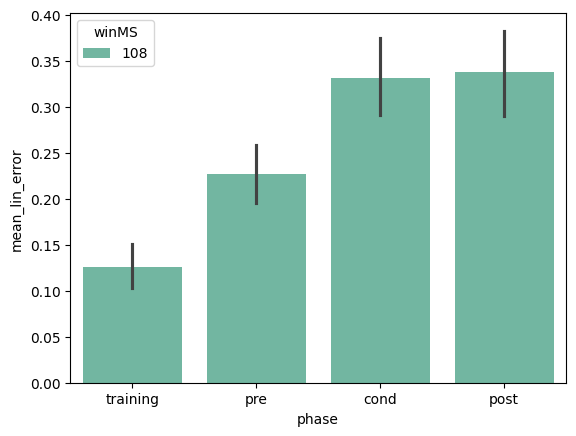

In [22]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
)
plt.savefig(os.path.join(main_dir, "mean_lin_error_phase_winMS_stride4.png"), dpi=300)

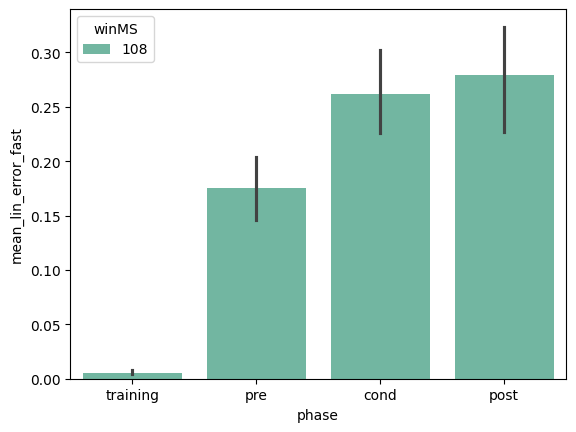

In [23]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_fast_phase_winMS_stride4.png"), dpi=300
)

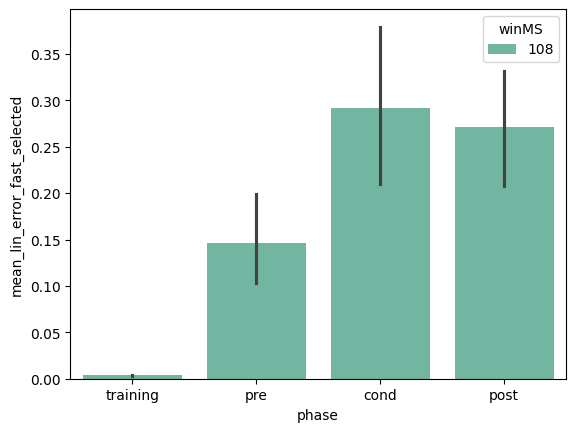

In [24]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast_selected",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_fast_selected_phase_winMS_stride4.png"),
    dpi=300,
)

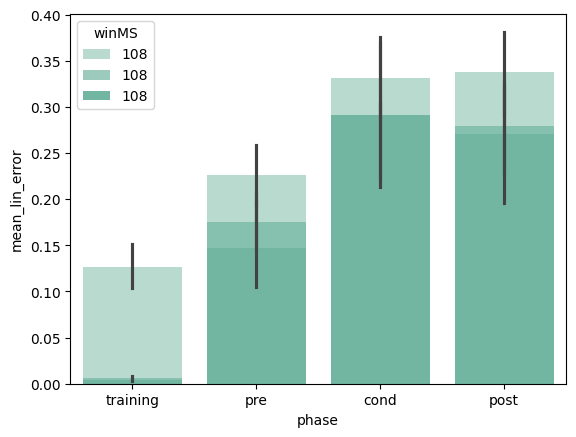

In [25]:
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.5,
)
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.7,
)
sns.barplot(
    data=loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast_selected",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=1,
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_and_fast_selected_phase_winMS_stride4.png"),
    dpi=300,
)

In [47]:
# select all cols that contain "bayes"
col = loader_all.results_df.columns[
    loader_all.results_df.columns.str.contains("bayes")
].drop("use_bayes")
# assign nan to all rows where use_bayes is False
df = loader_all.results_df.copy()
df.loc[df["use_bayes"] == False, col] = np.nan
loader_all.results_df = df

KeyError: "['use_bayes'] not found in axis"

In [ ]:
loader_all.results_df["mean_lin_error_fast_bayes"] = loader_all.results_df.apply(
    lambda row: np.nanmean(row["lin_error_bayes"][row["speedMask"]])
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

loader_all.results_df[
    "mean_lin_error_fast_selected_bayes"
] = loader_all.results_df.apply(
    lambda row: np.nanmean(
        row["lin_error_bayes"][
            ((row["speedMask"]) & (row["bayesProba"] > row["bayesProbThreshold"]))
        ]
    )
    if row["speedMask"] is not None
    else np.nan,
    axis=1,
)

IndexError: boolean index did not match indexed array along dimension 0; dimension is 7552 but corresponding boolean dimension is 23680

In [63]:
sns.barplot(
    data=loader_all.results_df,
    x="phase",
    y="mean_lin_error_bayes",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.5,
)
sns.barplot(
    data=loader_all.results_df,
    x="phase",
    y="mean_lin_error_fast_bayes",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=0.7,
)
sns.barplot(
    data=loader_all.results_df,
    x="phase",
    y="mean_lin_error_fast_selected_bayes",
    hue="winMS",
    order=["training", "pre", "cond", "post"],
    palette="Set2",
    alpha=1,
)
plt.savefig(
    os.path.join(main_dir, "mean_lin_error_bayes_and_fast_selected_phase_winMS.png"),
    dpi=300,
)

ValueError: Could not interpret value `mean_lin_error_bayes` for `y`. An entry with this name does not appear in `data`.


Processing suffix: _cond (tag: cond)


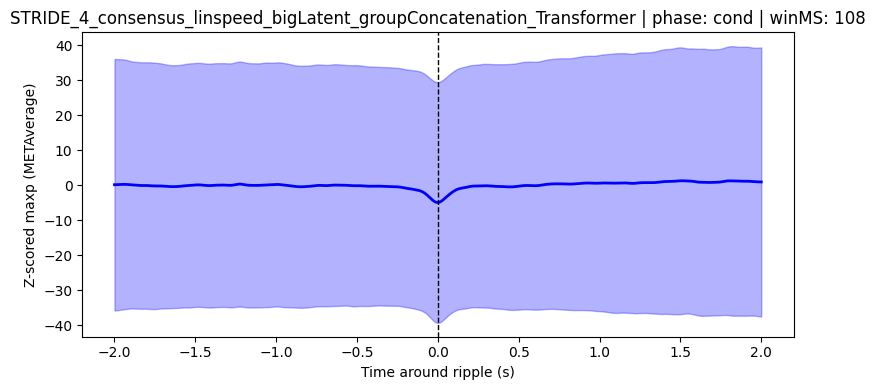

In [80]:
loader_all.around_ripples_METAverage(suffixes=["_cond"], show=True, around=2, against="maxp", folder = main_dir)


Processing suffix: _cond (tag: cond)


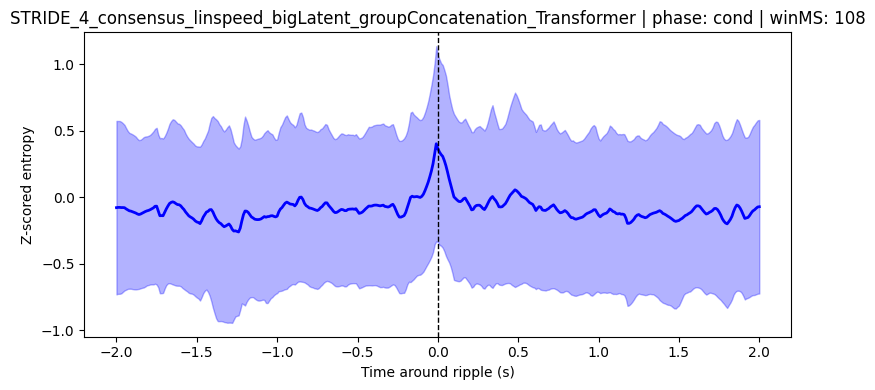

In [76]:
loader_all.around_ripples(suffixes=["_cond"], show=True, around=2, against="entropy", folder = main_dir)

Downsampling for visualization: 545792 -> 50000 points.


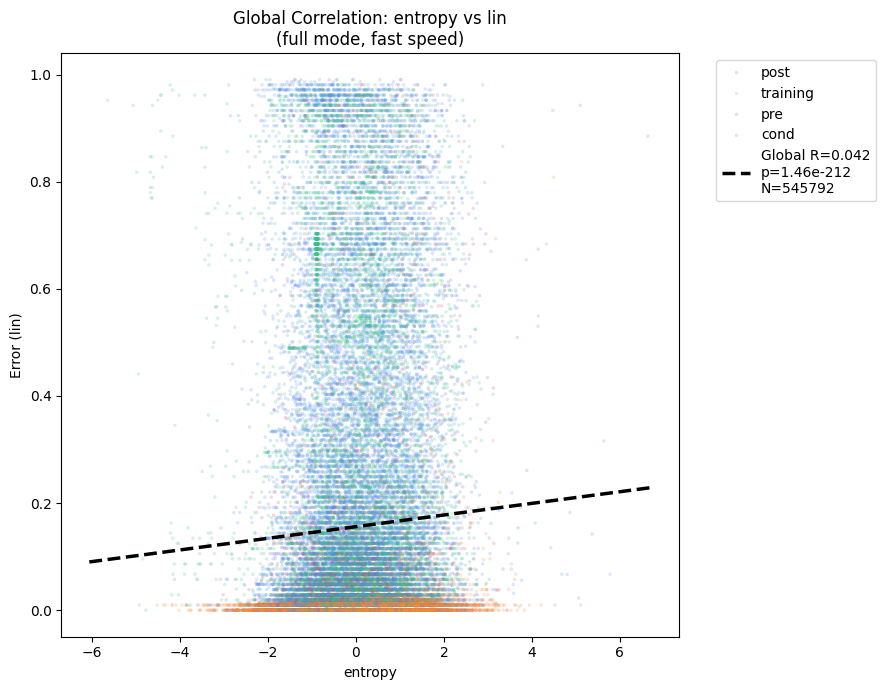

In [84]:
loader_all.correlation_global_predictions(
    against="entropy",
    nameExps=[f"{nameExp}"],
    show=True,
    speed="fast",
    folder=main_dir,
    zscore=True,
)

Downsampling for visualization: 545792 -> 50000 points.


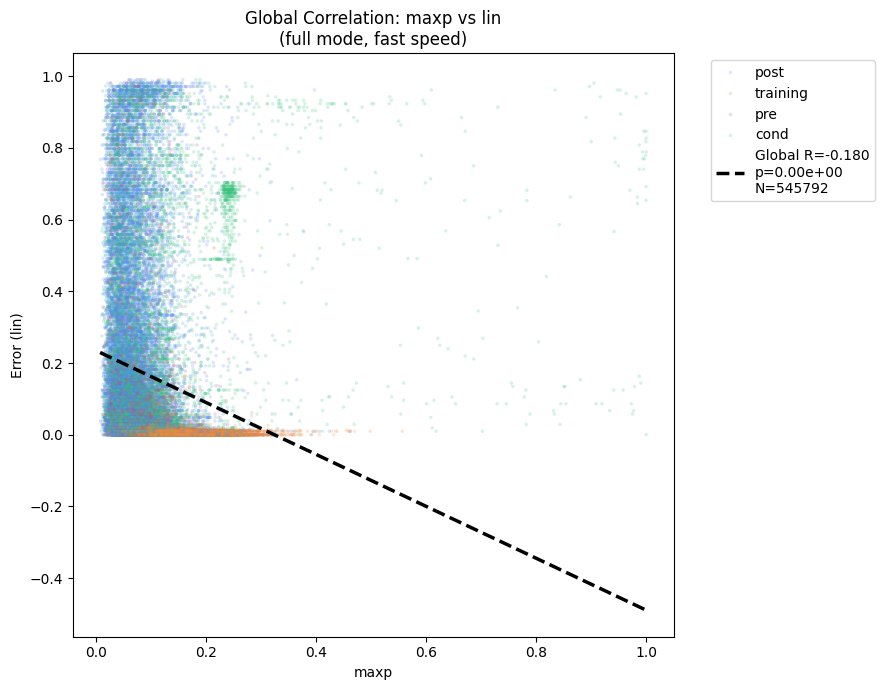

In [85]:
loader_all.correlation_global_predictions(
    against="maxp",
    nameExps=[f"{nameExp}"],
    show=True,
    speed="fast",
    folder=main_dir,
    zscore=False,
)

Downsampling for visualization: 545792 -> 50000 points.


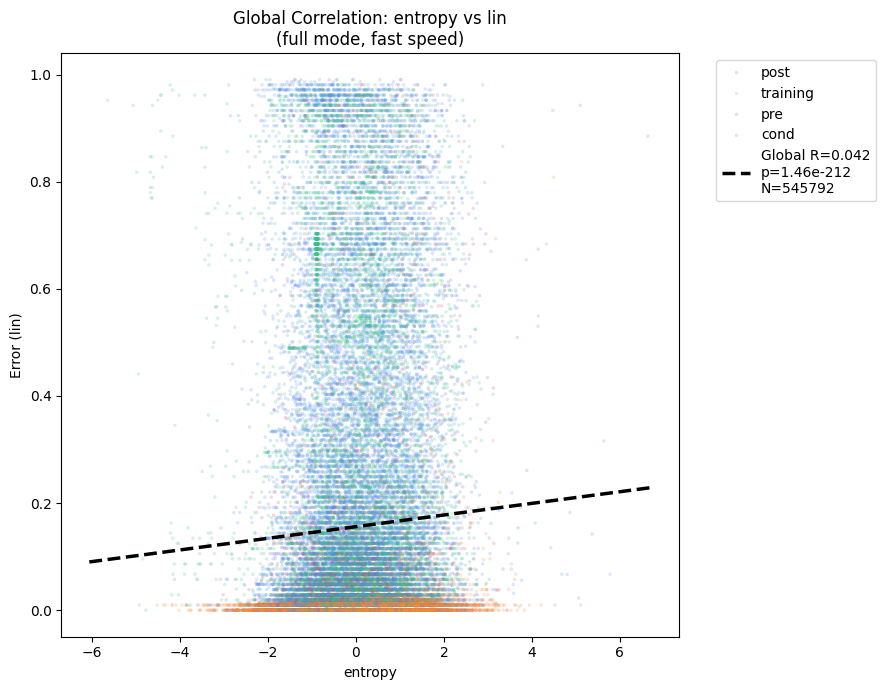

In [88]:
loader_all.correlation_global_predictions(
    against="entropy",
    winMS_list=[108],
    nameExps=[f"{nameExp}"],
    show=True,
    speed="fast",
    folder=main_dir,
    zscore=True,
)

In [90]:
loader_all.correlation_global_predictions(
    against="entropy",
    winMS_list=[108],
    nameExps=[f"{nameExp}"],
    show=False,
    speed="fast",
    folder=main_dir,
    zscore=False,
)
loader_all.correlation_global_predictions(
    against="maxp",
    winMS_list=[108],
    nameExps=[f"{nameExp}"],
    show=False,
    speed="fast",
    folder=main_dir,
    zscore=True,
)
loader_all.correlation_global_predictions(
    against="maxp",
    winMS_list=[108],
    nameExps=[f"{nameExp}"],
    show=False,
    speed="fast",
    folder=main_dir,
    zscore=False,
)

Downsampling for visualization: 545792 -> 50000 points.
Downsampling for visualization: 545792 -> 50000 points.
Downsampling for visualization: 545792 -> 50000 points.



Processing suffix: _cond (tag: cond)


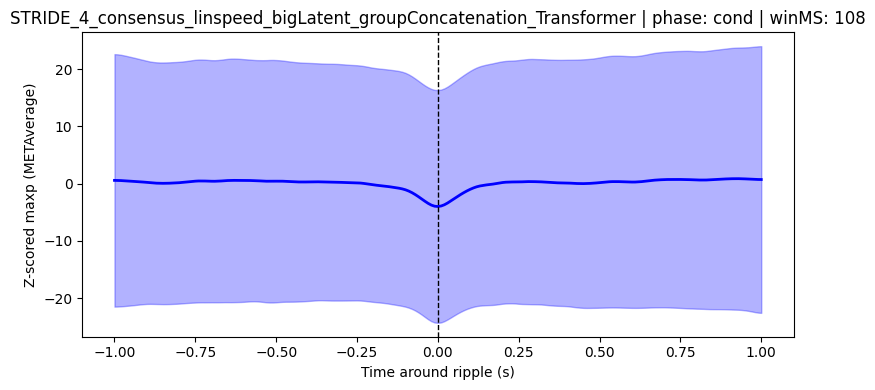

In [92]:
loader_all.around_ripples_METAverage(
    nameExp=[f"{nameExp}"],
    suffixes=["_cond"],
    show=True,
    around=1,
    against="maxp",
    folder=main_dir,
)

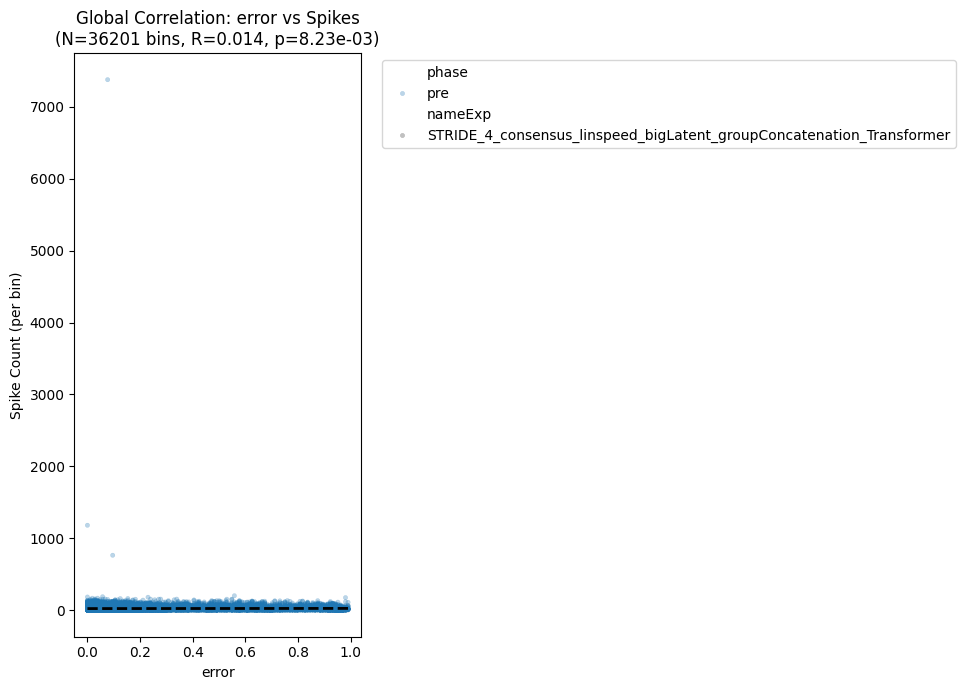

In [95]:
loader_all.correlation_global_spikes(
    suffixes=["_pre"],
    against="error",
    nameExps=[f"{nameExp}"],
    show=True,
    folder=main_dir,
    speed="fast",
)

Plotting 50000 / 136192 points for clarity.


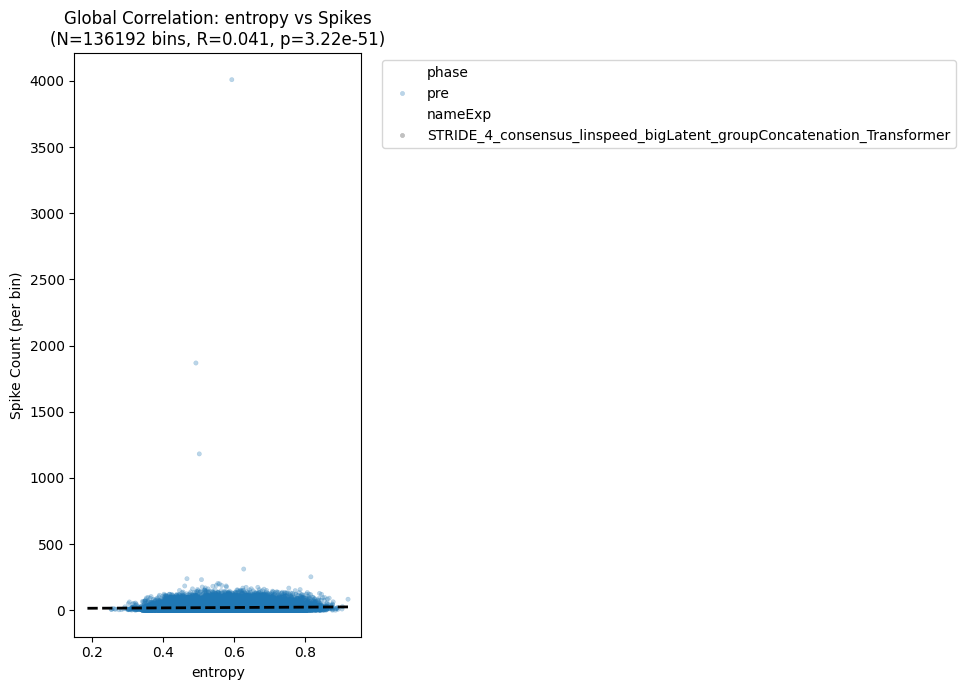

Plotting 50000 / 136192 points for clarity.
Plotting 50000 / 136192 points for clarity.


In [96]:
loader_all.correlation_global_spikes(
    suffixes=["_pre"],
    against="entropy",
    nameExps=[f"{nameExp}"],
    show=True,
    folder=main_dir,
)
loader_all.correlation_global_spikes(
    suffixes=["_pre"],
    against="maxp",
    nameExps=[f"{nameExp}"],
    show=False,
    folder=main_dir,
)
loader_all.correlation_global_spikes(
    suffixes=["_pre"],
    against="error",
    nameExps=[f"{nameExp}"],
    show=False,
    folder=main_dir,
)

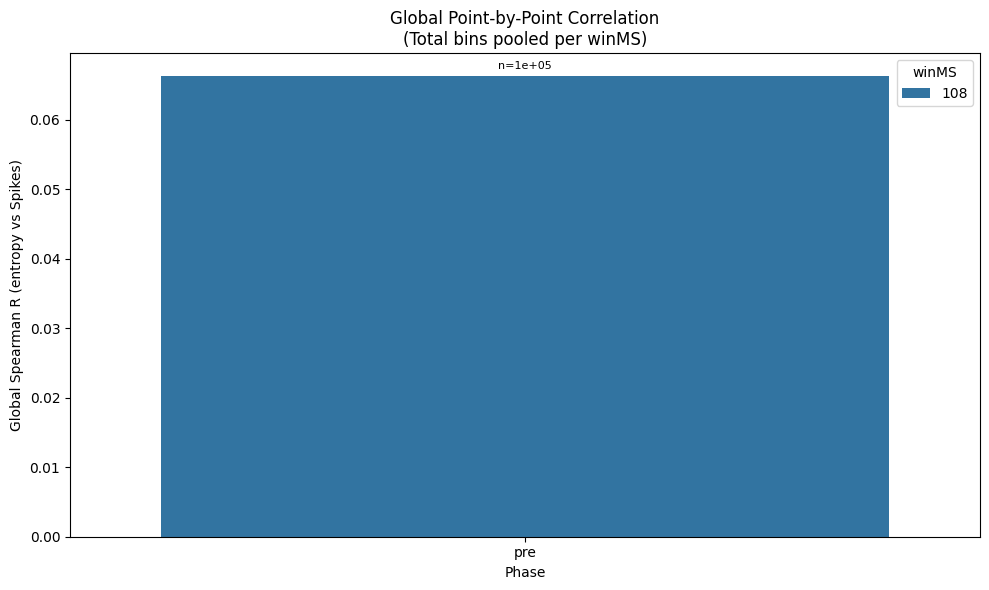

In [98]:
loader_all.barplot_correlation_spikes(
    suffixes=["_pre"],
    against="entropy",
    nameExps=[f"{nameExp}"],
    show=True,
    folder=main_dir,
)
loader_all.barplot_correlation_spikes(
    suffixes=["_pre"],
    against="maxp",
    nameExps=[f"{nameExp}"],
    show=False,
    folder=main_dir,
)
loader_all.barplot_correlation_spikes(
    suffixes=["_pre"],
    against="error",
    nameExps=[f"{nameExp}"],
    show=False,
    folder=main_dir,
)

In [100]:
loader_all.results_df["results"][0].load_trainers(which="ann")

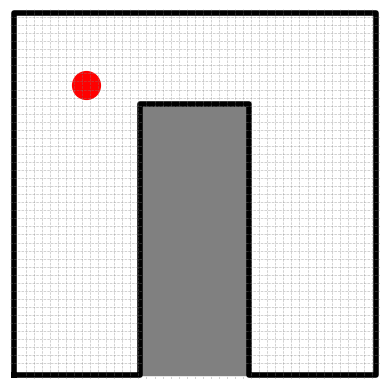

In [102]:
from neuroencoders.utils.global_classes import MAZE_COORDS

fig, ax = plt.subplots()
ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", linewidth=4)
ax.set_xlim(-1e-2, 1.01)
ax.set_ylim(-1e-2, 1.01)
point_to_plot = np.array([0.2, 0.8]).reshape(-1, 2)
ax.scatter(point_to_plot[:, 0], point_to_plot[:, 1], s=400, c="red", marker="o")

# add 45x45 grid size
for i in range(1, 45):
    ax.axhline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)
    ax.axvline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)

# get forbid zone
forbid_zone = np.array([[0.35, 0.65], [0, 0.75]])
ax.fill(
    [
        forbid_zone[0, 0],
        forbid_zone[0, 1],
        forbid_zone[0, 1],
        forbid_zone[0, 0],
        forbid_zone[0, 0],
    ],
    [
        forbid_zone[1, 0],
        forbid_zone[1, 0],
        forbid_zone[1, 1],
        forbid_zone[1, 1],
        forbid_zone[1, 0],
    ],
    color="gray",
    alpha=1,
)
# remove ticks and spines
ax.set_xticks([])
ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_aspect("equal")
plt.savefig(os.path.join(main_dir, "maze_and_point.png"), dpi=300)
plt.show()

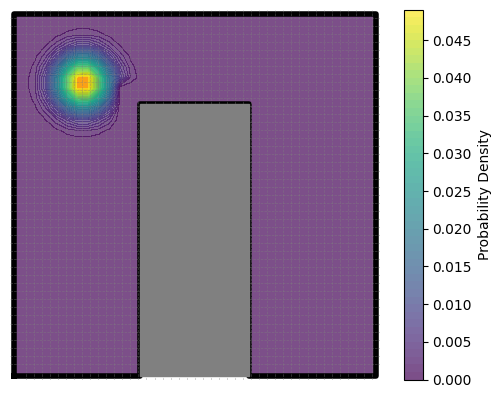

In [110]:
from neuroencoders.utils.global_classes import MAZE_COORDS

fig, ax = plt.subplots()
ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", linewidth=4)
ax.set_xlim(-1e-2, 1.01)
ax.set_ylim(-1e-2, 1.01)
point_to_plot = np.array([0.2, 0.8]).reshape(-1, 2)
ax.scatter(point_to_plot[:, 0], point_to_plot[:, 1], s=400, c="red", marker="o")

# add 45x45 grid size
for i in range(1, 45):
    ax.axhline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)
    ax.axvline(i / 45 + 1 / 90, color="gray", linestyle="--", linewidth=0.5, alpha=0.5)

# get forbid zone
forbid_zone = np.array([[0.35, 0.65], [0, 0.75]])
ax.fill(
    [
        forbid_zone[0, 0],
        forbid_zone[0, 1],
        forbid_zone[0, 1],
        forbid_zone[0, 0],
        forbid_zone[0, 0],
    ],
    [
        forbid_zone[1, 0],
        forbid_zone[1, 0],
        forbid_zone[1, 1],
        forbid_zone[1, 1],
        forbid_zone[1, 0],
    ],
    color="gray",
    alpha=1,
    zorder=2,
)
gaussian_heatmap = (
    loader_all.results_df["results"][0]
    .ann
    .GaussianHeatmap.gaussian_heatmap_targets(point_to_plot)[0]
    .numpy()
)
# returns a 45x45 array of probabilities
# plot the heatmap on top of the maze
size_gaussian_heatmap = gaussian_heatmap.shape[0]
if size_gaussian_heatmap > 60:
    size_gaussian_heatmap = int(np.sqrt(size_gaussian_heatmap))

contour = ax.contourf(
    np.linspace(0, 1, size_gaussian_heatmap),
    np.linspace(0, 1, size_gaussian_heatmap),
    gaussian_heatmap.reshape(size_gaussian_heatmap, size_gaussian_heatmap),
    levels=50,
    cmap="viridis",
    alpha=0.7,
)
# ax.imshow(
#     gaussian_heatmap, zorder = 0, origin = "lower", extent=(0,1,0,1), cmap='viridis', alpha=0.7
# )
plt.colorbar(contour, ax=ax, label="Probability Density")
# remove ticks and spines
ax.set_xticks([])
ax.set_yticks([])
for spine in ax.spines.values():
    spine.set_visible(False)
ax.set_aspect("equal")
plt.savefig(os.path.join(main_dir, "maze_and_point_and_prob.png"), dpi=300)
plt.show()

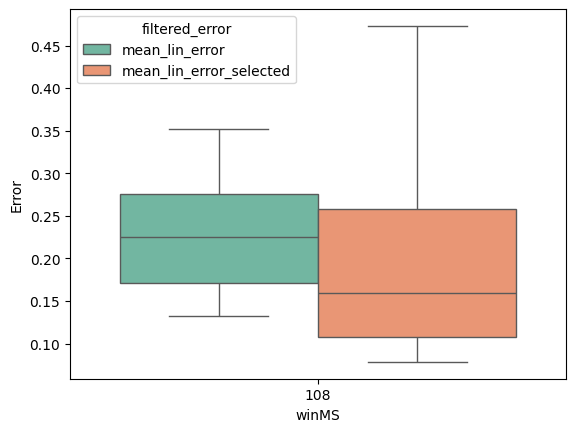

In [26]:
phase = "pre"
sub_df = loader_all.results_df[
    (loader_all.results_df["phase"] == phase)
    & (
        loader_all.results_df["nameExp"]
        == f"{nameExp}"
    )
].copy()
long_df = pd.melt(
    sub_df,
    id_vars=["mouse", "winMS"],
    value_vars=["mean_lin_error", "mean_lin_error_selected"],
    var_name="filtered_error",
    value_name="Error",
)
sns.boxplot(data=long_df, x="winMS", y="Error", hue="filtered_error", palette="Set2")
plt.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_selected.png"), dpi=300)
plt.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_selected.svg"), dpi=300)

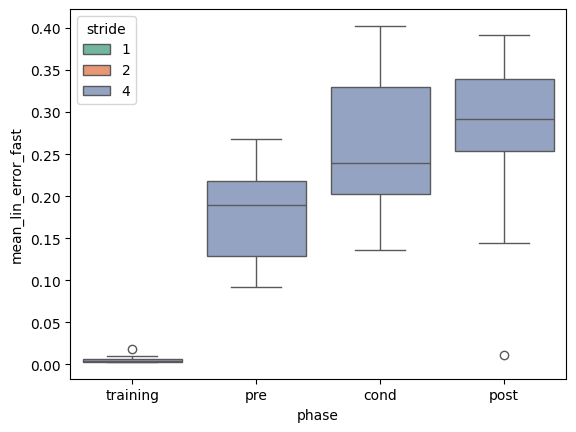

In [115]:
sns.boxplot(
    loader_all.results_df.query("winMS == 108"),
    x="phase",
    y="mean_lin_error_fast",
    hue="stride",
    palette="Set2",
    hue_order=["1", "2", "4"],
    order=["training", "pre", "cond", "post"],
)

plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_fast_per_phase_and_stride.png",
    ),
    dpi=300,
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_fast_per_phase_and_stride.svg",
    ),
    dpi=300,
)

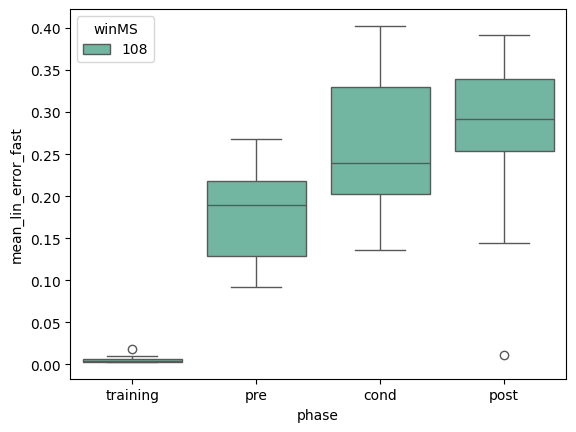

In [116]:
sns.boxplot(
    loader_all.results_df.query("stride == '4'"),
    x="phase",
    y="mean_lin_error_fast",
    hue="winMS",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
)

plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_fast_per_phase_and_winMS.png",
    ),
    dpi=300,
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_fast_per_phase_and_winMS.svg",
    ),
    dpi=300,
)

In [117]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linearPred', 'featurePred',
       'featureTrue', 'linearTrue', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'error', 'mean_error', 'lin_error',
       'mean_lin_error', 'predLossThreshold', 'mean_error_selected',
       'asymmetry_index_on_selected_predicted', 'lin_error_selected',
       'mean_lin_error_selected', 'asymmetry_index_on_predicted',
       'true_binary_direction', 'predicted_binary_direction',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asym

FileNotFoundError: [Errno 2] No such file or directory: '/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/CSI/../Presentation/boxplot_mean_lin_error_and_selected_and_bayes.png'

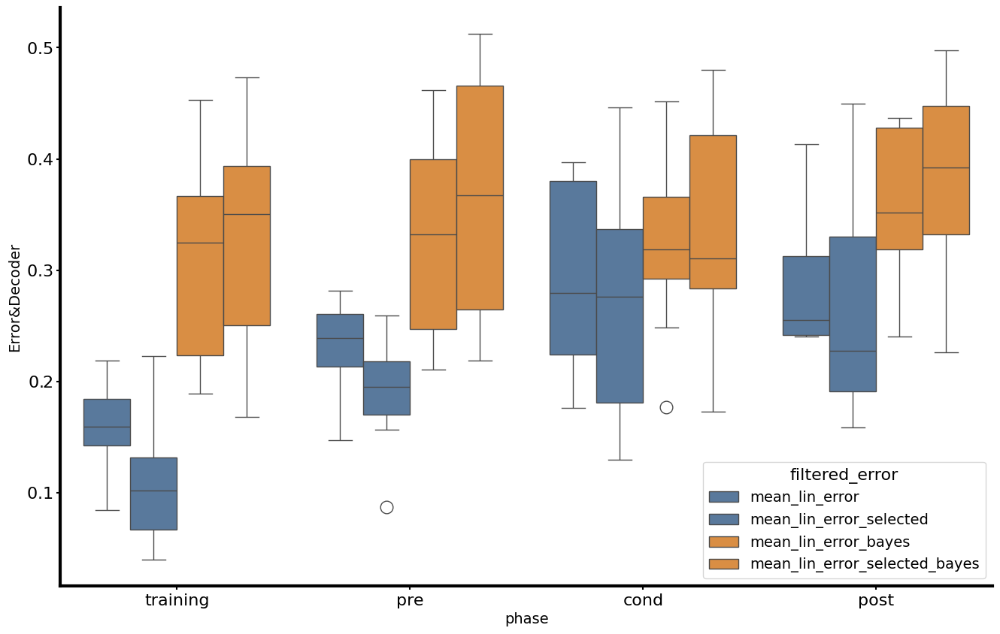

In [ ]:
stride = "4"
winMS = 252
nameExp_bayes = "new_4d_GaussianHeatMap_LinearLoss_Transformer"
sub_df = loader_all.results_df.query("stride == @stride & winMS == @winMS").copy()
bayes_df = loader_all.results_df.query(
    "nameExp == @nameExp_bayes & winMS == @winMS"
).reset_index(drop=True)
sub_df = sub_df.reset_index(drop=True)
sub_df["mean_lin_error_bayes"] = bayes_df["mean_lin_error_bayes"].values
sub_df["mean_lin_error_selected_bayes"] = bayes_df[
    "mean_lin_error_selected_bayes"
].values

long_df = pd.melt(
    sub_df,
    id_vars=["mouse", "phase"],
    value_vars=[
        "mean_lin_error",
        "mean_lin_error_selected",
        "mean_lin_error_bayes",
        "mean_lin_error_selected_bayes",
    ],
    var_name="filtered_error",
    value_name="Error&Decoder",
)
# custom palette, different colors for ann and bayes : give "mean_lin_error" and "mean_lin_error_selected" the same palette color, and "mean_lin_error_bayes" and "mean_lin_error_selected_bayes" another palette color
palette = {
    "mean_lin_error": "#4E79A7",  # blue (ANN)
    "mean_lin_error_selected": "#4E79A7",  # blue (ANN, same as above)
    "mean_lin_error_bayes": "#F28E2B",  # orange (Bayes)
    "mean_lin_error_selected_bayes": "#F28E2B",  # orange (Bayes, same as above)
}
sns.boxplot(
    data=long_df,
    x="phase",
    y="Error&Decoder",
    hue="filtered_error",
    palette=palette,
    order=["training", "pre", "cond", "post"],
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.png",
    )
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.svg",
    )
)
plt.show()

In [ ]:
loader_all.hist2d_linpred_vs_bayes(
    suffixes=["_pre"],
    mode="full",
    nameExps=["STRIDE_4_new_4d_GaussianHeatMap_LinearLoss_Transformer"],
    show=True,
    folder=main_dir,
    winMS_list=[252],
)

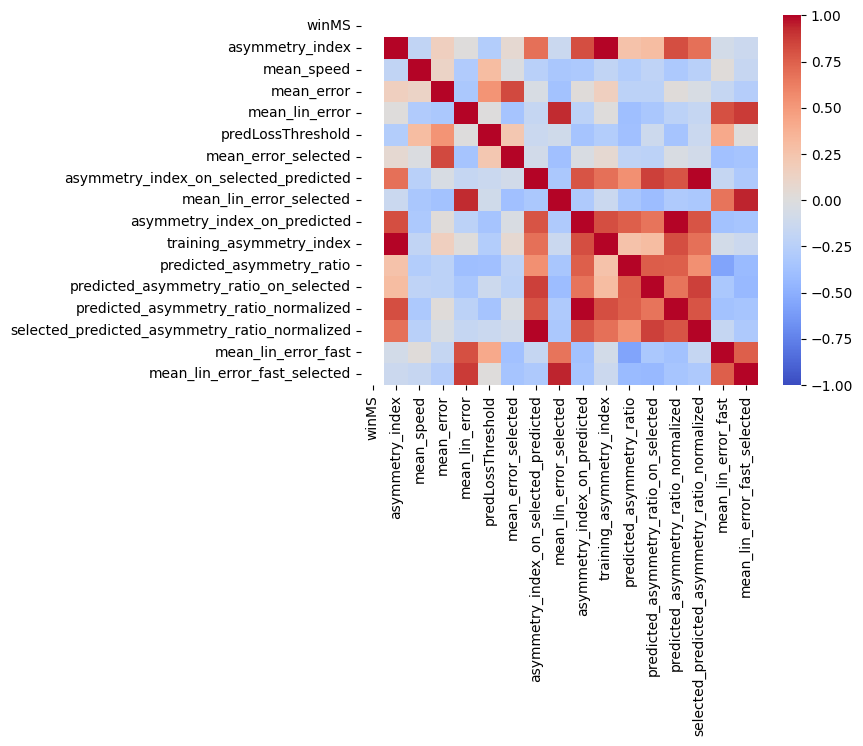

In [118]:
from matplotlib.colors import Normalize

corr = (
    loader_all.results_df.query("phase == 'pre'")
    .drop(columns="real_asymmetry_ratio")
    .corr(numeric_only=True)
)
sns.heatmap(
    corr,
    xticklabels=corr.columns.values,
    yticklabels=corr.columns.values,
    cmap="coolwarm",
    norm=Normalize(vmin=-1, vmax=1),
)
plt.savefig(os.path.join(main_dir, "correlation_matrix_all_pre.png"), dpi=300)

In [381]:
from pathlib import Path

loader_all.save(
    path=os.path.join(
        Path.home(),
        "Documents",
        "Theotime",
        "DimaERC2",
        "neuroencoders_1021",
        "_work",
        "STRIDE1_2_and_4_GaussianHeatmap_results_all_CSI_22092025.pickle",
    )
)

# end for today - let's sleep

# let's start again

In [39]:
import seaborn as sns

In [40]:
loader_all.results_df["mouse_manipe"] = (
    loader_all.results_df["mouse"] + "_" + loader_all.results_df["manipe"]
)

In [41]:
loader_all.results_df["mouse_manipe"].unique()

array(['1117_MFB', '1162_MFB', '1162_PAG', '1168_MFB', '1182_PAG',
       '1199_MFB', '1199_PAG', '1199_reversal', '1230_Known',
       '1230_Novel', '1239_MFB', '1239_PAG', '905_PAG', '994_PAG'],
      dtype=object)

In [42]:
loader_all.results_df.query(
    "ann_mode == 'Transformer' & phase != 'cond'"
).mouse.unique()

array(['1117', '1162', '1168', '1182', '1199', '1230', '1239', '905',
       '994'], dtype=object)

In [43]:
loader_all.results_df.keys()

Index(['nameExp', 'mouse', 'manipe', 'phase', 'winMS', 'asymmetry_index',
       'fullTruePos_fromBehavior', 'alignedTruePos_fromBehavior',
       'fullTrueLinPos_from_behavior', 'alignedTrueLinPos_from_behavior',
       'fullTimeBehavior', 'alignedTimeBehavior', 'timeNN', 'fullSpeed',
       'alignedSpeed', 'posIndex_NN', 'speedMask', 'linearPred', 'featurePred',
       'featureTrue', 'linearTrue', 'predLoss', 'resultsNN',
       'direction_fromBehavior', 'direction_fromNN', 'results', 'mouse_name',
       'ann_mode', 'mean_speed', 'error', 'mean_error', 'lin_error',
       'mean_lin_error', 'predLossThreshold', 'mean_error_selected',
       'asymmetry_index_on_selected_predicted', 'lin_error_selected',
       'mean_lin_error_selected', 'asymmetry_index_on_predicted',
       'true_binary_direction', 'predicted_binary_direction',
       'training_asymmetry_index', 'real_asymmetry_ratio',
       'predicted_asymmetry_ratio', 'predicted_asymmetry_ratio_on_selected',
       'predicted_asym

In [44]:
loader_all.results_df["results"].iloc[0]

Mouse_Results(mouse_name=1117, manipe=MFB, name_exp=STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, target=PosAndHeadDirectionAndThigmo, phase=cond, path=/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1117_MFB, windows=['108'])

In [45]:
loader_all.results_df.query("winMS == 108")["results"].iloc[0]

Mouse_Results(mouse_name=1117, manipe=MFB, name_exp=STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, target=PosAndHeadDirectionAndThigmo, phase=cond, path=/media/mickey/DataTheotime210/DimaERC2/neuroencoders_1021/_work/M1117_MFB, windows=['108'])

In [46]:
good_nameExp = f"{nameExp}"

In [47]:
# drop duplicates bases on (nameExp, mouse, manipe, phase, winMS) and keep the first
tmp_df = loader_all.results_df.drop_duplicates(
    subset=["nameExp", "mouse", "manipe", "phase", "winMS"]
).copy()
loader_all.results_df = tmp_df
tmp_df.query("winMS == 108 and stride == '4' and phase == 'pre'")

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized,lin_error_selected_bayes,mean_lin_error_fast,mean_lin_error_fast_selected,stride,mouse_manipe
2,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1117,MFB,pre,108,0.448039,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.08928227284151798, 0.031808919994720394, -...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.009595959792018636, 0.009595959792018636, 0...",...,1.0,0.978696,1.460118,0.438494,0.654190,None,0.191820,0.150982,4,1117_MFB
9,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,MFB,pre,108,1.016456,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.59992405957313, 0.9183668269075238, 1.2224...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.563980992786845, 0.563980992786845, 0.56398...",...,1.0,0.773033,1.163956,0.785753,1.183110,None,0.221046,0.163175,4,1162_MFB
8,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,PAG,pre,108,1.315276,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.3150901707253557, 0.06770170052096287, -1....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.019191919490909228, 0.019191919490909228, 0...",...,1.0,1.151273,0.943500,1.514242,1.240964,None,0.189140,0.277291,4,1162_PAG
14,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1168,MFB,pre,108,0.950422,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.18127737949691564, 0.8849617027755703, 1.8...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.30707193867617566, 0.30707193867617566, 0.3...",...,1.0,1.802258,2.700959,1.712905,2.567050,None,0.215629,0.138217,4,1168_MFB
18,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1182,PAG,pre,108,1.061119,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.820902410805941, 0.9687875529644934, -0.76...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.6792254554212926, 0.691508021285837, 0.6915...",...,1.0,1.142437,0.723844,1.212261,0.768085,None,0.220702,0.375335,4,1182_PAG
29,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1199,MFB,pre,108,0.925175,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.9530082711240527, 0.8587723797652926, -2.2...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7134555139999135, 0.7134555139999135, 0.713...",...,1.0,1.754230,2.070533,1.622970,1.915605,None,0.099495,0.069279,4,1199_MFB
28,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1199,PAG,pre,108,0.926134,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.9796608201062218, 0.9488706142771205, -0.8...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.7029180408120441, 0.7029180408120441, 0.702...",...,1.0,1.015451,0.912765,0.940443,0.845343,None,0.147738,0.118589,4,1199_PAG
31,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1199,reversal,pre,108,1.172129,"[[0.34979752769405253, 0.969768214238111, -2.4...","[[0.34101255272606323, 0.9707559425460647, -2....","[0.41271075713848177, 0.4030465261291109, 0.40...","[0.4030465261291109, 0.4030465261291109, 0.403...",...,1.0,2.238211,3.825280,2.623472,4.483721,None,0.102885,0.067323,4,1199_reversal
40,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1230,Known,pre,108,0.611765,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.23119932297541168, 0.9424183857859492, -2....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.326269225447827, 0.326269225447827, 0.32626...",...,1.0,0.507805,0.754303,0.310657,0.461456,None,0.265405,0.219608,4,1230_Known
41,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1230,Novel,pre,108,2.091676,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.8577639618488452, 0.0, 5.400422438101899e-...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1117, MFB, cond, 108


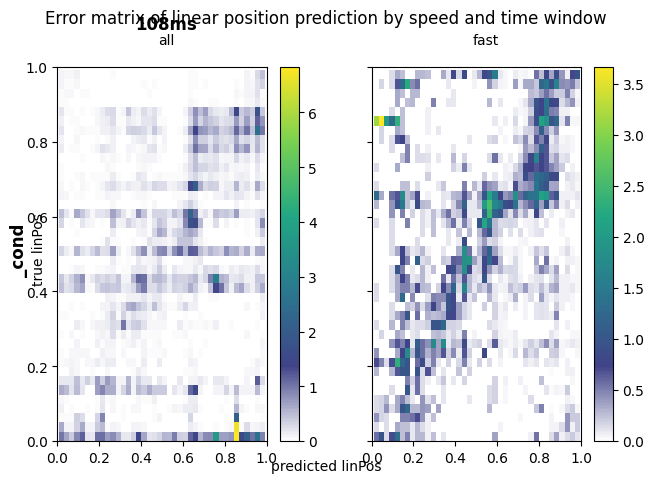

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1117, MFB, post, 108


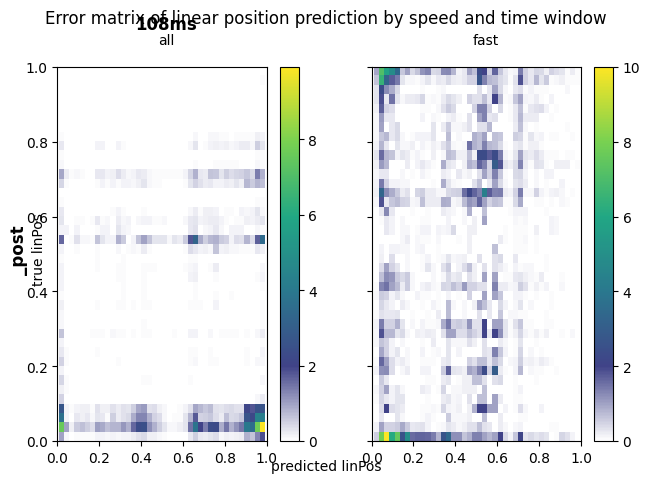

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1117, MFB, pre, 108


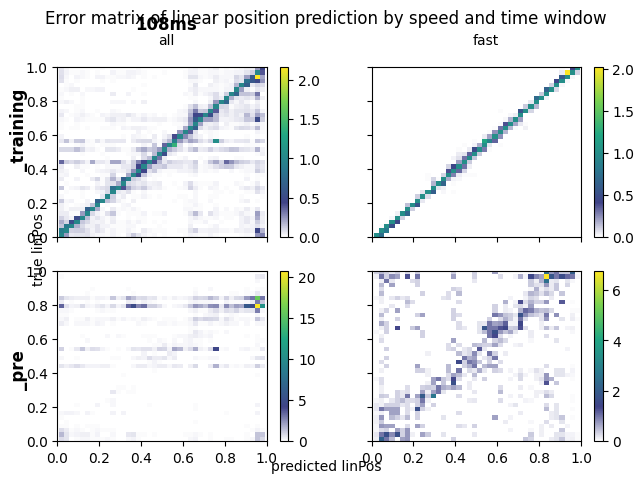

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1117, MFB, training, 108


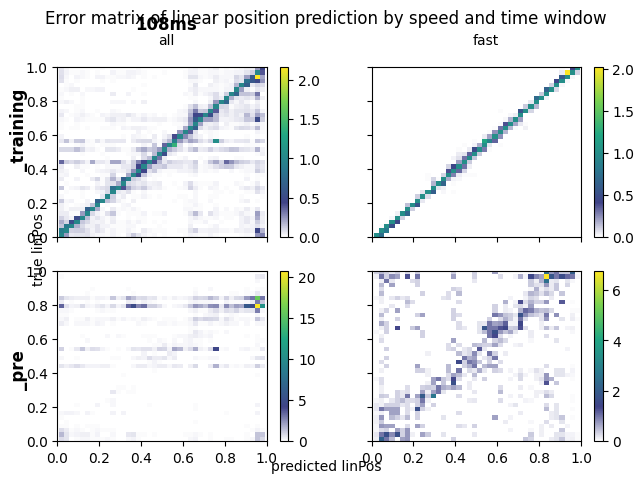

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, MFB, cond, 108


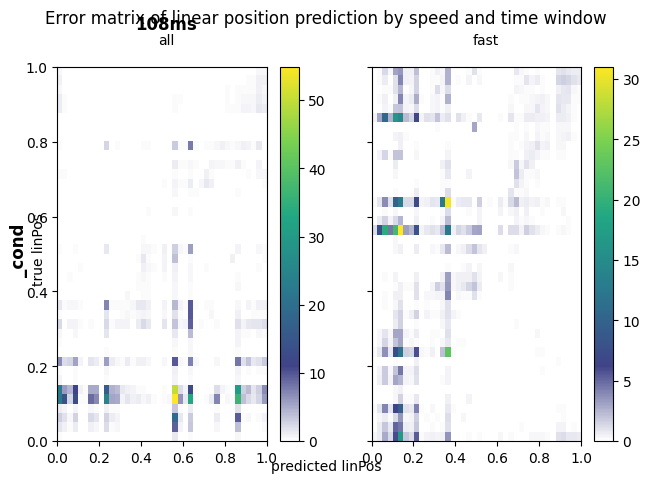

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, MFB, post, 108


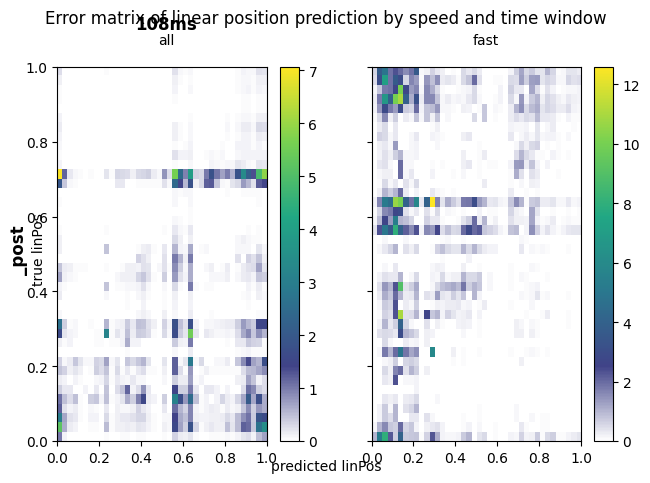

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, MFB, pre, 108


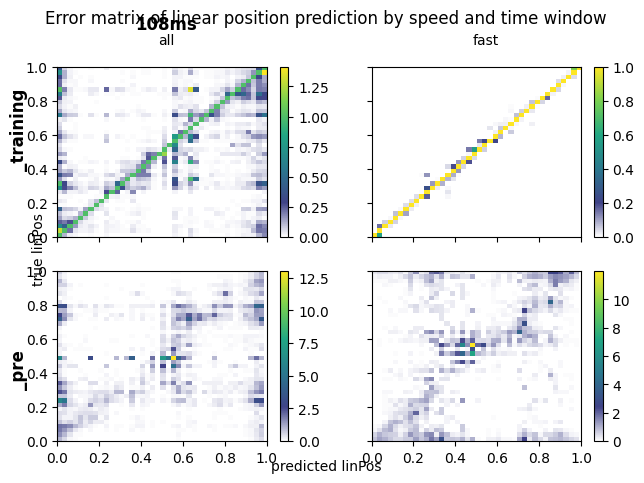

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, MFB, training, 108


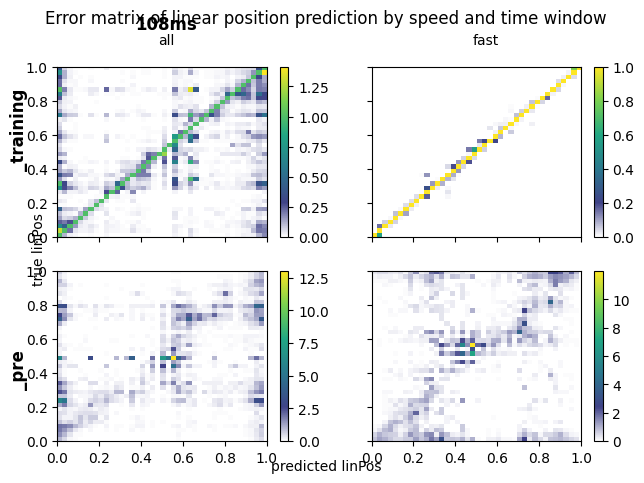

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, PAG, cond, 108


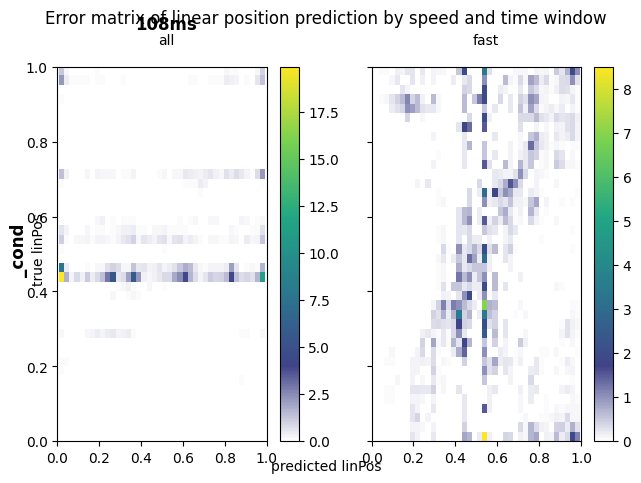

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, PAG, post, 108


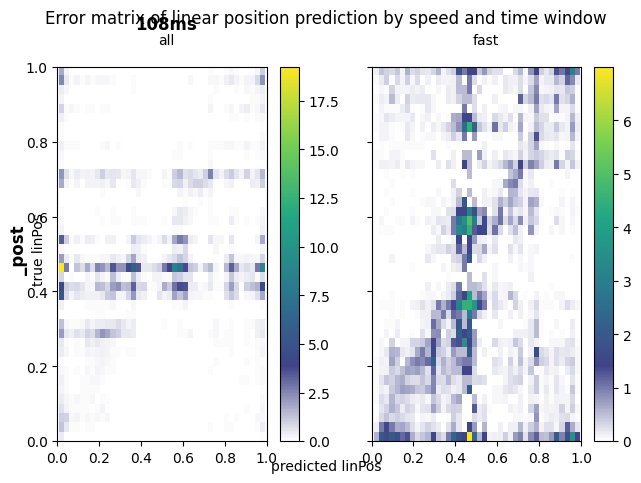

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, PAG, pre, 108


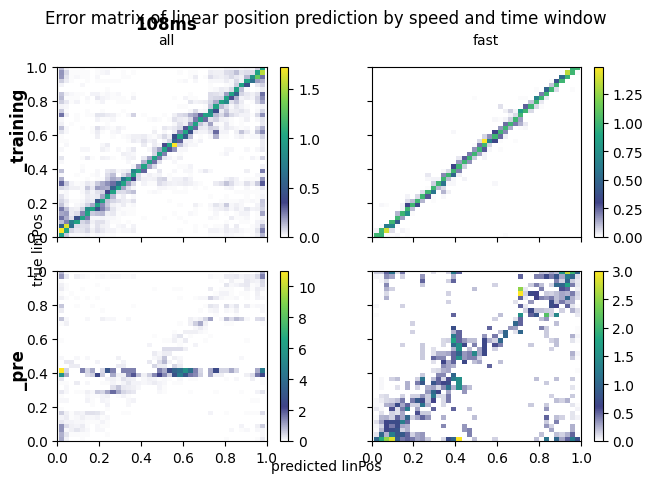

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1162, PAG, training, 108


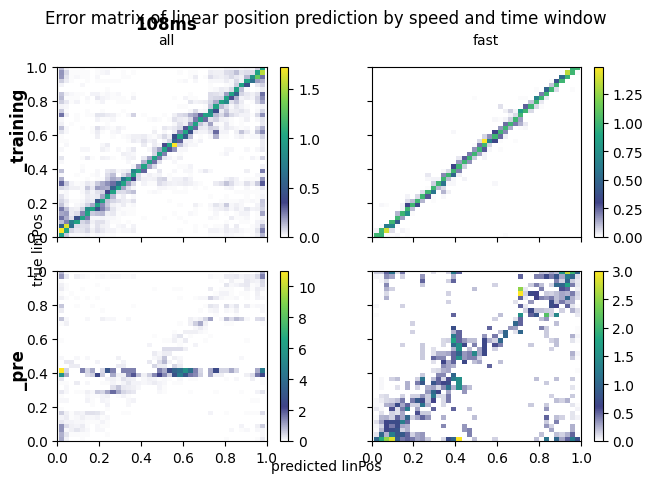

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1168, MFB, cond, 108


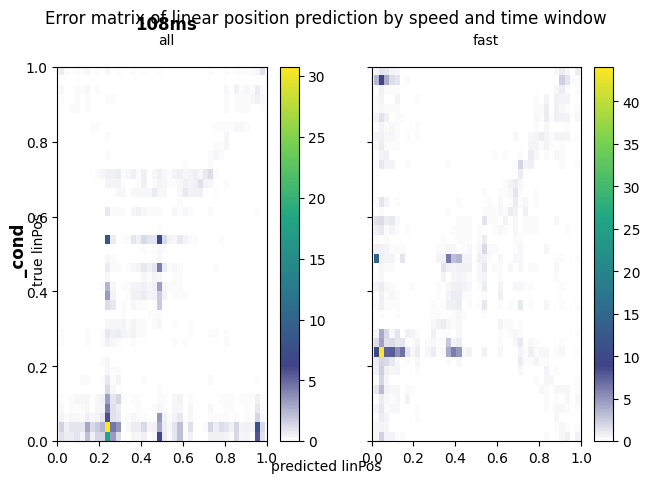

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1168, MFB, post, 108


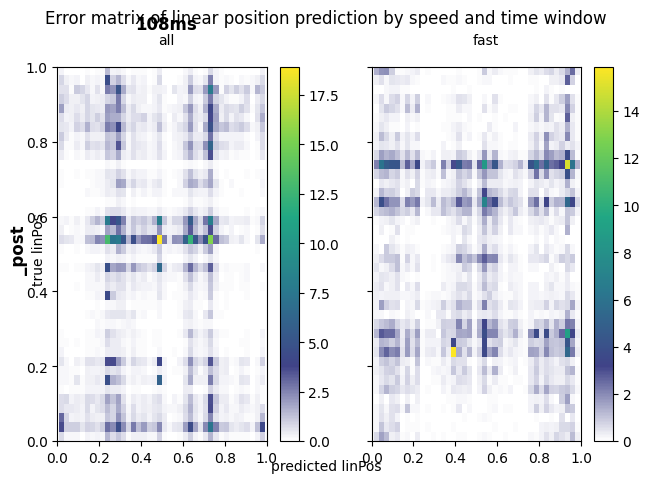

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1168, MFB, pre, 108


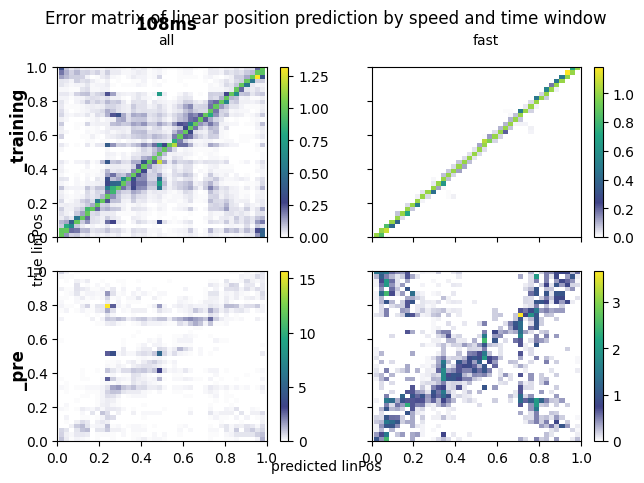

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1168, MFB, training, 108


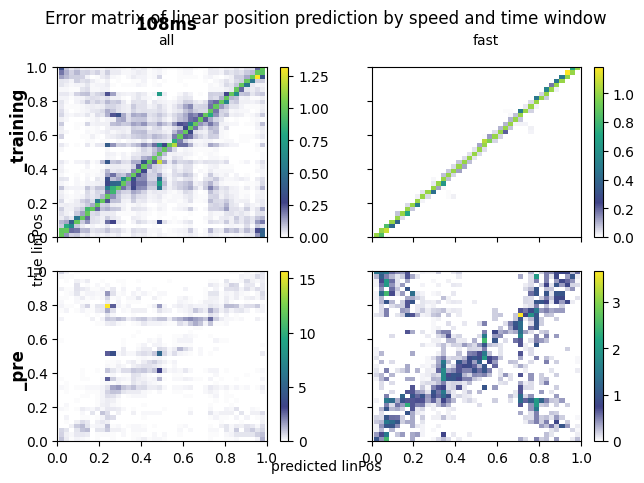

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1182, PAG, cond, 108


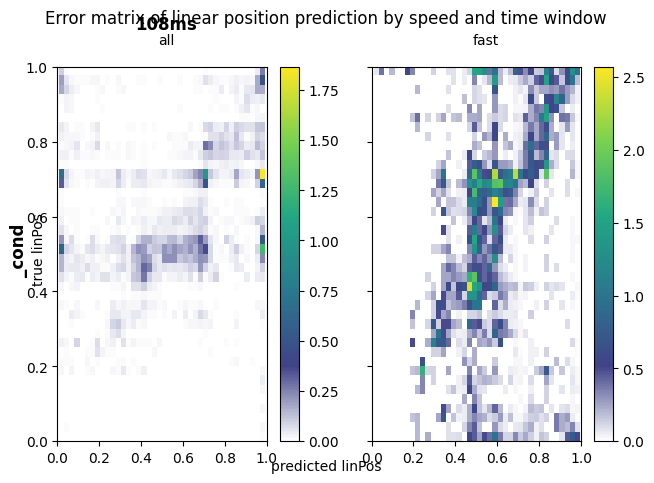

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1182, PAG, post, 108


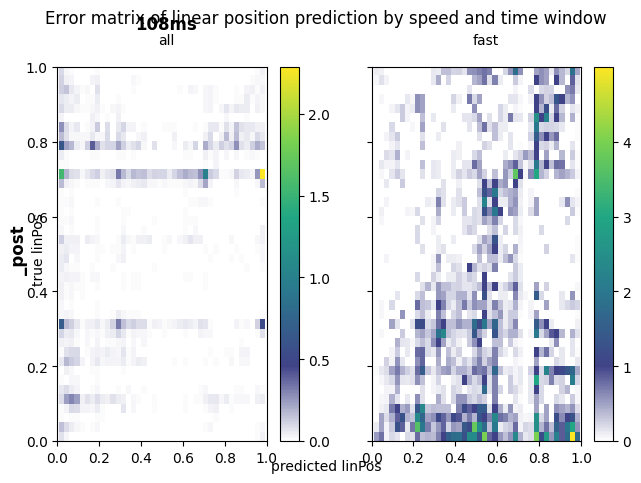

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1182, PAG, pre, 108


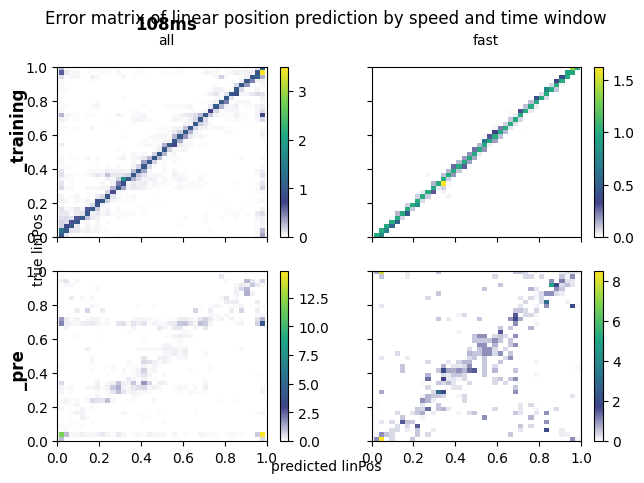

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1182, PAG, training, 108


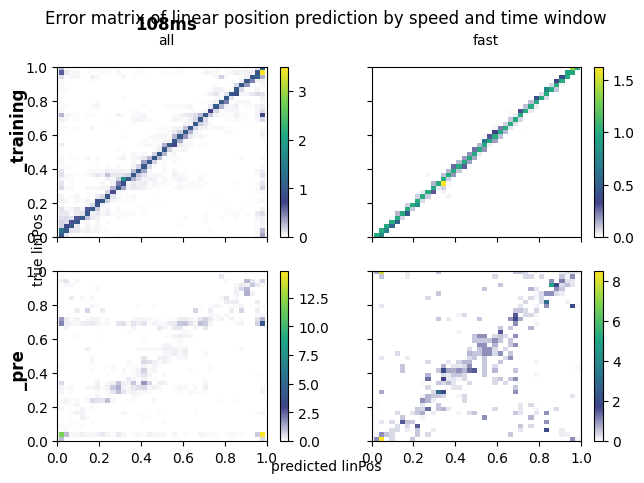

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, MFB, cond, 108


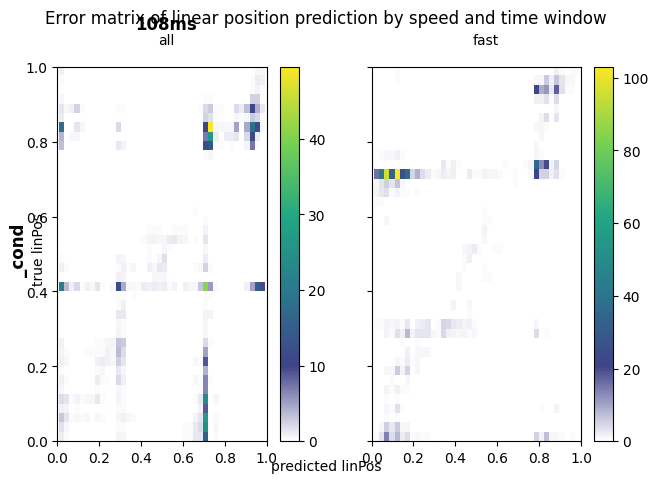

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, MFB, post, 108


/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:3161: RuntimeWarning: divide by zero encountered in divide
  H = H / H.max(axis=1)  # the max value of the histogram is 1
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:3161: RuntimeWarning: invalid value encountered in divide
  H = H / H.max(axis=1)  # the max value of the histogram is 1
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:3189: RuntimeWarning: divide by zero encountered in divide
  H = H / H.max(axis=1)  # the max value of the histogram is 1
/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/resultAnalysis/paper_figures.py:3189: RuntimeWarning: invalid value encountered in divide
  H = H / H.max(axis=1)  # the max value of the histogram is 1


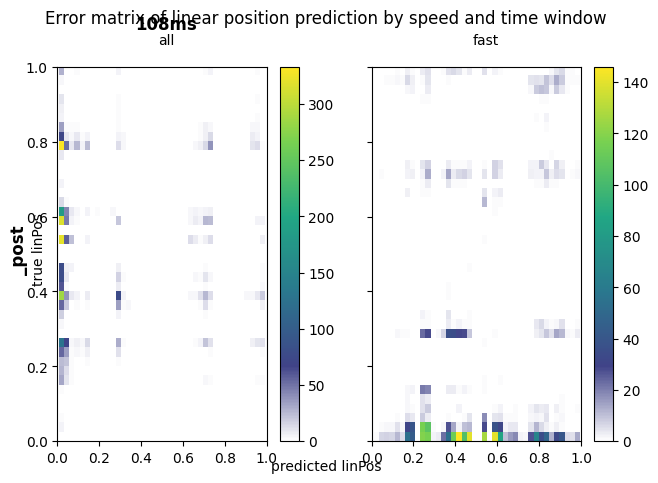

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, MFB, pre, 108


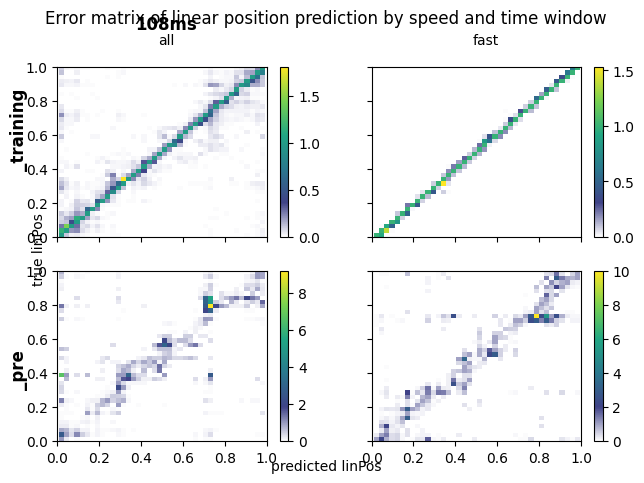

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, MFB, training, 108


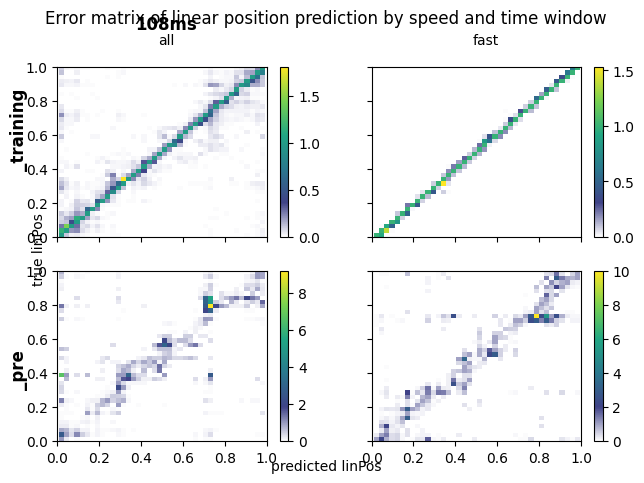

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, PAG, cond, 108


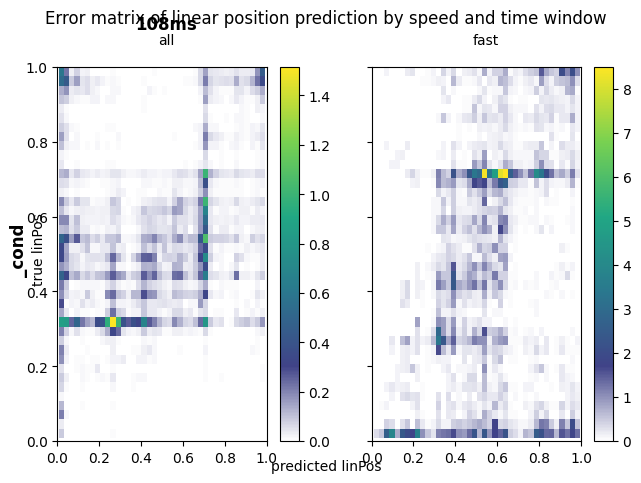

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, PAG, post, 108


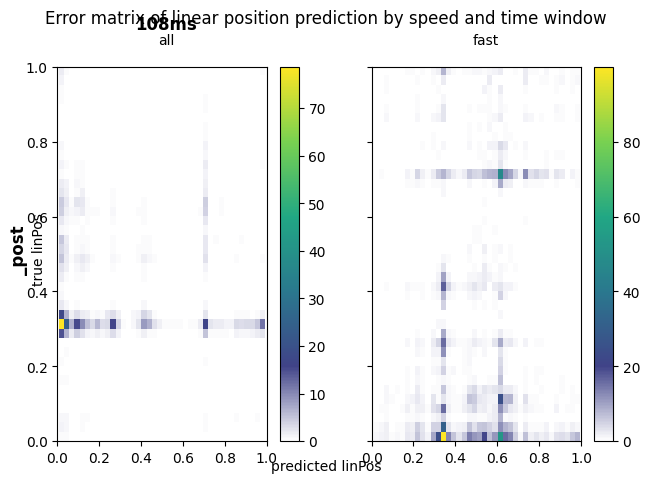

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, PAG, pre, 108


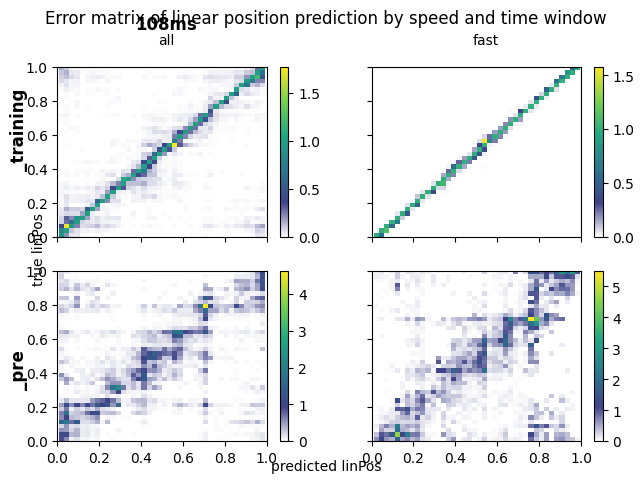

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, PAG, training, 108


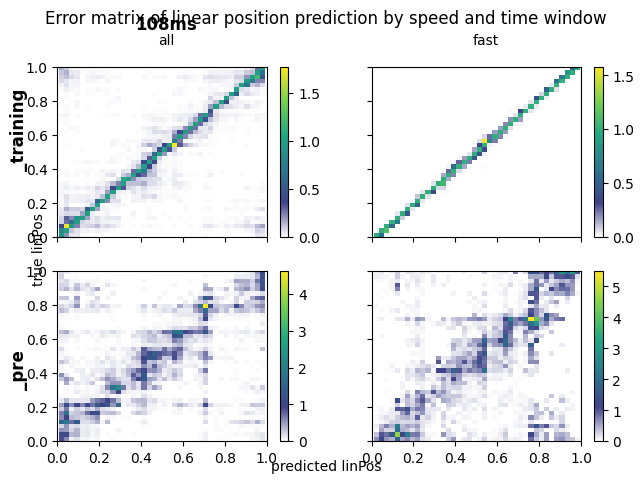

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, reversal, cond, 108


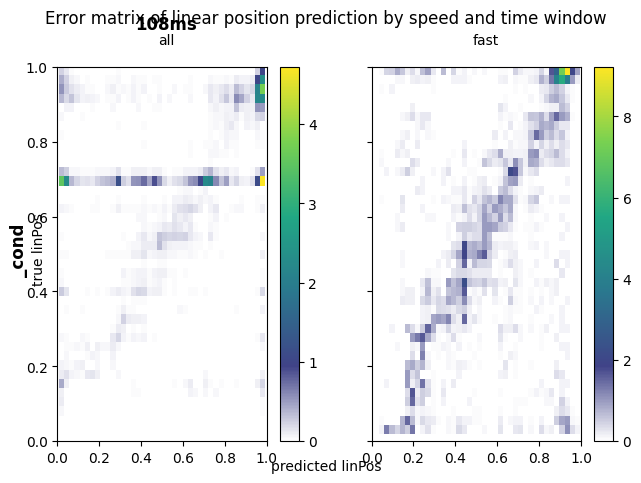

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, reversal, post, 108


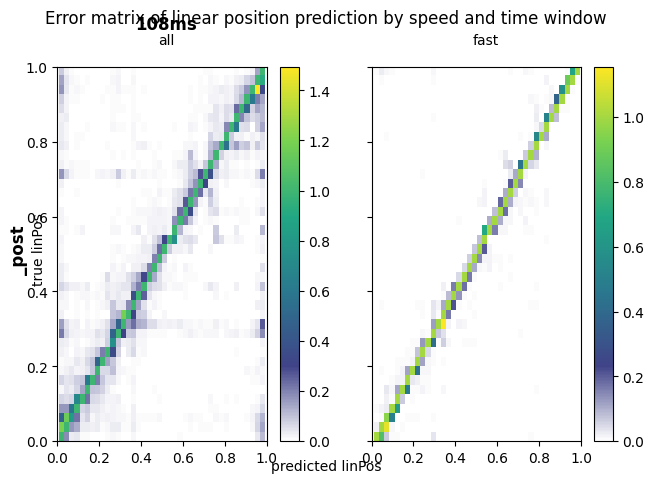

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, reversal, pre, 108


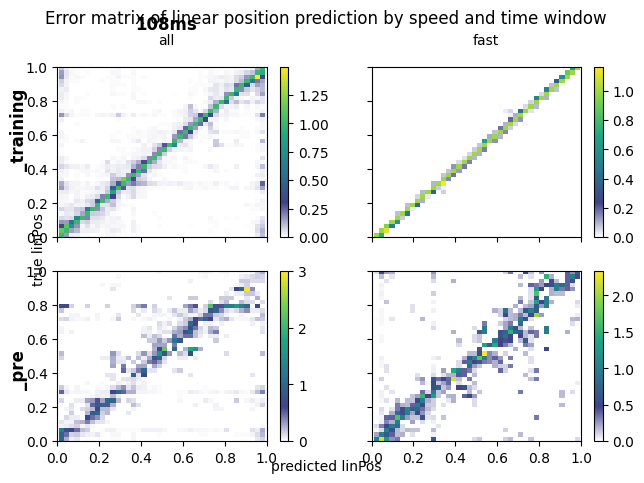

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1199, reversal, training, 108


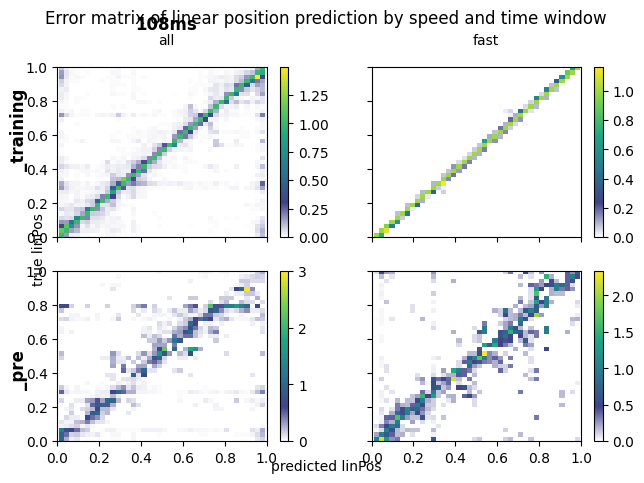

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Known, cond, 108


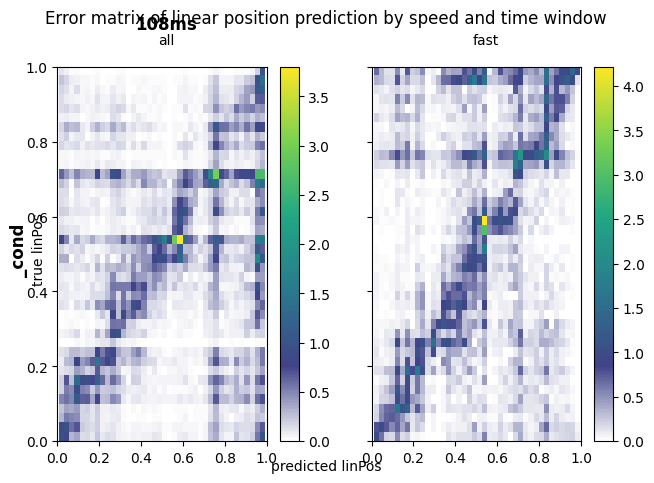

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Known, post, 108


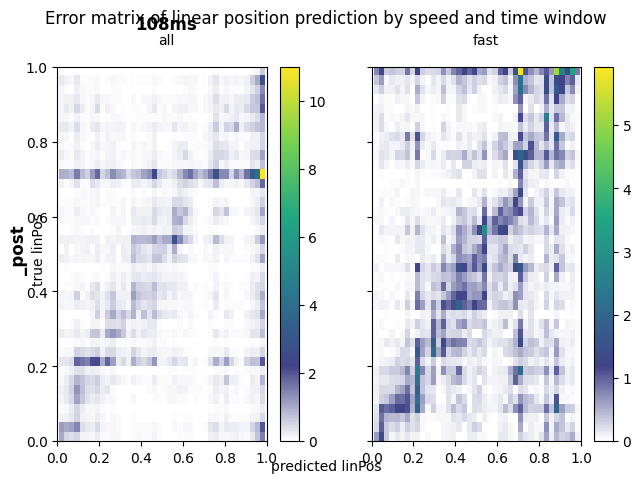

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Known, pre, 108


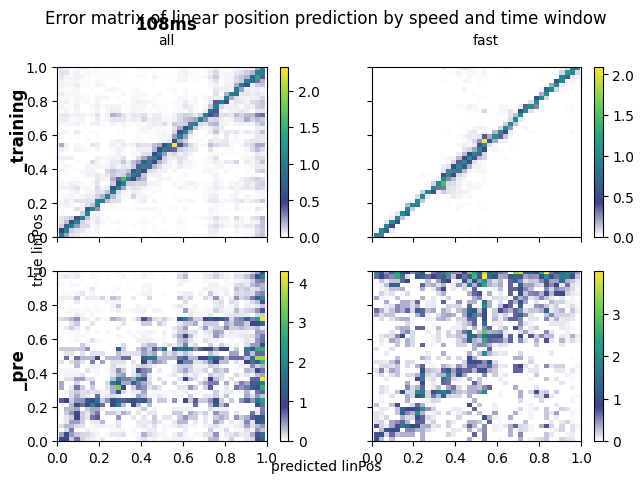

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Known, training, 108


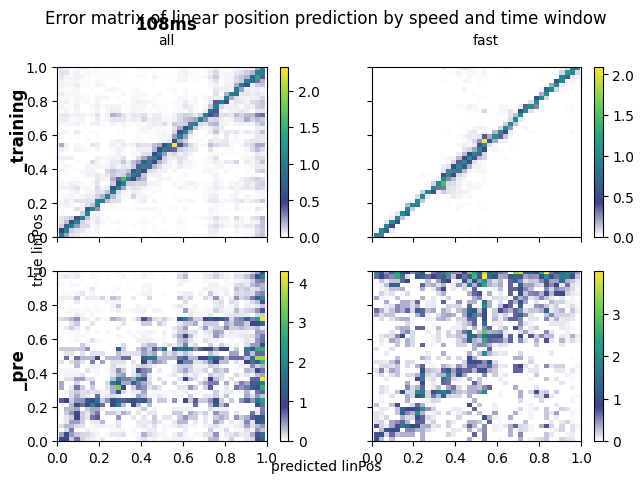

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Novel, cond, 108


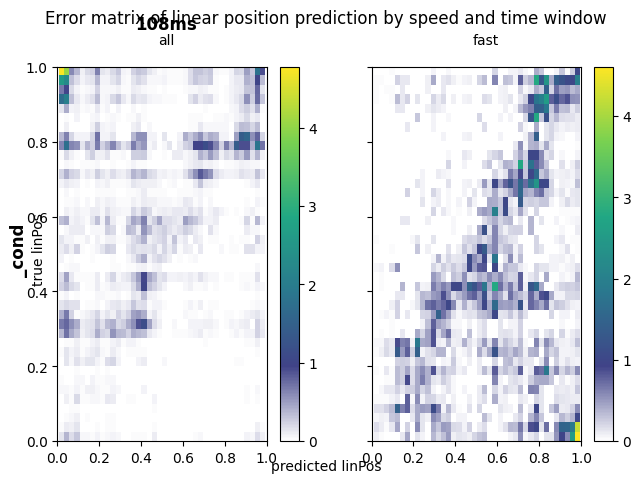

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Novel, post, 108


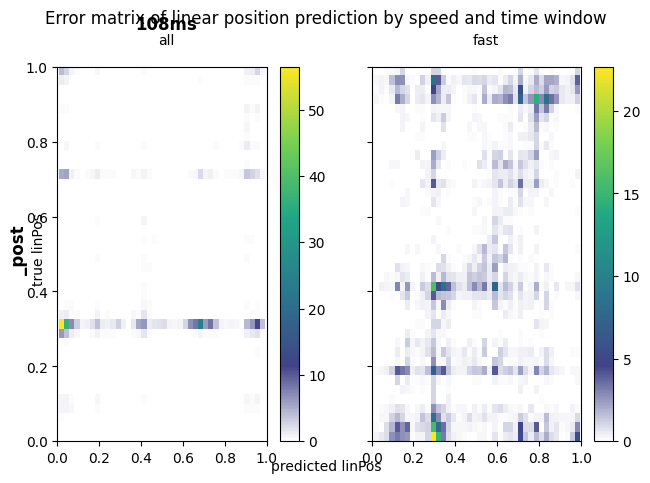

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Novel, pre, 108


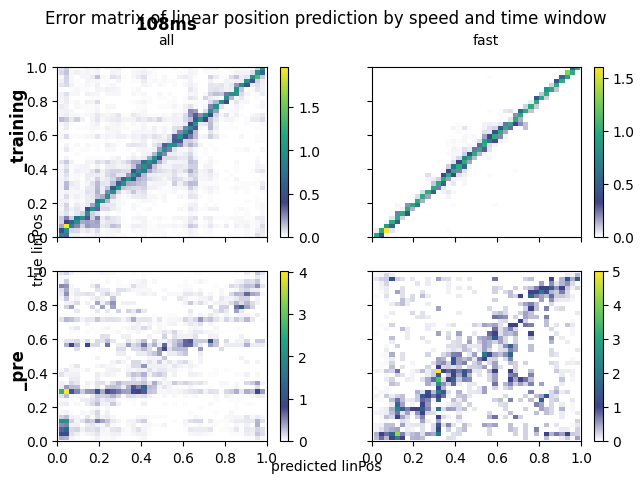

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1230, Novel, training, 108


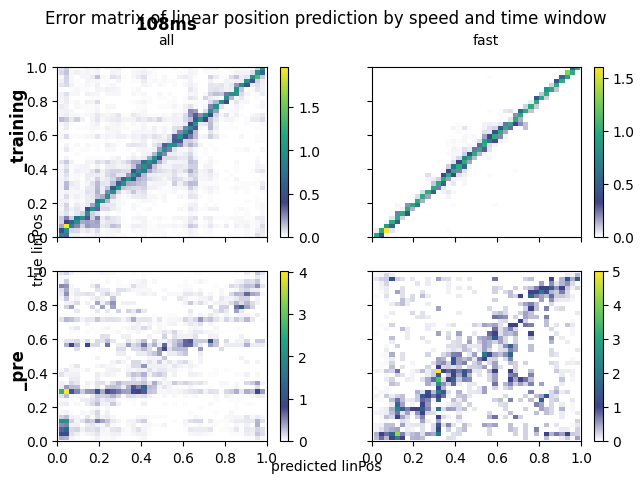

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, MFB, cond, 108


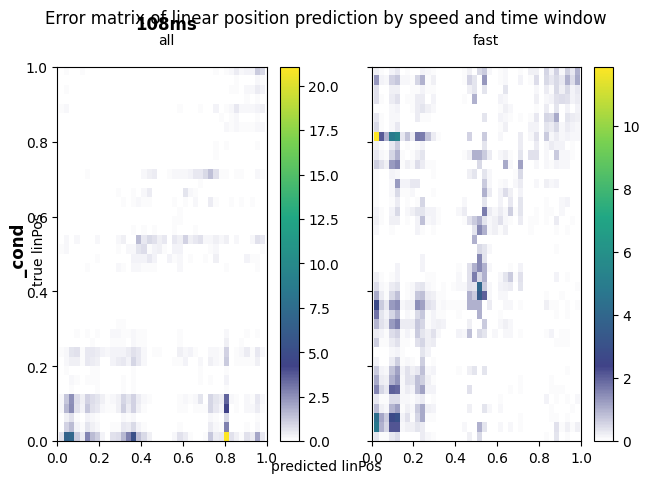

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, MFB, post, 108


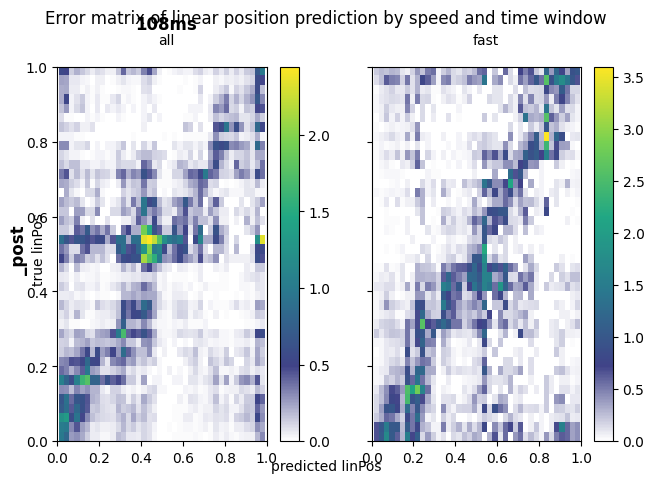

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, MFB, pre, 108


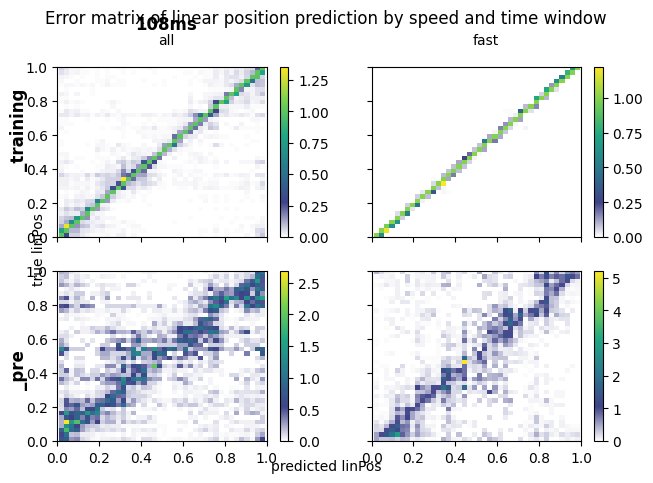

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, MFB, training, 108


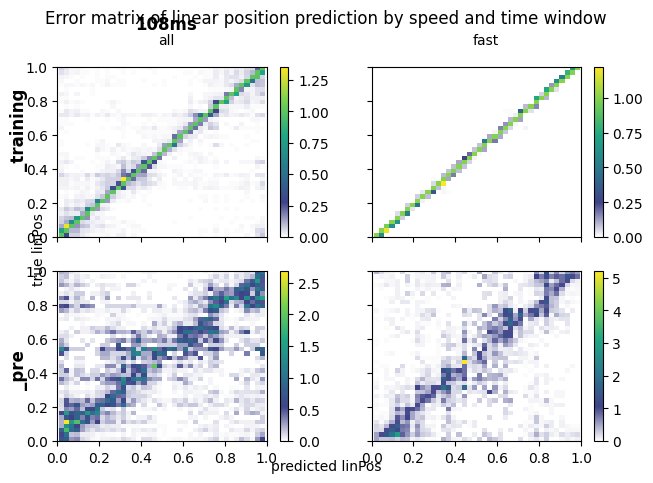

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, PAG, cond, 108


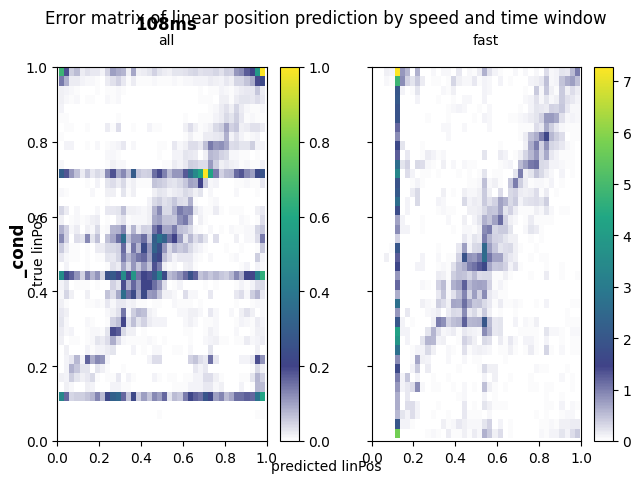

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, PAG, post, 108


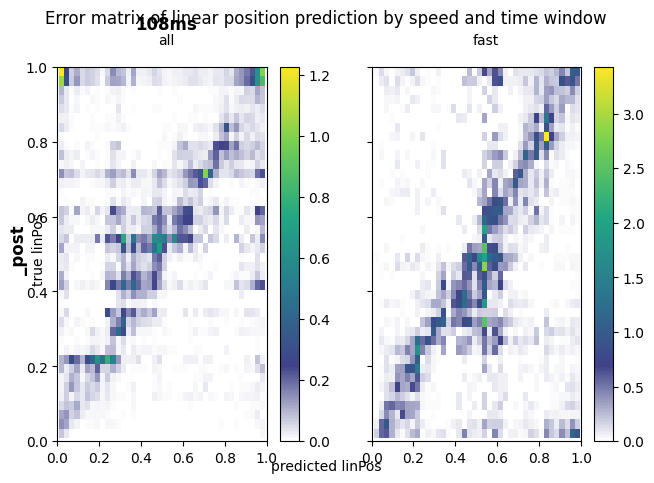

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, PAG, pre, 108


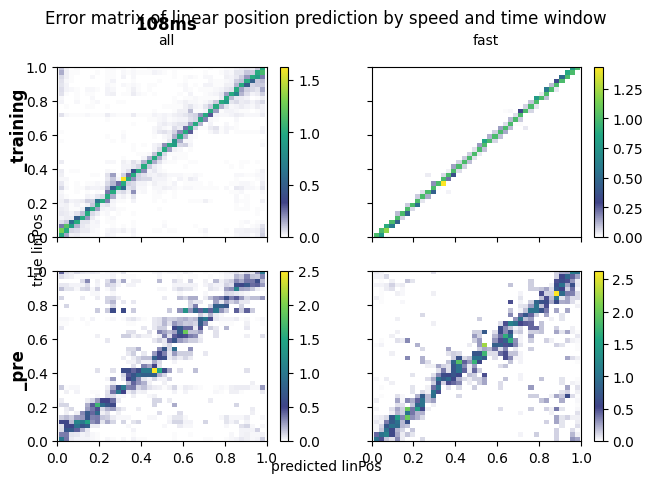

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 1239, PAG, training, 108


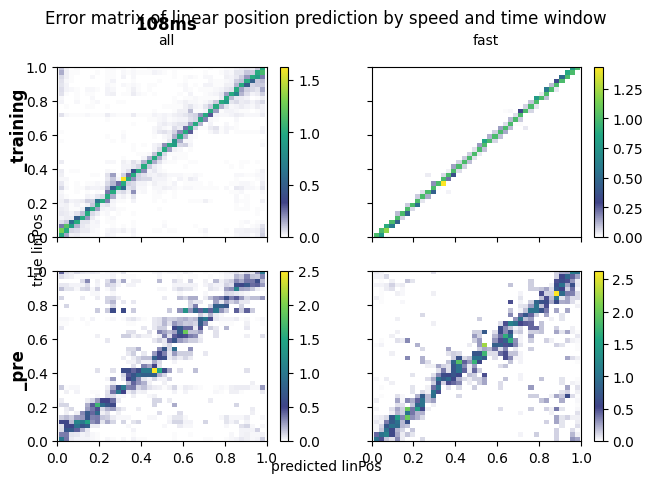

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 905, PAG, cond, 108


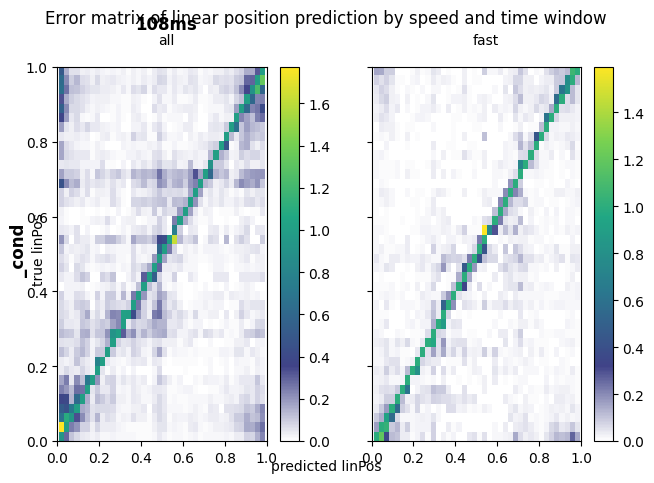

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 905, PAG, post, 108


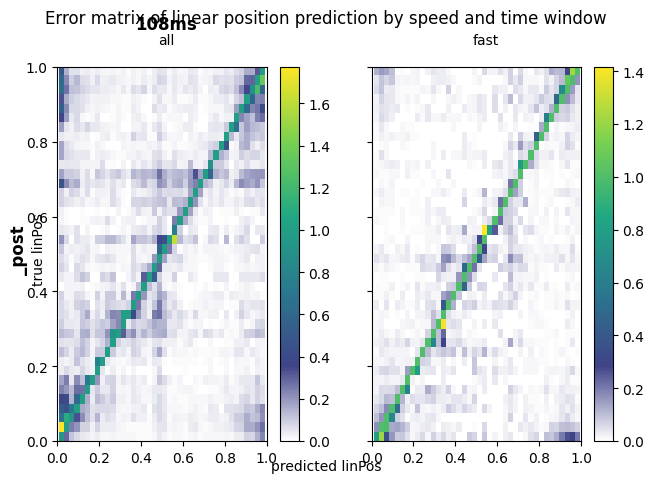

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 905, PAG, pre, 108


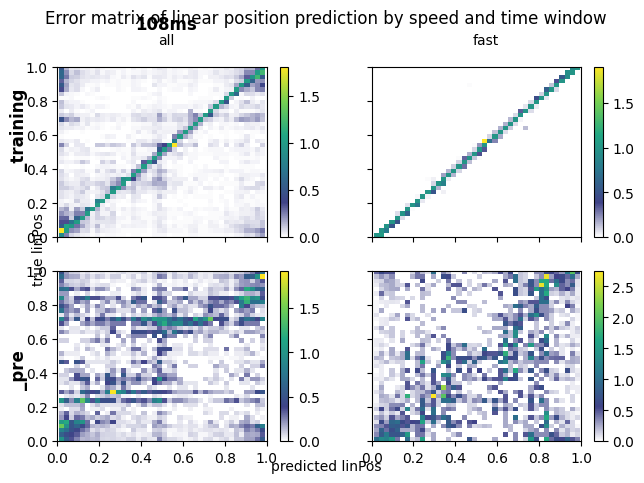

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 905, PAG, training, 108


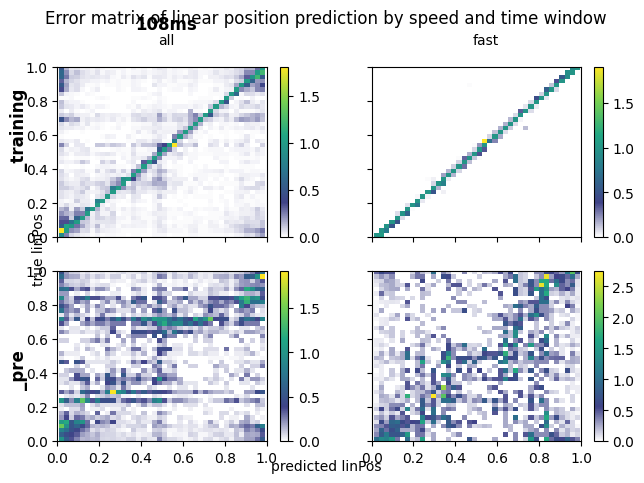

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 994, PAG, cond, 108


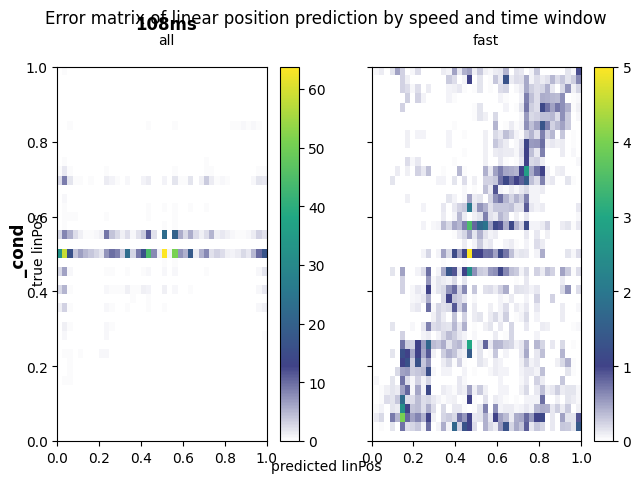

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 994, PAG, post, 108


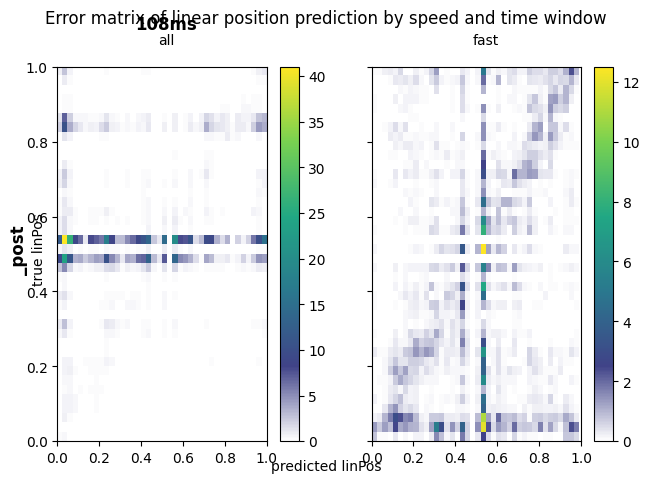

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 994, PAG, pre, 108


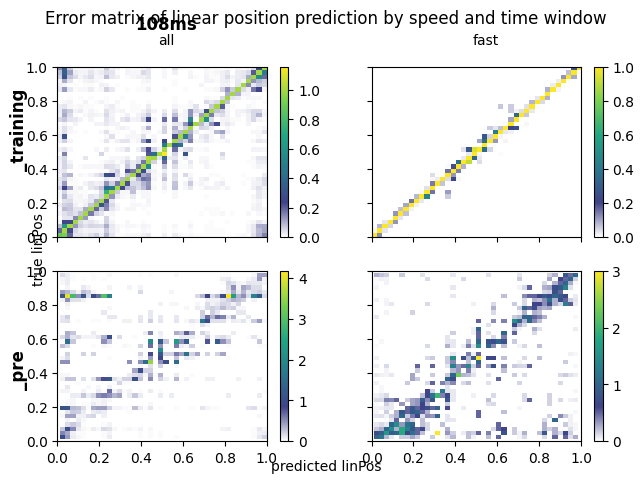

Processing STRIDE_4_consensus_linspeed_bigLatent_groupConcatenation_Transformer, 994, PAG, training, 108


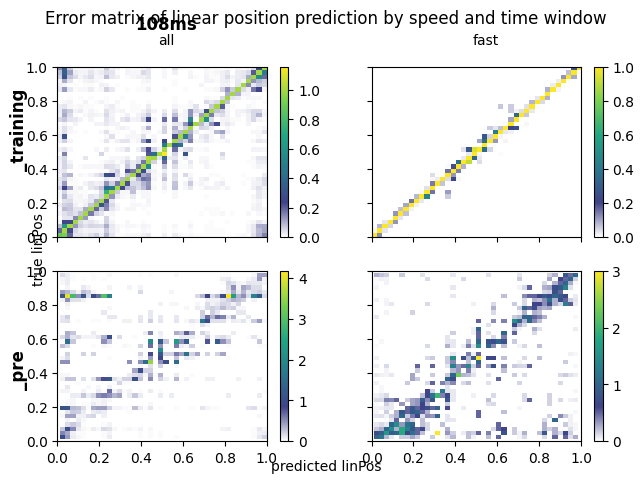

In [130]:
for (nameExp, mouse, manipe, phase, winMS), group in loader_all.results_df.query(
    "nameExp == @nameExp and winMS == 108"
).groupby(["nameExp", "mouse", "manipe", "phase", "winMS"]):
    for row in group.itertuples():
        print(f"Processing {nameExp}, {mouse}, {manipe}, {phase}, {winMS}")
        row.results.error_matrix_linerrors_by_speed(show=True)

In [38]:
loader_all.mean_error_matrix_linerrors_by_speed(
    normalized=True,
    show=True,
    winMS_list=108,
    nameExp_list=good_nameExp,
    phase_list=["training", "pre", "cond"],
    folder=main_dir,
)

NameError: name 'good_nameExp' is not defined

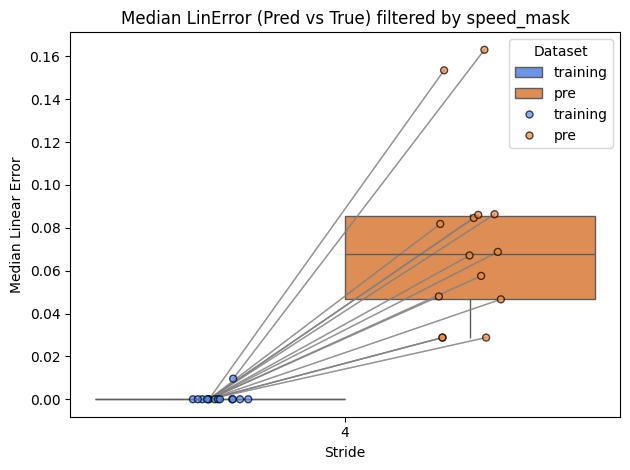

In [48]:
loader_all.plot_ann_pred_by_stride_and_phase(
    phase_list=["training", "pre"], stride_list=["4"], show=True, folder=main_dir
)

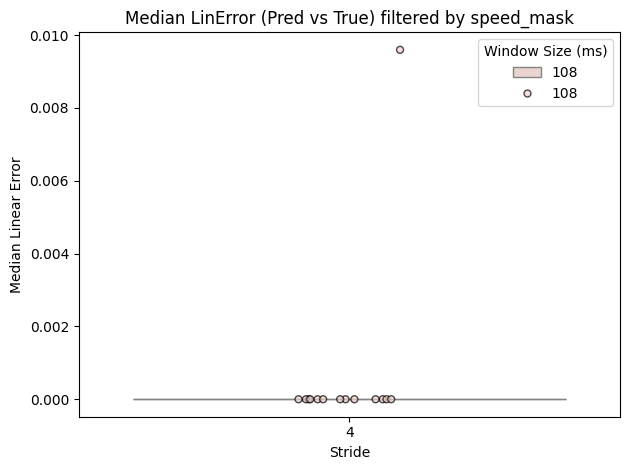

In [49]:
loader_all.plot_ann_pred_by_stride_and_winMS(
    phase_list="training", stride_list=["4"], show=True
)

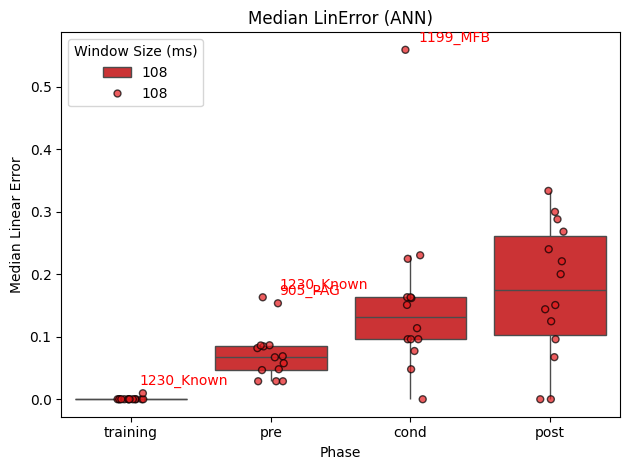

,mouse_manipe,phase,winMS,stride,median_error
0,1117_MFB,cond,108,4,0.095962
1,1117_MFB,post,108,4,0.299697
2,1117_MFB,pre,108,4,0.084610
3,1117_MFB,training,108,4,0.000000
4,1162_MFB,cond,108,4,0.224641
5,1162_MFB,post,108,4,0.333293
6,1162_MFB,pre,108,4,0.081825
7,1162_MFB,training,108,4,0.000000
8,1162_PAG,cond,108,4,0.161835
9,1162_PAG,post,108,4,0.143939


In [50]:
loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"], stride_list=["4"], show=True
)

In [51]:
loader_all.results_df["results"].iloc[0].ann.GaussianHeatmap.get_allowed_mask()
true_position = (
    loader_all.results_df["results"]
    .iloc[0]
    .positions[:, :2][
        loader_all.results_df["results"].iloc[0].fullBehavior["Times"]["speedFilter"]
    ]
)
pred_position = np.random.uniform(0, 1, size=true_position.shape)
# remove the ones outside the allowed mask
# convert the 45x45 mask in [O,1] coordinates to a (x,y) coordinates
allowed_mask = (
    loader_all.results_df["results"]
    .iloc[0]
    .ann
    .GaussianHeatmap.get_allowed_mask()
    .T
)
allowed_coords = np.argwhere(allowed_mask)
allowed_coords = (allowed_coords + 0.5) / 45  # center of each bin
# for each pred_position, find the closest allowed_coords
filtered_pred_position = []
for pos in pred_position:
    dists = np.linalg.norm(allowed_coords - pos, axis=1)
    closest_idx = np.argmin(dists)
    filtered_pred_position.append(allowed_coords[closest_idx])
filtered_pred_position = np.array(filtered_pred_position)

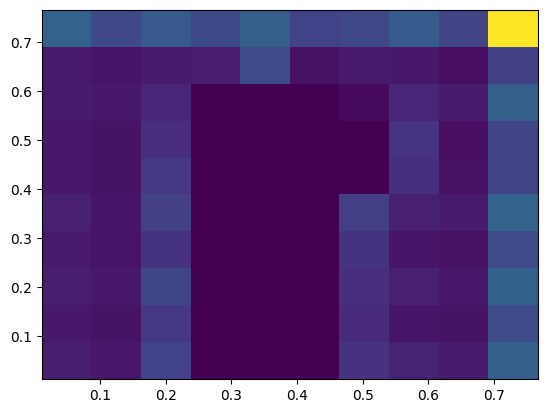

In [52]:
plt.hist2d(filtered_pred_position[:, 0], filtered_pred_position[:, 1])
plt.show()

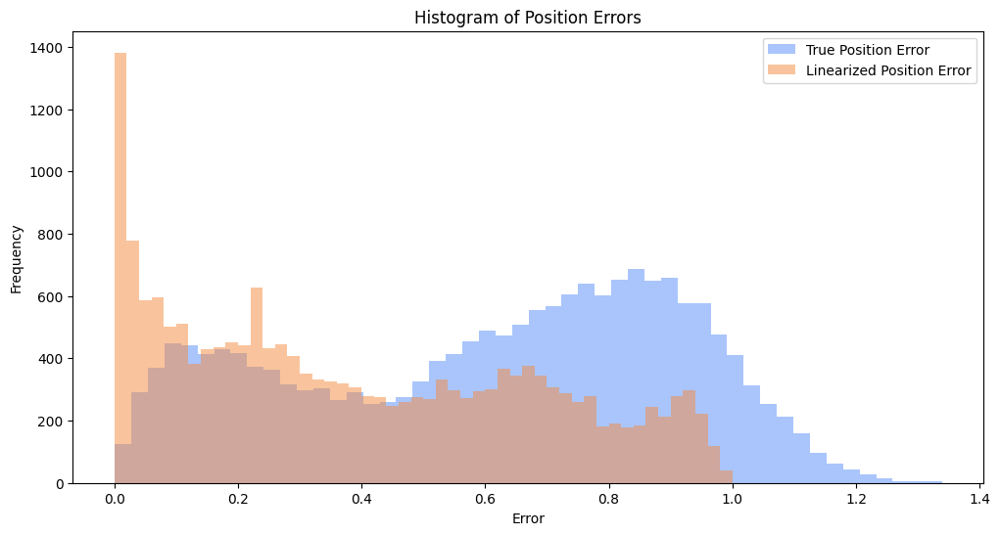

In [53]:
true_position = (
    loader_all.results_df["results"]
    .iloc[0]
    .positions[:, :2][
        loader_all.results_df["results"].iloc[0].fullBehavior["Times"]["speedFilter"]
    ]
)
true_position = true_position[~np.isnan(true_position).any(axis=1)]

# random chance by simply shuffling positions
random_position = np.random.permutation(true_position)

# apply lin function
lin_true = loader_all.results_df["results"].iloc[0].l_function(true_position)[1]
lin_random = loader_all.results_df["results"].iloc[0].l_function(random_position)[1]
# compute error
error_true = np.linalg.norm(true_position - random_position, axis=1)
error_lin = np.abs(lin_true - lin_random)

# plot histogram of errors
plt.figure(figsize=(12, 6))
plt.hist(error_true, bins=50, alpha=0.5, label="True Position Error")
plt.hist(error_lin, bins=50, alpha=0.5, label="Linearized Position Error")
plt.xlabel("Error")
plt.ylabel("Frequency")
plt.title("Histogram of Position Errors")
plt.legend()

In [54]:
np.median(error_lin)

np.float64(0.33095210581921)

In [55]:
chance_level_mean = np.mean(error_lin)
chance_level_median = np.median(error_lin)

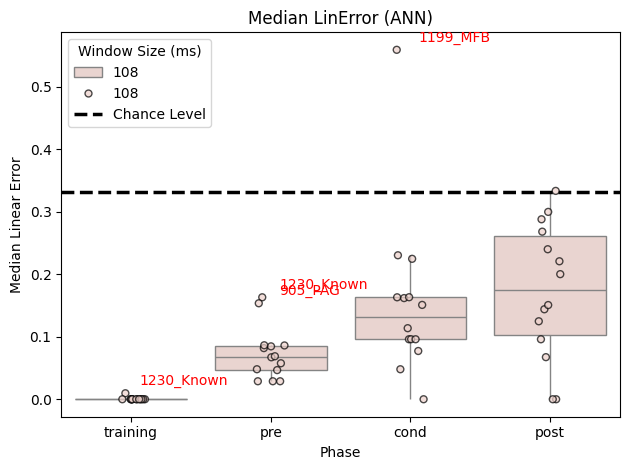

In [56]:
fig, ax = plt.subplots()
err_df_median = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    show=True,
    ax=ax,
    chance_level=chance_level_median,
    palette=None,
)
fig.savefig(
    os.path.join(main_dir, "meadian_lin_error_per_phase_with_chance_level.png"), dpi=300
)
fig.savefig(
    os.path.join(main_dir, "median_lin_error_per_phase_with_chance_level.svg"), dpi=300
)

In [58]:
import plotly.express as px
import plotly.graph_objects as go
from plotly.colors import qualitative

# --- After computing err_df as in your original code ---
phase_list = ["training", "pre", "cond", "post"]
# Convert winMS to string to handle as categorical
err_df_median["winMS"] = err_df_median["winMS"].astype(str)
winMS_order = ["108"]
# Create interactive boxplot with scatter points
fig = px.box(
    err_df_median,
    x="phase",
    y="median_error",
    color="winMS",
    points="all",  # show all points
    hover_data=["mouse_manipe", "winMS", "stride"],  # info on hover
    category_orders={
        "phase": phase_list
        if phase_list is not None
        else sorted(err_df["phase"].unique()),
        "winMS": ["108"],  # specify order for winMS
    },
)

# Colors for winMS lines
winMS_colors = {w: c for w, c in zip(winMS_order, qualitative.Plotly)}

# Connect points per mouse and winMS with color based on winMS
for mouse, sub in err_df_median.sort_values(
    "phase", key=lambda x: x.map({v: i for i, v in enumerate(phase_list)})
).groupby("mouse_manipe"):
    for winMS in winMS_order:
        sub_win = sub[sub["winMS"] == winMS]
        if len(sub_win) > 1:
            fig.add_trace(
                go.Scatter(
                    x=sub_win["phase"],
                    y=sub_win["median_error"],
                    mode="lines+markers",
                    line=dict(color=winMS_colors[winMS], width=1),
                    marker=dict(size=6, opacity=0.6),
                    showlegend=False,
                )
            )

fig.update_layout(
    title="Median Linear Error (Pred vs True) on Ground Truth",
    xaxis_title="Phase",
    yaxis_title="Mean Linear Error",
    boxmode="group",
)

fig.show()

In [59]:
stride = "4"
winMS = 108
nameExp_bayes = f"{nameExp}"
sub_df = loader_all.results_df.query("stride == @stride & winMS == @winMS").copy()
bayes_df = loader_all.results_df.query(
    "nameExp == @nameExp_bayes & winMS == @winMS"
).reset_index(drop=True)
sub_df = sub_df.reset_index(drop=True)
sub_df["mean_lin_error_bayes"] = bayes_df["mean_lin_error_bayes"].values
sub_df["mean_lin_error_selected_bayes"] = bayes_df[
    "mean_lin_error_selected_bayes"
].values

long_df = pd.melt(
    sub_df,
    id_vars=["mouse", "phase"],
    value_vars=[
        "mean_lin_error",
        "mean_lin_error_selected",
        "mean_lin_error_bayes",
        "mean_lin_error_selected_bayes",
    ],
    var_name="filtered_error",
    value_name="Error&Decoder",
)
# custom palette, different colors for ann and bayes : give "mean_lin_error" and "mean_lin_error_selected" the same palette color, and "mean_lin_error_bayes" and "mean_lin_error_selected_bayes" another palette color
palette = {
    "mean_lin_error": "#4E79A7",  # blue (ANN)
    "mean_lin_error_selected": "#4E79A7",  # blue (ANN, same as above)
    "mean_lin_error_bayes": "#F28E2B",  # orange (Bayes)
    "mean_lin_error_selected_bayes": "#F28E2B",  # orange (Bayes, same as above)
}
sns.boxplot(
    data=long_df,
    x="phase",
    y="Error&Decoder",
    hue="filtered_error",
    palette=palette,
    order=["training", "pre", "cond", "post"],
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.png",
    )
)
plt.savefig(
    os.path.join(
        main_dir,
        "boxplot_mean_lin_error_and_selected_and_bayes.svg",
    )
)
plt.show()

KeyError: 'mean_lin_error_bayes'

Processing mouse 1162_MFB, phase cond, winMS 252, stride 4
Processing mouse 1162_MFB, phase post, winMS 252, stride 4
Processing mouse 1162_MFB, phase pre, winMS 252, stride 4
Processing mouse 1162_MFB, phase training, winMS 252, stride 4
Processing mouse 1199_PAG, phase cond, winMS 36, stride 4
Processing mouse 1199_PAG, phase cond, winMS 108, stride 4
Processing mouse 1199_PAG, phase cond, winMS 252, stride 4
Processing mouse 1199_PAG, phase post, winMS 36, stride 4
Processing mouse 1199_PAG, phase post, winMS 108, stride 4
Processing mouse 1199_PAG, phase post, winMS 252, stride 4
Processing mouse 1199_PAG, phase pre, winMS 36, stride 4
Processing mouse 1199_PAG, phase pre, winMS 108, stride 4
Processing mouse 1199_PAG, phase pre, winMS 252, stride 4
Processing mouse 1199_PAG, phase training, winMS 36, stride 4
Processing mouse 1199_PAG, phase training, winMS 108, stride 4
Processing mouse 1199_PAG, phase training, winMS 252, stride 4
Processing mouse 1230_Known, phase cond, winMS 3

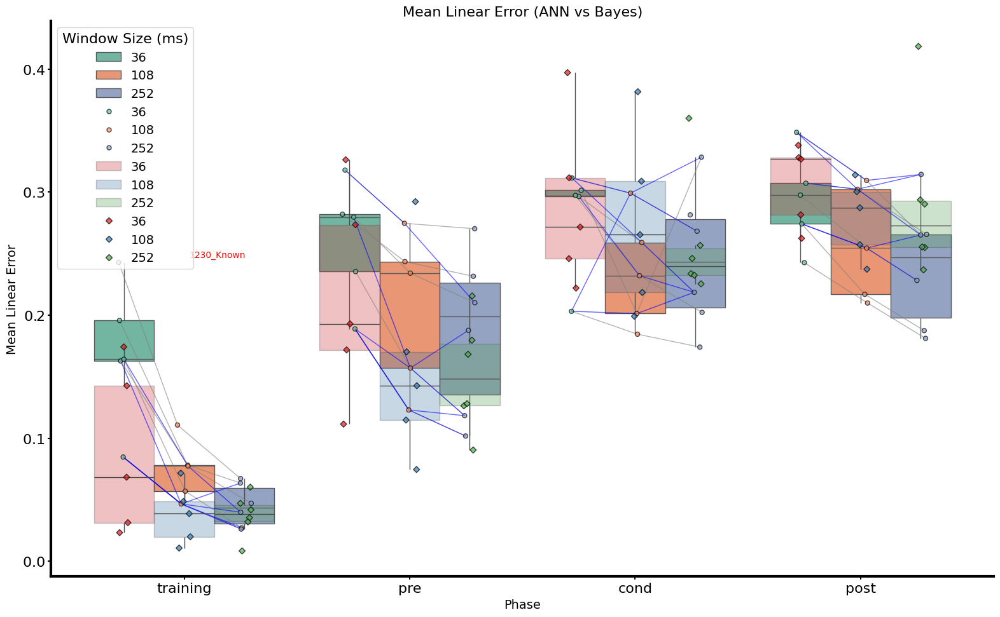

In [42]:
nameExp = "new_4d_GaussianHeatMap_LinearLoss_Transformer"


err_df = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    show=True,
    add_bayes=True,
    bayes_nameExp=bayes_nameExp,
)

In [156]:
# drop duplicates bases on (nameExp, mouse, manipe, phase, winMS) and keep the first
tmp_df = (
    loader_all.results_df.query("winMS == 108 and stride == '4'")
    .drop_duplicates(subset=["nameExp", "mouse", "manipe", "phase", "winMS"])
    .copy()
)

In [157]:
loader_all.results_df = tmp_df

In [159]:
loader_all.results_df.query("winMS == 108 and stride == '4' and phase == 'training'")

,nameExp,mouse,manipe,phase,winMS,asymmetry_index,fullTruePos_fromBehavior,alignedTruePos_fromBehavior,fullTrueLinPos_from_behavior,alignedTrueLinPos_from_behavior,...,training_asymmetry_index,real_asymmetry_ratio,predicted_asymmetry_ratio,predicted_asymmetry_ratio_on_selected,predicted_asymmetry_ratio_normalized,selected_predicted_asymmetry_ratio_normalized,stride,mean_lin_error_fast,mean_lin_error_fast_selected,mouse_manipe
3,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1117,MFB,training,108,0.448039,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.3965471685398473, 0.929816128045927, -2.62...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.4320720024770645, 0.4320720024770645, 0.432...",...,0.448039,1.0,0.995749,2.074901,0.446135,0.929638,4,0.007004,0.004515,1117_MFB
11,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,MFB,training,108,1.016456,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.8622632105210867, 0.028524433536982814, 2....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9863638134089385, 0.9863638134089385, 0.986...",...,1.016456,1.0,0.817148,1.614249,0.830595,1.640813,4,0.002914,0.002529,1162_MFB
10,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1162,PAG,training,108,1.315276,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.3816415401420159, 0.8985669463384608, -2.8...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.4224006735139765, 0.4224006735139765, 0.422...",...,1.315276,1.0,0.895488,0.549404,1.177814,0.722618,4,0.007307,0.003806,1162_PAG
15,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1168,MFB,training,108,0.950422,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.5009190907633936, 0.9286619071083894, 0.71...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.49882553259824186, 0.49882553259824186, 0.4...",...,0.950422,1.0,1.115545,1.004888,1.060238,0.955067,4,0.002930,0.002684,1168_MFB
19,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1182,PAG,training,108,1.061119,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.22356891874452425, 0.828691758705172, -2.2...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.3358657644864695, 0.3358657644864695, 0.345...",...,1.061119,1.0,0.967018,0.716986,1.026121,0.760808,4,0.004299,0.003415,1182_PAG
33,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1199,MFB,training,108,0.925175,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.35830314768210964, 0.964775773498806, 3.03...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.41271075713848177, 0.4030465261291109, 0.40...",...,0.925175,1.0,1.139218,1.509149,1.053976,1.396226,4,0.004348,0.003702,1199_MFB
32,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1199,PAG,training,108,0.926134,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.22405889024065948, 0.8236949057767369, -2....","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.2782816122774679, 0.2782816122774679, 0.278...",...,0.926134,1.0,1.026793,1.117052,0.950948,1.034539,4,0.004305,0.003150,1199_PAG
35,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1199,reversal,training,108,1.172129,"[[0.34979752769405253, 0.969768214238111, -2.4...","[[0.250772386900322, 0.218320060101429, 1.3868...","[0.41271075713848177, 0.4030465261291109, 0.40...","[0.07676767574120451, 0.07676767574120451, 0.0...",...,1.172129,1.0,1.005960,1.415998,1.179115,1.659733,4,0.003535,0.003235,1199_reversal
42,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1230,Known,training,108,0.611765,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.7579667187718461, 0.1034298178270899, -2.4...","[nan, nan, nan, nan, nan, nan, nan, nan, nan, ...","[0.9616159014264082, 0.9616159014264082, 0.961...",...,0.611765,1.0,1.087432,1.570652,0.665253,0.960870,4,0.018568,0.004956,1230_Known
43,STRIDE_4_consensus_linspeed_bigLatent_groupCon...,1230,Novel,training,108,2.091676,"[[nan, nan, nan, inf], [nan, nan, nan, inf], [...","[[0.6437592209167801, 0.9594874061171383, -3.1...","

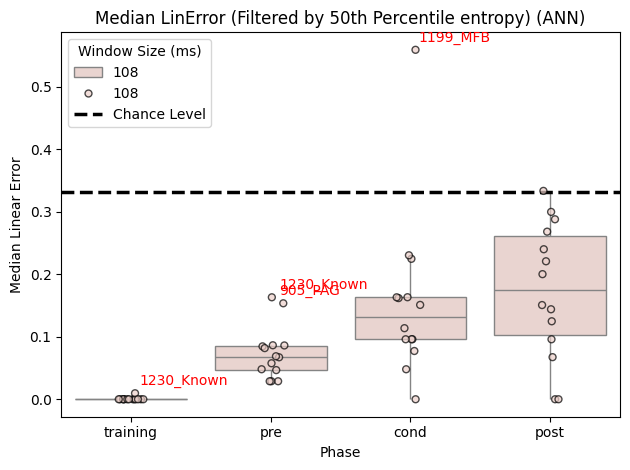

In [61]:
fig, ax = plt.subplots()
err_df_filtered = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    show=True,
    ax=ax,
    chance_level=chance_level_median,
    entropy_thresh_pct=50,
    palette=None,
    folder=main_dir,
)

from importlib import reload
from neuroencoders.importData import epochs_management as epfig, axs = plt.subplots(3,2)
axs = axs.flatten()
for i, ax in enumerate(axs):
    ax.plot(predloss_ticks[i][-1], errors_filtered[i][-1])
    # plot in hline the 50th percentile of predloss_ticks
    ax.axvline(np.percentile(predloss_ticks[i][-1], 50), color='red', linestyle='--', label='50th Percentile')
    # plot in vline the corresponding mean linear error
    threshold_50 = np.percentile(predloss_ticks[i][-1], 50)
    mean_error_50 = errors_filtered[i][-1][np.argmin(np.abs(predloss_ticks[i][-1] - threshold_50))]
    ax.axhline(mean_error_50, color='green', linestyle='--', label='Mediann Error at 50th Percentile')
    ax.set_title(f"Mouse {mouse_name[i]} - phase training")
    ax.set_xlabel("PredLoss Threshold")
    ax.set_ylabel("Mean Linear Error")
plt.tight_layout()

In [62]:
loader_all.results_df["stride"] = "4"

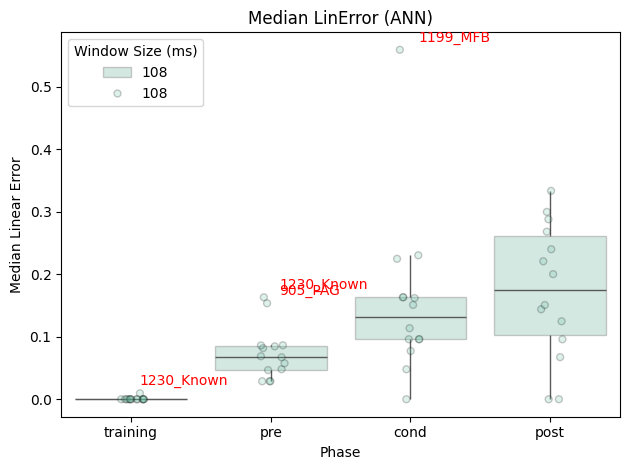

/home/mickey/Documents/Theotime/neuroEncoders/neuroencoders/utils/MOBS_Functions.py:5776: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(title="Window Size (ms)")


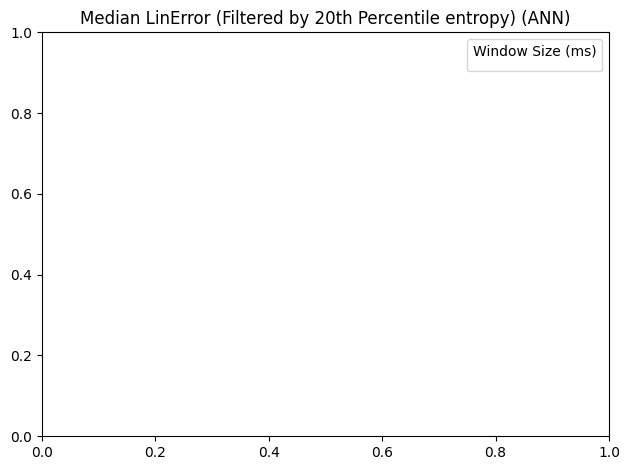

In [63]:
fig, ax = plt.subplots()
err_df_1 = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    winMS_list=["108"],
    show=True,
    ax=ax,
    palette="Set2",
    alpha=0.3,
)

err_df_filtered = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    winMS_list=["108"],
    show=True,
    ax=ax,
    chance_level=chance_level_median,
    entropy_thresh_pct=20,
    palette="Set2",
)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.png"), dpi=300)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.svg"), dpi=300)

In [64]:
# connect points per mouse with lines INSIDE EACH hue, ie only connect in the same phase from one error type to the other error type
def connect_points(
    strip, data_df, color="gray", value_vars=None, var_name=None, value_name=None
):
    paths = strip.collections
    x_ticks = (
        phase_list if phase_list is not None else ["training", "pre", "cond", "post"]
    )

    coords = {}
    for i, (phase, winMS) in enumerate([(s, p) for s in x_ticks for p in value_vars]):
        coll = paths[i]
        offsets = coll.get_offsets()
        coords[(phase, winMS)] = offsets

    # Connect across phases or winMSs
    if len(value_vars) > 1:
        for (mouse, phase, _), sub in data_df.groupby(
            ["mouse_manipe", "phase", "phase"]
        ):
            if set(sub[var_name]) >= set(value_vars):
                pts = []
                for _, row in sub.iterrows():
                    phase_val = str(row["phase"])
                    winMS_val = row[var_name]
                    arr = coords[(phase_val, winMS_val)]
                    idx = np.argmin(np.abs(arr[:, 1] - row[value_name]))
                    pts.append(arr[idx])
                if len(pts) == len(value_vars):
                    ax.plot(
                        [p[0] for p in pts],
                        [p[1] for p in pts],
                        color=color,
                        alpha=0.6,
                        linewidth=1,
                    )
    else:
        winMS = value_vars[0]
        for (mouse, phase), sub in data_df.query(f"{var_name} == @winMS").groupby(
            ["mouse_manipe", "phase"]
        ):
            pts = []
            for _, row in sub.iterrows():
                phase_val = str(row["phase"])
                arr = coords[(phase_val, winMS)]
                idx = np.argmin(np.abs(arr[:, 1] - row["mean_error"]))
                pts.append(arr[idx])
            if len(pts) > 1:
                pts = sorted(pts, key=lambda x: x[0])
                ax.plot(
                    [p[0] for p in pts],
                    [p[1] for p in pts],
                    color=color,
                    alpha=0.6,
                    linewidth=1,
                )

In [65]:
%autoreload 2

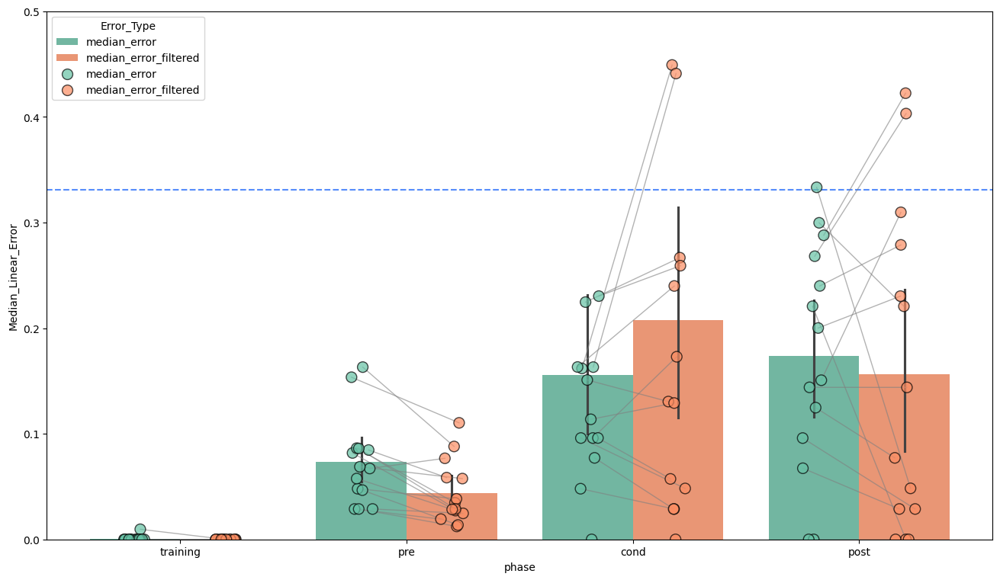

In [74]:
err_df_filtered = loader_all.plot_ann_pred_by_phase_and_winMS(
    phase_list=["training", "pre", "cond", "post"],
    stride_list=["4"],
    winMS_list=["108"],
    show=False,
    chance_level=chance_level_median,
    entropy_thresh_pct=50,
    palette="Set2",
    by="entropy",
)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.png"), dpi=300)
# fig.savefig(os.path.join(main_dir, "mean_lin_error_per_phase_with_chance_level_and_thresh.svg"), dpi=300)
my_df = pd.melt(
    err_df_filtered,
    id_vars=["mouse_manipe", "phase", "winMS"],
    value_vars=["median_error", "median_error_filtered"],
    var_name="Error_Type",
    value_name="Median_Linear_Error",
)

fig, ax = plt.subplots(figsize= (16,9))
sns.barplot(
    data=my_df,
    x="phase",
    y="Median_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    ax=ax,
    # flierprops={"marker": "x", "markersize": 5, "alpha": 1, "markeredgecolor": "black"},
)
# add a black circle to the points (stripplot)
ann_strip = sns.stripplot(
    data=my_df,
    x="phase",
    y="Median_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    dodge=True,
    edgecolor="black",
    linewidth=1,
    alpha=0.7,
    ax=ax,
    marker="o",
    size=10,
)
winMS_list = ["median_error", "median_error_filtered"]
ax.set_ylim(0, 0.5)
ax.axhline(chance_level_median, linestyle = "--", label = "Chance level")
connect_points(
    strip=ann_strip,
    data_df=my_df,
    color="gray",
    value_vars=winMS_list,
    var_name="Error_Type",
    value_name="Median_Linear_Error",
)
fig.savefig(
    os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.png"),
    dpi=300,
)
fig.savefig(
    os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.svg")
)

In [180]:
loader_all.results_df["mouse_manipe"] = (
    loader_all.results_df["mouse"] + "_" + loader_all.results_df["manipe"]
)
loader_all.results_df["stride"] = 4

In [75]:
main_dir

'/home/mickey/Dropbox/Mobs_member/Theotime_De_Charrin/Figures/Pres180526'

0: 1117_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0144


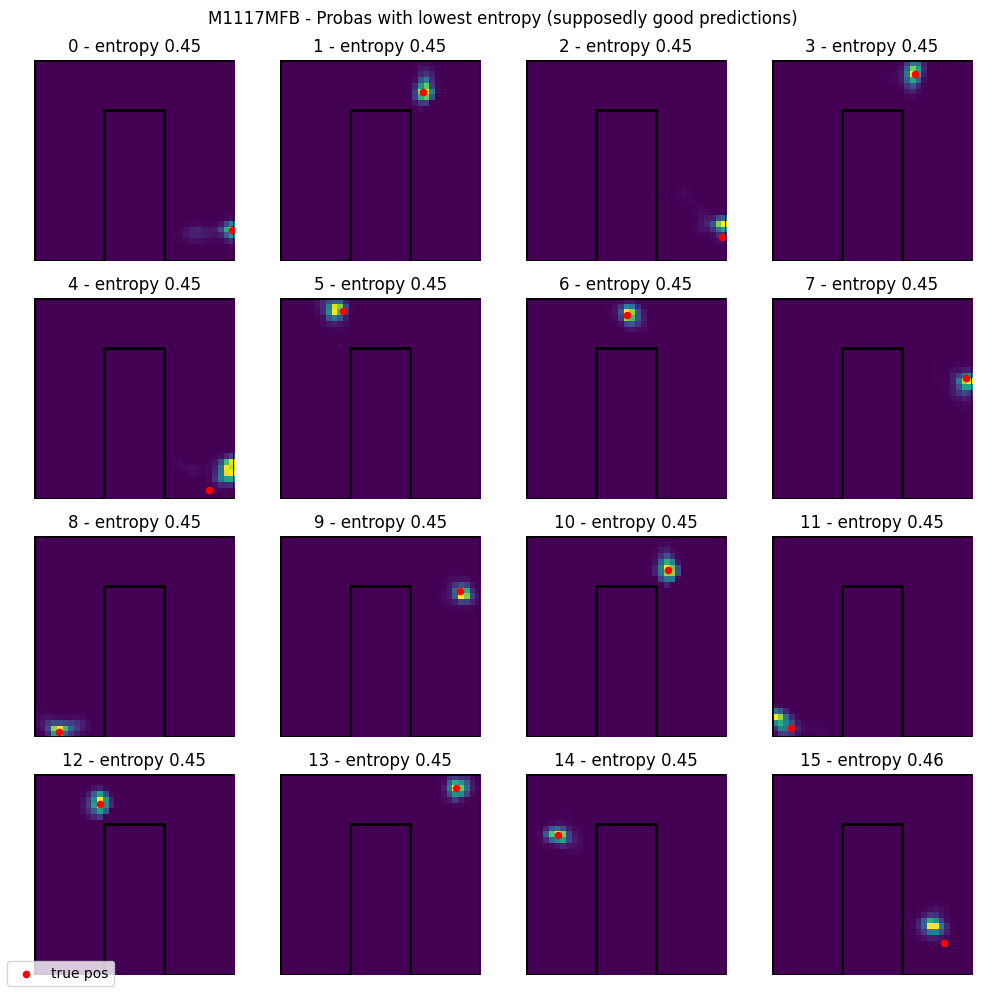

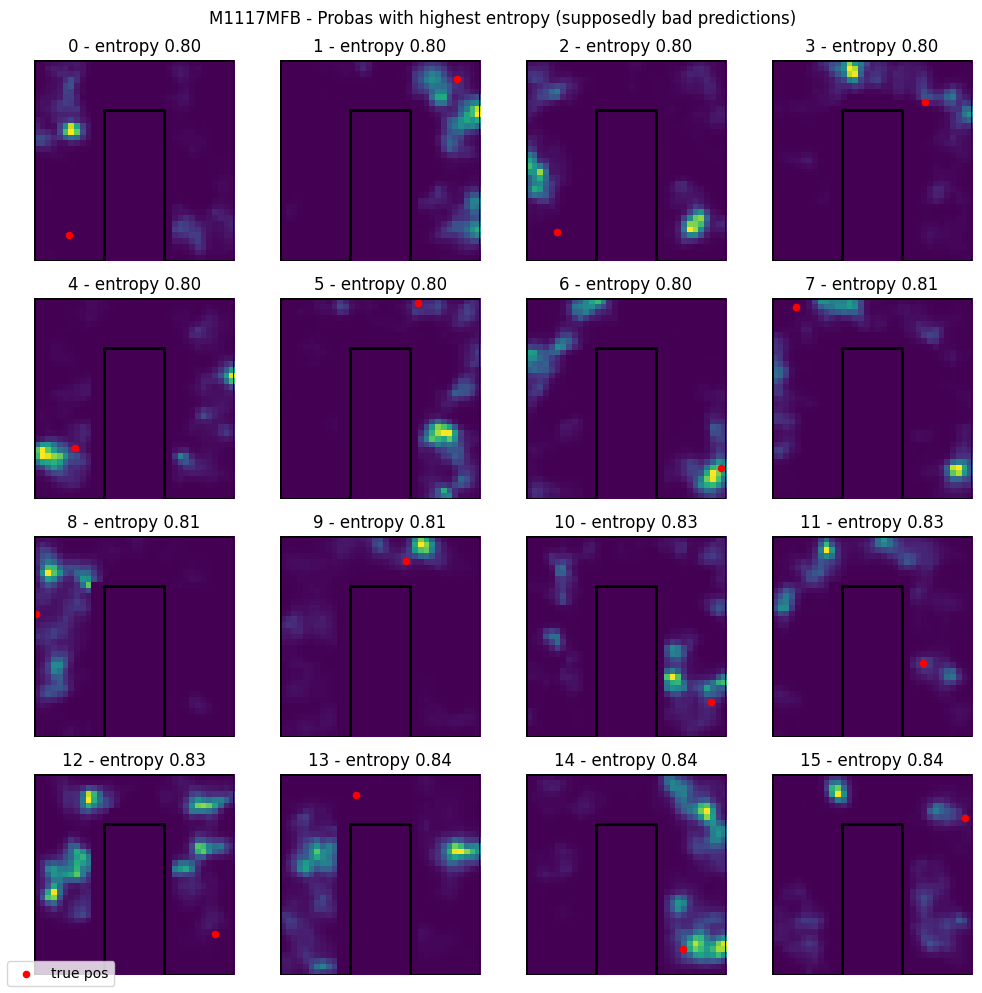

1: 1162_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0043


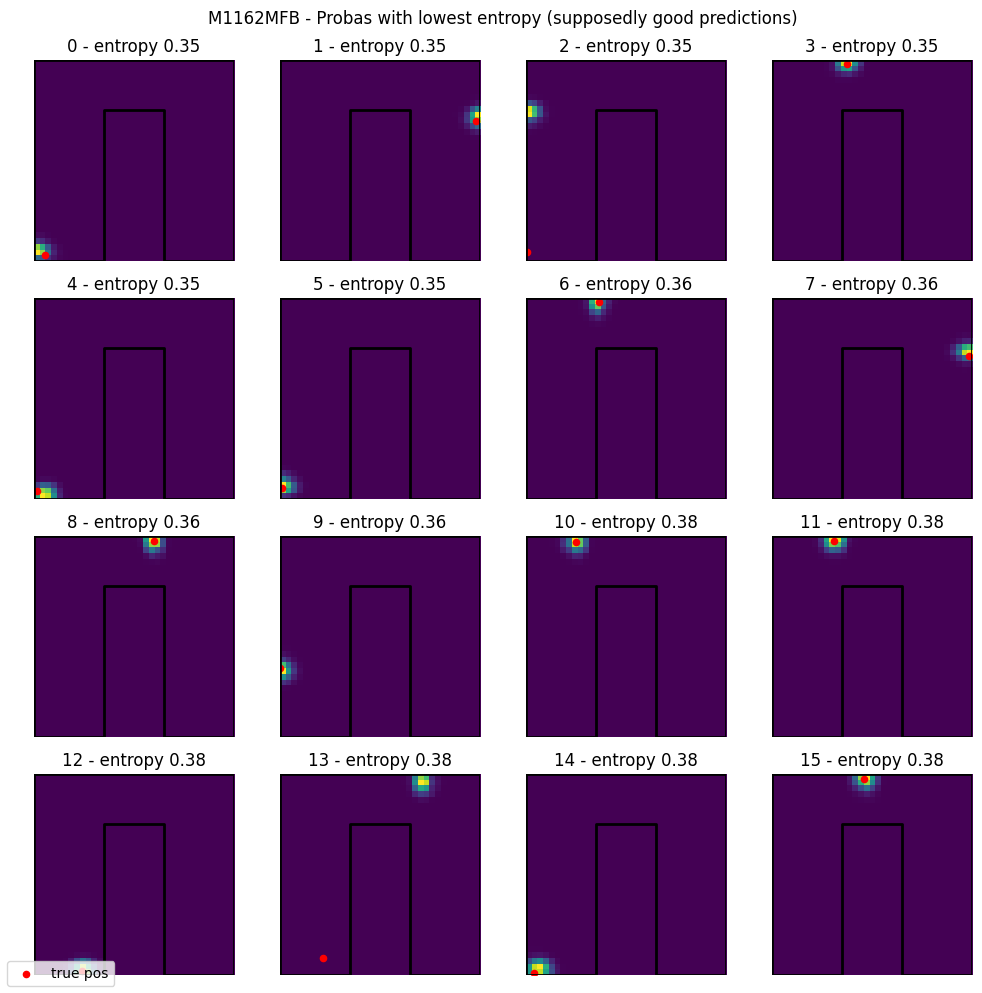

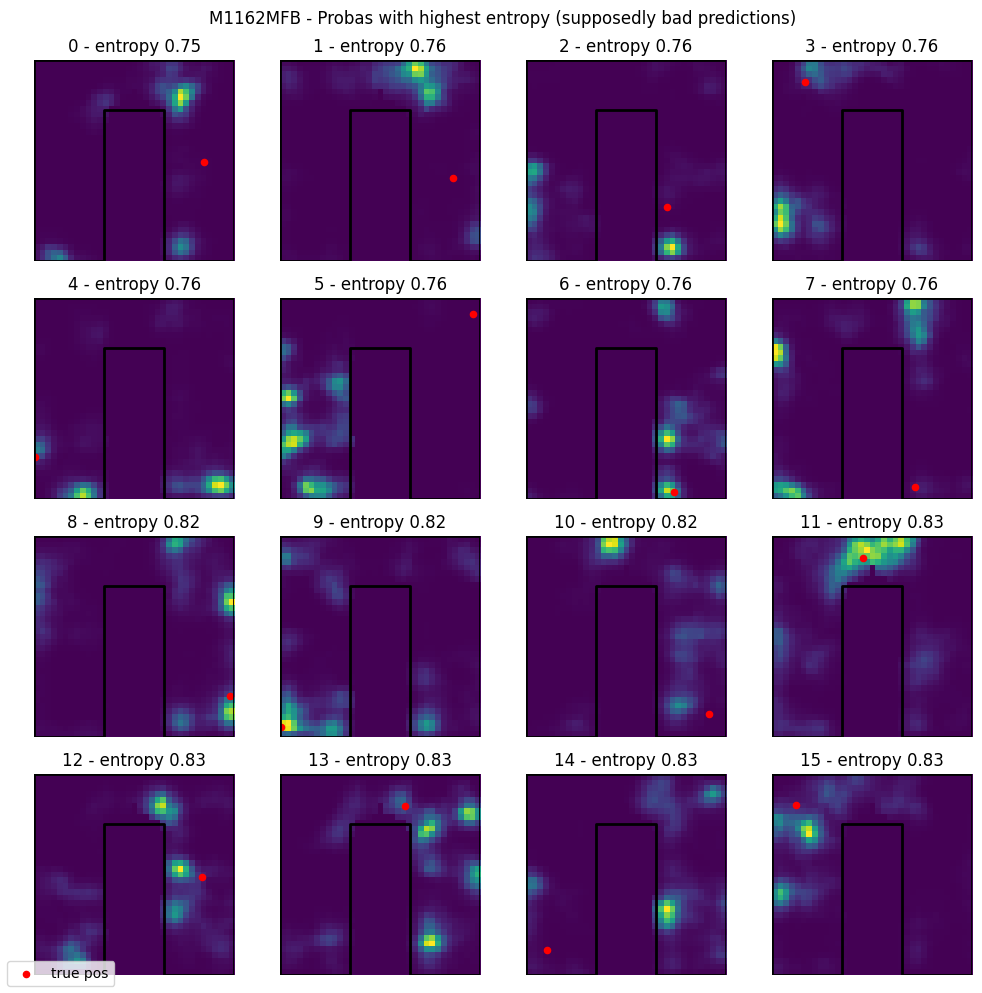

2: 1162_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0091


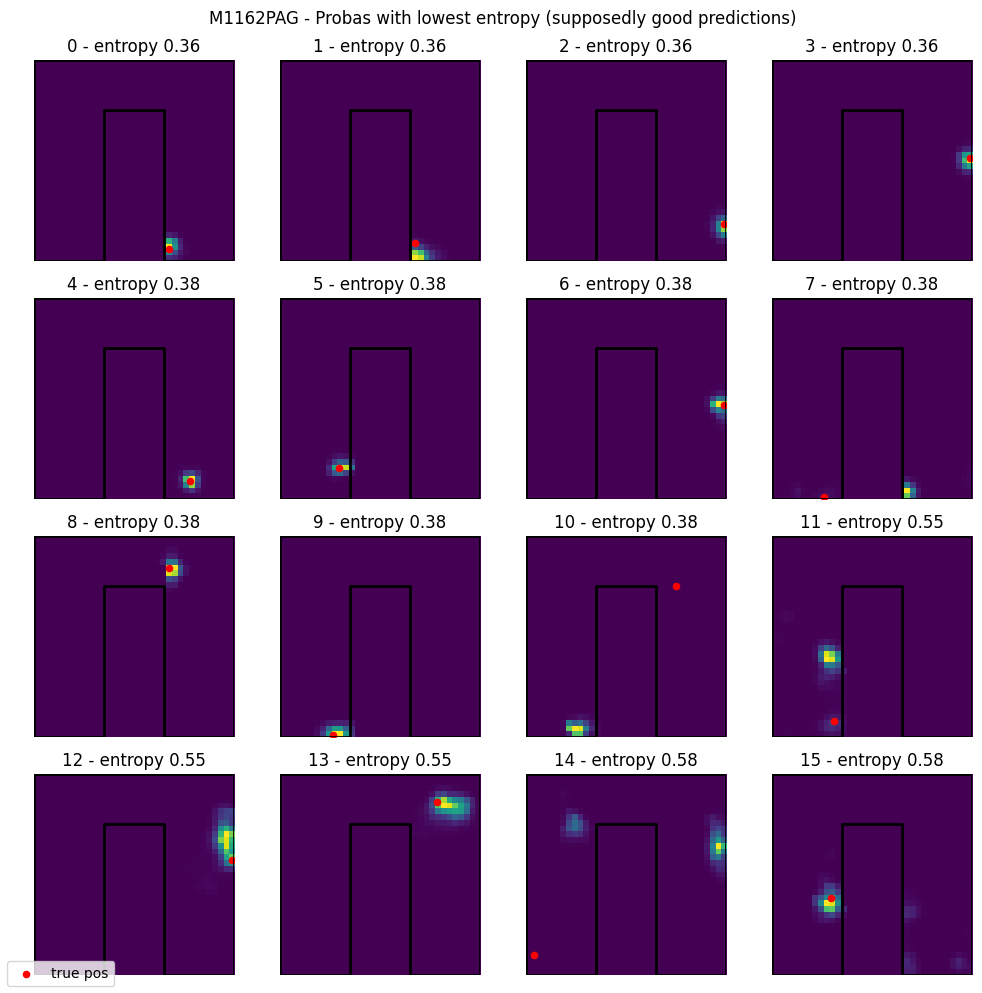

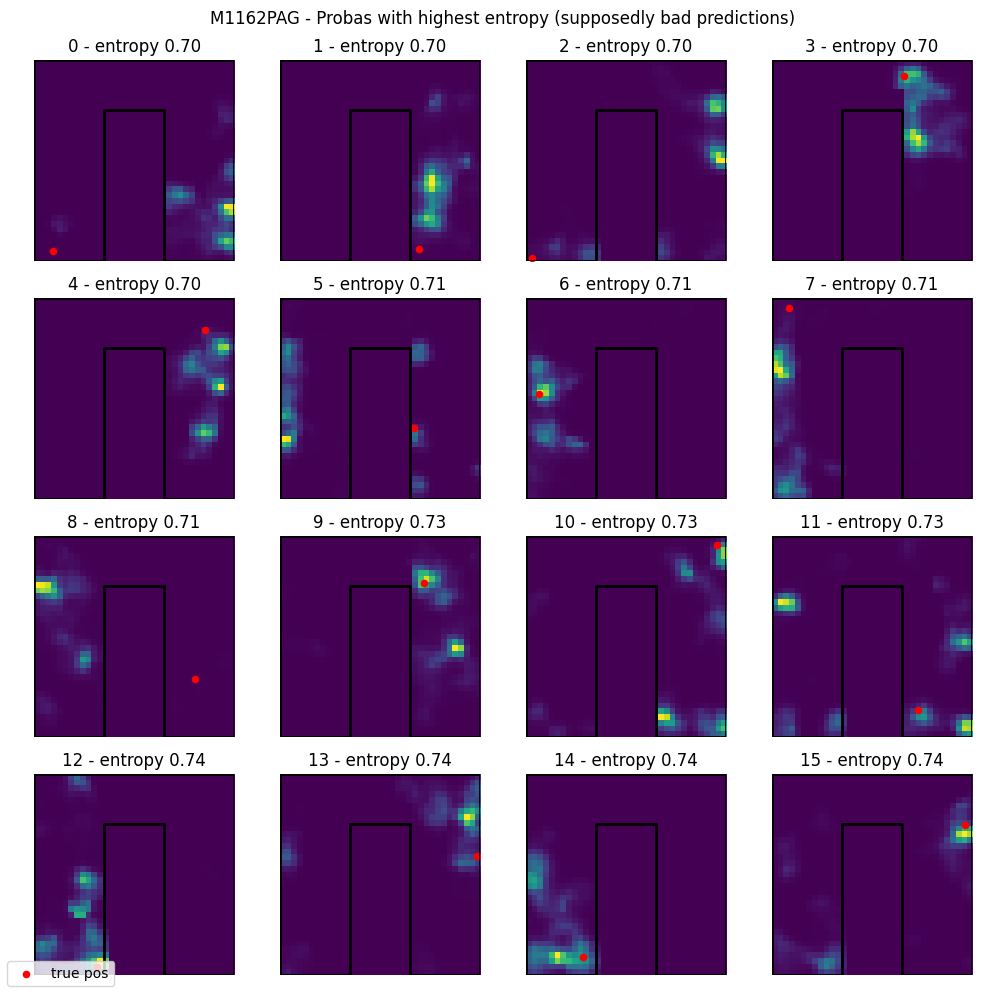

3: 1168_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0085


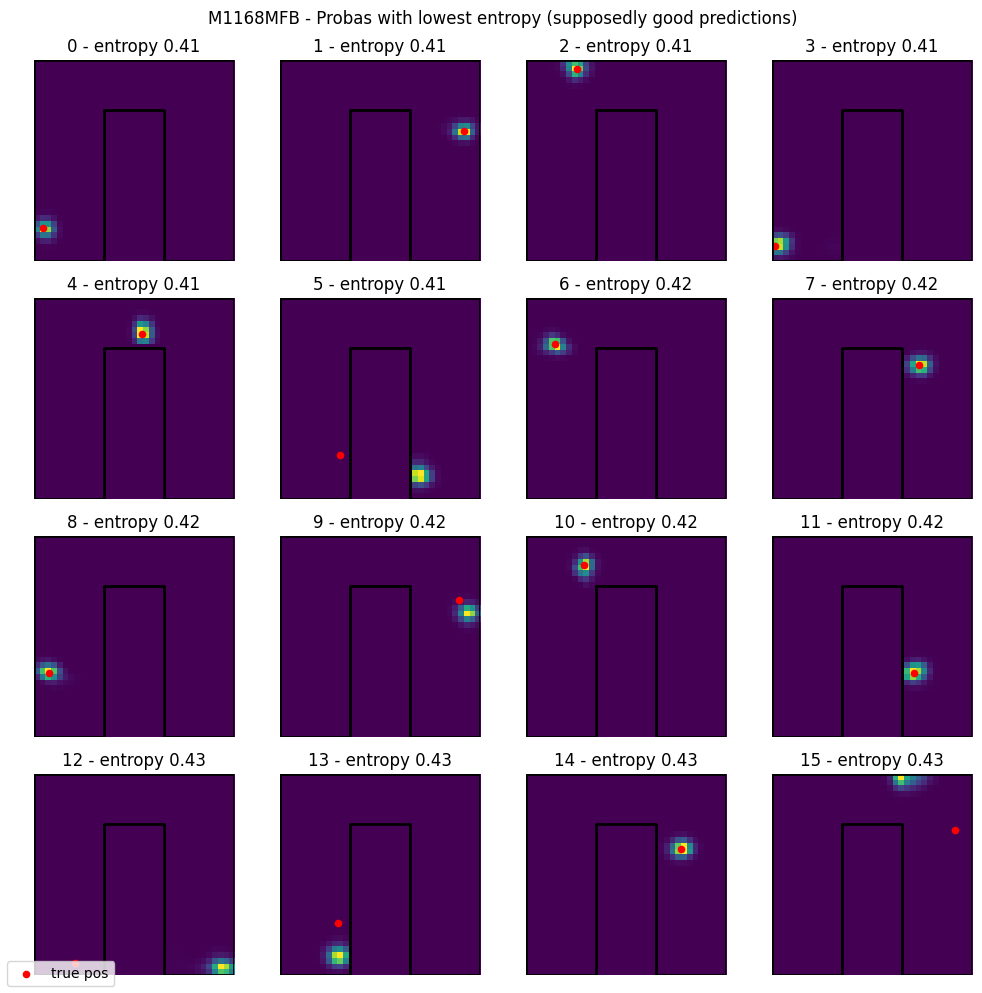

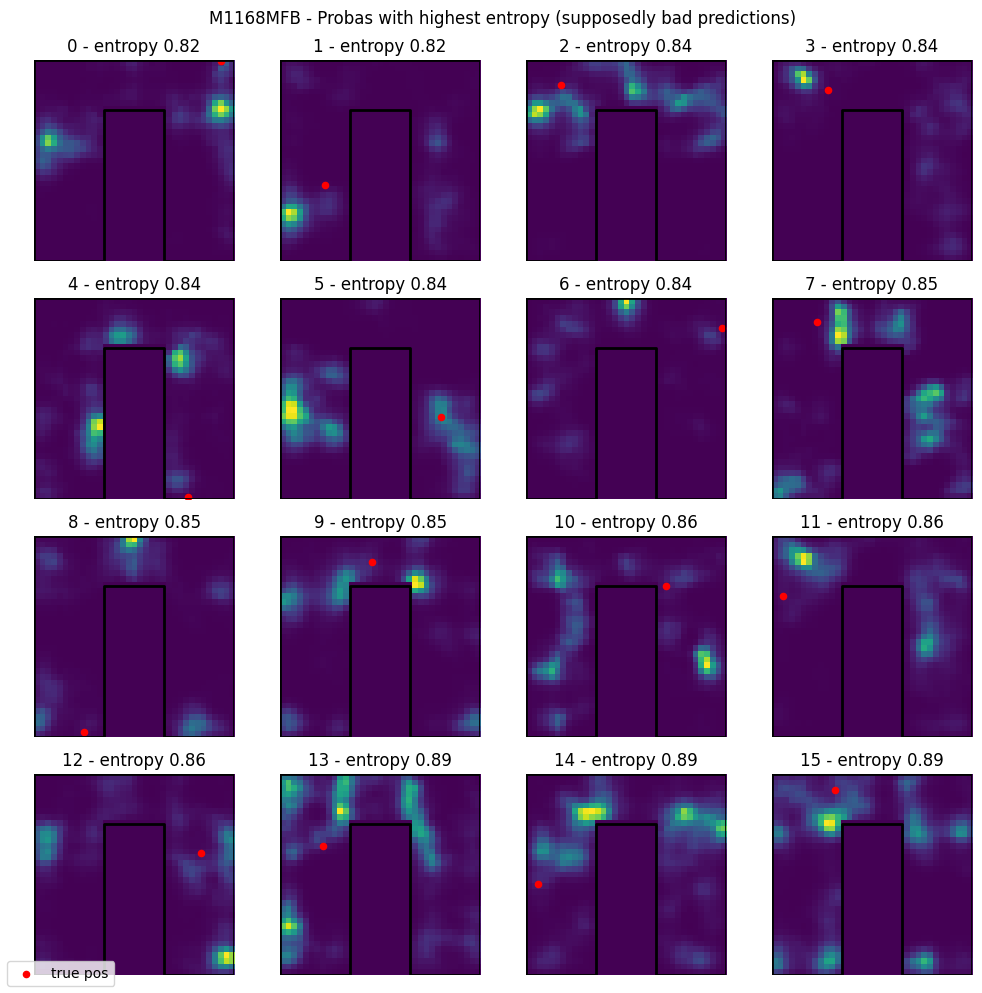

4: 1182_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0084


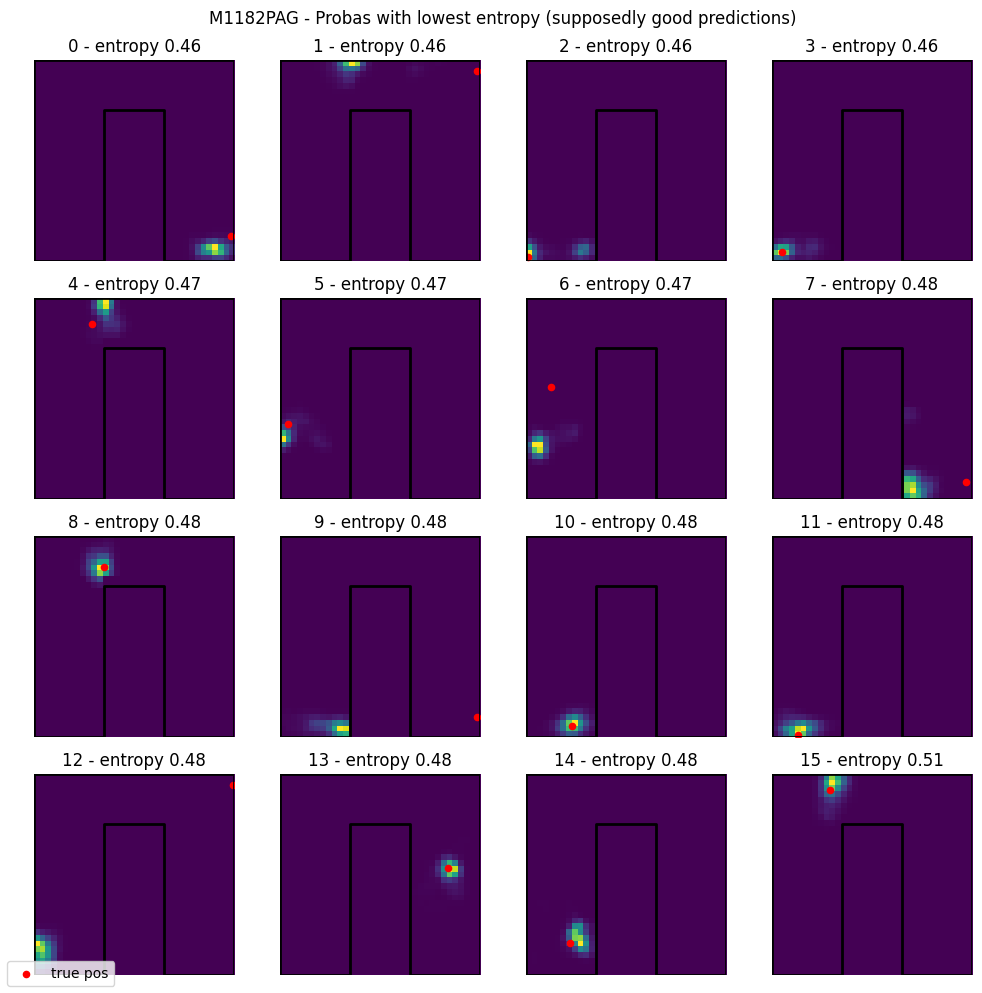

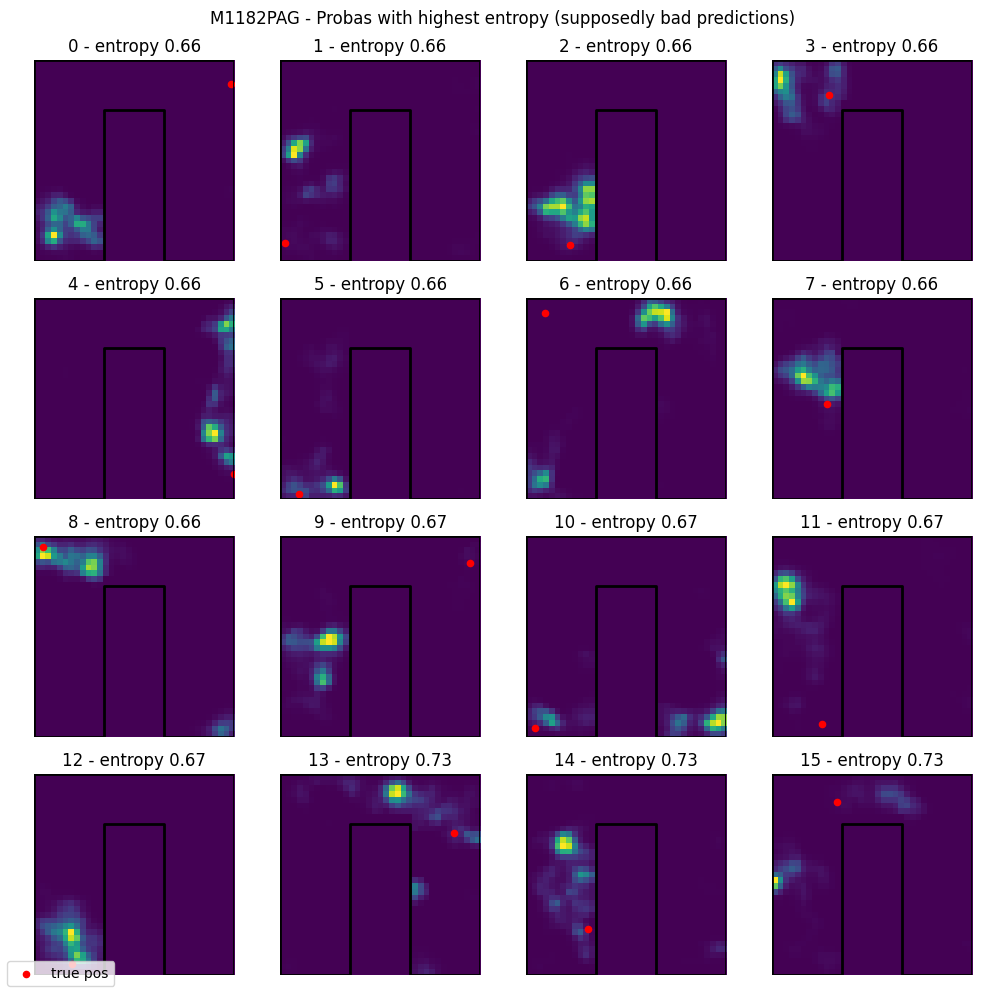

5: 1199_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0113


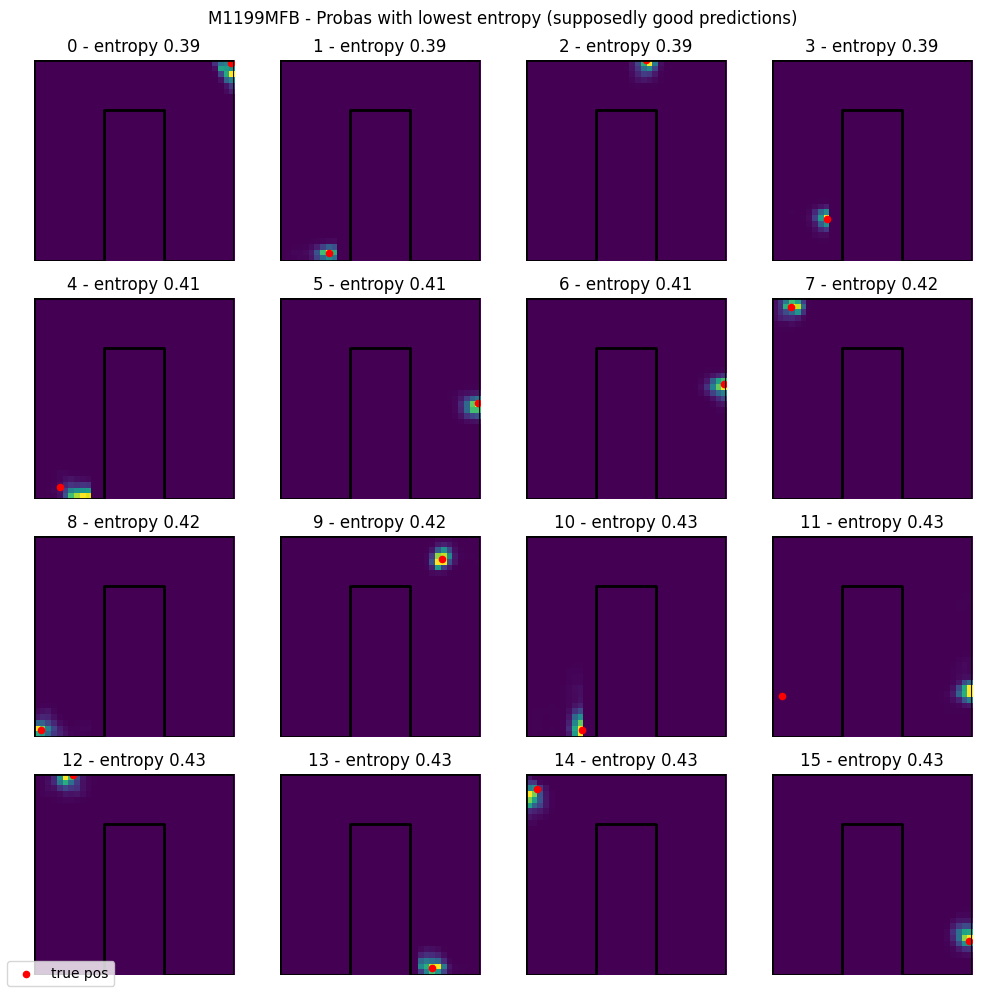

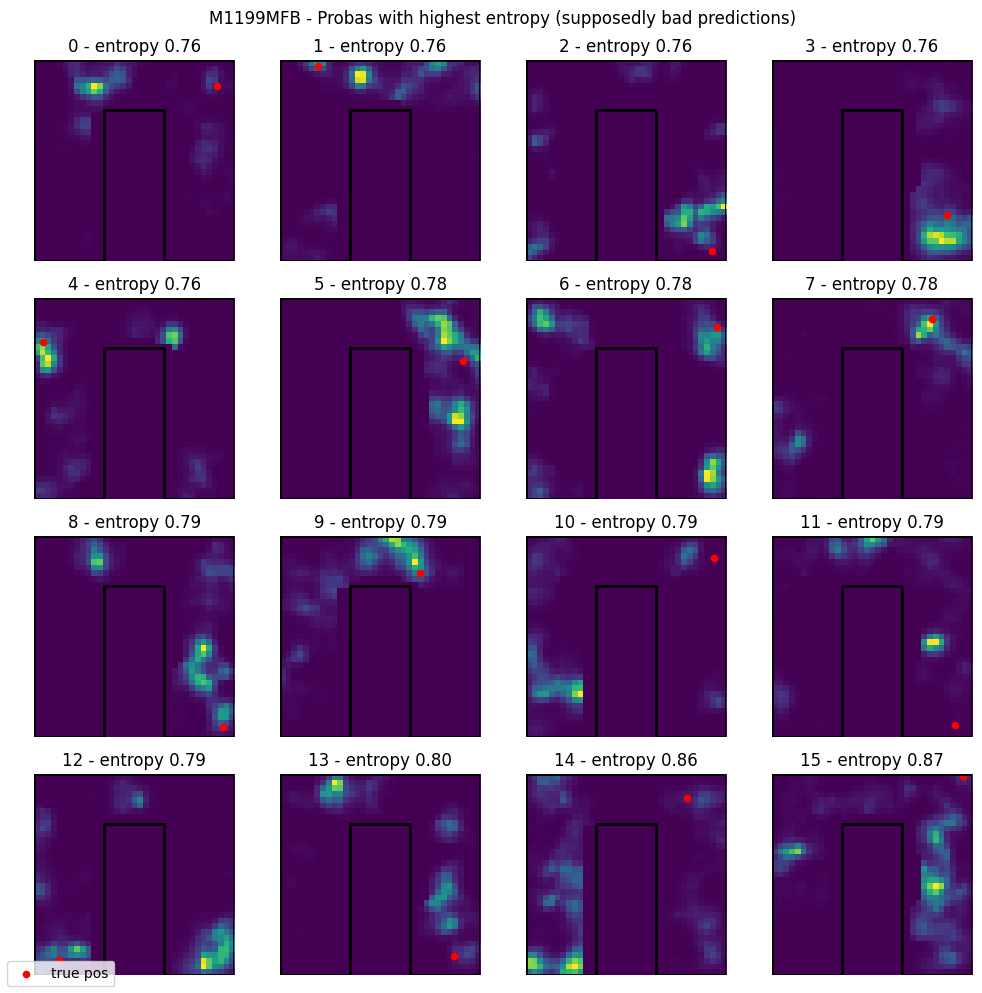

6: 1199_PAG


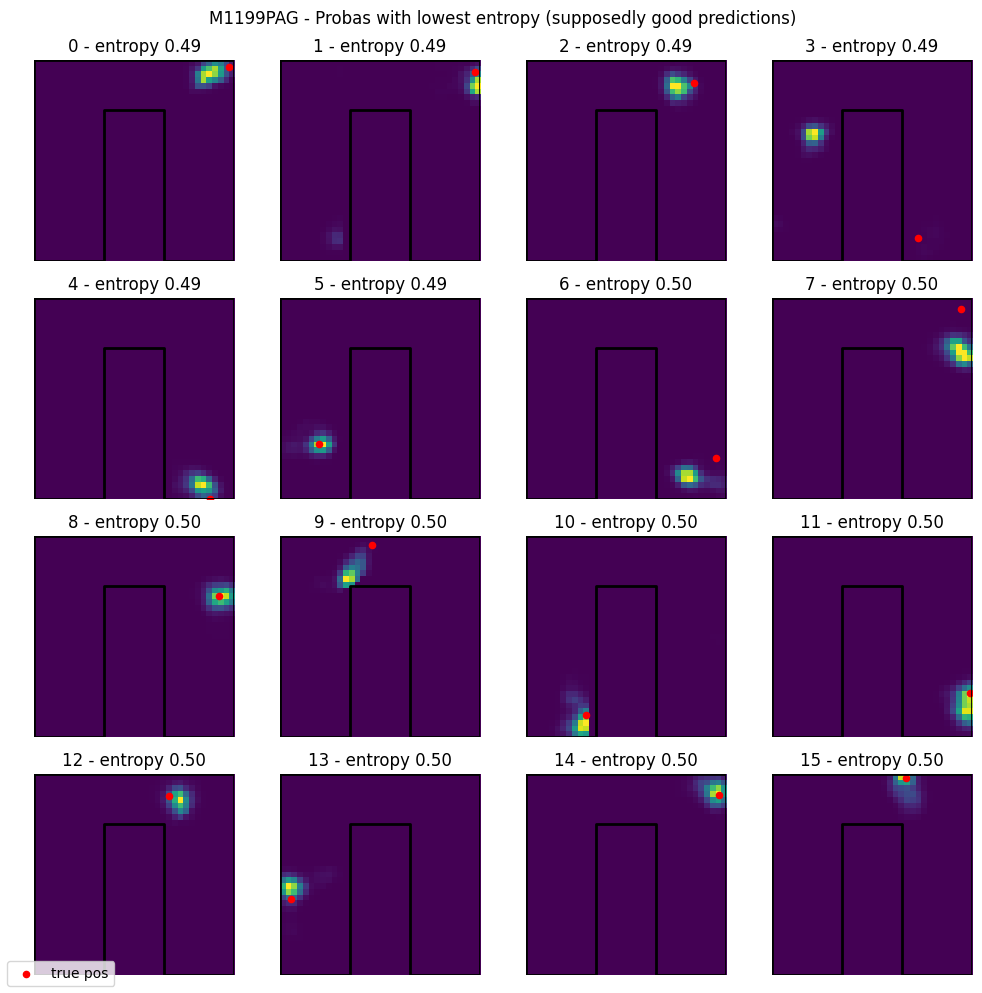

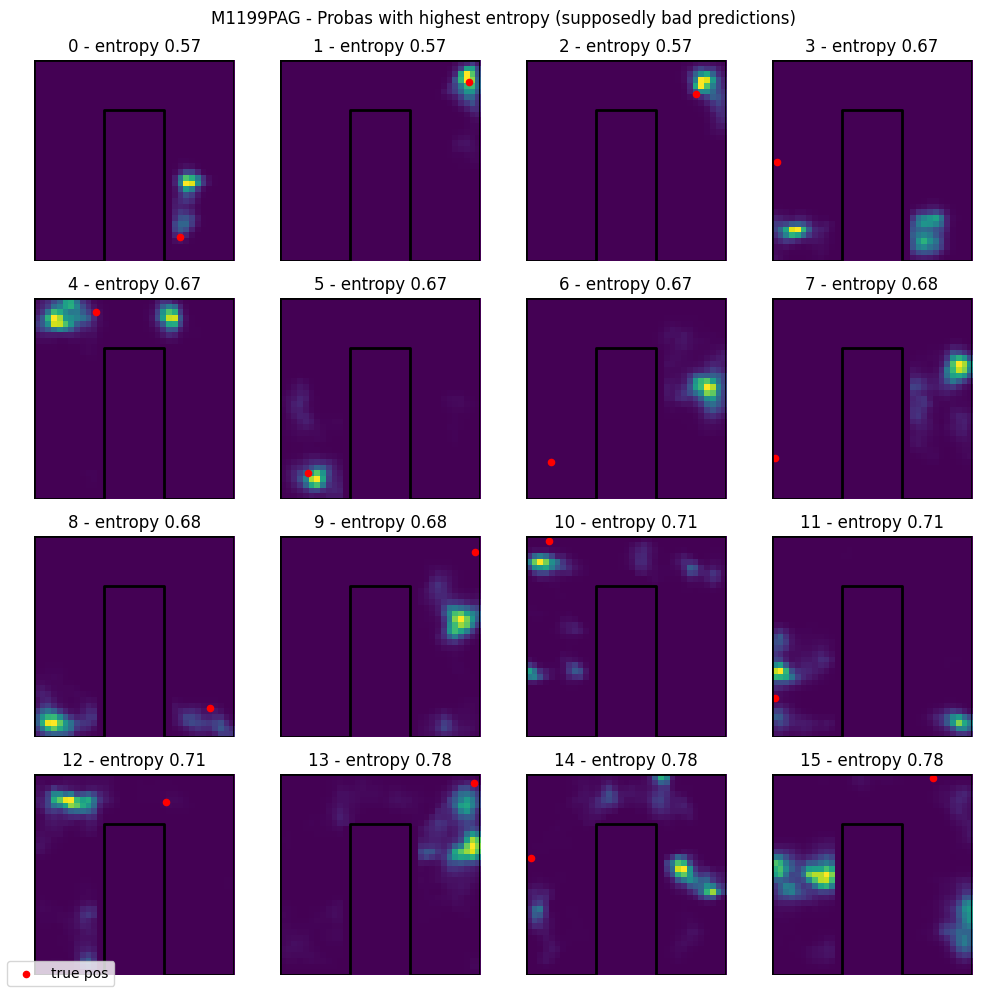

7: 1199_reversal
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0144


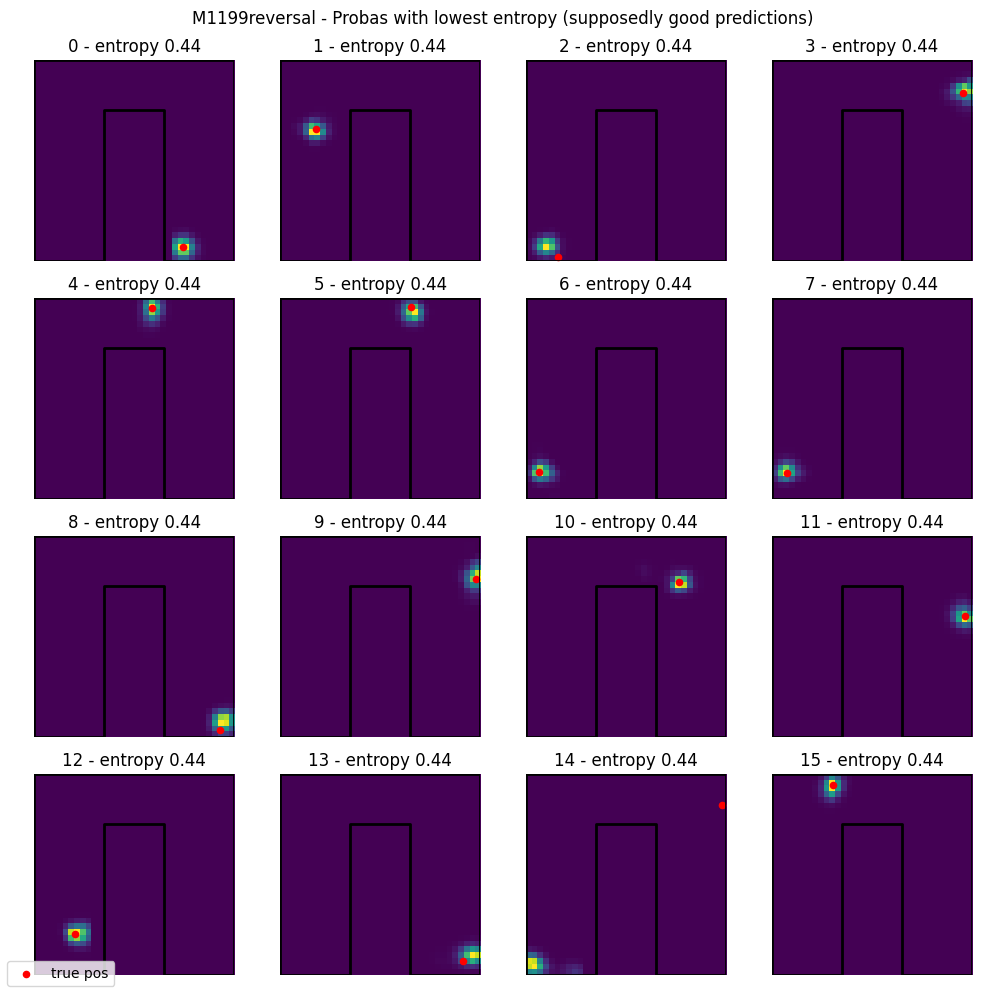

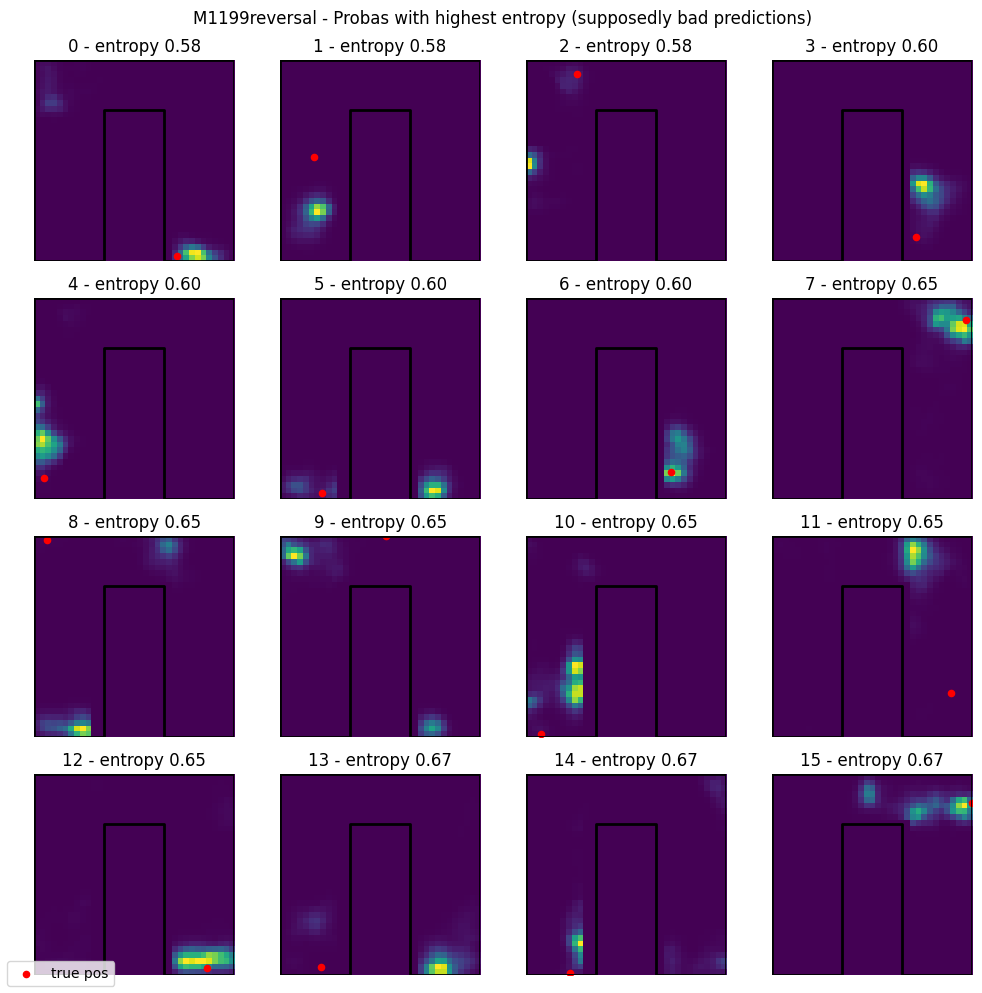

8: 1230_Known
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0085


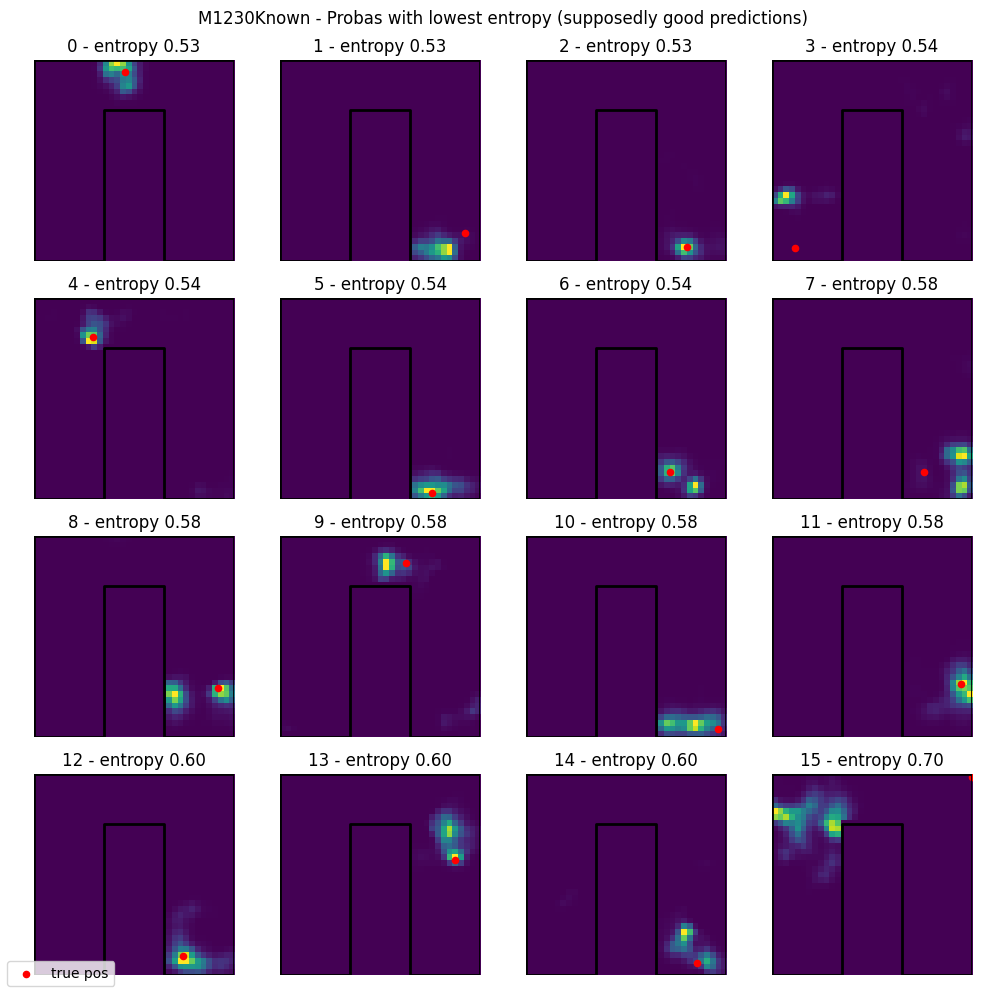

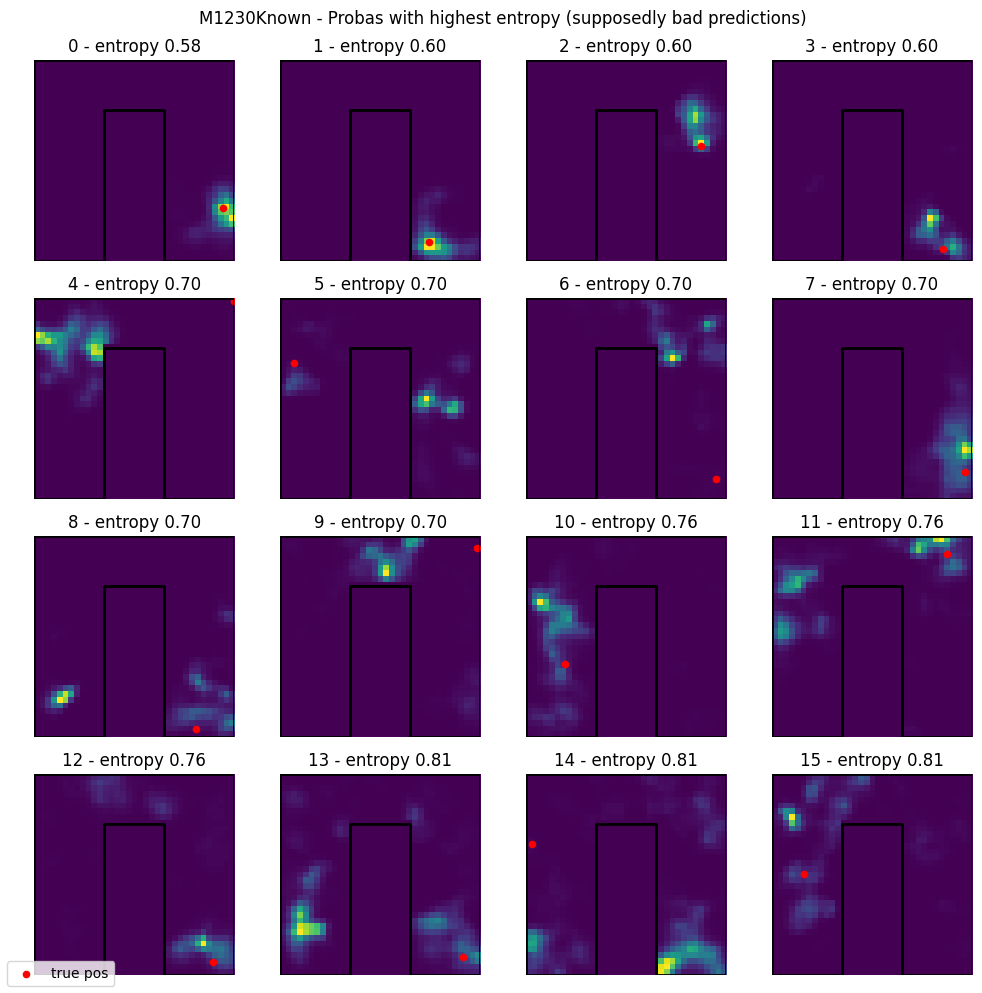

9: 1230_Novel
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0113


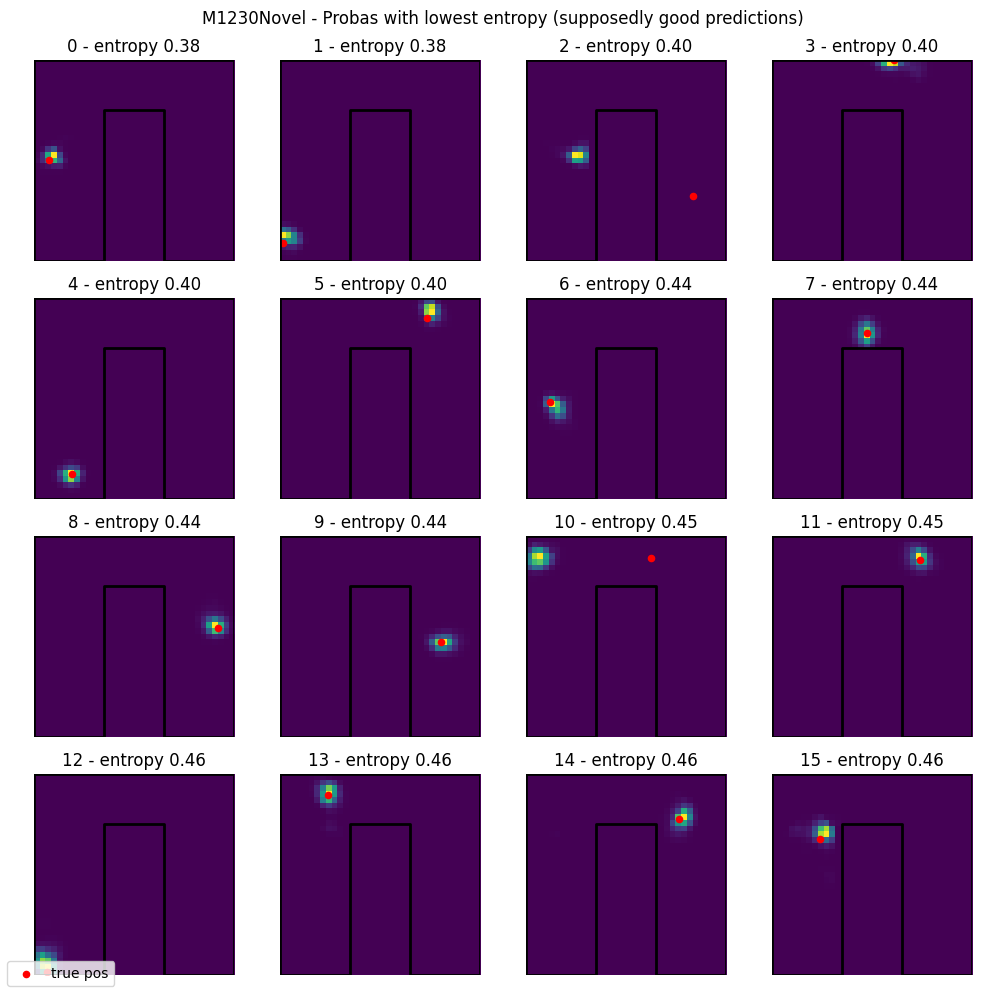

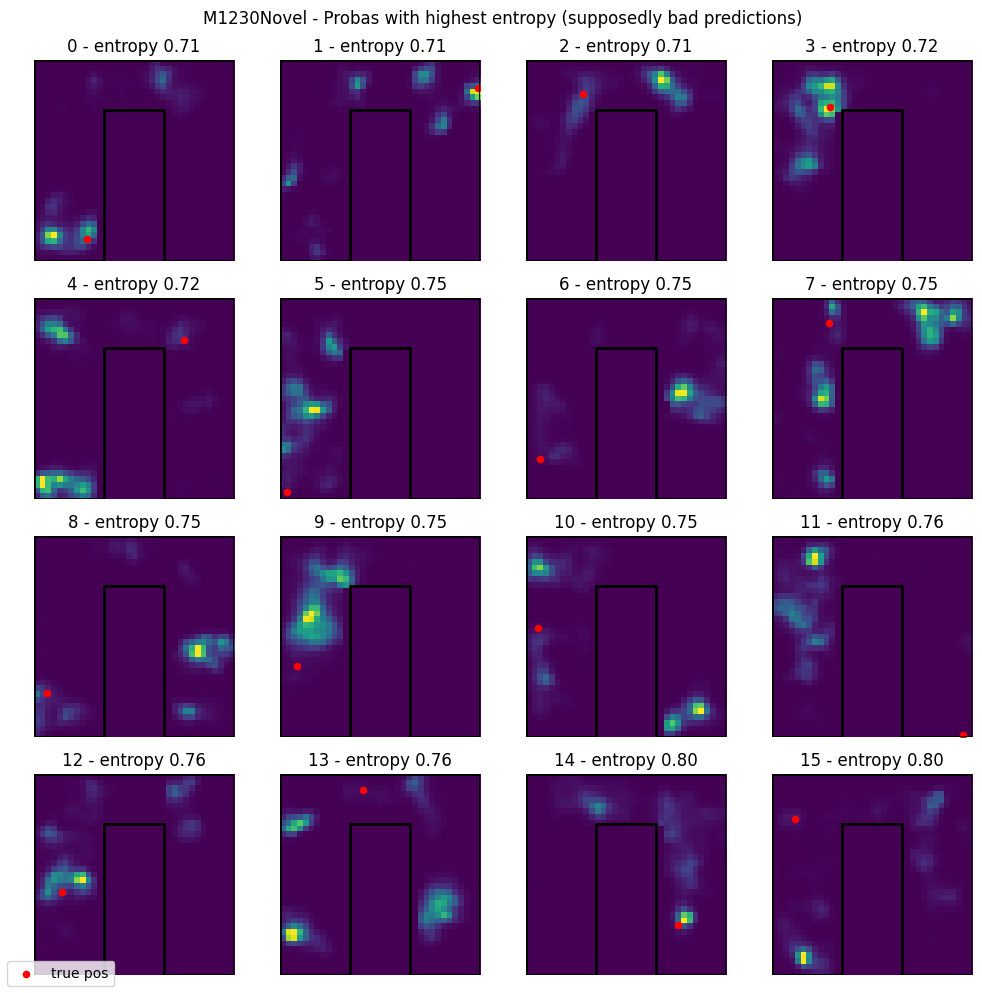

10: 1239_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0103


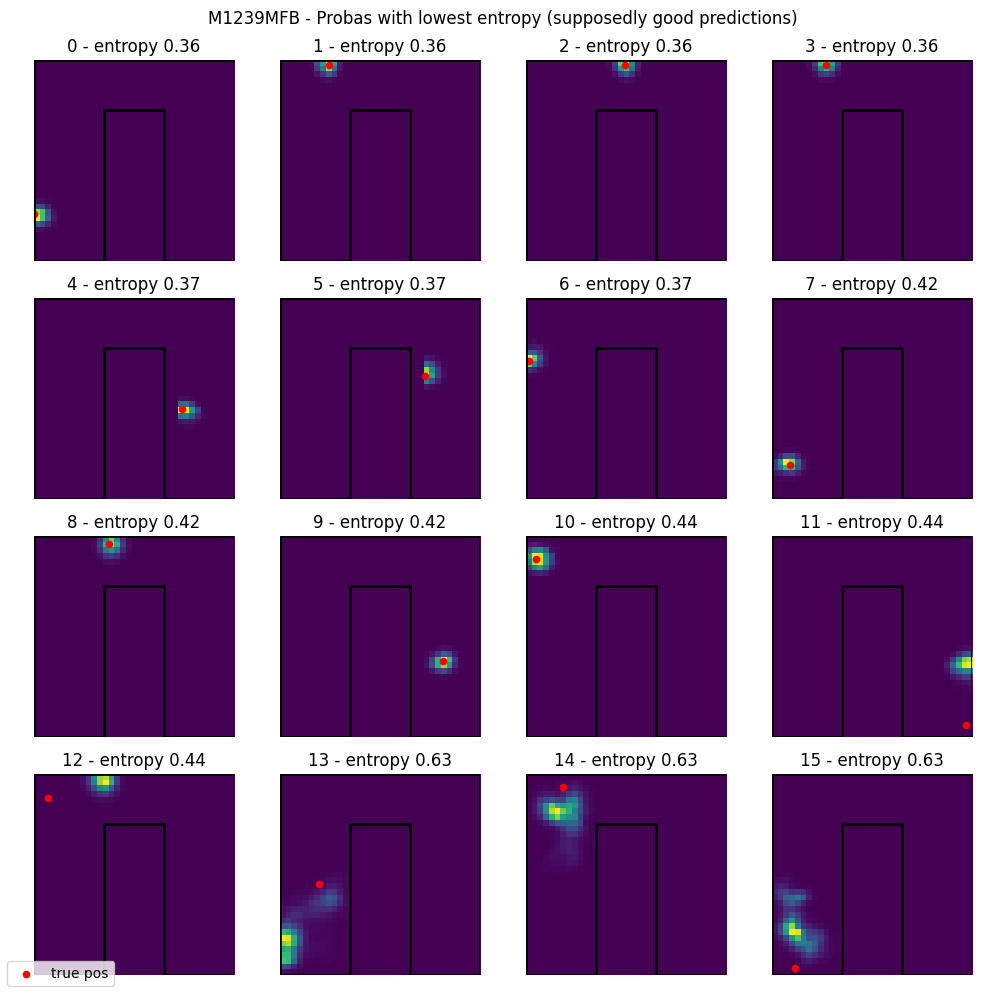

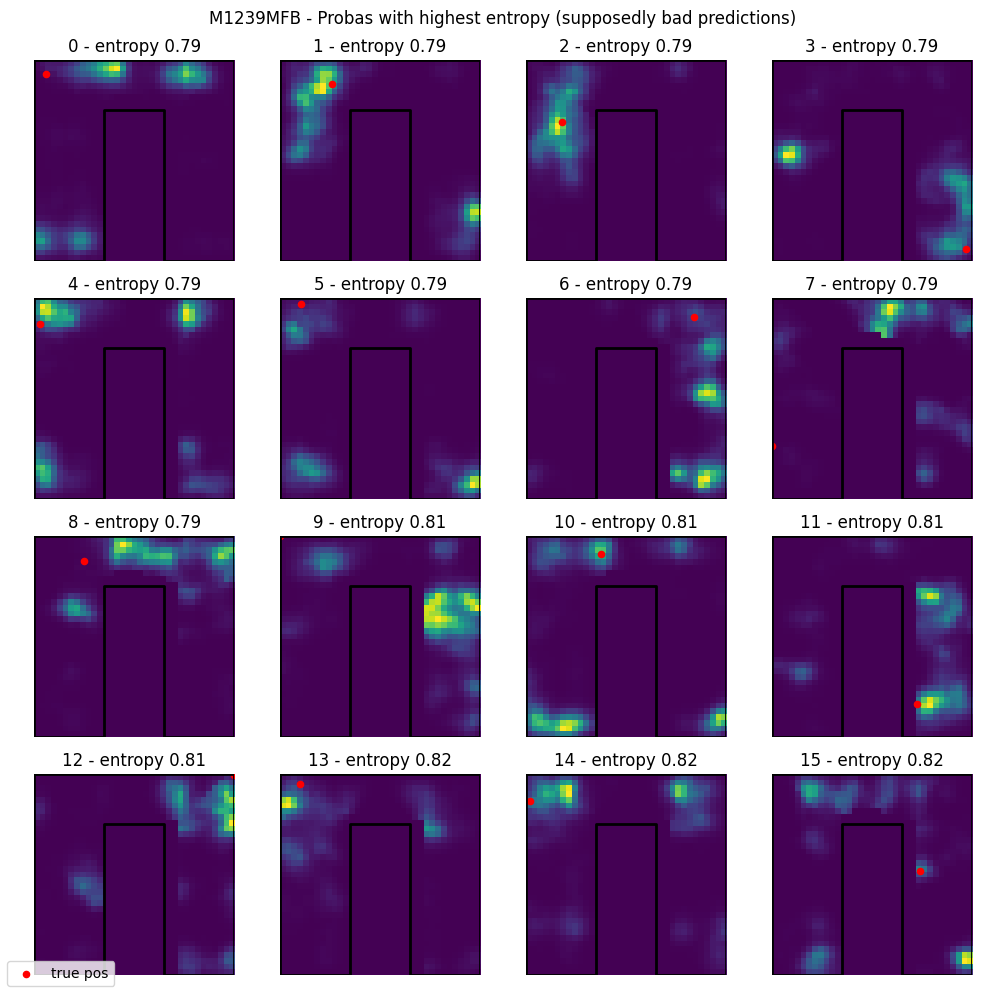

11: 1239_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0101


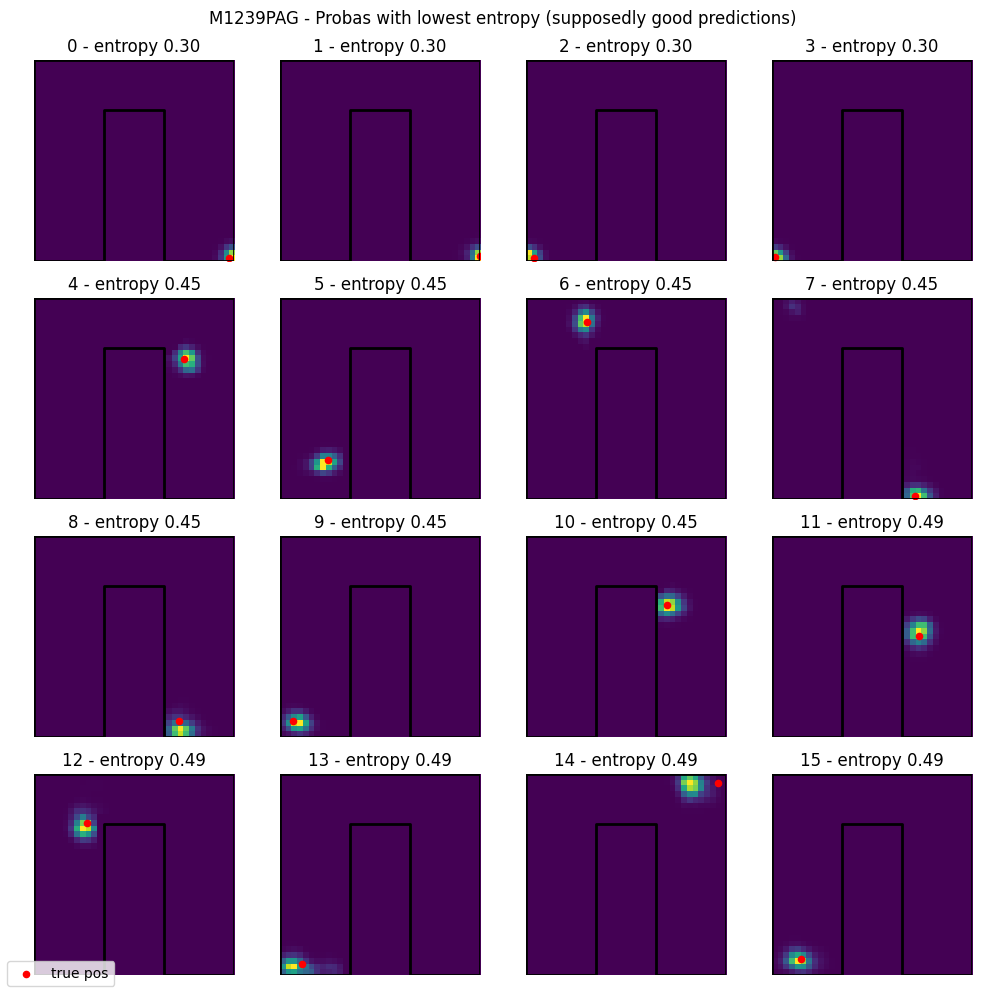

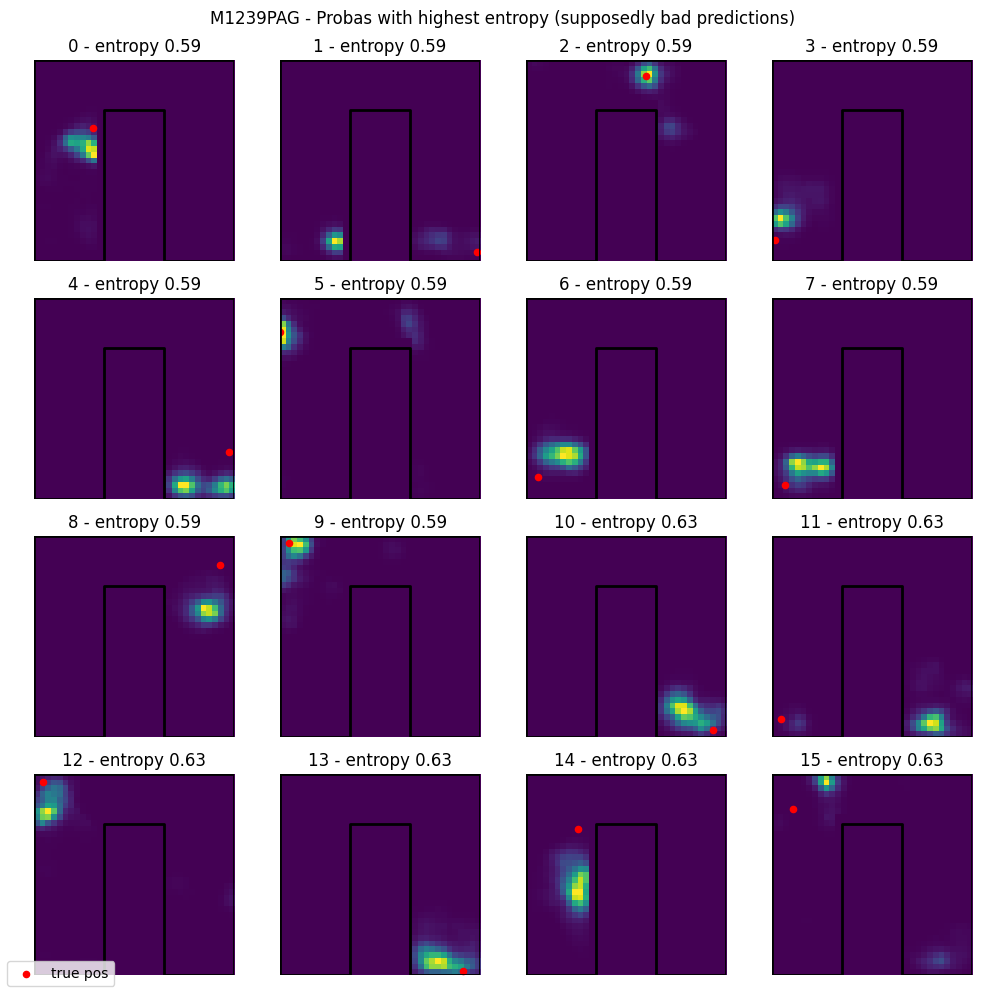

12: 905_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0097


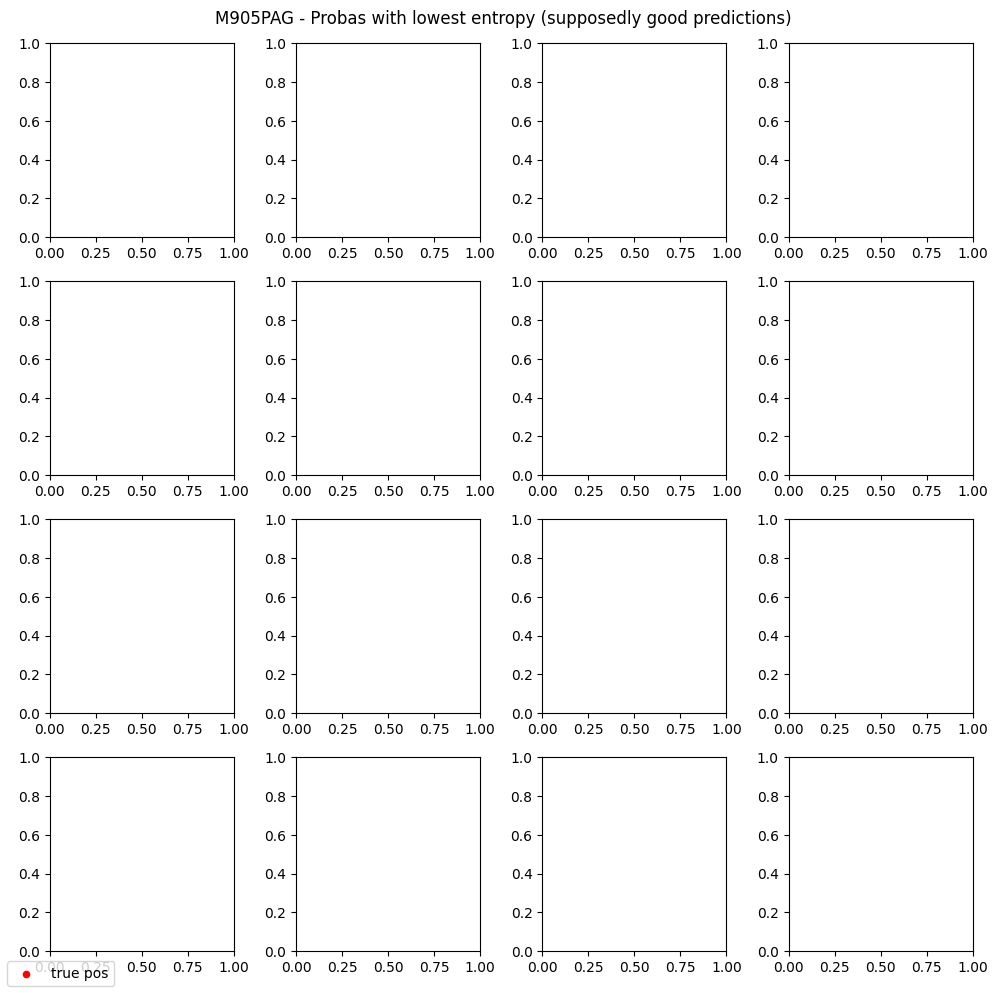

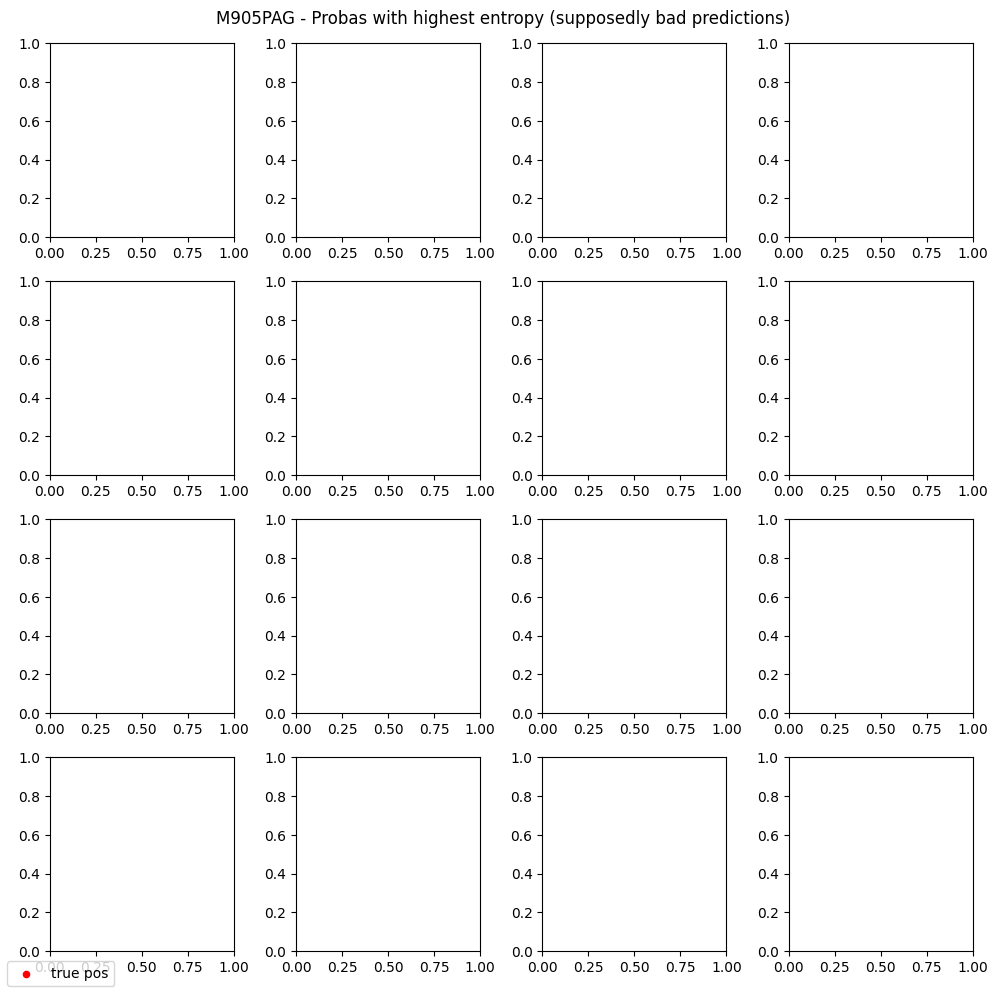

13: 994_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0060


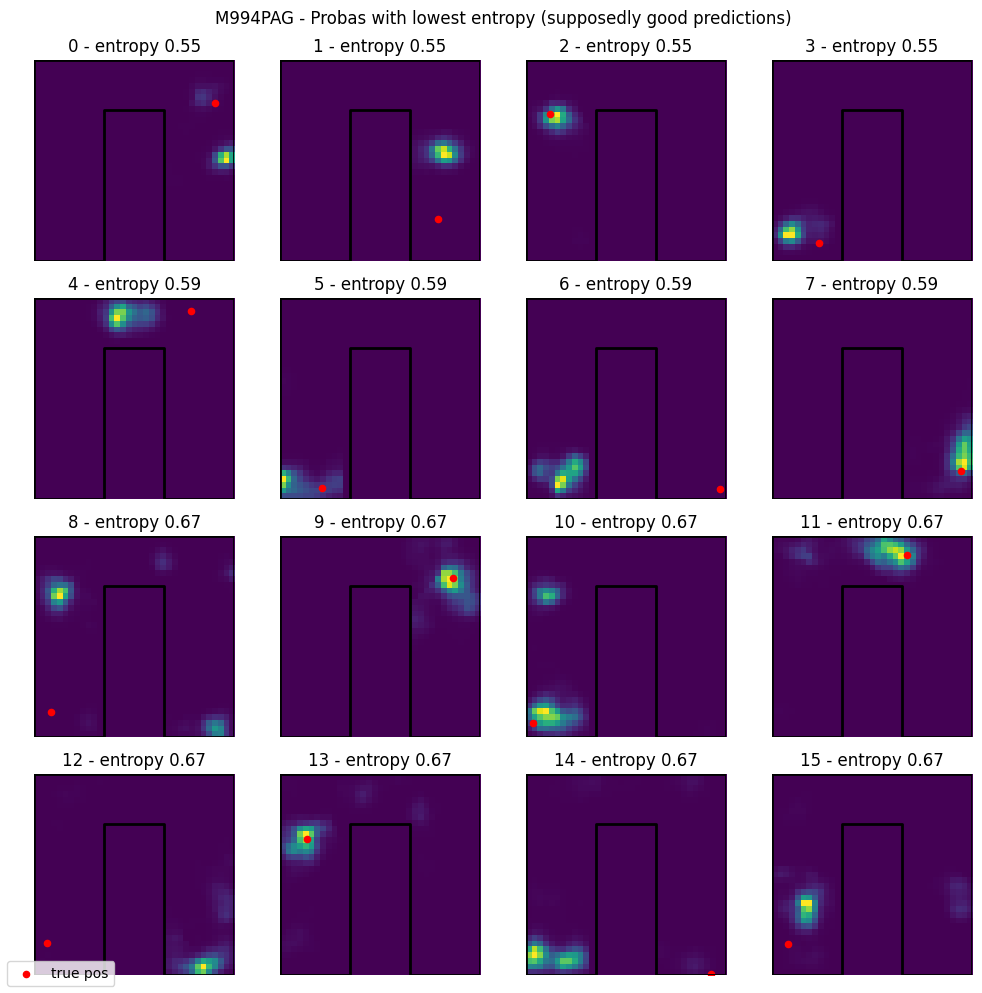

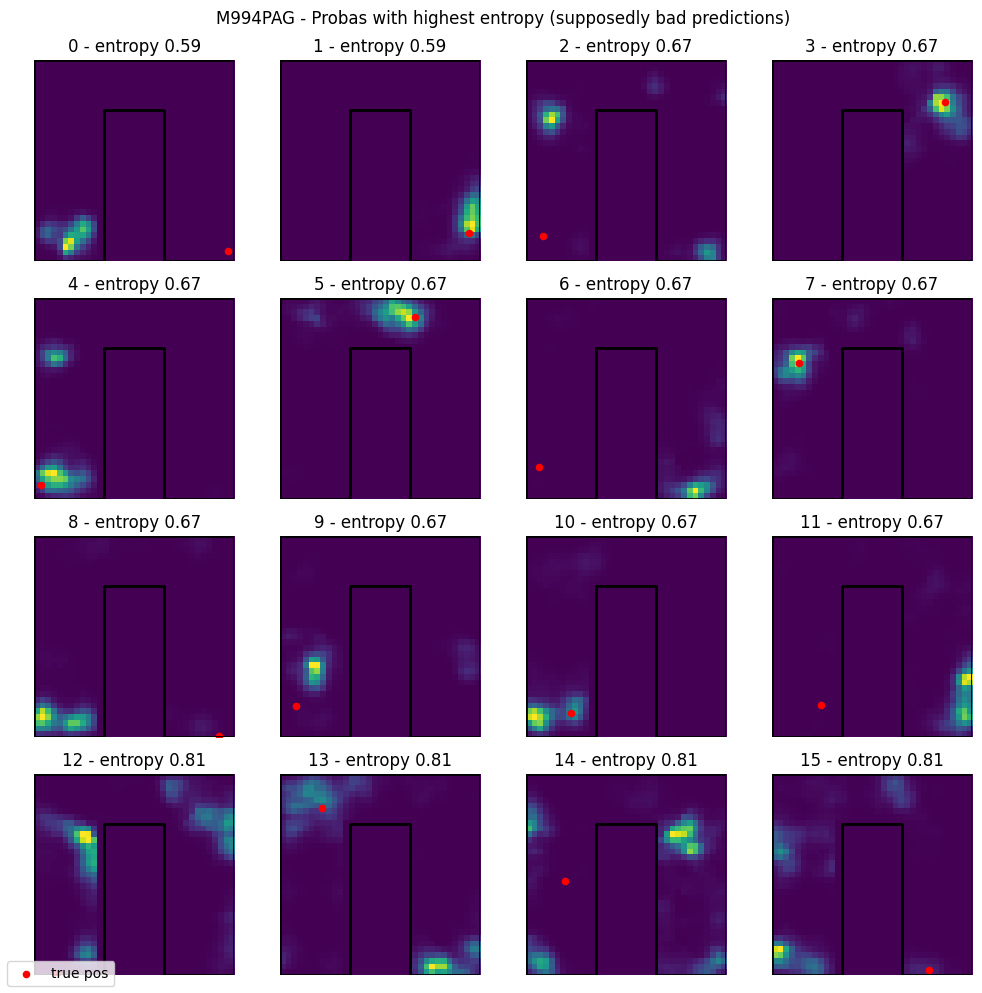

In [183]:
loader_all.results_df["mouse_manipe"].unique()
import dill as pickle
import tensorflow as tf

for i in range(loader_all.results_df["mouse_manipe"].unique().shape[0]):
    print(f"{i}: {loader_all.results_df['mouse_manipe'].unique()[i]}")
    mouse_manipe = loader_all.results_df["mopnguse_manipe"].unique()[i]
    if (
        loader_all.results_df.query(
            "mouse_manipe == @mouse_manipe & winMS == 108"
        ).shape[0]
        == 0
    ):
        print(f"Skipping {mouse_manipe} because no winMS 36")
        continue
    Mouse_Results = loader_all.results_df.query(
        "mouse_manipe == @mouse_manipe & winMS == 108 & stride == 4 & phase == 'training'"
    ).results.iloc[0]

    with open(
        os.path.join(Mouse_Results.folderResult, "108", "decoding_results_training.pkl"),
        "rb",
    ) as f:
        decoding_results = pickle.load(f)

    Mouse_Results.load_trainers(which="ann", winMS="108")
    logits_hw = decoding_results["logits_hw"]
    entropy_hw = decoding_results["Hn"]
    net = Mouse_Results.ann
    heatmap_layer = net.GaussianHeatmap
    truePos = decoding_results["featureTrue"]
    # Assume logits_hw: [B,H,W], target_hw: [B,H,W], heatmap_layer instance exists
    from neuroencoders.utils.global_classes import MAZE_COORDS

    B, H, W = logits_hw.shape

    # 1️⃣ Mask forbidden logits
    masked_logits = tf.where(
        heatmap_layer.forbid_mask_tf[None] > 0, heatmap_layer.NEG, logits_hw
    )

    # 2️⃣ Softmax over allowed bins
    logits_flat = tf.reshape(masked_logits, [B, H * W])
    probs_flat = tf.nn.softmax(logits_flat, axis=-1)
    probs = tf.reshape(probs_flat, [B, H, W])
    num_subplots = 16
    tRipples = Mouse_Results.data_helper.fullBehavior["Times"]["tRipples"]

    # plot around ripple times
    ripples_time = tRipples.flatten()
    time = decoding_results["times"].flatten()
    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        0:num_subplots
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with lowest entropy (supposedly good predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs.svg",
        dpi=600,
    )
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs.png",
        dpi=300,
    )
    plt.show()

    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        -num_subplots:
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with highest entropy (supposedly bad predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs.svg",
        dpi=600,
    )
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs.png",
        dpi=300,
    )

    plt.show()

0: 1117_MFB


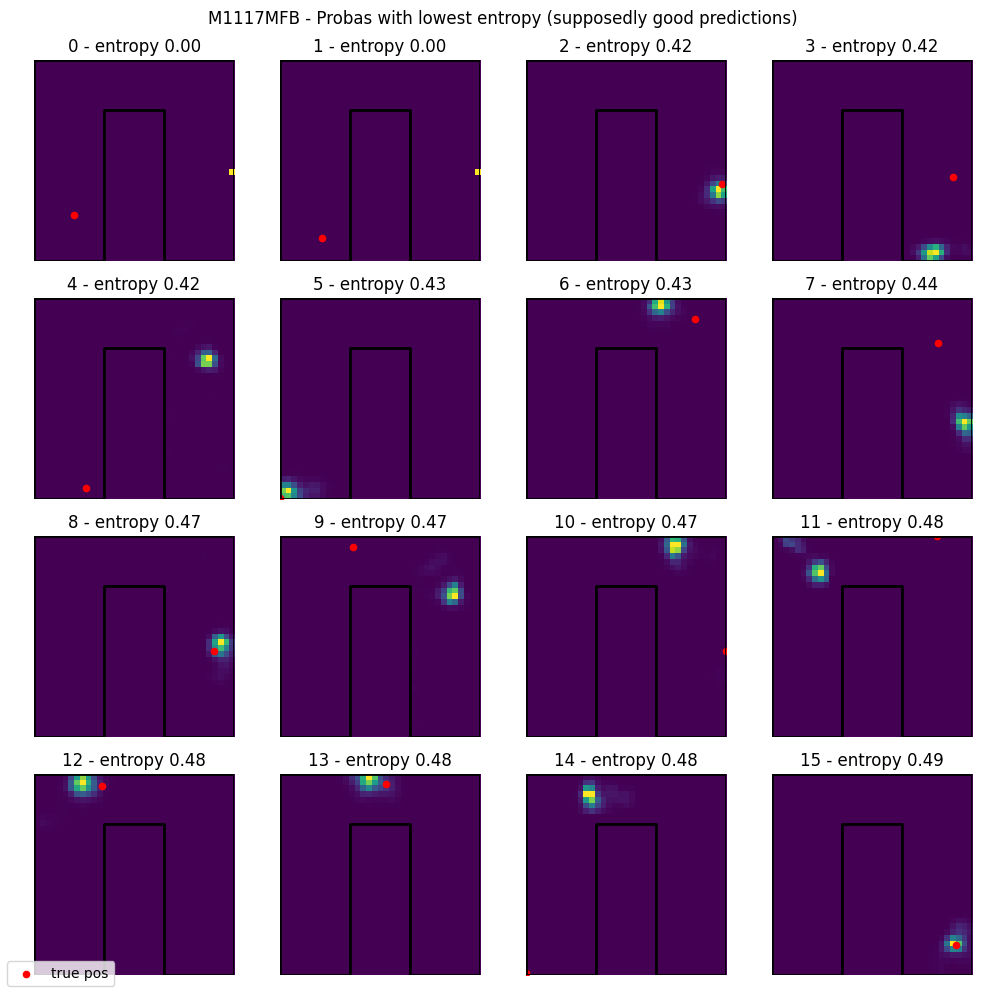

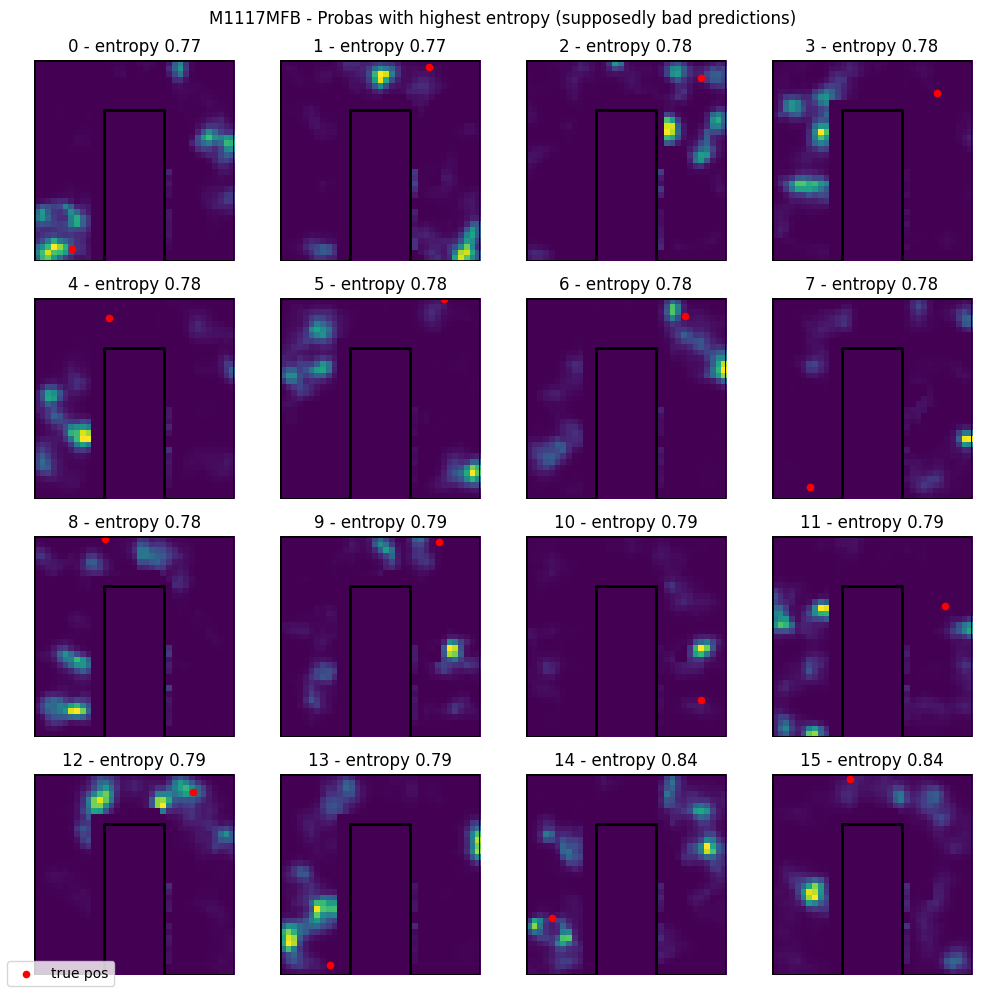

1: 1162_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0068


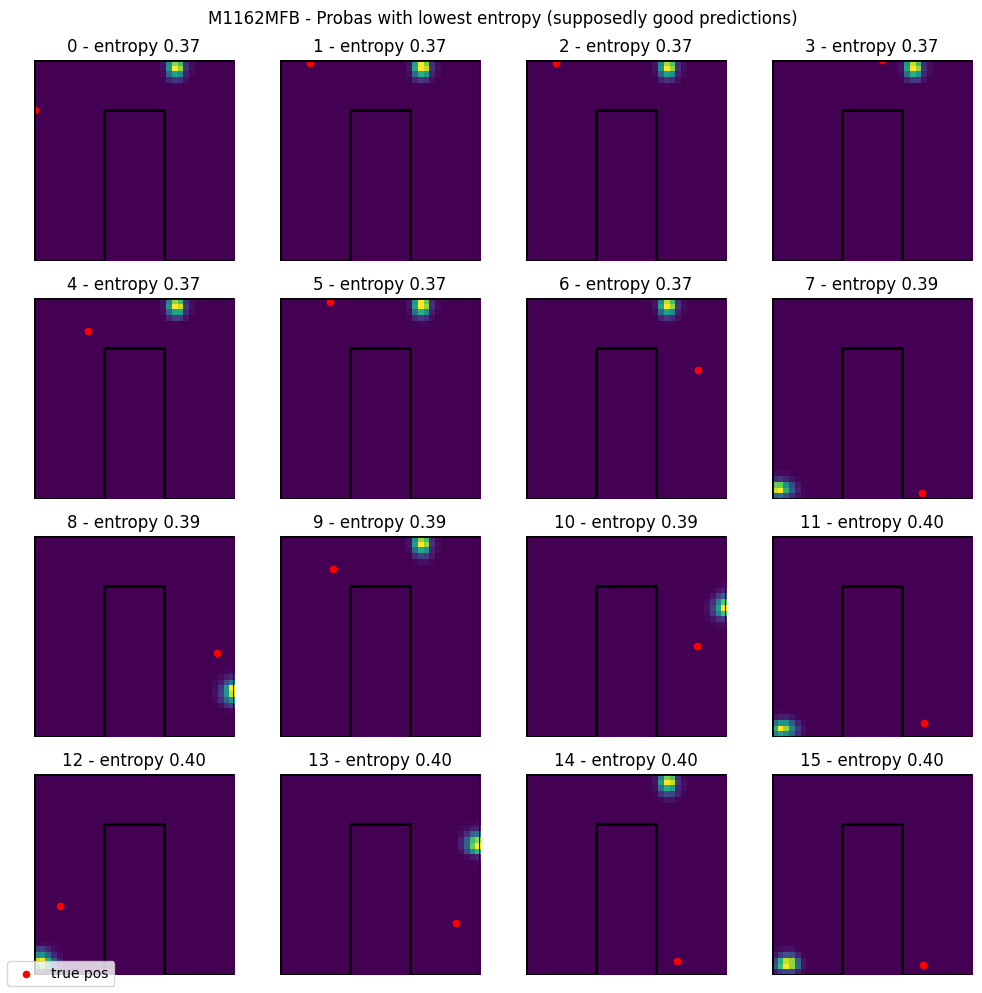

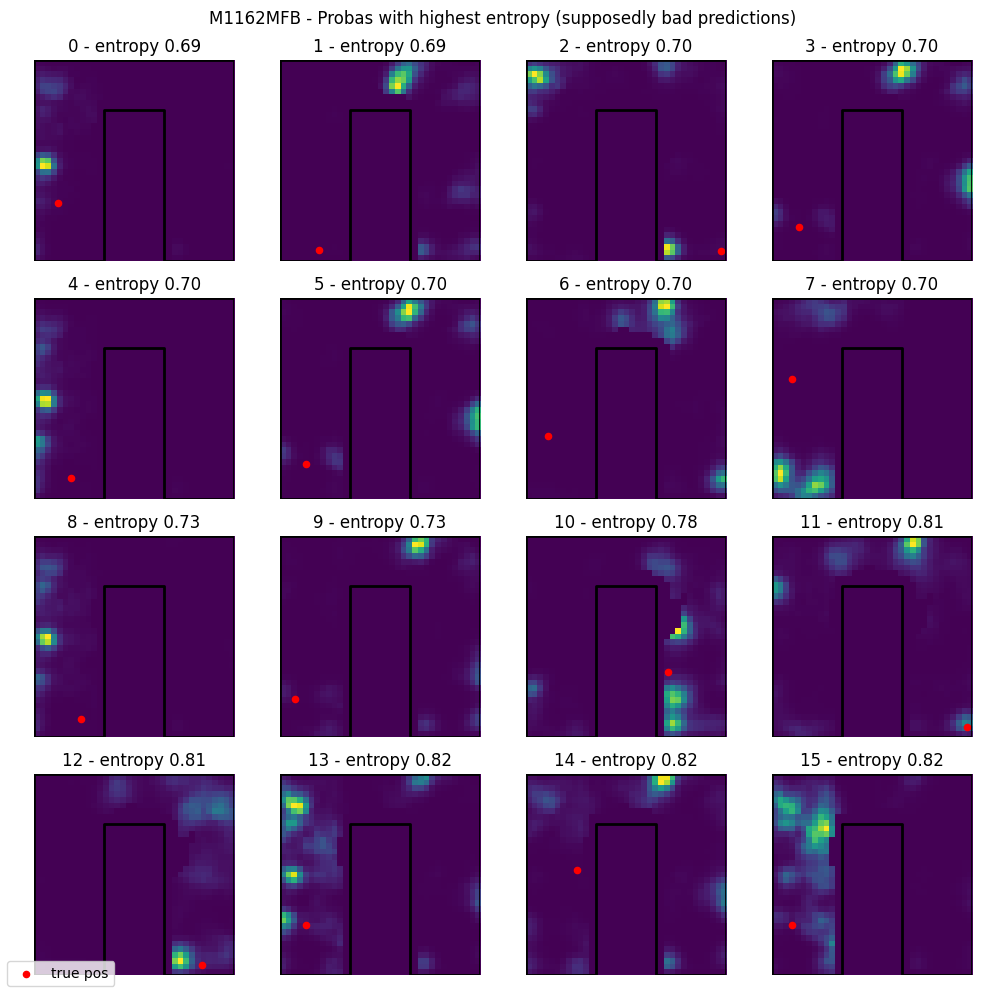

2: 1162_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0039


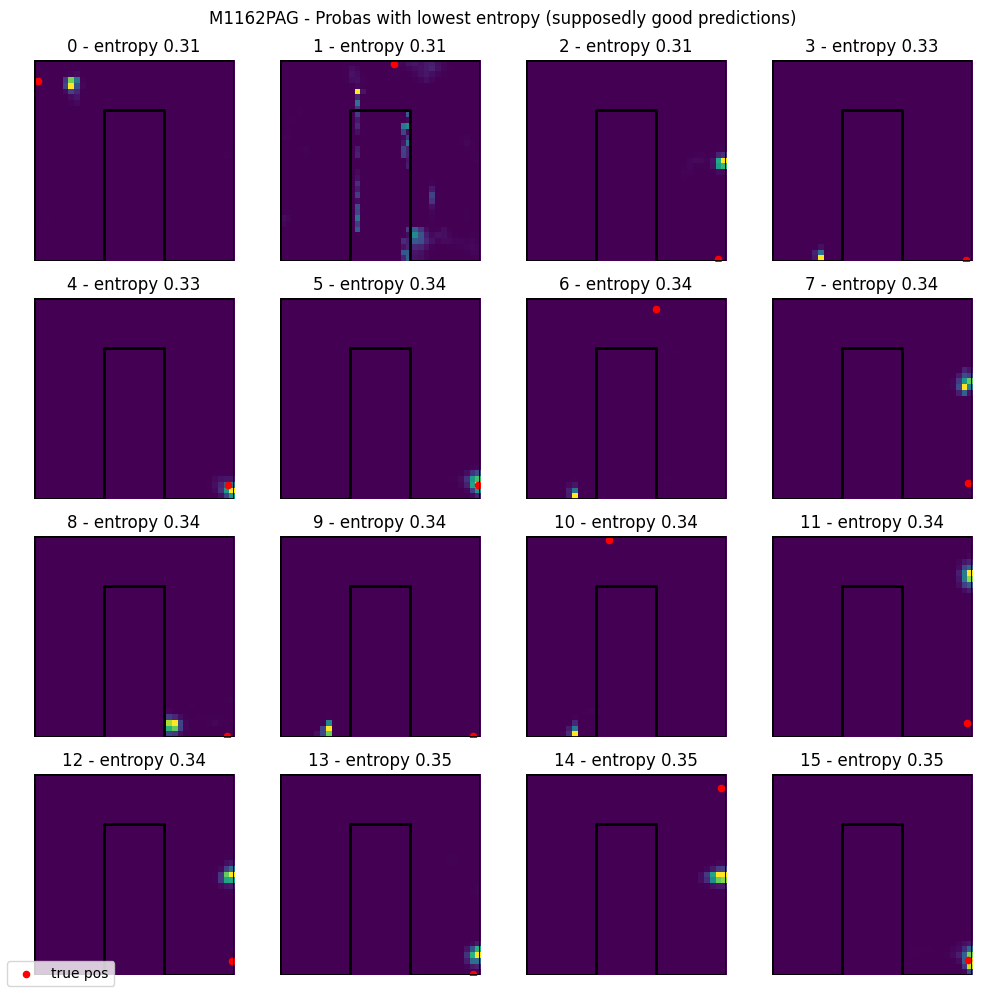

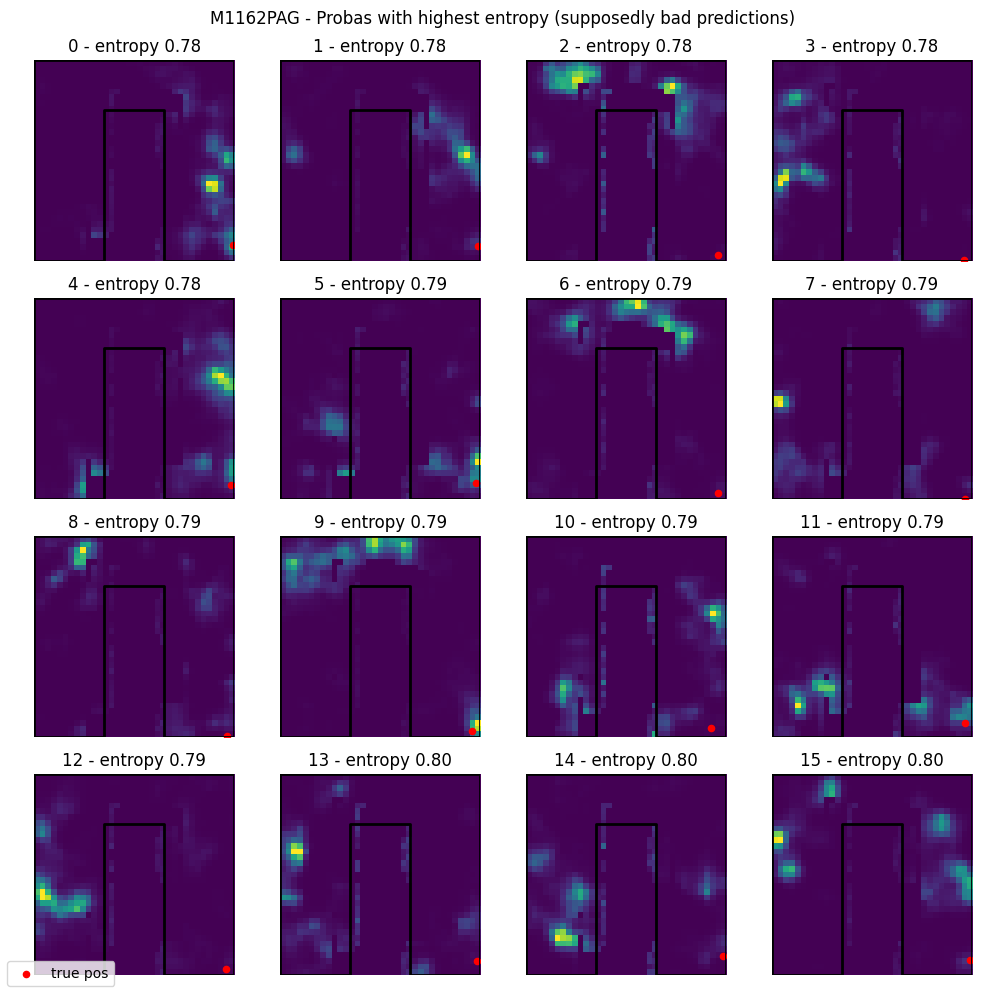

3: 1168_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0091


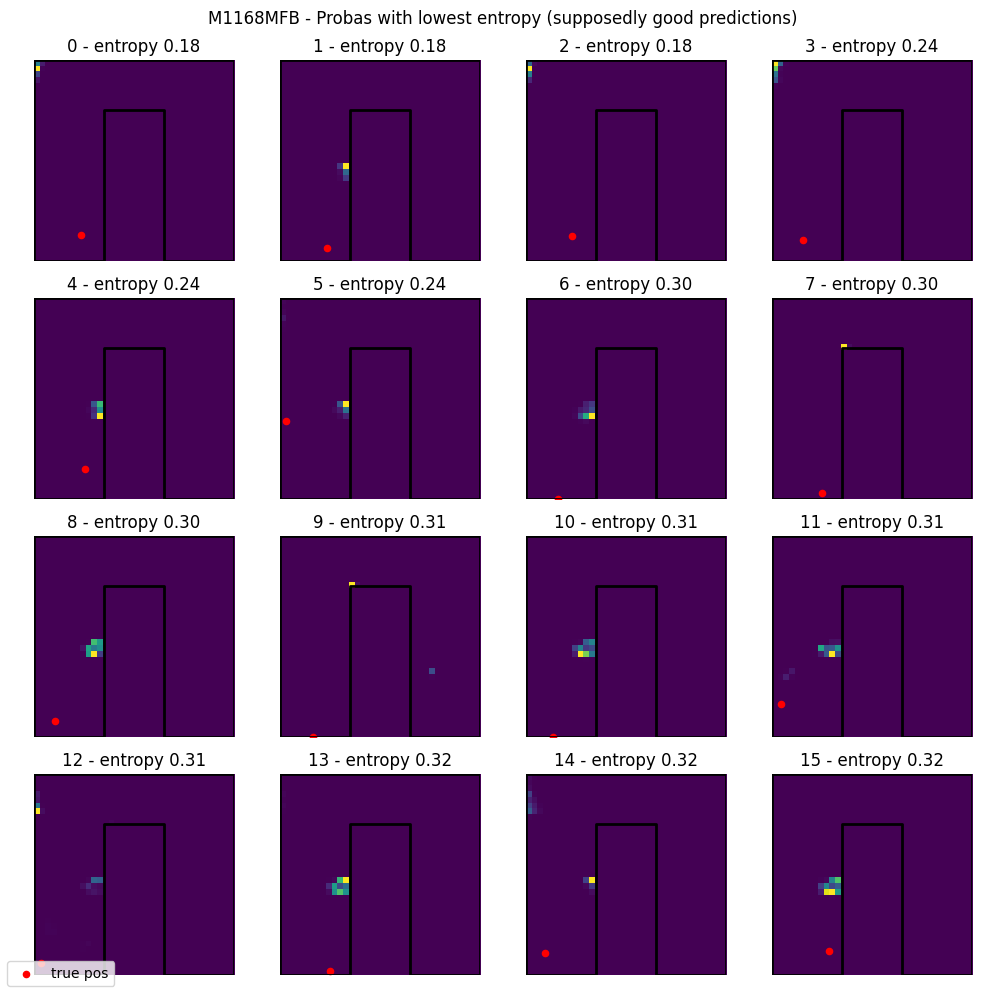

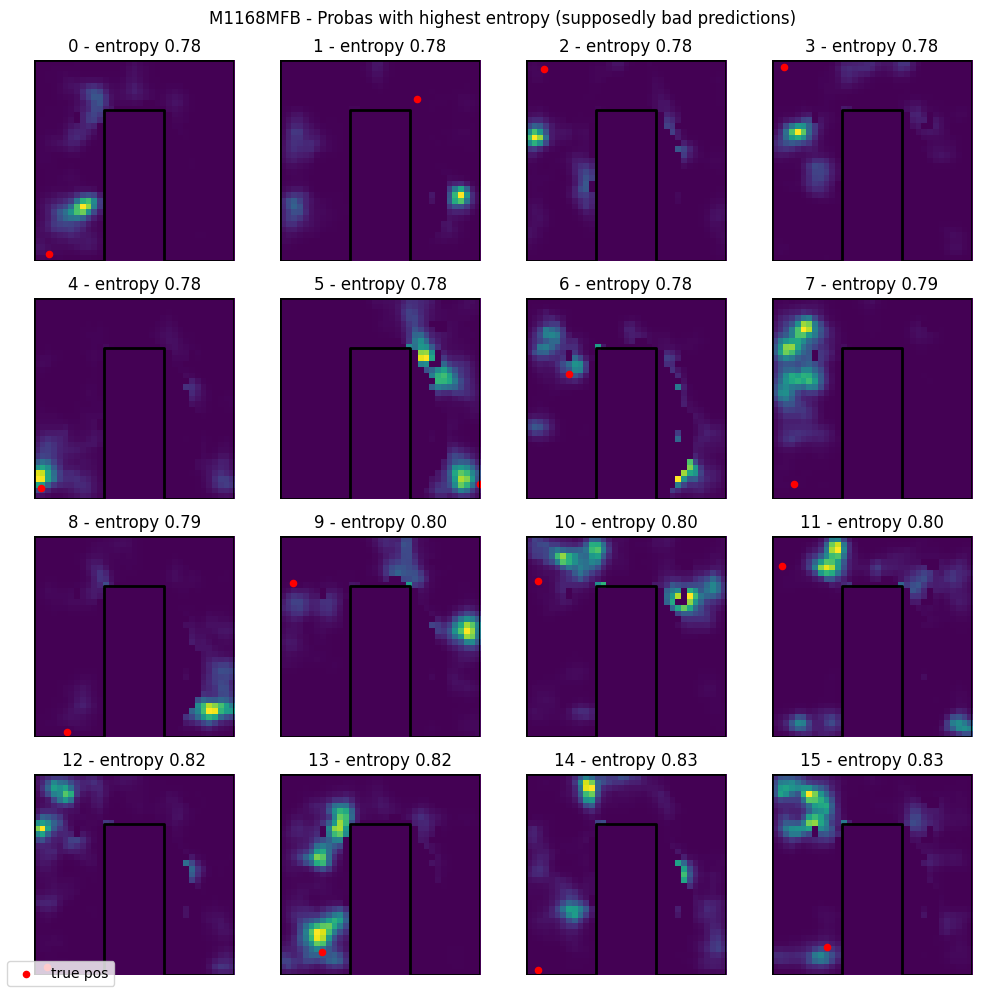

4: 1182_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0085


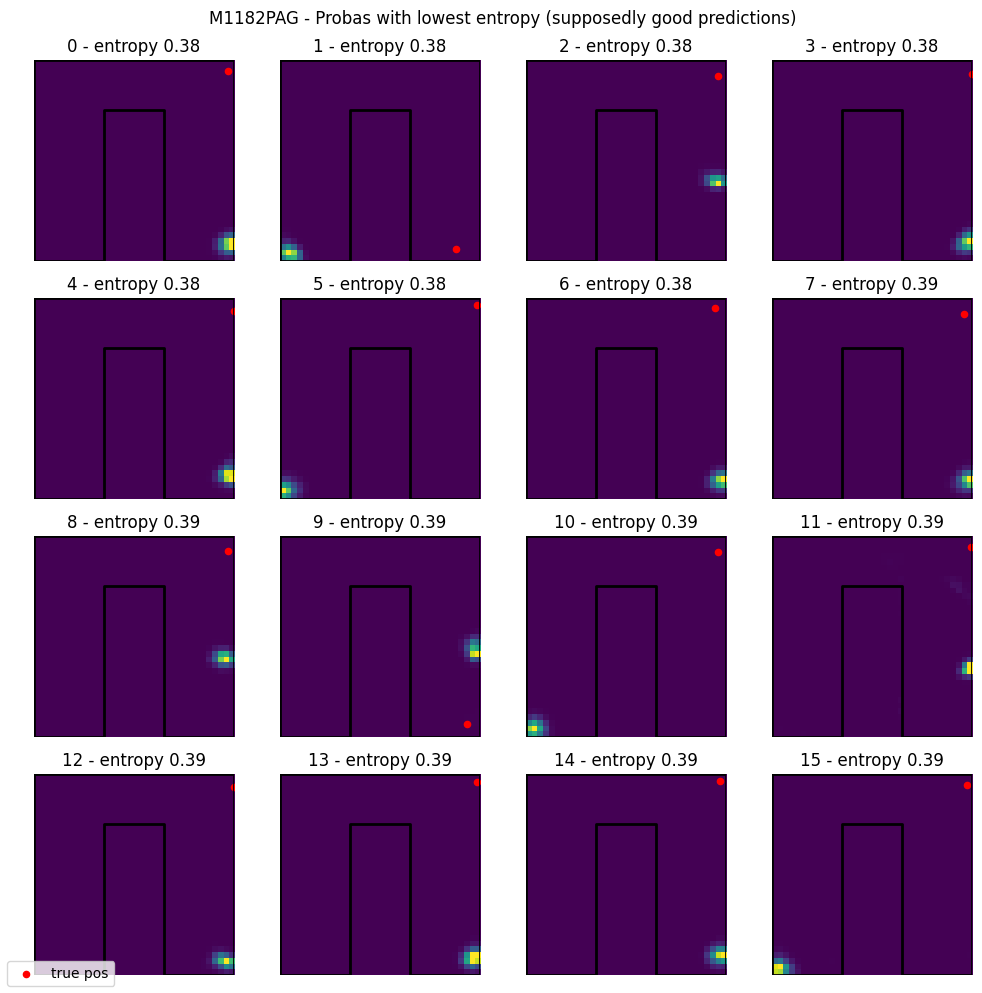

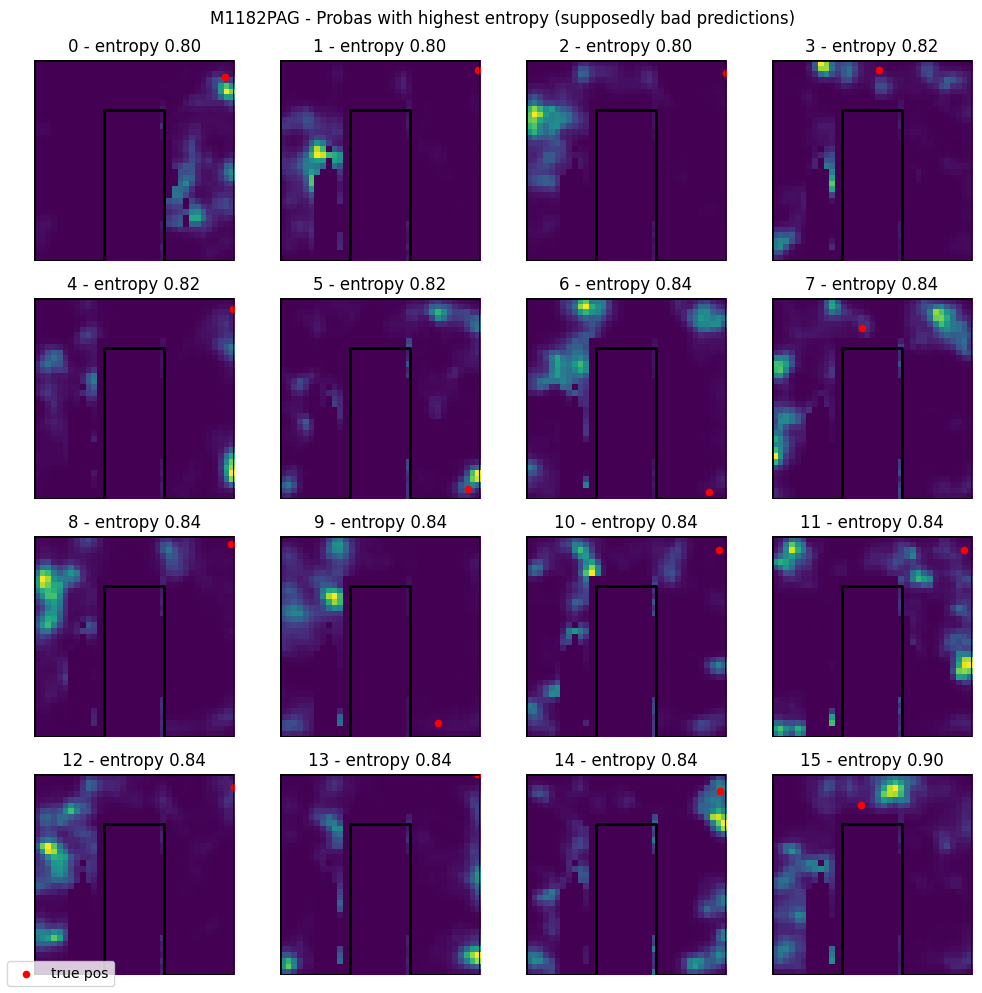

5: 1199_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0146


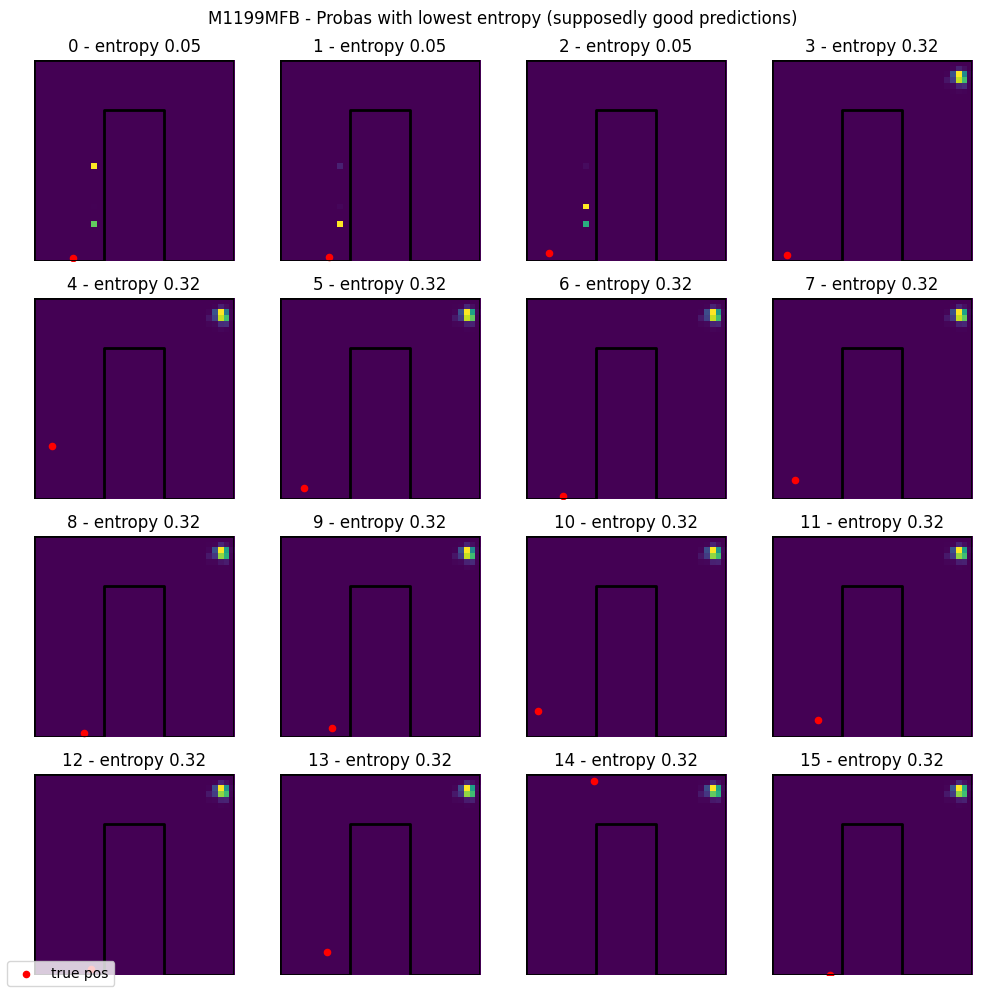

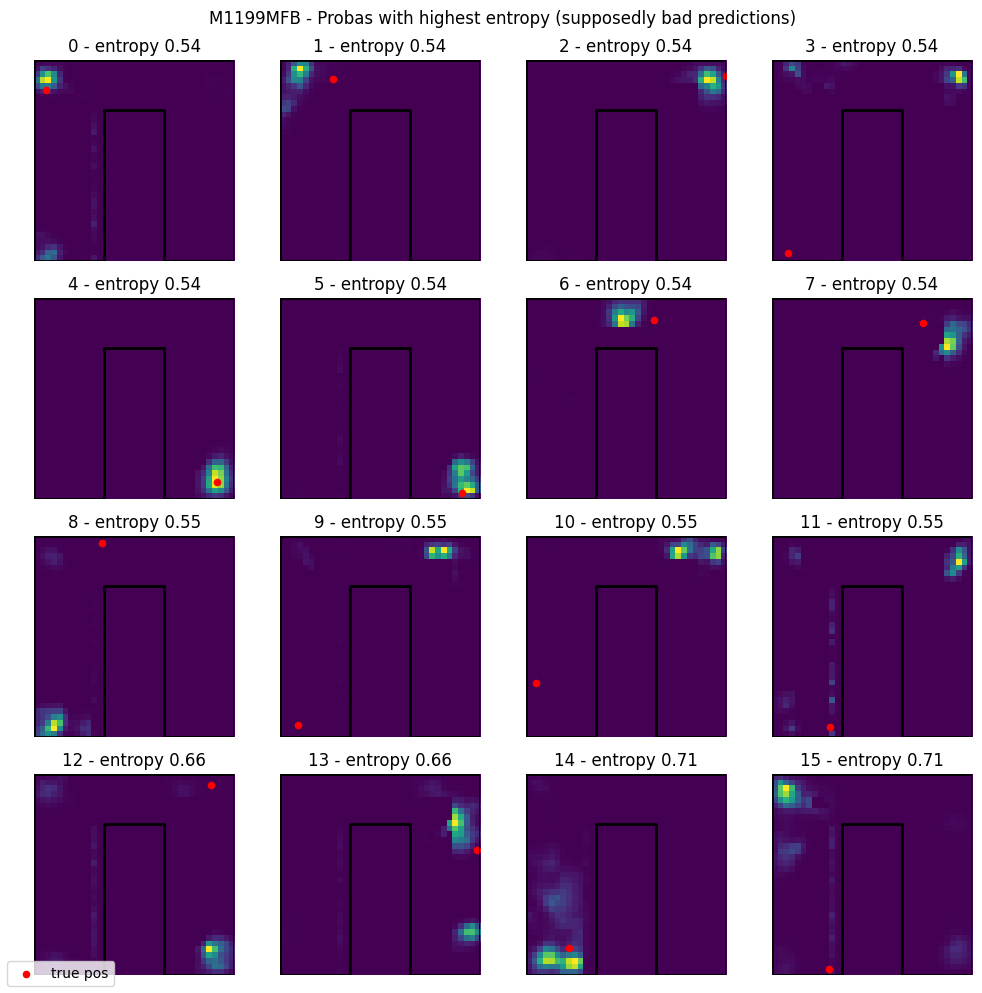

6: 1199_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0085


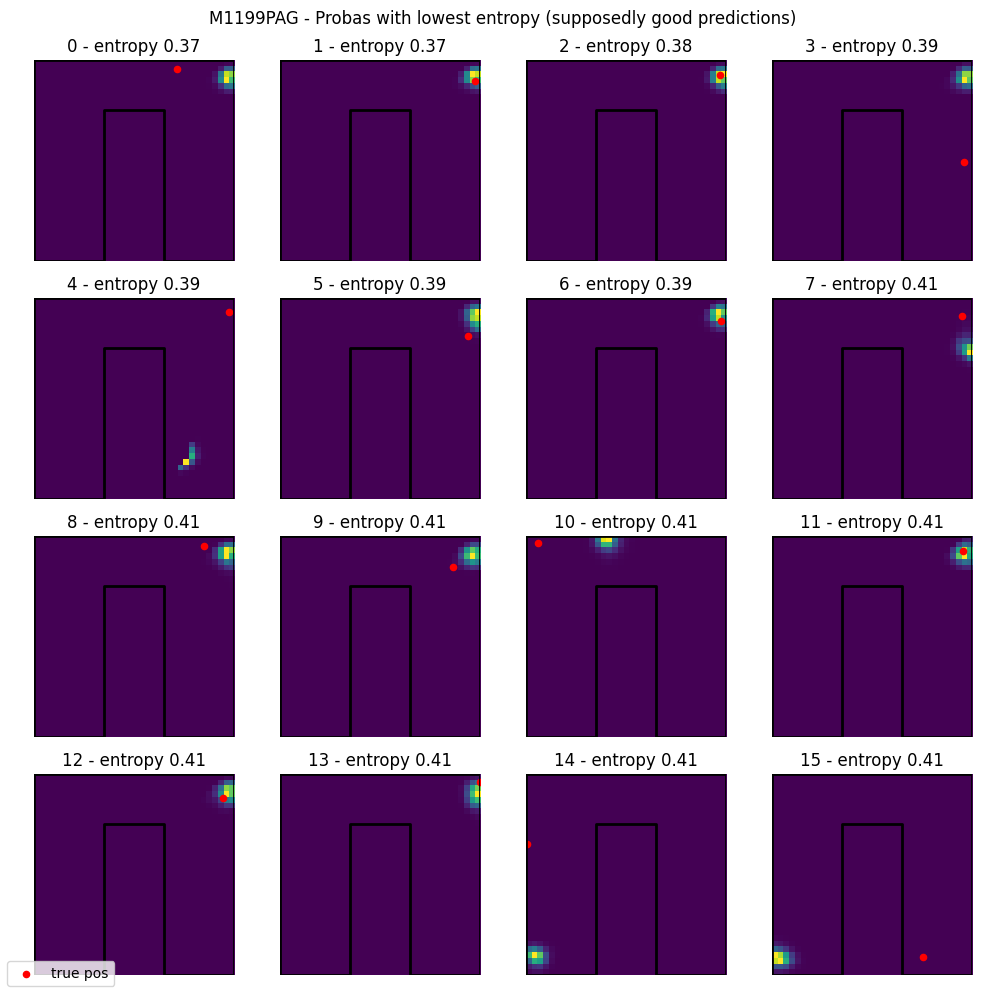

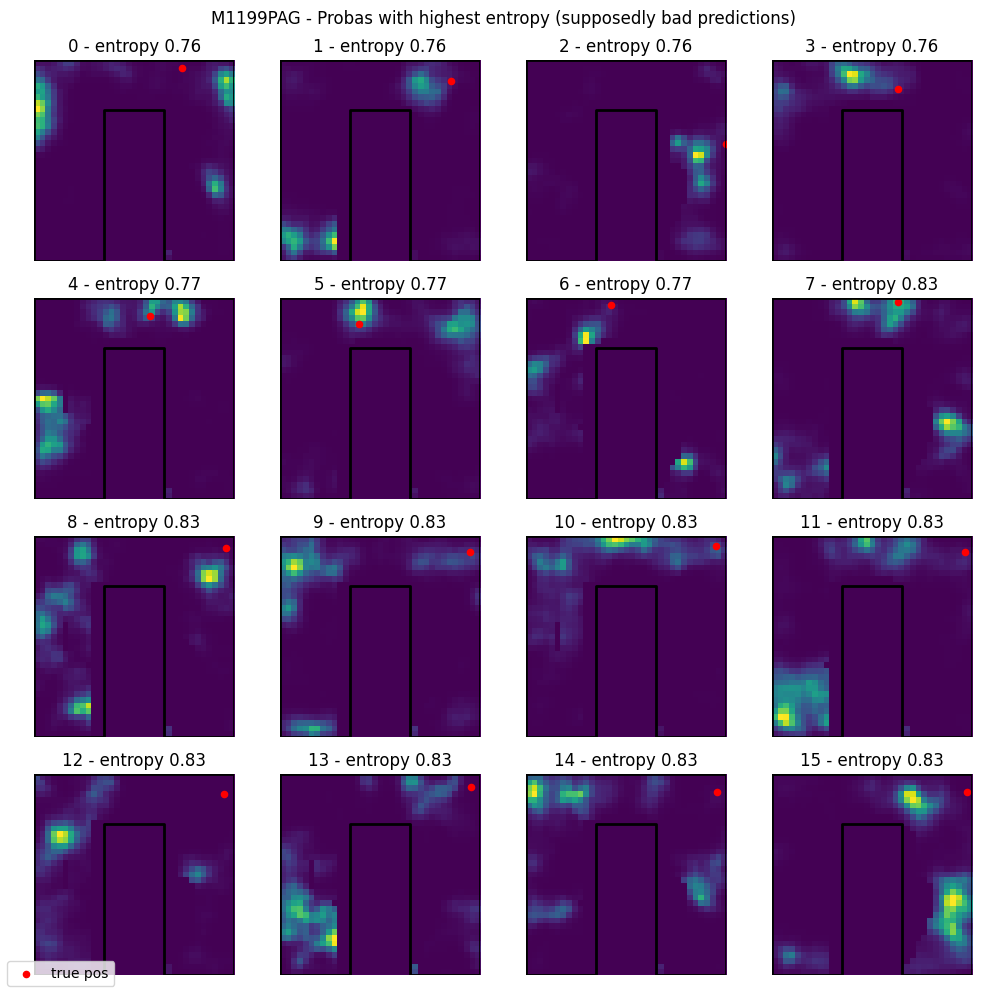

7: 1199_reversal
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0132


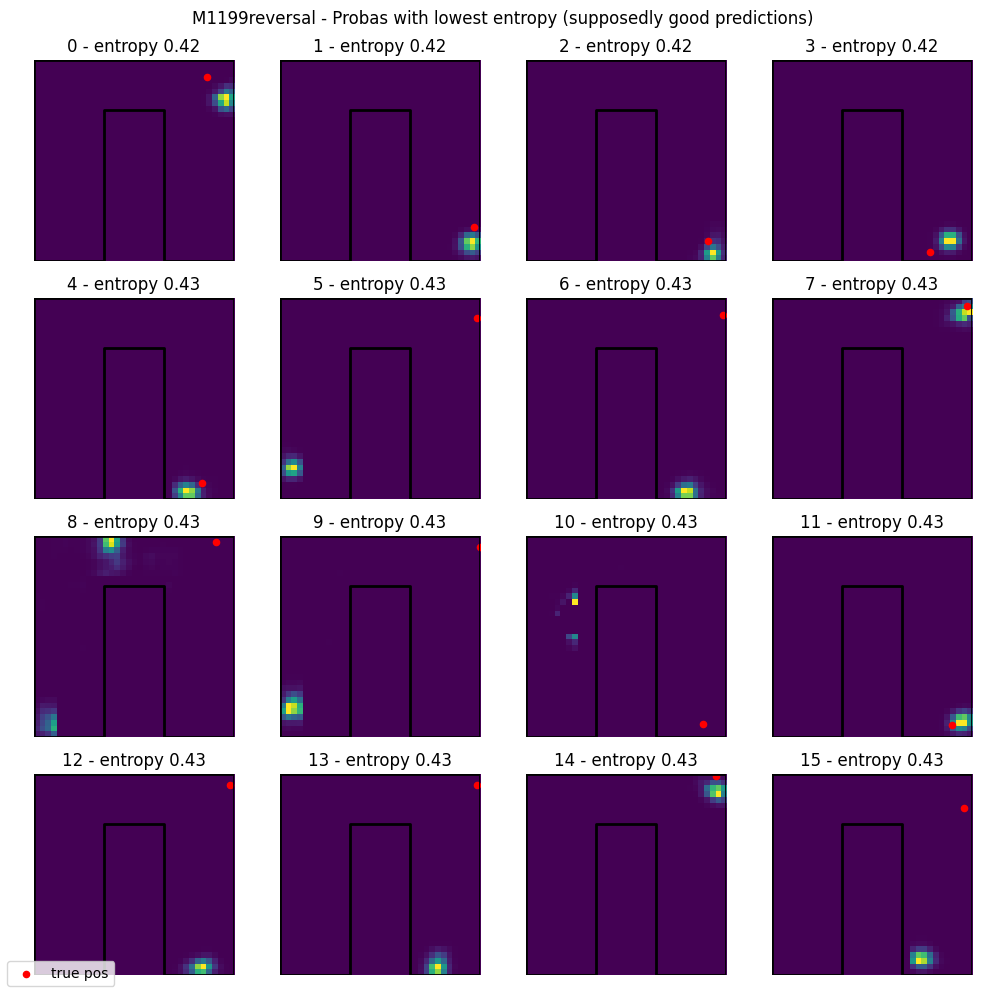

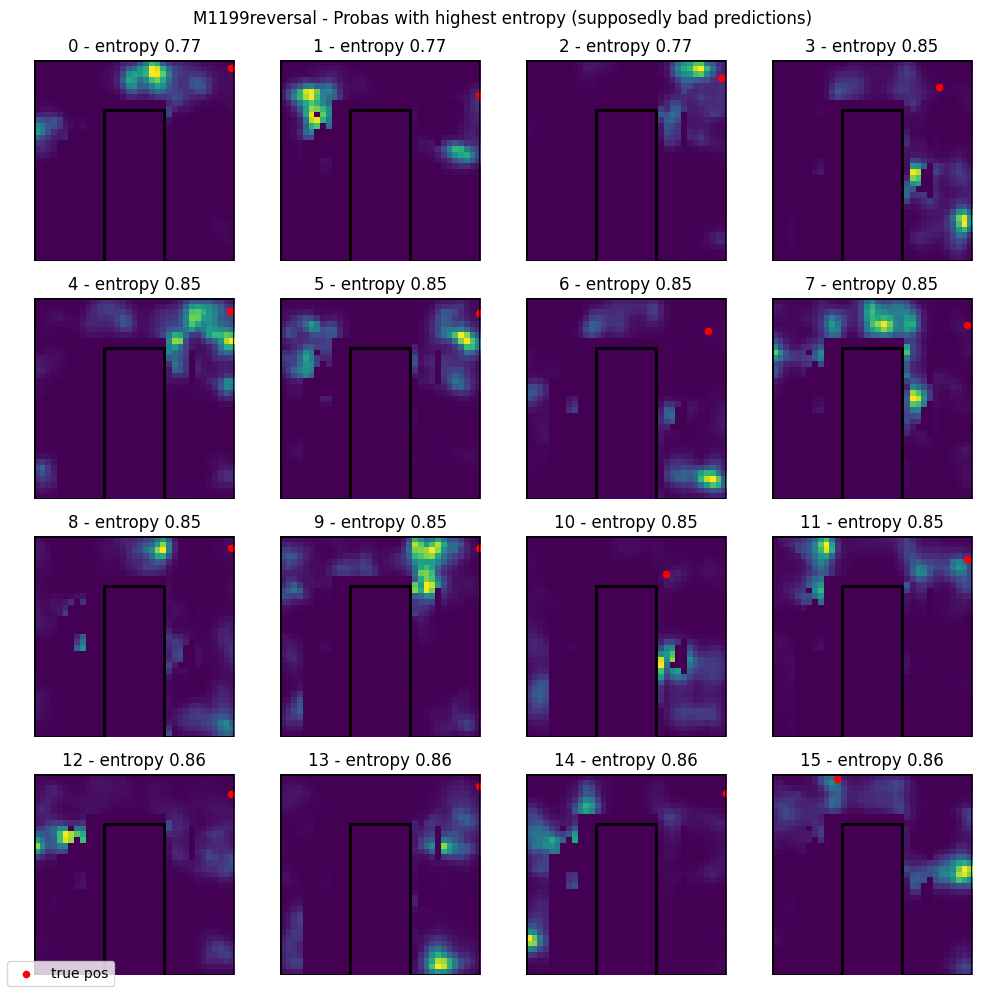

8: 1230_Known
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0085


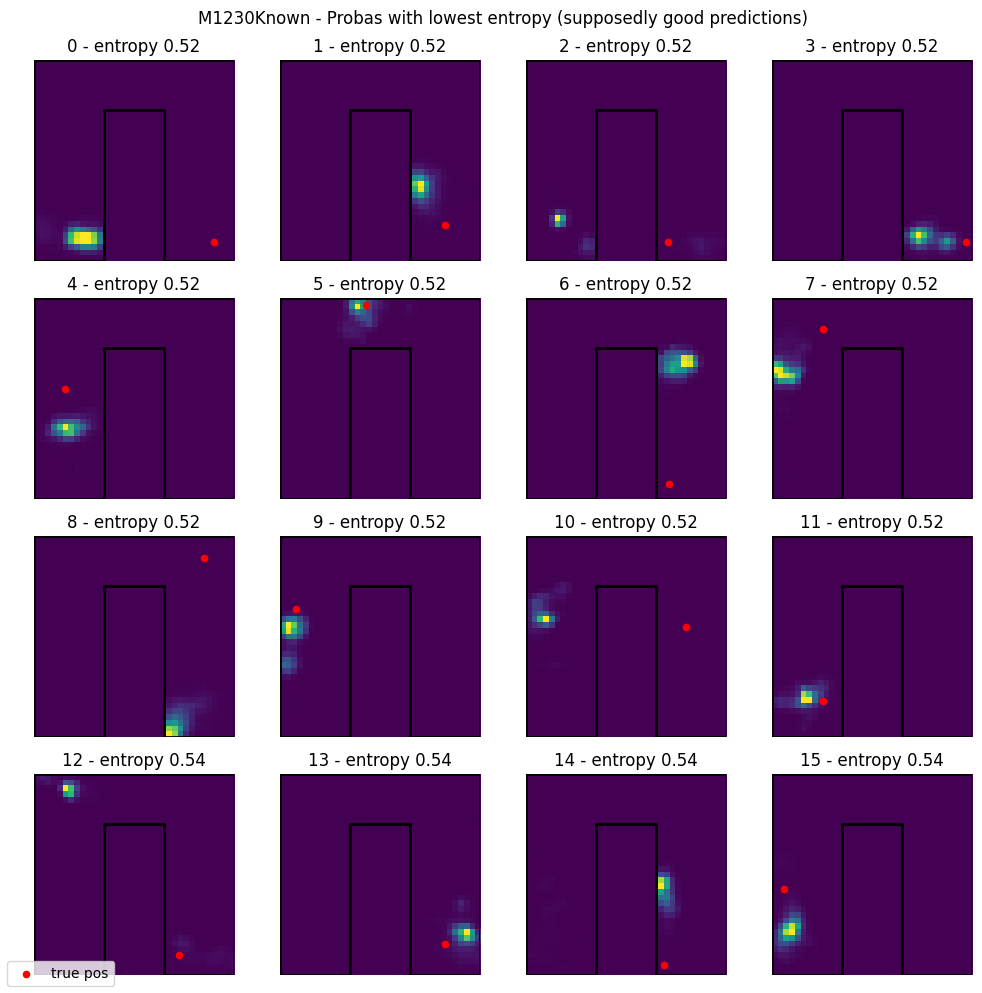

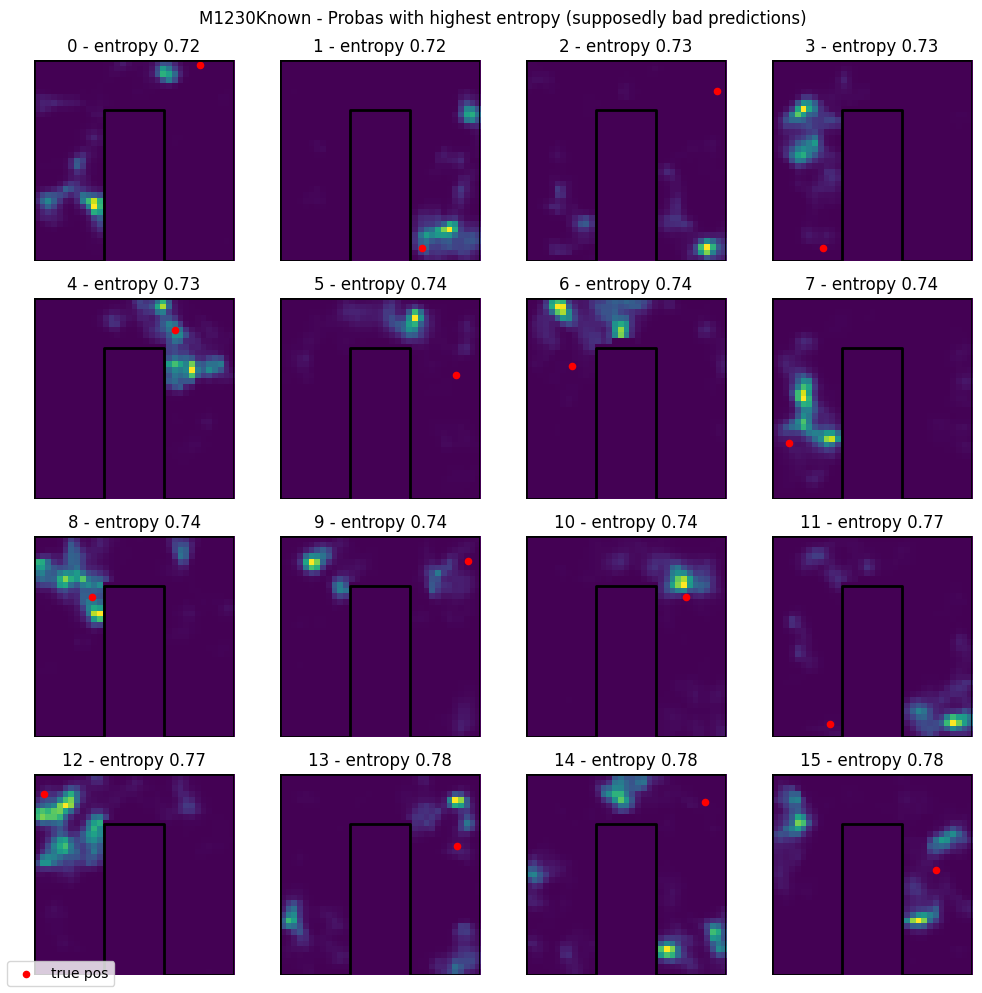

9: 1230_Novel
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0161


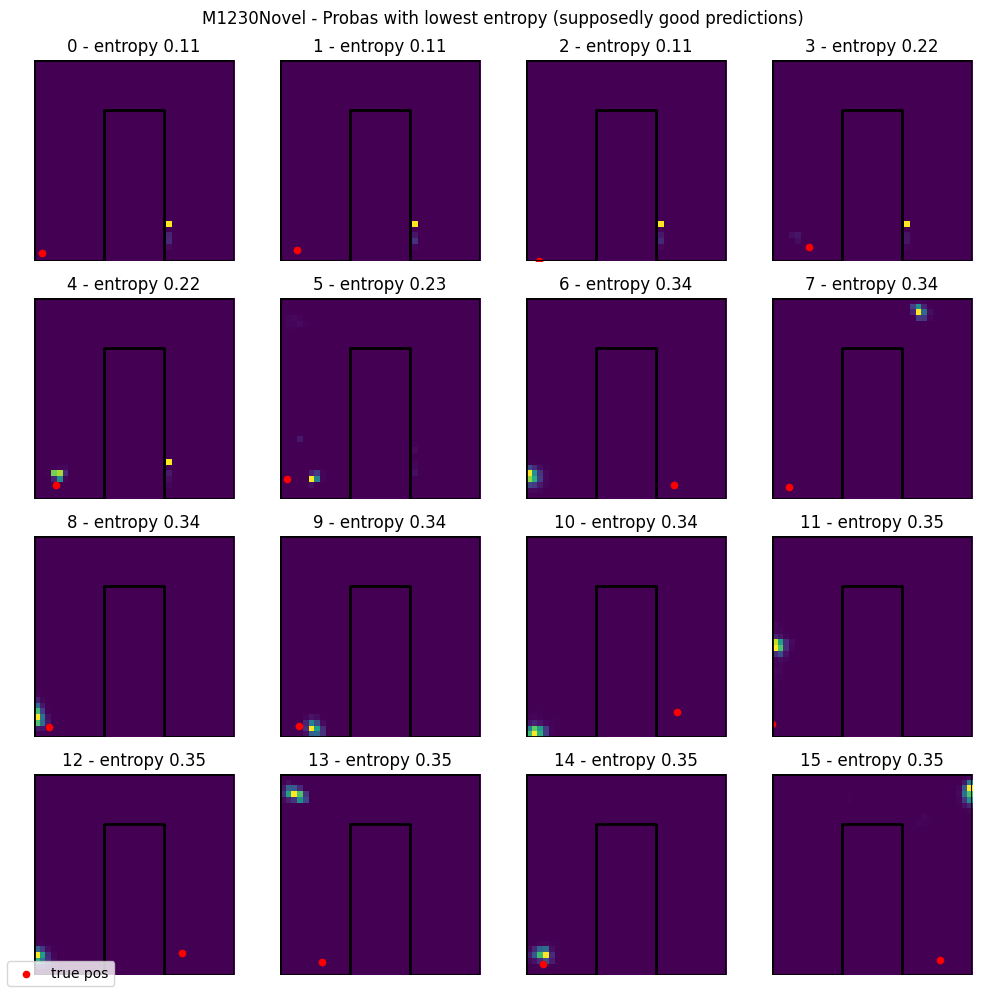

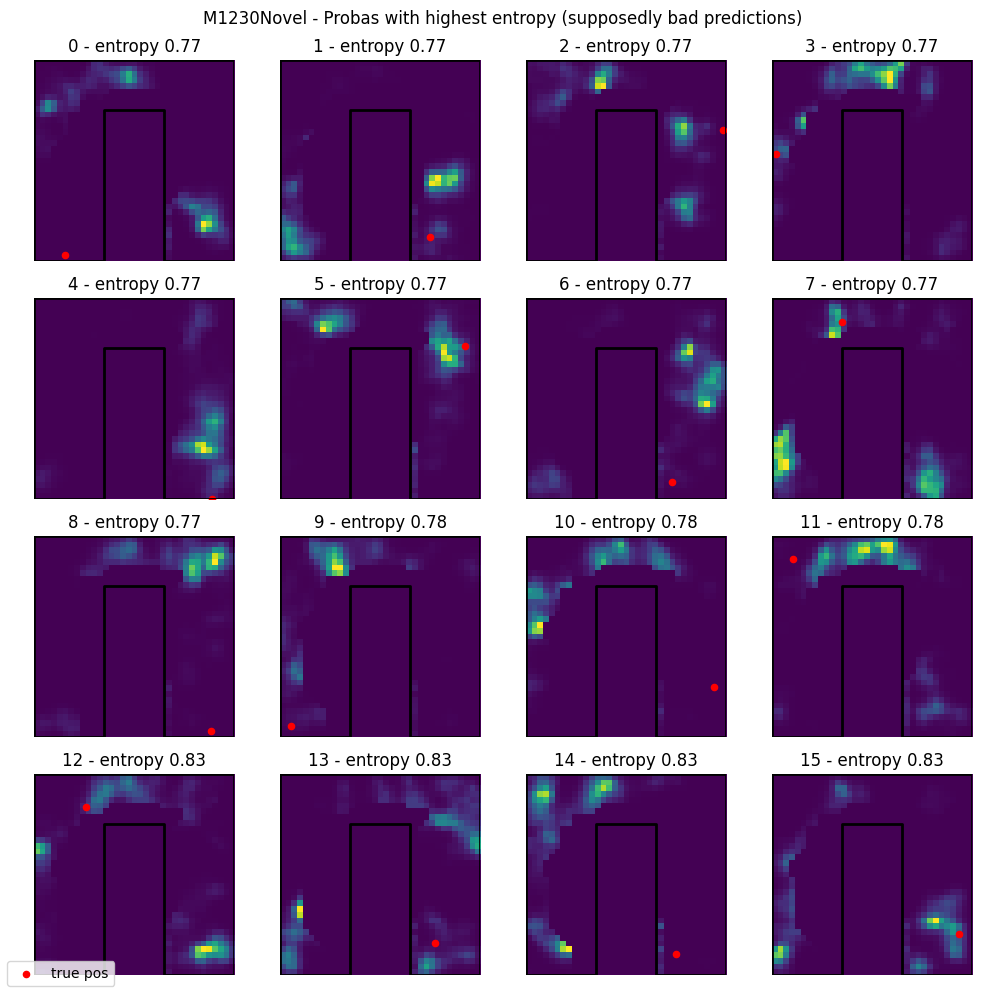

10: 1239_MFB
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0173


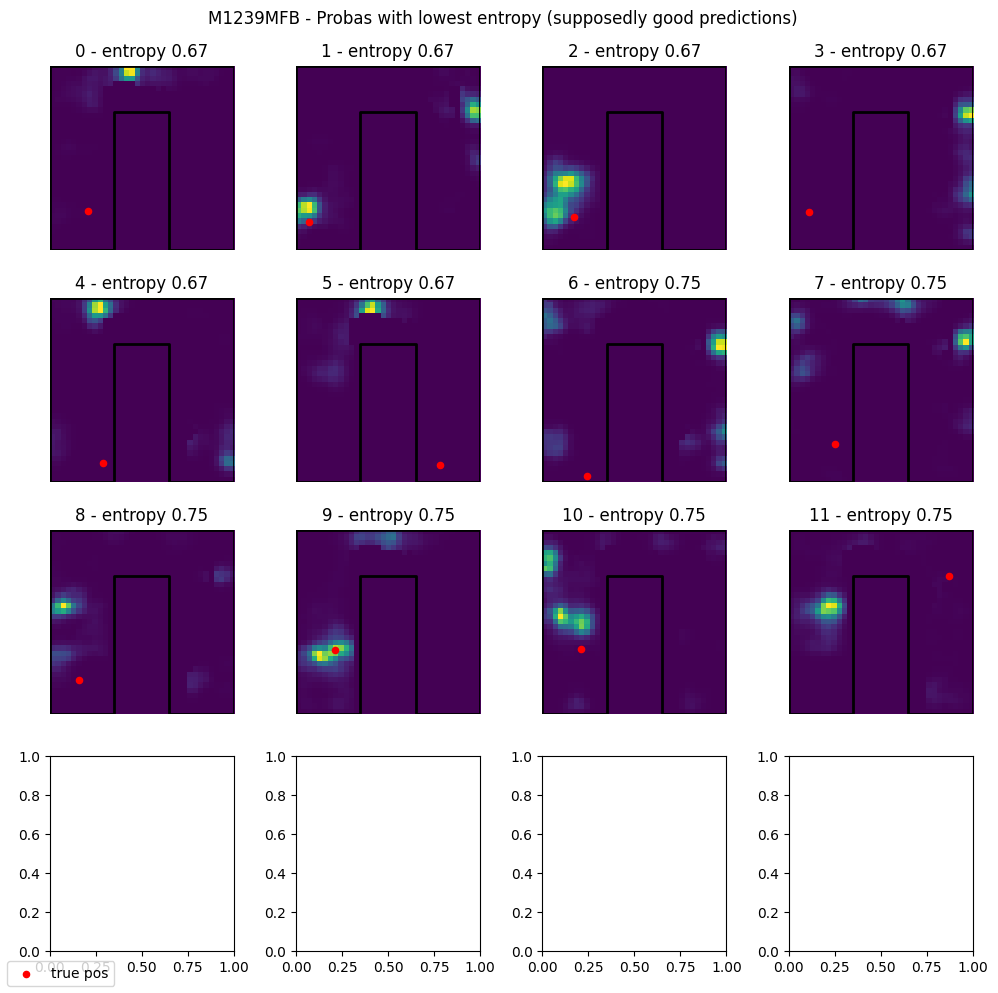

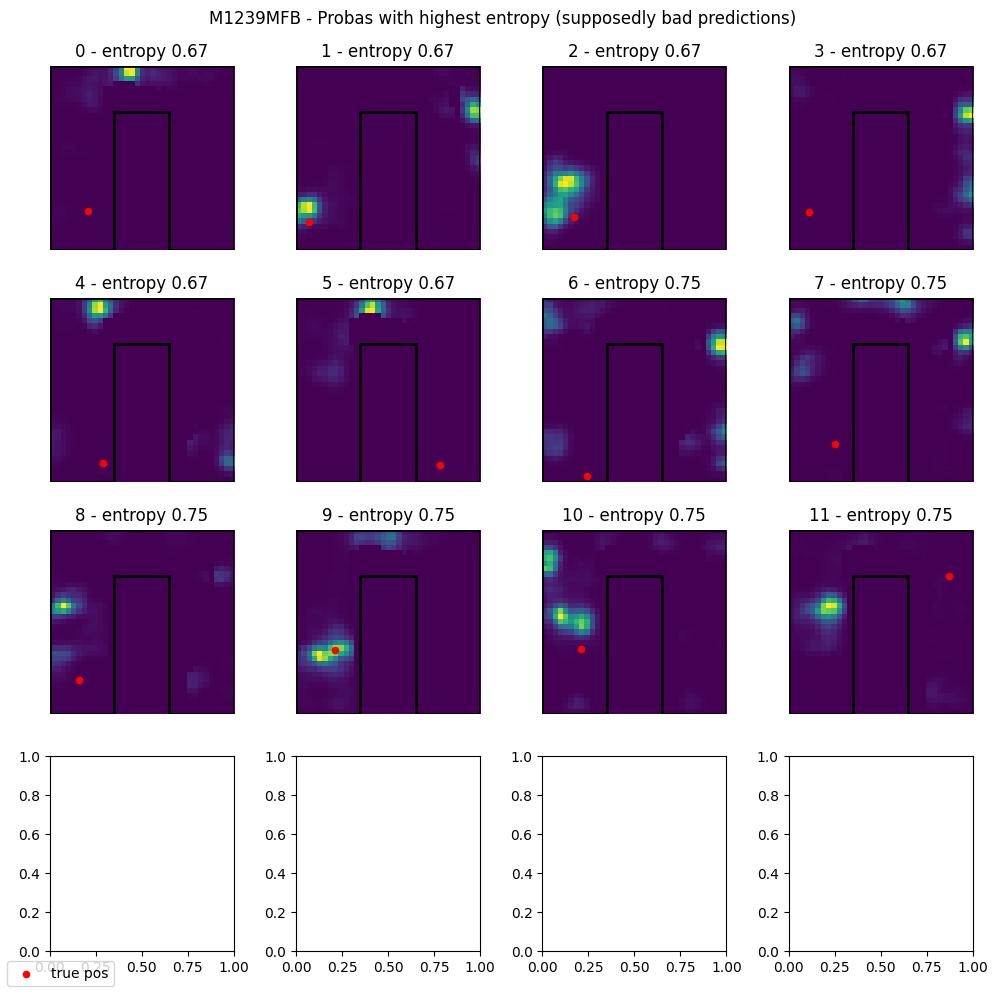

11: 1239_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0097


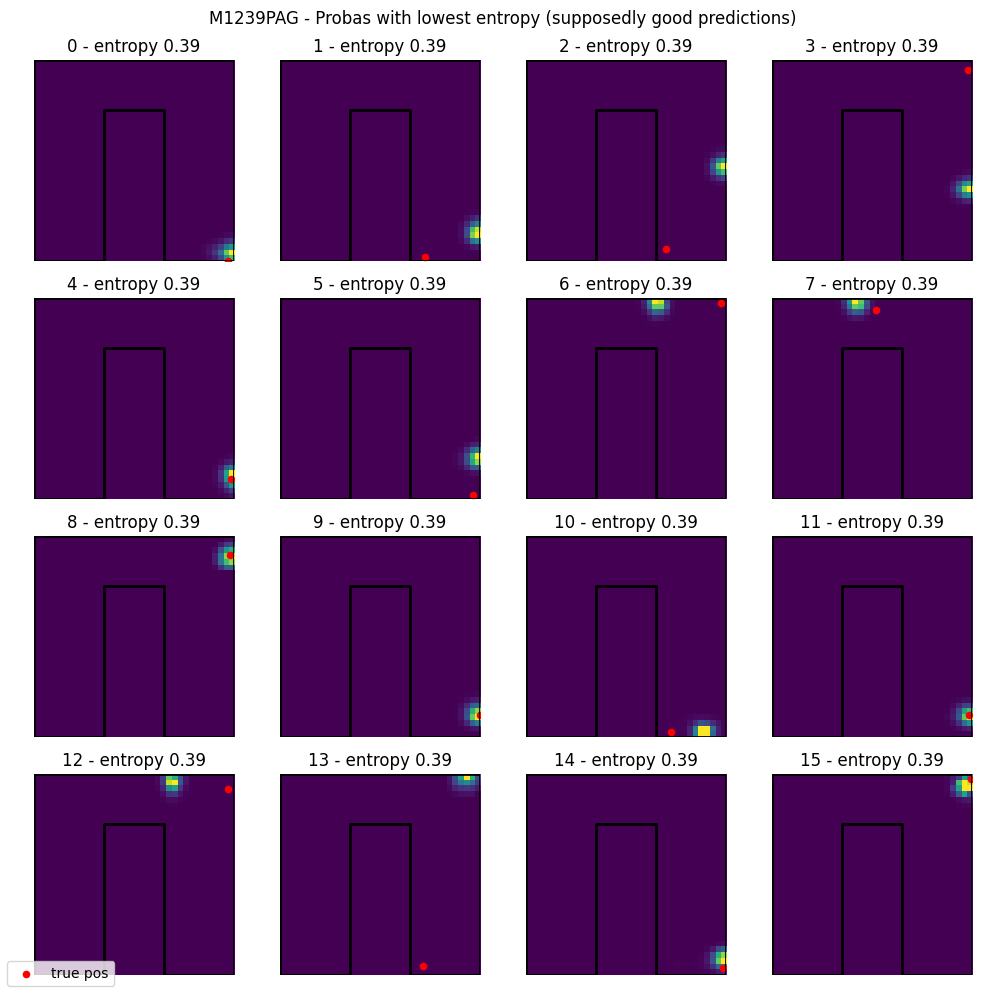

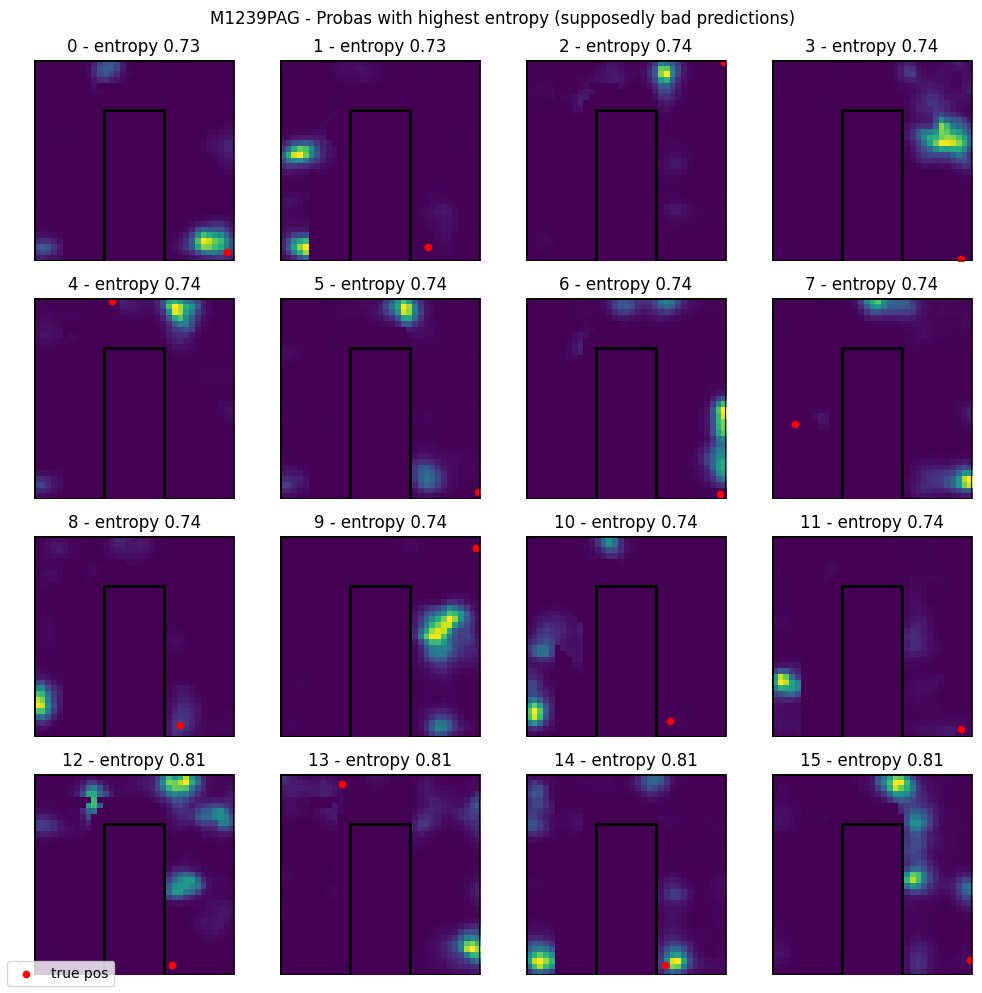

12: 905_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0104


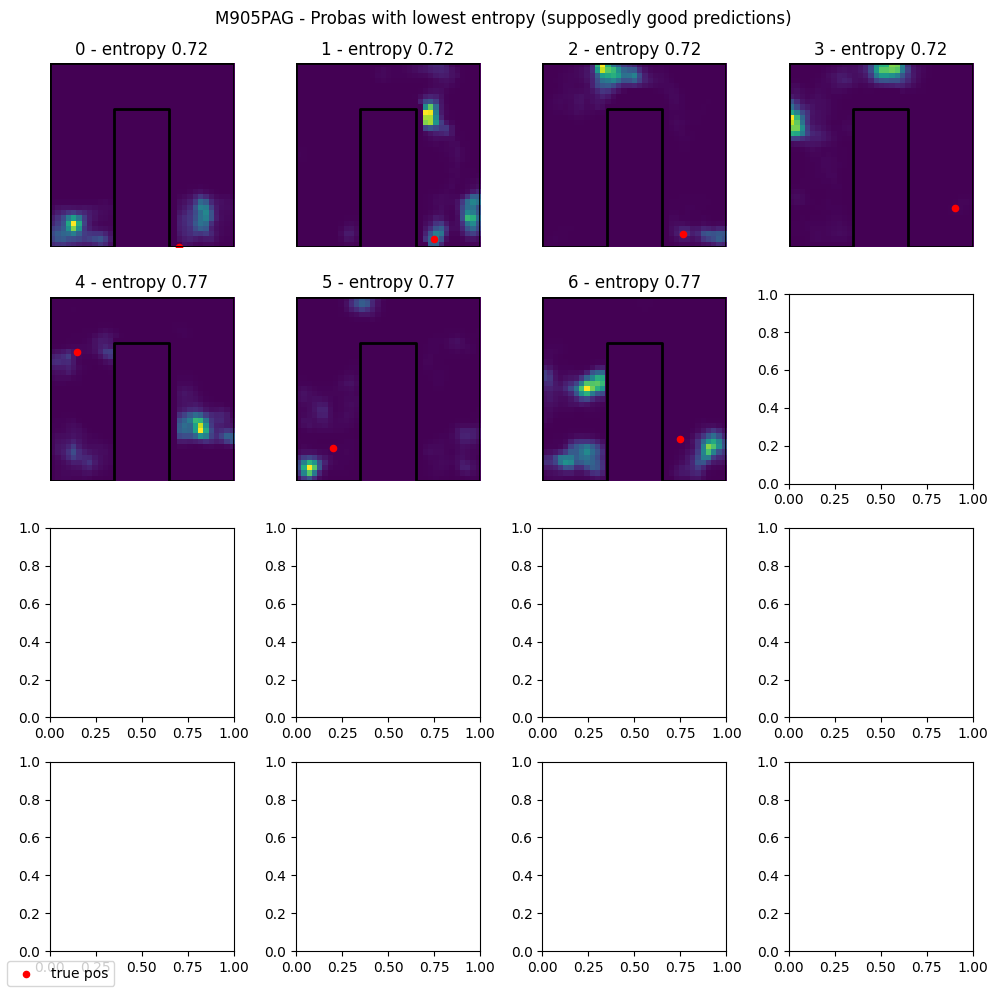

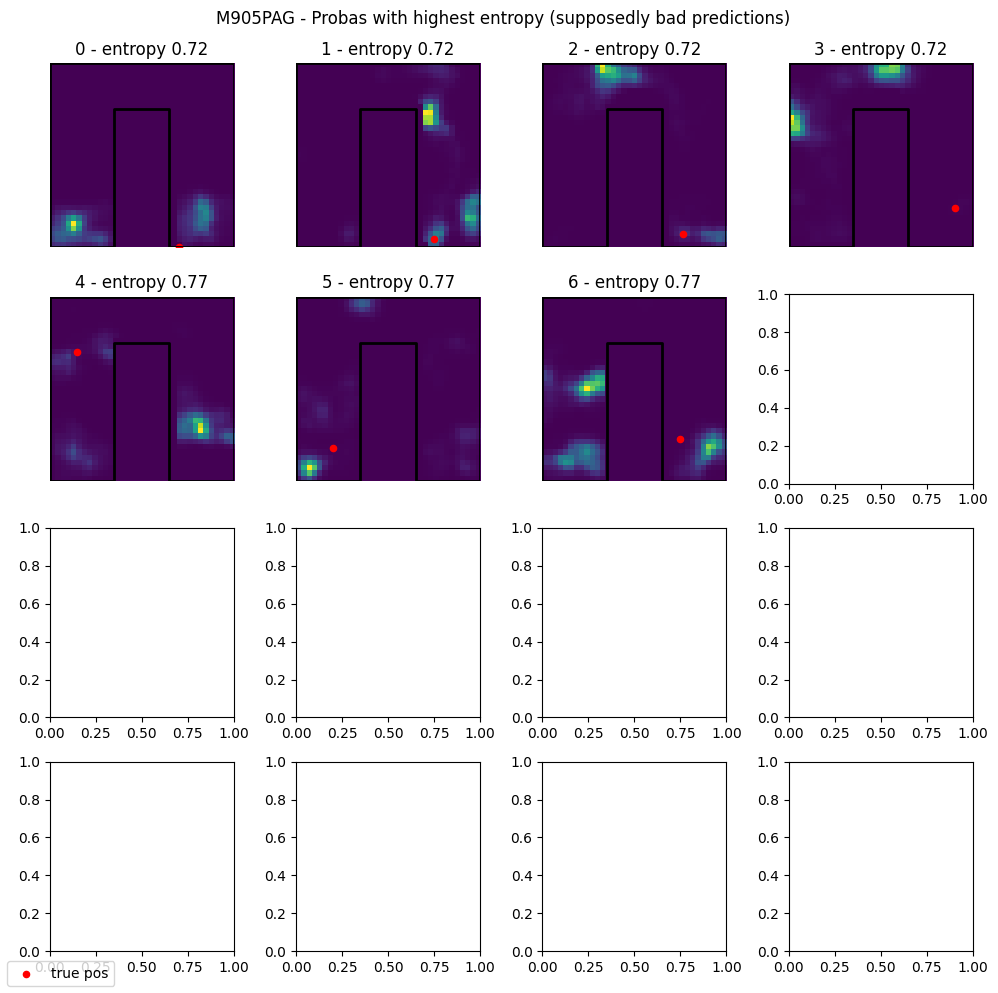

13: 994_PAG
Using mixed precision with float16 on device /device:CPU:0
Compute dtype: bfloat16
Variable dtype: float32
Setting up GaussianHeatmapLayer...
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
batch norm set to False
dim_factor: 4
project transformer: True
Output dimension: 4
iter 0: gamma=1.000, max=5.0000, avg_local=0.0089


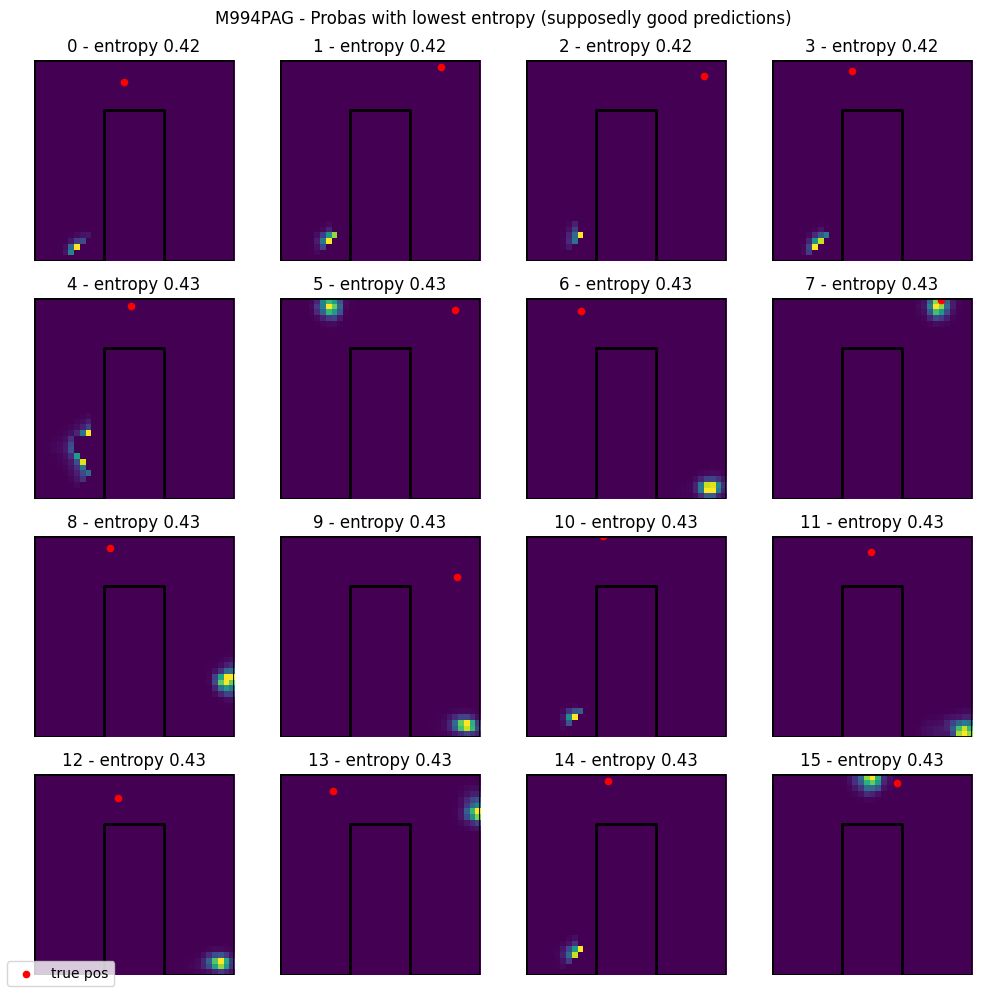

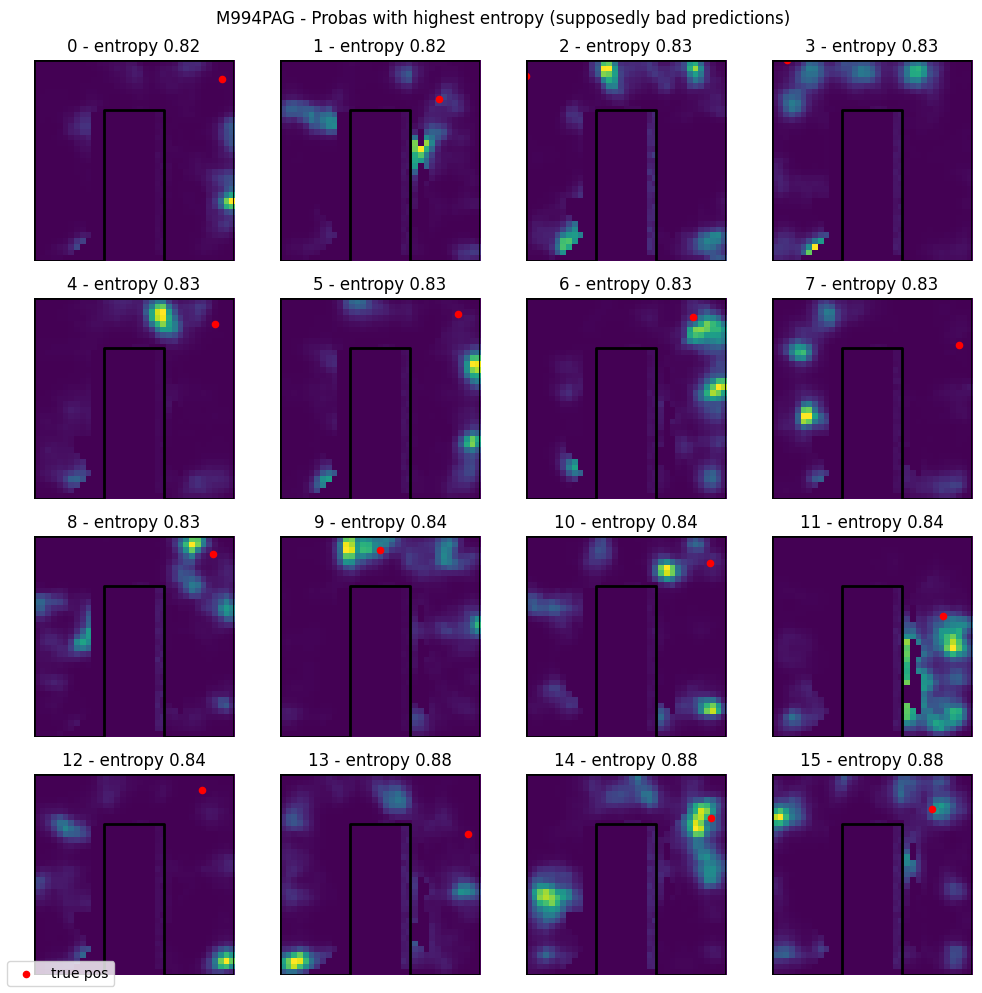

In [184]:
loader_all.results_df["mouse_manipe"].unique()
import dill as pickle
import tensorflow as tf

for i in range(loader_all.results_df["mouse_manipe"].unique().shape[0]):
    print(f"{i}: {loader_all.results_df['mouse_manipe'].unique()[i]}")
    mouse_manipe = loader_all.results_df["mouse_manipe"].unique()[i]
    if (
        loader_all.results_df.query(
            "mouse_manipe == @mouse_manipe & winMS == 108"
        ).shape[0]
        == 0
    ):
        print(f"Skipping {mouse_manipe} because no winMS 108")
        continue
    Mouse_Results = loader_all.results_df.query(
        "mouse_manipe == @mouse_manipe & winMS == 108 & stride == 4 & phase == 'cond'"
    ).results.iloc[0]

    with open(
        os.path.join(Mouse_Results.folderResult, "108", "decoding_results_cond.pkl"),
        "rb",
    ) as f:
        decoding_results = pickle.load(f)

    Mouse_Results.load_trainers(which="ann", winMS="108")
    logits_hw = decoding_results["logits_hw"]
    entropy_hw = decoding_results["Hn"]
    net = Mouse_Results.ann
    heatmap_layer = net.GaussianHeatmap
    truePos = decoding_results["featureTrue"]
    # Assume logits_hw: [B,H,W], target_hw: [B,H,W], heatmap_layer instance exists
    from neuroencoders.utils.global_classes import MAZE_COORDS

    B, H, W = logits_hw.shape

    # 1️⃣ Mask forbidden logits
    masked_logits = tf.where(
        heatmap_layer.forbid_mask_tf[None] > 0, heatmap_layer.NEG, logits_hw
    )

    # 2️⃣ Softmax over allowed bins
    logits_flat = tf.reshape(masked_logits, [B, H * W])
    probs_flat = tf.nn.softmax(logits_flat, axis=-1)
    probs = tf.reshape(probs_flat, [B, H, W])
    num_subplots = 16
    tRipples = Mouse_Results.data_helper.fullBehavior["Times"]["tRipples"]

    # plot around ripple times
    ripples_time = tRipples.flatten()
    time = decoding_results["times"].flatten()
    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        0:num_subplots
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with lowest entropy (supposedly good predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs_COND.svg",
        dpi=600,
    )
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_lowest_entropy_RIPPLEs_COND.png",
        dpi=300,
    )
    plt.show()

    ripple_mask = np.zeros_like(time, dtype=bool)
    for rt in ripples_time:
        ripple_mask |= (time >= rt - 0.05) & (time <= rt + 0.05)

    entropy_sorted_indices = np.argsort(entropy_hw)[ripple_mask][
        -num_subplots:
    ].flatten()

    # plot the first 16 imshow of logits_hw
    fig, axs = plt.subplots(4, 4, figsize=(10, 10))
    for i in range(num_subplots):
        if i >= ripple_mask.sum():
            break
        ax = axs[i // 4, i % 4]
        ax.plot(MAZE_COORDS[:, 0], MAZE_COORDS[:, 1], "k-", lw=2)
        ax.imshow(
            probs[entropy_sorted_indices[i], :, :],
            origin="lower",
            vmin=0,
            extent=(0, 1, 0, 1),
            label="scaled proba",
        )
        ax.scatter(
            truePos[entropy_sorted_indices[i], 0],
            truePos[entropy_sorted_indices[i], 1],
            c="r",
            s=20,
            label="true pos",
        )
        ax.set_title(f"{i} - entropy {entropy_hw[entropy_sorted_indices[i]]:.2f}")
        ax.axis("off")
    fig.suptitle(
        f"M{Mouse_Results.mouse_name + Mouse_Results.manipe} - Probas with highest entropy (supposedly bad predictions)"
    )
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc="lower left")

    plt.tight_layout()
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs_COND.svg",
        dpi=600,
    )
    plt.savefig(
        f"{main_dir}/mouse_{Mouse_Results.mouse_name}_heatmap_highest_entropy_RIPPLEs_COND.png",
        dpi=300,
    )

    plt.show()

In [185]:
loader_all.results_df.query(
    "winMS == 108 and stride == '4' and phase == 'training'"
).shape[0]

0

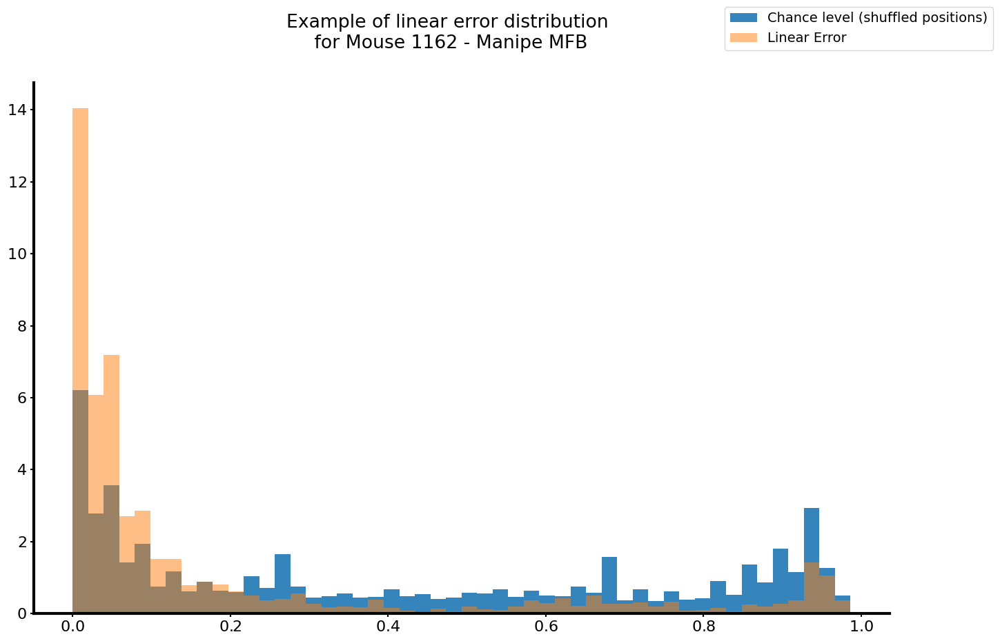

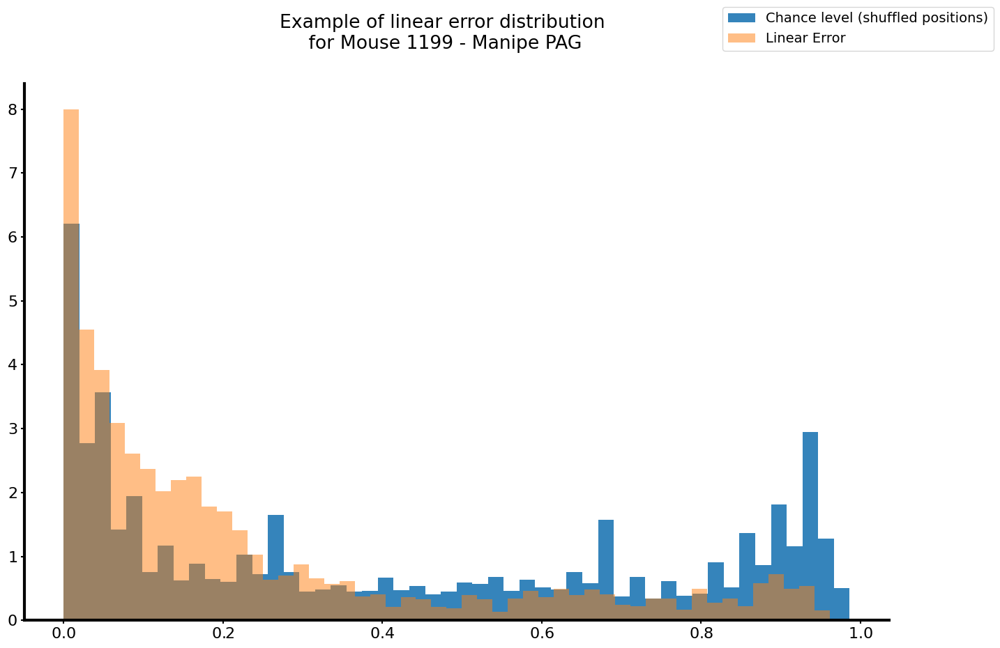

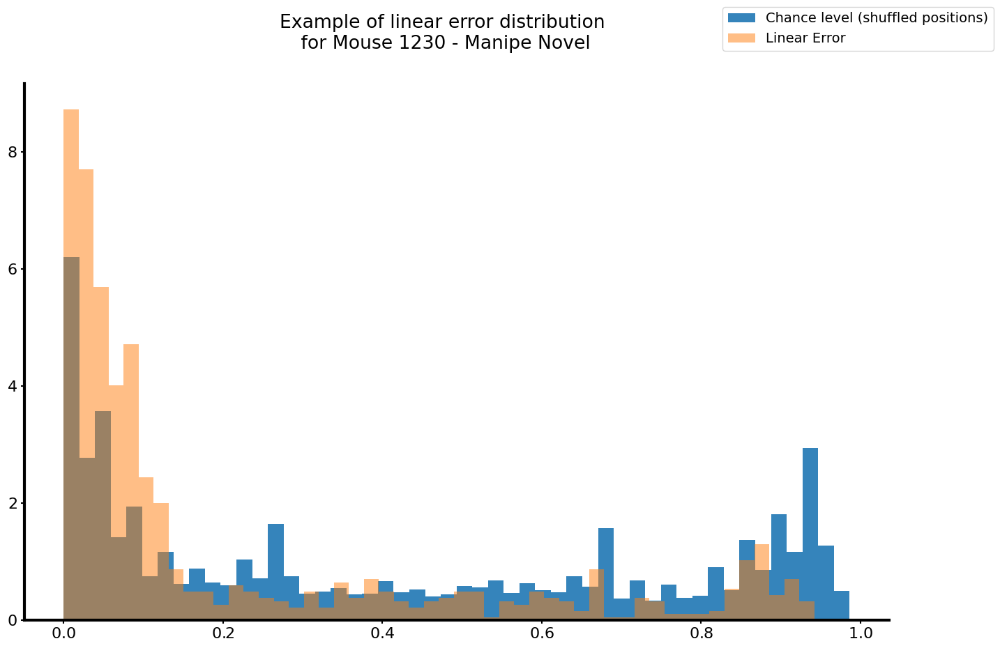

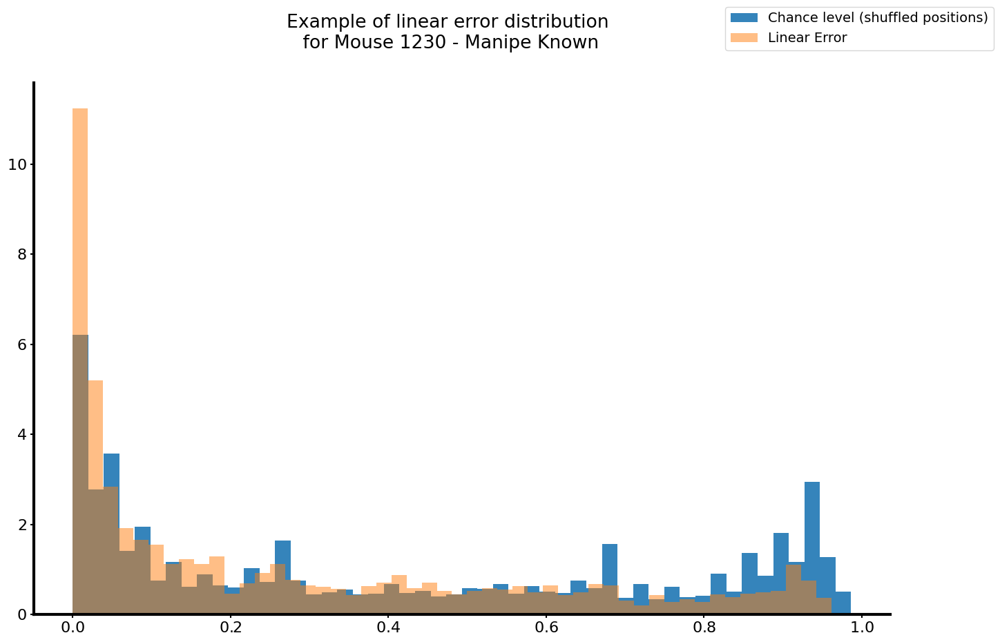

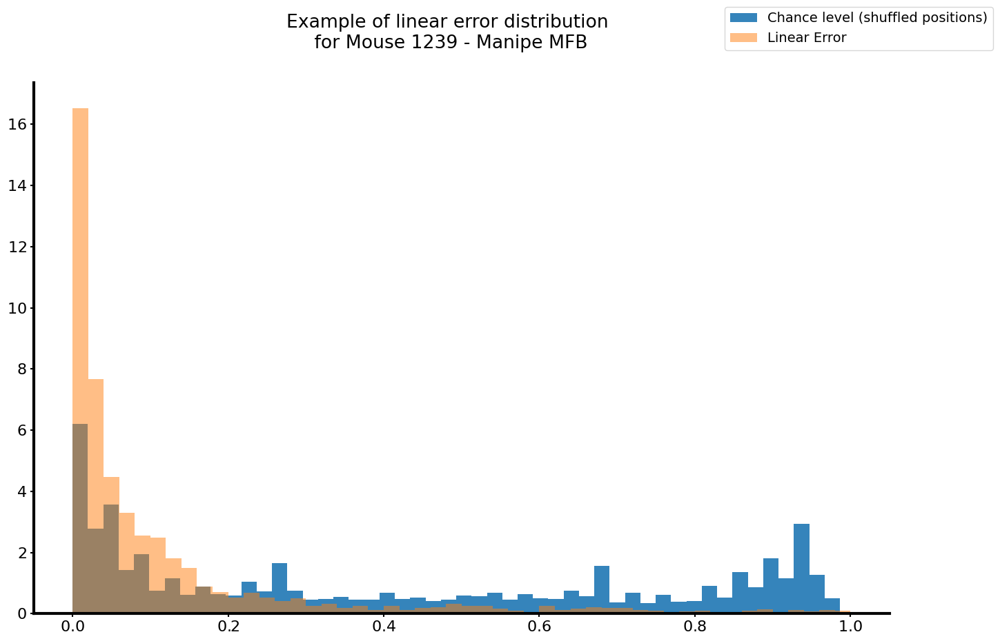

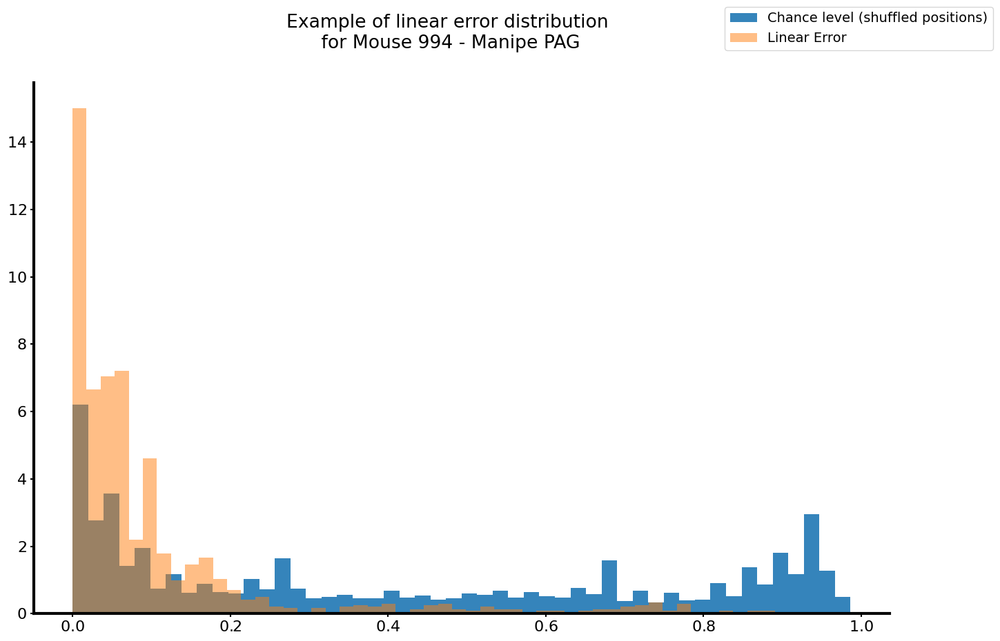

In [156]:
phase = "pre"
for i in range(
    loader_all.results_df.query(
        "winMS == 252 and stride == '4' and phase == @phase"
    ).shape[0]
):
    fig, ax = plt.subplots(1)

    ax.hist(
        error_lin,
        alpha=0.9,
        bins=50,
        density=True,
        label="Chance level (shuffled positions)",
    )
    ax.hist(
        np.abs(
            loader_all.results_df.query(
                "winMS == 252 and stride == '4' and phase == @phase"
            )["linPred"].iloc[i][
                loader_all.results_df.query(
                    "winMS == 252 and stride == '4' and phase == @phase"
                )["speedMask"].iloc[i]
            ]
            - loader_all.results_df.query(
                "winMS == 252 and stride == '4' and phase == @phase"
            )["linTruePos"].iloc[i][
                loader_all.results_df.query(
                    "winMS == 252 and stride == '4' and phase == @phase"
                )["speedMask"].iloc[i]
            ]
        ),
        bins=50,
        density=True,
        label="Linear Error",
        alpha=0.5,
    )

    fig.legend()
    fig.suptitle(
        "Example of linear error distribution\n for Mouse "
        + loader_all.results_df.query(
            "winMS == 252 and stride == '4' and phase == @phase"
        )["mouse"].iloc[i]
        + " - Manipe "
        + loader_all.results_df.query(
            "winMS == 252 and stride == '4' and phase == @phase"
        )["manipe"].iloc[i]
    )
    plt.show()

ValueError: Could not interpret value `Mean_Linear_Error` for `y`. An entry with this name does not appear in `data`.

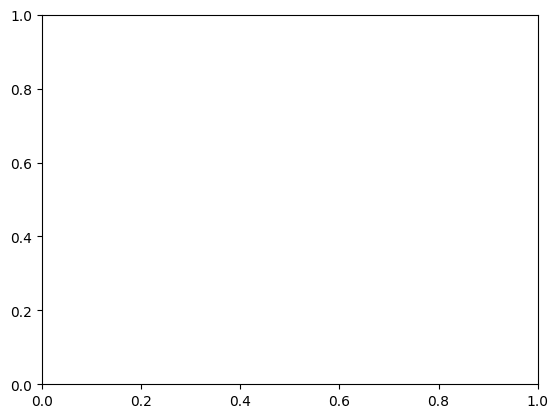

In [193]:
fig, ax = plt.subplots()
sns.boxplot(
    data=my_df,
    x="phase",
    y="Mean_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    ax=ax,
)
ann_strip = sns.stripplot(
    data=my_df,
    x="phase",
    y="Mean_Linear_Error",
    hue="Error_Type",
    palette="Set2",
    order=["training", "pre", "cond", "post"],
    dodge=True,
    edgecolor="black",
    linewidth=1,
    alpha=0.5,
    ax=ax,
)
winMS_list = ["mean_error", "mean_error_filtered"]


# connect points per mouse with lines INSIDE EACH hue, ie only connect in the same phase from one error type to the other error type
def connect_points(
    strip, data_df, color="gray", value_vars=None, var_name=None, value_name=None
):
    paths = strip.collections
    x_ticks = (
        phase_list if phase_list is not None else ["training", "pre", "cond", "post"]
    )

    coords = {}
    for i, (phase, winMS) in enumerate([(s, p) for s in x_ticks for p in value_vars]):
        coll = paths[i]
        offsets = coll.get_offsets()
        coords[(phase, winMS)] = offsets

    # Connect across phases or winMSs
    if len(value_vars) > 1:
        for (mouse, phase, _), sub in data_df.groupby(
            ["mouse_manipe", "phase", "phase"]
        ):
            if set(sub[var_name]) >= set(value_vars):
                pts = []
                for _, row in sub.iterrows():
                    phase_val = str(row["phase"])
                    winMS_val = row[var_name]
                    arr = coords[(phase_val, winMS_val)]
                    idx = np.argmin(np.abs(arr[:, 1] - row[value_name]))
                    pts.append(arr[idx])
                if len(pts) == len(value_vars):
                    ax.plot(
                        [p[0] for p in pts],
                        [p[1] for p in pts],
                        color=color,
                        alpha=0.6,
                        linewidth=1,
                    )
    else:
        winMS = value_vars[0]
        for (mouse, phase), sub in data_df.query(f"{var_name} == @winMS").groupby(
            ["mouse_manipe", "phase"]
        ):
            pts = []
            for _, row in sub.iterrows():
                phase_val = str(row["phase"])
                arr = coords[(phase_val, winMS)]
                idx = np.argmin(np.abs(arr[:, 1] - row["mean_error"]))
                pts.append(arr[idx])
            if len(pts) > 1:
                pts = sorted(pts, key=lambda x: x[0])
                ax.plot(
                    [p[0] for p in pts],
                    [p[1] for p in pts],
                    color=color,
                    alpha=0.6,
                    linewidth=1,
                )


connect_points(
    strip=ann_strip,
    data_df=my_df,
    color="gray",
    value_vars=winMS_list,
    var_name="Error_Type",
    value_name="Mean_Linear_Error",
)
# fig.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.png"), dpi=300)
# fig.savefig(os.path.join(main_dir, "boxplot_mean_lin_error_and_filtered_with_lines.svg"))

# old

In [ ]:
# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'"),
    x_vars=["training_asymmetry_index"],
    y_vars=["asymmetry_on_predicted"],
    hue="mouse",
    height=4.5,
    aspect=2,
)

In [ ]:
loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'")[
    ["mouse", "winMS"]
].apply(tuple, axis=1)

In [ ]:
loader_all.results_df.asymmetry_bias

In [ ]:
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'")[
        [
            "mouse",
            "real_asymmetry_ratio",
            "training_asymmetry_index",
            "predicted_asymmetry_ratio_normalized",
            "asymmetry_bias",
            "asymmetry_on_predicted",
        ]
    ],
    x_vars=["training_asymmetry_index"],
    hue="mouse",
    height=4.5,
    aspect=1.5,
)

In [ ]:
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'")[
        loader_all.results_df.columns[
            loader_all.results_df.columns.str.contains("asymmetry|error|mouse")
        ]
    ],
    hue="mouse",
    height=4.5,
    aspect=1.5,
)

In [ ]:
sns.pairplot(
    loader_all.results_df.query("ann_mode == 'Transformer' & phase == 'pre'"),
    hue="mouse",
)

In [ ]:
# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase
from turtle import title


sns.pairplot(
    loader_all.results_df.query(
        "ann_mode == 'Transformer' & phase == 'pre' & winMS == 252"
    ),
    x_vars=["training_asymmetry_index"],
    y_vars=["mean_error", "lin_error"],
    hue="mouse",
    height=4.5,
    aspect=2,
)

In [ ]:
# plot a correlation plot between asymmetry_inded and mean_error, lin_error. hue by ann_mode and phase.
sns.pairplot(
    loader_all.results_df[
        (loader_all.results_df.ann_mode == "Transformer")
        & (loader_all.results_df.phase != "cond")
    ],
    x_vars=["training_asymmetry_index"],
    y_vars=["mean_error_selected", "lin_error_selected"],
    hue="winMS",
    height=4.5,
    aspect=1.5,
)